# Homework #7 (Due 10/30/2019, 11:59pm)
## Bayesian Neural Networks

**AM 207: Advanced Scientific Computing**<br>
**Instructor: Weiwei Pan**<br>
**Fall 2019**

**Name:** Rylan Schaeffer

**Students collaborators:** Dmitry Vukolov

### Instructions:

**Submission Format:** Use this notebook as a template to complete your homework. Please intersperse text blocks (using Markdown cells) amongst `python` code and results -- format your submission for maximum readability. Your assignments will be graded for correctness as well as clarity of exposition and presentation -- a “right” answer by itself without an explanation or is presented with a difficult to follow format will receive no credit.

**Code Check:** Before submitting, you must do a "Restart and Run All" under "Kernel" in the Jupyter or colab menu. Portions of your submission that contains syntactic or run-time errors will not be graded.

**Libraries and packages:** Unless a problems specifically asks you to implement from scratch, you are welcomed to use any `python` library package in the standard Anaconda distribution.

In [1]:
from autograd import numpy as np
from autograd import grad
from autograd.misc.optimizers import adam, sgd
from autograd import scipy as sp
import pandas as pd
import numpy
import matplotlib.pyplot as plt
import sys
# %matplotlib inline

In [2]:
class Feedforward:
    def __init__(self, architecture, random=None, weights=None):
        self.params = {'H': architecture['width'],
                       'L': architecture['hidden_layers'],
                       'D_in': architecture['input_dim'],
                       'D_out': architecture['output_dim'],
                       'activation_type': architecture['activation_fn_type'],
                       'activation_params': architecture['activation_fn_params']}

        self.D = ((architecture['input_dim'] * architecture['width'] + architecture['width'])
                  + (architecture['output_dim'] * architecture['width'] + architecture['output_dim'])
                  + (architecture['hidden_layers'] - 1) * (architecture['width'] ** 2 + architecture['width'])
                  )

        if random is not None:
            self.random = random
        else:
            self.random = np.random.RandomState(0)

        self.h = architecture['activation_fn']

        if weights is None:
            self.weights = self.random.normal(0, 1, size=(1, self.D))
        else:
            self.weights = weights

        self.objective_trace = np.empty((1, 1))
        self.weight_trace = np.empty((1, self.D))

    def forward(self, weights, x):
        
        print('forward x shape', x.shape)
        
        ''' Forward pass given weights and input '''
        H = self.params['H']
        D_in =  self.params['D_in']
        D_out = self.params['D_out']

#         assert weights.shape[1] == self.D

        if len(x.shape) == 2:
            assert x.shape[0] == D_in
            x = x.reshape((1, D_in, -1))
        else:
            assert x.shape[1] == D_in

        weights = weights.T

        # input to first hidden layer
        W = weights[:H * D_in].T.reshape((-1, H, D_in))
        b = weights[H * D_in:H * D_in + H].T.reshape((-1, H, 1))
        input = self.h(np.matmul(W, x) + b)
        index = H * D_in + H

        assert input.shape[1] == H

        # additional hidden layers
        for _ in range(self.params['L'] - 1):
            before = index
            W = weights[index:index + H * H].T.reshape((-1, H, H))
            index += H * H
            b = weights[index:index + H].T.reshape((-1, H, 1))
            index += H
            output = np.matmul(W, input) + b
            input = self.h(output)

            assert input.shape[1] == H

        # output layer
        W = weights[index:index + H * D_out].T.reshape((-1, D_out, H))
        b = weights[index + H * D_out:].T.reshape((-1, D_out, 1))
        output = np.matmul(W, input) + b
        assert output.shape[1] == self.params['D_out']
        output = output.squeeze(0)  # Rylan added
        return output

    def make_objective(self, x_train, y_train, reg_param=None):
        ''' Make objective functions: depending on whether or not you want to apply l2 regularization '''

        if reg_param is None:

            def objective(W, t):
                squared_error = np.linalg.norm(y_train - self.forward(W, x_train), axis=1) ** 2
                sum_error = np.sum(squared_error)
                return sum_error

            return objective, grad(objective)

        else:

            def objective(W, t):
                squared_error = np.linalg.norm(y_train - self.forward(W, x_train), axis=1) ** 2
                mean_error = np.mean(squared_error) + reg_param * np.linalg.norm(W)
                return mean_error

            return objective, grad(objective)

    def fit(self, x_train, y_train, params, reg_param=None):
        ''' Wrapper for MLE through gradient descent '''
        assert x_train.shape[0] == self.params['D_in']
        assert y_train.shape[0] == self.params['D_out']

        ### make objective function for training
        self.objective, self.gradient = self.make_objective(x_train, y_train, reg_param)

        ### set up optimization
        step_size = 0.01
        max_iteration = 5000
        check_point = 100
        weights_init = self.weights.reshape((1, -1))
        mass = None
        optimizer = 'adam'
        random_restarts = 5

        if 'step_size' in params.keys():
            step_size = params['step_size']
        if 'max_iteration' in params.keys():
            max_iteration = params['max_iteration']
        if 'check_point' in params.keys():
            self.check_point = params['check_point']
        if 'init' in params.keys():
            weights_init = params['init']
        if 'call_back' in params.keys():
            call_back = params['call_back']
        if 'mass' in params.keys():
            mass = params['mass']
        if 'optimizer' in params.keys():
            optimizer = params['optimizer']
        if 'random_restarts' in params.keys():
            random_restarts = params['random_restarts']

        def call_back(weights, iteration, g):
            ''' Actions per optimization step '''
            objective = self.objective(weights, iteration)
            self.objective_trace = np.vstack((self.objective_trace, objective))
            self.weight_trace = np.vstack((self.weight_trace, weights))
            if iteration % check_point == 0:
                print("Iteration {} lower bound {}; gradient mag: {}".format(iteration, objective, np.linalg.norm(
                    self.gradient(weights, iteration))))

        ### train with random restarts
        optimal_obj = 1e16
        optimal_weights = self.weights

        for i in range(random_restarts):
            if optimizer == 'adam':
                adam(self.gradient, weights_init, step_size=step_size, num_iters=max_iteration, callback=call_back)
            local_opt = np.min(self.objective_trace[-100:])

            if local_opt < optimal_obj:
                opt_index = np.argmin(self.objective_trace[-100:])
                self.weights = self.weight_trace[-100:][opt_index].reshape((1, -1))
            weights_init = self.random.normal(0, 1, size=(1, self.D))

        self.objective_trace = self.objective_trace[1:]
        self.weight_trace = self.weight_trace[1:]


In [3]:
data = pd.read_csv('HW7_data.csv')
data.head()
x = data['x'].values
x = x.reshape((1, -1))
y = data['y'].values
y = y.reshape((1, -1))

## Problem Description: Bayesian Neural Network Regression
In Lab #7, you will explore MLE models for regression with neural networks. For contrast, in this homework you will explore Bayeisan models for regression with neural networks -- essentially, you will place priors on the network parameters $\mathbf{W}$ and infer the posterior $p(\mathbf{W}|\text{Data})$. These Bayesian models are called ***Bayesian neural networks***. The data for this regression problem is in `HW7_data.csv`. You are provided an implementation of a neural network as well as an example of how to use it -- but feel free to implement your own version!


### Part I: Implement Hamiltonian Monte Carlo

1. (**The Sampler**) Implement Hamiltonian Monte Carlo with:
  - Euclidean-Gaussian Kinetic Energy, with mass $m=1$ (see Lecture #12 Notes)
  - Leap-frog integrator

In [4]:
def K(p, M):
    term1 = 0.5 * p.T @ np.linalg.inv(M) @ p
    term2 = 0.5 * np.log(np.linalg.det(M))
    term3 = 0.5 * p.shape[0] * np.log(2*np.pi)
    return term1 + term2 + term3


def UUnivariateNormal(q):
    return 0.5*np.square(q) #  doesn't matter: + 0.5*np.log(2*np.pi)

In [5]:
def HMCSampler(K, U, q_init=None, num_samples=1e5, num_steps=1e2, dim=1, mass=1, epsilon=1e-2):
    num_samples = int(num_samples)
    num_steps = int(num_steps)

    print('Number of Samples: ', num_samples)
    print('Number of Steps per Sample: ', num_steps)
    print('Epsilon: ', epsilon)

    samples = numpy.zeros(((num_samples,) + q_init.shape))

    # initial values
    if q_init is None:
        q_current = numpy.random.multivariate_normal(mean=numpy.zeros(dim), cov=numpy.identity(dim))
    else:
        q_current = q_init
        dim = q_init.shape[-1]

    M = mass * numpy.identity(dim)
    dUdq = grad(U)
    dKdp = grad(K)

    for i in range(num_samples):

        # simulate movement
        p_current = numpy.random.multivariate_normal(
            mean=numpy.zeros(dim),
            cov=M)
        q_new = q_current.copy()
        p_new = p_current.copy()
        p_new -= epsilon * dUdq(q_new) / 2  # half step
        for j in range(int(num_steps)):
            assert dKdp(p_new, M).shape == p_new.shape
            q_new += epsilon * dKdp(p_new, M)
            p_new -= epsilon * dUdq(q_new)
        q_new += epsilon * dKdp(p_new, M)
        p_new -= epsilon * dUdq(q_new) / 2  # half step

        # reverse momentum
        p_new = -p_new

        # correction for simulation error
        h_current = K(p_current, M) + U(q_current)
        h_new = K(p_new, M) + U(q_new)
        alpha = numpy.minimum(1, numpy.exp(h_current - h_new))
        if numpy.random.uniform(0, 1) < alpha:
            q_current, p_current = q_new.copy(), p_new.copy()

        # append sample
        print('Sample {}: '.format(i), q_current)
        samples[i] = q_current

    return samples

2. (**Unit Test**) Check that your implementation is correct by running it on a standard normal distribution $\mathcal{N}(0, 1)$ as your target distribution and initializing at $q = -10$. Check that the histogram of HMC samples (after appropriate burn-in and thinning) look like a standard normal and that the traceplot of $q$ indicates convergence.<br><br>

In [6]:
q_init = np.array([-10.])

univariate_normal_hmc_samples = HMCSampler(
    K=K,
    U=UUnivariateNormal,
    q_init=q_init,
    num_samples=1e4,
    num_steps=50,
    epsilon=1e-2)

# univariate_normal_hmc_samples = univariate_normal_hmc_samples

Number of Samples:  10000
Number of Steps per Sample:  50
Epsilon:  0.01
Sample 0:  [-8.97467808]
Sample 1:  [-8.05233226]
Sample 2:  [-6.89278543]
Sample 3:  [-6.11761374]
Sample 4:  [-4.80141314]
Sample 5:  [-4.01176118]
Sample 6:  [-3.38967072]
Sample 7:  [-2.6548371]
Sample 8:  [-1.93341968]
Sample 9:  [-1.09706653]
Sample 10:  [-0.13549651]
Sample 11:  [0.36600008]
Sample 12:  [0.1358762]
Sample 13:  [0.13261757]
Sample 14:  [-0.26281932]
Sample 15:  [-0.80145885]
Sample 16:  [-1.59591777]
Sample 17:  [-1.35967061]
Sample 18:  [-0.92736187]
Sample 19:  [-0.99242969]
Sample 20:  [0.05269533]
Sample 21:  [-1.17779613]
Sample 22:  [-1.11192983]
Sample 23:  [-0.93186035]
Sample 24:  [-0.3363285]
Sample 25:  [-0.59974384]
Sample 26:  [-0.59445739]
Sample 27:  [-0.26281141]
Sample 28:  [-0.19103747]
Sample 29:  [-0.70676331]
Sample 30:  [-0.80308454]
Sample 31:  [-1.2543929]
Sample 32:  [-0.61481269]
Sample 33:  [-0.25201875]
Sample 34:  [0.00690763]
Sample 35:  [1.34672971]
Sample 36: 

Sample 317:  [0.96724718]
Sample 318:  [0.71523353]
Sample 319:  [0.3068111]
Sample 320:  [-0.21494142]
Sample 321:  [-0.03522679]
Sample 322:  [-0.2508274]
Sample 323:  [-0.4399785]
Sample 324:  [0.19434002]
Sample 325:  [-0.57940908]
Sample 326:  [-1.03583787]
Sample 327:  [-0.98850925]
Sample 328:  [-1.19585591]
Sample 329:  [-0.67998231]
Sample 330:  [-0.51325585]
Sample 331:  [-1.43101648]
Sample 332:  [-1.38895813]
Sample 333:  [-1.40510945]
Sample 334:  [-1.09756285]
Sample 335:  [-0.14792231]
Sample 336:  [0.51340637]
Sample 337:  [1.12832212]
Sample 338:  [-0.08457166]
Sample 339:  [-0.31799621]
Sample 340:  [-0.07520318]
Sample 341:  [0.65262556]
Sample 342:  [0.23168071]
Sample 343:  [-0.86437688]
Sample 344:  [-0.32376617]
Sample 345:  [0.36648513]
Sample 346:  [0.51863842]
Sample 347:  [0.75214569]
Sample 348:  [0.36466809]
Sample 349:  [0.82957639]
Sample 350:  [1.19904229]
Sample 351:  [1.20487907]
Sample 352:  [0.96172586]
Sample 353:  [0.89113786]
Sample 354:  [0.05930

Sample 632:  [-0.73708225]
Sample 633:  [-0.27364213]
Sample 634:  [-0.10669688]
Sample 635:  [0.03589456]
Sample 636:  [-0.90946723]
Sample 637:  [-0.91963964]
Sample 638:  [-0.69242041]
Sample 639:  [-1.04701761]
Sample 640:  [-1.33811826]
Sample 641:  [-0.94259652]
Sample 642:  [-0.80906838]
Sample 643:  [-0.3481565]
Sample 644:  [0.13148961]
Sample 645:  [0.24440715]
Sample 646:  [0.56735539]
Sample 647:  [0.19545855]
Sample 648:  [0.0632593]
Sample 649:  [1.3258859]
Sample 650:  [1.32806384]
Sample 651:  [1.80501984]
Sample 652:  [1.67771888]
Sample 653:  [1.35835829]
Sample 654:  [1.59837099]
Sample 655:  [0.1999224]
Sample 656:  [-0.26489711]
Sample 657:  [-0.12201596]
Sample 658:  [0.48504961]
Sample 659:  [0.6788186]
Sample 660:  [1.05820357]
Sample 661:  [1.4619717]
Sample 662:  [1.66786503]
Sample 663:  [1.66623951]
Sample 664:  [1.36807814]
Sample 665:  [1.4404883]
Sample 666:  [0.98839056]
Sample 667:  [0.92239853]
Sample 668:  [0.76010282]
Sample 669:  [0.58161051]
Sample

Sample 948:  [0.30433075]
Sample 949:  [0.23597106]
Sample 950:  [-0.70409147]
Sample 951:  [-1.40697839]
Sample 952:  [-1.61743605]
Sample 953:  [-1.23040125]
Sample 954:  [-0.27165267]
Sample 955:  [-1.20360848]
Sample 956:  [-1.64574873]
Sample 957:  [-1.64956422]
Sample 958:  [-1.06287491]
Sample 959:  [-0.55373129]
Sample 960:  [0.1278597]
Sample 961:  [0.24054593]
Sample 962:  [0.10495891]
Sample 963:  [0.27550635]
Sample 964:  [0.51578172]
Sample 965:  [0.44461385]
Sample 966:  [0.4236071]
Sample 967:  [0.59895938]
Sample 968:  [0.91652676]
Sample 969:  [0.06213321]
Sample 970:  [0.3346942]
Sample 971:  [0.2161211]
Sample 972:  [0.58723041]
Sample 973:  [1.0485736]
Sample 974:  [1.31966969]
Sample 975:  [1.0543212]
Sample 976:  [1.22531296]
Sample 977:  [0.41647999]
Sample 978:  [0.90383678]
Sample 979:  [1.00501486]
Sample 980:  [0.09720887]
Sample 981:  [-0.03184651]
Sample 982:  [-0.27785746]
Sample 983:  [-0.7571938]
Sample 984:  [-0.52135068]
Sample 985:  [0.05431726]
Sampl

Sample 1251:  [-0.375396]
Sample 1252:  [-0.20754531]
Sample 1253:  [-0.6735482]
Sample 1254:  [-0.64416983]
Sample 1255:  [-0.87622683]
Sample 1256:  [-1.06260408]
Sample 1257:  [-1.40536178]
Sample 1258:  [-0.54482603]
Sample 1259:  [-0.15324235]
Sample 1260:  [0.34502002]
Sample 1261:  [-0.25133233]
Sample 1262:  [0.13606105]
Sample 1263:  [0.26611878]
Sample 1264:  [0.23449423]
Sample 1265:  [-0.27650253]
Sample 1266:  [-0.95863757]
Sample 1267:  [-0.8192245]
Sample 1268:  [-1.00019145]
Sample 1269:  [-1.15893053]
Sample 1270:  [-0.91287235]
Sample 1271:  [-0.19854983]
Sample 1272:  [-0.37943258]
Sample 1273:  [-0.86878441]
Sample 1274:  [-0.45395993]
Sample 1275:  [-0.31634091]
Sample 1276:  [-0.71112764]
Sample 1277:  [-0.2294269]
Sample 1278:  [-0.05123275]
Sample 1279:  [-0.71017693]
Sample 1280:  [-0.92189366]
Sample 1281:  [-1.87633352]
Sample 1282:  [-1.90056672]
Sample 1283:  [-1.46008012]
Sample 1284:  [-1.87022121]
Sample 1285:  [-1.59463956]
Sample 1286:  [-1.11875403]
S

Sample 1550:  [-0.94188452]
Sample 1551:  [-1.16707596]
Sample 1552:  [-1.17248749]
Sample 1553:  [-0.86343925]
Sample 1554:  [-1.14144417]
Sample 1555:  [-0.72849233]
Sample 1556:  [-1.3002927]
Sample 1557:  [-0.94117358]
Sample 1558:  [-0.31609712]
Sample 1559:  [-0.26630657]
Sample 1560:  [-0.80487661]
Sample 1561:  [-1.3357699]
Sample 1562:  [-0.39070487]
Sample 1563:  [0.36247691]
Sample 1564:  [0.5563856]
Sample 1565:  [0.65179061]
Sample 1566:  [0.07626747]
Sample 1567:  [0.40067722]
Sample 1568:  [-0.08778927]
Sample 1569:  [0.29313277]
Sample 1570:  [0.27111483]
Sample 1571:  [-0.54989306]
Sample 1572:  [-0.55074828]
Sample 1573:  [-1.22573825]
Sample 1574:  [-0.30797018]
Sample 1575:  [-1.21299434]
Sample 1576:  [-1.60698484]
Sample 1577:  [-0.67004198]
Sample 1578:  [0.07705203]
Sample 1579:  [-0.17335628]
Sample 1580:  [-0.24177386]
Sample 1581:  [-0.06112779]
Sample 1582:  [0.9977239]
Sample 1583:  [0.18685376]
Sample 1584:  [0.48803914]
Sample 1585:  [0.8906101]
Sample 15

Sample 1856:  [-2.02613296]
Sample 1857:  [-2.54160736]
Sample 1858:  [-2.6037245]
Sample 1859:  [-2.19233239]
Sample 1860:  [-2.81457786]
Sample 1861:  [-2.60833486]
Sample 1862:  [-2.89282951]
Sample 1863:  [-2.71465343]
Sample 1864:  [-2.96938002]
Sample 1865:  [-2.66147032]
Sample 1866:  [-2.95522023]
Sample 1867:  [-2.63982396]
Sample 1868:  [-2.49930567]
Sample 1869:  [-2.08824134]
Sample 1870:  [-2.33797529]
Sample 1871:  [-2.28568903]
Sample 1872:  [-2.16538832]
Sample 1873:  [-2.21179433]
Sample 1874:  [-1.61573246]
Sample 1875:  [-1.28622118]
Sample 1876:  [-1.16029901]
Sample 1877:  [-1.57279401]
Sample 1878:  [-0.86091966]
Sample 1879:  [-0.74689485]
Sample 1880:  [-0.9842368]
Sample 1881:  [-1.13226449]
Sample 1882:  [-1.38764035]
Sample 1883:  [-0.8690818]
Sample 1884:  [-1.16525826]
Sample 1885:  [-1.38703682]
Sample 1886:  [-0.87371096]
Sample 1887:  [-0.96667492]
Sample 1888:  [-0.94046759]
Sample 1889:  [-1.025987]
Sample 1890:  [-1.23399691]
Sample 1891:  [-1.8927587

Sample 2156:  [-0.79383388]
Sample 2157:  [-0.52197653]
Sample 2158:  [-0.29765756]
Sample 2159:  [0.08558418]
Sample 2160:  [-0.6036119]
Sample 2161:  [-0.3770096]
Sample 2162:  [-1.03496251]
Sample 2163:  [-0.98724633]
Sample 2164:  [-1.36142476]
Sample 2165:  [-0.99610183]
Sample 2166:  [-1.01751571]
Sample 2167:  [-0.7976872]
Sample 2168:  [-0.79953974]
Sample 2169:  [-0.67064104]
Sample 2170:  [-1.37518193]
Sample 2171:  [-1.09457262]
Sample 2172:  [-1.23719893]
Sample 2173:  [-0.72928003]
Sample 2174:  [-1.70502909]
Sample 2175:  [-1.19533065]
Sample 2176:  [-0.74612988]
Sample 2177:  [0.02102506]
Sample 2178:  [0.00938154]
Sample 2179:  [0.6387983]
Sample 2180:  [1.38613961]
Sample 2181:  [0.98519168]
Sample 2182:  [-0.26643787]
Sample 2183:  [0.22996895]
Sample 2184:  [0.2610892]
Sample 2185:  [0.59400289]
Sample 2186:  [1.55177024]
Sample 2187:  [1.10021576]
Sample 2188:  [1.55159627]
Sample 2189:  [1.31491207]
Sample 2190:  [1.41810042]
Sample 2191:  [1.35497409]
Sample 2192:

Sample 2460:  [-0.33368393]
Sample 2461:  [-0.05438556]
Sample 2462:  [1.10660455]
Sample 2463:  [0.42892393]
Sample 2464:  [0.20896453]
Sample 2465:  [-0.07774639]
Sample 2466:  [0.19525935]
Sample 2467:  [-0.72079494]
Sample 2468:  [-0.82829693]
Sample 2469:  [-1.12397627]
Sample 2470:  [-1.85063484]
Sample 2471:  [-1.6543934]
Sample 2472:  [-1.54463831]
Sample 2473:  [-1.10352964]
Sample 2474:  [-1.46976878]
Sample 2475:  [-1.31175437]
Sample 2476:  [-1.20675983]
Sample 2477:  [-0.94519268]
Sample 2478:  [-1.98009182]
Sample 2479:  [-1.91662469]
Sample 2480:  [-0.86614894]
Sample 2481:  [-0.8836469]
Sample 2482:  [-1.1908237]
Sample 2483:  [-1.50973438]
Sample 2484:  [-2.01606838]
Sample 2485:  [-1.48774191]
Sample 2486:  [-1.93031599]
Sample 2487:  [-0.61924874]
Sample 2488:  [-1.10515538]
Sample 2489:  [-1.43944514]
Sample 2490:  [-1.87449774]
Sample 2491:  [-2.26232516]
Sample 2492:  [-1.47497543]
Sample 2493:  [-0.88823398]
Sample 2494:  [-1.47539553]
Sample 2495:  [-1.24608411]

Sample 2764:  [0.42432835]
Sample 2765:  [0.78407225]
Sample 2766:  [1.30296282]
Sample 2767:  [1.40188095]
Sample 2768:  [0.84920956]
Sample 2769:  [0.95870371]
Sample 2770:  [0.86899022]
Sample 2771:  [0.96335613]
Sample 2772:  [1.01064546]
Sample 2773:  [0.84947398]
Sample 2774:  [1.18929321]
Sample 2775:  [0.70996744]
Sample 2776:  [0.66954974]
Sample 2777:  [0.64934349]
Sample 2778:  [0.51208917]
Sample 2779:  [0.48195318]
Sample 2780:  [0.43851807]
Sample 2781:  [0.1165149]
Sample 2782:  [-0.68251694]
Sample 2783:  [0.03117083]
Sample 2784:  [-0.41510331]
Sample 2785:  [-0.18148729]
Sample 2786:  [-0.28151588]
Sample 2787:  [-0.94050553]
Sample 2788:  [-1.60225202]
Sample 2789:  [-2.15539161]
Sample 2790:  [-2.67722589]
Sample 2791:  [-2.54215298]
Sample 2792:  [-2.06206479]
Sample 2793:  [-1.62673779]
Sample 2794:  [-1.40348059]
Sample 2795:  [-1.25732593]
Sample 2796:  [-0.53418474]
Sample 2797:  [-0.12290038]
Sample 2798:  [-0.72013367]
Sample 2799:  [-1.32825616]
Sample 2800:

Sample 3068:  [-0.71432646]
Sample 3069:  [-0.55152214]
Sample 3070:  [-0.67590523]
Sample 3071:  [-0.64391103]
Sample 3072:  [-0.53029899]
Sample 3073:  [-0.93757306]
Sample 3074:  [-0.39054268]
Sample 3075:  [0.18368804]
Sample 3076:  [-0.19614261]
Sample 3077:  [0.27976563]
Sample 3078:  [0.23368076]
Sample 3079:  [0.24861473]
Sample 3080:  [0.76132965]
Sample 3081:  [0.73226892]
Sample 3082:  [0.15350799]
Sample 3083:  [-0.22611384]
Sample 3084:  [-0.19927727]
Sample 3085:  [0.35351958]
Sample 3086:  [0.75034009]
Sample 3087:  [1.14132711]
Sample 3088:  [0.54489301]
Sample 3089:  [1.16816534]
Sample 3090:  [1.90658596]
Sample 3091:  [1.58885853]
Sample 3092:  [1.70040166]
Sample 3093:  [1.1388607]
Sample 3094:  [1.66544122]
Sample 3095:  [1.08442684]
Sample 3096:  [0.82220522]
Sample 3097:  [1.23708307]
Sample 3098:  [0.39622464]
Sample 3099:  [0.28736215]
Sample 3100:  [0.04681302]
Sample 3101:  [0.79536495]
Sample 3102:  [-0.12848499]
Sample 3103:  [0.20811377]
Sample 3104:  [-0.

Sample 3370:  [0.22831161]
Sample 3371:  [0.57969367]
Sample 3372:  [0.91986218]
Sample 3373:  [0.80586602]
Sample 3374:  [1.35223806]
Sample 3375:  [1.13792292]
Sample 3376:  [1.86673833]
Sample 3377:  [1.70722916]
Sample 3378:  [1.68748705]
Sample 3379:  [1.67016852]
Sample 3380:  [1.33418652]
Sample 3381:  [1.18626393]
Sample 3382:  [1.63009407]
Sample 3383:  [1.12291406]
Sample 3384:  [1.32315668]
Sample 3385:  [0.50554314]
Sample 3386:  [0.01493886]
Sample 3387:  [-0.20503365]
Sample 3388:  [0.09428925]
Sample 3389:  [0.53013395]
Sample 3390:  [0.02798092]
Sample 3391:  [0.41924841]
Sample 3392:  [0.24856354]
Sample 3393:  [-0.66151737]
Sample 3394:  [-0.72959545]
Sample 3395:  [0.29742201]
Sample 3396:  [-0.54036375]
Sample 3397:  [-0.67978932]
Sample 3398:  [-0.01200909]
Sample 3399:  [0.8565275]
Sample 3400:  [0.06270069]
Sample 3401:  [-0.45282625]
Sample 3402:  [-0.06881053]
Sample 3403:  [0.4169279]
Sample 3404:  [0.96081983]
Sample 3405:  [1.32259701]
Sample 3406:  [1.02438

Sample 3673:  [0.19568367]
Sample 3674:  [0.09144545]
Sample 3675:  [0.31361961]
Sample 3676:  [0.40875344]
Sample 3677:  [1.28708276]
Sample 3678:  [0.97337827]
Sample 3679:  [0.38354456]
Sample 3680:  [0.63871656]
Sample 3681:  [0.53072636]
Sample 3682:  [0.05072376]
Sample 3683:  [0.31920609]
Sample 3684:  [-0.07843663]
Sample 3685:  [0.97677771]
Sample 3686:  [0.8418288]
Sample 3687:  [0.92256838]
Sample 3688:  [0.13905035]
Sample 3689:  [-0.085428]
Sample 3690:  [-0.75392821]
Sample 3691:  [-0.7280777]
Sample 3692:  [-1.33449528]
Sample 3693:  [-0.94547243]
Sample 3694:  [-1.14931664]
Sample 3695:  [-0.7339433]
Sample 3696:  [-1.34193453]
Sample 3697:  [-2.03273661]
Sample 3698:  [-2.65069748]
Sample 3699:  [-1.64814158]
Sample 3700:  [-1.6601796]
Sample 3701:  [-1.41256911]
Sample 3702:  [-1.3860527]
Sample 3703:  [-0.94282368]
Sample 3704:  [-0.59393223]
Sample 3705:  [-0.30085806]
Sample 3706:  [-0.36217084]
Sample 3707:  [0.27087125]
Sample 3708:  [-0.28018205]
Sample 3709:  [

Sample 3972:  [-2.2048769]
Sample 3973:  [-2.08992036]
Sample 3974:  [-1.13788156]
Sample 3975:  [-0.12657807]
Sample 3976:  [-0.48330621]
Sample 3977:  [-0.54039022]
Sample 3978:  [-0.79996721]
Sample 3979:  [-0.52531853]
Sample 3980:  [0.09878456]
Sample 3981:  [-0.27753681]
Sample 3982:  [0.03767418]
Sample 3983:  [0.55977184]
Sample 3984:  [-0.04973492]
Sample 3985:  [0.73969342]
Sample 3986:  [0.62625145]
Sample 3987:  [0.47536809]
Sample 3988:  [0.68348768]
Sample 3989:  [1.01084199]
Sample 3990:  [1.46912179]
Sample 3991:  [1.19192382]
Sample 3992:  [1.40135867]
Sample 3993:  [1.40145111]
Sample 3994:  [0.24055367]
Sample 3995:  [-0.11468286]
Sample 3996:  [0.77079515]
Sample 3997:  [0.72864108]
Sample 3998:  [0.02241814]
Sample 3999:  [-0.65347653]
Sample 4000:  [-0.62083249]
Sample 4001:  [-0.46107704]
Sample 4002:  [-0.21795164]
Sample 4003:  [-0.00021378]
Sample 4004:  [0.09739473]
Sample 4005:  [-0.2551118]
Sample 4006:  [-0.15000464]
Sample 4007:  [-0.54712623]
Sample 4008

Sample 4271:  [-0.13464379]
Sample 4272:  [-0.26411526]
Sample 4273:  [0.36146954]
Sample 4274:  [-0.09455999]
Sample 4275:  [0.39674611]
Sample 4276:  [0.36876857]
Sample 4277:  [-0.45526704]
Sample 4278:  [-0.1174364]
Sample 4279:  [-0.05763407]
Sample 4280:  [-0.55122399]
Sample 4281:  [-0.45868787]
Sample 4282:  [-0.31034089]
Sample 4283:  [-0.21415389]
Sample 4284:  [-0.97235341]
Sample 4285:  [-1.22784947]
Sample 4286:  [-1.60099813]
Sample 4287:  [-1.53243855]
Sample 4288:  [-0.95879616]
Sample 4289:  [-0.94433141]
Sample 4290:  [-1.93034226]
Sample 4291:  [-2.07166388]
Sample 4292:  [-1.80085226]
Sample 4293:  [-2.19214865]
Sample 4294:  [-3.07231708]
Sample 4295:  [-3.80641714]
Sample 4296:  [-2.35073288]
Sample 4297:  [-1.74047675]
Sample 4298:  [-2.08034394]
Sample 4299:  [-1.92164509]
Sample 4300:  [-1.80353482]
Sample 4301:  [-1.84759246]
Sample 4302:  [-2.07581436]
Sample 4303:  [-2.48398707]
Sample 4304:  [-3.01619603]
Sample 4305:  [-2.24593472]
Sample 4306:  [-1.704392

Sample 4573:  [0.08675024]
Sample 4574:  [-0.83547149]
Sample 4575:  [0.12207953]
Sample 4576:  [-0.11961445]
Sample 4577:  [0.07900999]
Sample 4578:  [0.06641622]
Sample 4579:  [0.56941876]
Sample 4580:  [0.63098181]
Sample 4581:  [0.13796196]
Sample 4582:  [0.68236584]
Sample 4583:  [0.49102921]
Sample 4584:  [0.40990009]
Sample 4585:  [0.44450492]
Sample 4586:  [1.32918137]
Sample 4587:  [0.78157395]
Sample 4588:  [0.89928661]
Sample 4589:  [0.46270935]
Sample 4590:  [0.41275113]
Sample 4591:  [-0.15903959]
Sample 4592:  [-0.63890547]
Sample 4593:  [-0.66704589]
Sample 4594:  [-1.32216596]
Sample 4595:  [-1.12802217]
Sample 4596:  [-0.33098547]
Sample 4597:  [-0.7625525]
Sample 4598:  [-0.49851532]
Sample 4599:  [-0.60704184]
Sample 4600:  [0.05896259]
Sample 4601:  [-0.05491374]
Sample 4602:  [-0.3132702]
Sample 4603:  [0.05479283]
Sample 4604:  [-0.2259222]
Sample 4605:  [-0.62308008]
Sample 4606:  [-0.64930325]
Sample 4607:  [-0.93957198]
Sample 4608:  [-1.41549026]
Sample 4609: 

Sample 4877:  [-0.31004049]
Sample 4878:  [0.12615998]
Sample 4879:  [0.5434185]
Sample 4880:  [0.41376546]
Sample 4881:  [1.14712596]
Sample 4882:  [0.9067943]
Sample 4883:  [-0.08965711]
Sample 4884:  [0.75849148]
Sample 4885:  [0.92219584]
Sample 4886:  [1.11362101]
Sample 4887:  [0.77752556]
Sample 4888:  [0.1631034]
Sample 4889:  [0.02803498]
Sample 4890:  [-0.03607463]
Sample 4891:  [1.12739694]
Sample 4892:  [0.26486783]
Sample 4893:  [-0.42651808]
Sample 4894:  [-0.10357075]
Sample 4895:  [0.21247414]
Sample 4896:  [0.56226817]
Sample 4897:  [0.41198848]
Sample 4898:  [0.2599715]
Sample 4899:  [0.84468745]
Sample 4900:  [1.08708985]
Sample 4901:  [-0.02190342]
Sample 4902:  [0.21005087]
Sample 4903:  [0.1251263]
Sample 4904:  [-0.0288883]
Sample 4905:  [-0.10160282]
Sample 4906:  [-0.51026504]
Sample 4907:  [-0.45964899]
Sample 4908:  [-0.99794195]
Sample 4909:  [-0.75951848]
Sample 4910:  [-0.63113955]
Sample 4911:  [0.41786692]
Sample 4912:  [0.09343957]
Sample 4913:  [-0.427

Sample 5179:  [-0.74463628]
Sample 5180:  [-0.70614228]
Sample 5181:  [-1.55424818]
Sample 5182:  [-1.20721972]
Sample 5183:  [-1.07354748]
Sample 5184:  [-0.99715097]
Sample 5185:  [-0.7483162]
Sample 5186:  [-0.43625486]
Sample 5187:  [-1.44005246]
Sample 5188:  [-1.2524903]
Sample 5189:  [-0.02839231]
Sample 5190:  [0.0555367]
Sample 5191:  [-0.05217042]
Sample 5192:  [0.10093189]
Sample 5193:  [1.05768302]
Sample 5194:  [1.21273533]
Sample 5195:  [1.76362667]
Sample 5196:  [2.18430967]
Sample 5197:  [1.59982262]
Sample 5198:  [1.81721747]
Sample 5199:  [0.96106808]
Sample 5200:  [0.61796546]
Sample 5201:  [0.58871361]
Sample 5202:  [0.48164599]
Sample 5203:  [0.75291249]
Sample 5204:  [0.65505958]
Sample 5205:  [0.25355893]
Sample 5206:  [-0.09529486]
Sample 5207:  [0.68341253]
Sample 5208:  [0.2304741]
Sample 5209:  [0.70237707]
Sample 5210:  [0.10168398]
Sample 5211:  [0.29115098]
Sample 5212:  [-0.08281871]
Sample 5213:  [0.36650505]
Sample 5214:  [0.58509416]
Sample 5215:  [0.4

Sample 5480:  [0.82580626]
Sample 5481:  [1.18527976]
Sample 5482:  [1.18209966]
Sample 5483:  [0.77475414]
Sample 5484:  [0.70111048]
Sample 5485:  [0.9235811]
Sample 5486:  [0.74676064]
Sample 5487:  [0.47523629]
Sample 5488:  [0.29186617]
Sample 5489:  [0.03554902]
Sample 5490:  [-0.45186111]
Sample 5491:  [-0.09306426]
Sample 5492:  [-0.02836577]
Sample 5493:  [0.32793494]
Sample 5494:  [0.70083363]
Sample 5495:  [0.15667981]
Sample 5496:  [0.63356446]
Sample 5497:  [1.66373321]
Sample 5498:  [1.24426434]
Sample 5499:  [0.9159917]
Sample 5500:  [0.61010105]
Sample 5501:  [0.43130373]
Sample 5502:  [0.43729459]
Sample 5503:  [0.49291896]
Sample 5504:  [0.11919717]
Sample 5505:  [-0.3902632]
Sample 5506:  [-0.47765249]
Sample 5507:  [-0.23538778]
Sample 5508:  [-0.66486639]
Sample 5509:  [-0.564034]
Sample 5510:  [-0.57125566]
Sample 5511:  [-0.06578295]
Sample 5512:  [-0.07456611]
Sample 5513:  [0.12566264]
Sample 5514:  [-0.67223237]
Sample 5515:  [-0.92836341]
Sample 5516:  [-0.44

Sample 5784:  [-1.53964817]
Sample 5785:  [-2.10040228]
Sample 5786:  [-2.16472637]
Sample 5787:  [-1.28557307]
Sample 5788:  [-1.43934672]
Sample 5789:  [-1.75175294]
Sample 5790:  [-2.2660853]
Sample 5791:  [-1.66462368]
Sample 5792:  [-2.12807986]
Sample 5793:  [-2.00042049]
Sample 5794:  [-1.67842717]
Sample 5795:  [-1.83019994]
Sample 5796:  [-0.74395424]
Sample 5797:  [-0.41630518]
Sample 5798:  [-0.51285333]
Sample 5799:  [0.96452005]
Sample 5800:  [0.9933644]
Sample 5801:  [1.13539734]
Sample 5802:  [0.98714888]
Sample 5803:  [1.161135]
Sample 5804:  [1.40688354]
Sample 5805:  [0.20511673]
Sample 5806:  [0.4329398]
Sample 5807:  [0.22709925]
Sample 5808:  [-0.6165357]
Sample 5809:  [0.20629701]
Sample 5810:  [-0.19271289]
Sample 5811:  [-0.88677354]
Sample 5812:  [-0.94905538]
Sample 5813:  [-0.9672009]
Sample 5814:  [-0.21963068]
Sample 5815:  [-0.96045312]
Sample 5816:  [0.00307346]
Sample 5817:  [-0.020343]
Sample 5818:  [0.48174792]
Sample 5819:  [-0.1711108]
Sample 5820:  

Sample 6086:  [-0.04638557]
Sample 6087:  [0.22267057]
Sample 6088:  [-0.80346229]
Sample 6089:  [-0.57064193]
Sample 6090:  [-0.43329207]
Sample 6091:  [-0.29079138]
Sample 6092:  [1.37655525]
Sample 6093:  [1.35034903]
Sample 6094:  [1.36540224]
Sample 6095:  [1.16715401]
Sample 6096:  [1.121698]
Sample 6097:  [0.86404614]
Sample 6098:  [0.76487767]
Sample 6099:  [0.20966128]
Sample 6100:  [0.71021561]
Sample 6101:  [0.17709012]
Sample 6102:  [-0.073049]
Sample 6103:  [-1.23936391]
Sample 6104:  [-0.775272]
Sample 6105:  [-0.80340168]
Sample 6106:  [-1.01562019]
Sample 6107:  [-0.85905774]
Sample 6108:  [-0.97598704]
Sample 6109:  [-0.80786692]
Sample 6110:  [-1.41098233]
Sample 6111:  [-0.83756345]
Sample 6112:  [-1.51516573]
Sample 6113:  [-0.89030999]
Sample 6114:  [-1.07255467]
Sample 6115:  [-0.33698415]
Sample 6116:  [0.24387334]
Sample 6117:  [0.27880354]
Sample 6118:  [1.24939993]
Sample 6119:  [1.53795984]
Sample 6120:  [0.76315108]
Sample 6121:  [1.0350736]
Sample 6122:  [0

Sample 6389:  [-0.44770296]
Sample 6390:  [-0.54911446]
Sample 6391:  [-0.73613629]
Sample 6392:  [-0.76077691]
Sample 6393:  [-0.93255132]
Sample 6394:  [-1.10958715]
Sample 6395:  [-0.74905911]
Sample 6396:  [-1.04150328]
Sample 6397:  [-0.68067896]
Sample 6398:  [-1.17593374]
Sample 6399:  [-1.78127501]
Sample 6400:  [-1.45706967]
Sample 6401:  [-1.19377987]
Sample 6402:  [-0.95879203]
Sample 6403:  [-0.80780051]
Sample 6404:  [-0.80031255]
Sample 6405:  [-0.44797083]
Sample 6406:  [-0.52354254]
Sample 6407:  [-0.5500928]
Sample 6408:  [0.03680248]
Sample 6409:  [1.31874257]
Sample 6410:  [1.65998653]
Sample 6411:  [1.14344491]
Sample 6412:  [0.58211098]
Sample 6413:  [1.14315586]
Sample 6414:  [0.98623355]
Sample 6415:  [0.96711036]
Sample 6416:  [0.70494235]
Sample 6417:  [1.77552645]
Sample 6418:  [2.57008056]
Sample 6419:  [1.82118207]
Sample 6420:  [1.96143539]
Sample 6421:  [1.37501819]
Sample 6422:  [0.50961065]
Sample 6423:  [0.76109078]
Sample 6424:  [1.34291693]
Sample 642

Sample 6693:  [0.38236656]
Sample 6694:  [-0.2457832]
Sample 6695:  [0.57418859]
Sample 6696:  [0.50765349]
Sample 6697:  [-0.24612753]
Sample 6698:  [0.44868075]
Sample 6699:  [-0.53848231]
Sample 6700:  [-0.77379146]
Sample 6701:  [-1.3646935]
Sample 6702:  [-1.1846228]
Sample 6703:  [-1.31216007]
Sample 6704:  [-0.26439062]
Sample 6705:  [-0.44644291]
Sample 6706:  [-0.23186241]
Sample 6707:  [0.30366711]
Sample 6708:  [0.96302213]
Sample 6709:  [0.18237255]
Sample 6710:  [0.44912599]
Sample 6711:  [0.82556456]
Sample 6712:  [0.05103278]
Sample 6713:  [-0.7996956]
Sample 6714:  [-1.18601093]
Sample 6715:  [-0.96745168]
Sample 6716:  [-0.16589334]
Sample 6717:  [-0.46719239]
Sample 6718:  [0.36083317]
Sample 6719:  [0.48852264]
Sample 6720:  [-0.33782641]
Sample 6721:  [-0.24882901]
Sample 6722:  [-0.05570502]
Sample 6723:  [0.54253827]
Sample 6724:  [0.42845812]
Sample 6725:  [0.47891595]
Sample 6726:  [-0.31046981]
Sample 6727:  [-0.59616062]
Sample 6728:  [0.08703506]
Sample 6729:

Sample 6995:  [2.04428167]
Sample 6996:  [1.50949067]
Sample 6997:  [0.17564481]
Sample 6998:  [-0.38376062]
Sample 6999:  [-0.37663321]
Sample 7000:  [0.16080785]
Sample 7001:  [-0.69960748]
Sample 7002:  [-0.58386327]
Sample 7003:  [0.5096553]
Sample 7004:  [-0.13793617]
Sample 7005:  [0.30758234]
Sample 7006:  [0.42433723]
Sample 7007:  [0.19140584]
Sample 7008:  [-0.18900923]
Sample 7009:  [-0.92880259]
Sample 7010:  [-0.94053057]
Sample 7011:  [-1.23832569]
Sample 7012:  [-2.04664439]
Sample 7013:  [-2.3936068]
Sample 7014:  [-2.21660186]
Sample 7015:  [-2.06278099]
Sample 7016:  [-2.17255859]
Sample 7017:  [-2.73519717]
Sample 7018:  [-3.14453051]
Sample 7019:  [-2.8023579]
Sample 7020:  [-3.23536063]
Sample 7021:  [-2.54195636]
Sample 7022:  [-2.46691158]
Sample 7023:  [-1.88627129]
Sample 7024:  [-1.78531448]
Sample 7025:  [-1.52284905]
Sample 7026:  [-1.64672121]
Sample 7027:  [-1.27620066]
Sample 7028:  [-0.08806714]
Sample 7029:  [1.38564017]
Sample 7030:  [1.12122543]
Sampl

Sample 7296:  [0.57302937]
Sample 7297:  [0.22026632]
Sample 7298:  [0.60421232]
Sample 7299:  [0.23165903]
Sample 7300:  [-0.32317963]
Sample 7301:  [-0.43134052]
Sample 7302:  [0.22684275]
Sample 7303:  [-0.49117483]
Sample 7304:  [-0.835531]
Sample 7305:  [-1.55595967]
Sample 7306:  [-0.99186248]
Sample 7307:  [-1.32218972]
Sample 7308:  [-1.18005629]
Sample 7309:  [-0.90178101]
Sample 7310:  [-1.14917336]
Sample 7311:  [-0.89381105]
Sample 7312:  [-0.48814754]
Sample 7313:  [-0.80099421]
Sample 7314:  [-0.03797913]
Sample 7315:  [0.14945606]
Sample 7316:  [0.34068936]
Sample 7317:  [0.18222657]
Sample 7318:  [0.23560749]
Sample 7319:  [0.83356163]
Sample 7320:  [0.97767086]
Sample 7321:  [0.7631802]
Sample 7322:  [0.43326279]
Sample 7323:  [1.06589517]
Sample 7324:  [0.49594695]
Sample 7325:  [0.11340113]
Sample 7326:  [0.19620951]
Sample 7327:  [0.11105069]
Sample 7328:  [0.02465144]
Sample 7329:  [0.32599395]
Sample 7330:  [-0.22980911]
Sample 7331:  [-0.03249676]
Sample 7332:  [

Sample 7601:  [-0.18363628]
Sample 7602:  [0.00327613]
Sample 7603:  [0.25777647]
Sample 7604:  [1.32678871]
Sample 7605:  [1.04674245]
Sample 7606:  [1.40003583]
Sample 7607:  [1.1431784]
Sample 7608:  [1.0343954]
Sample 7609:  [0.63728114]
Sample 7610:  [0.25132975]
Sample 7611:  [0.39363343]
Sample 7612:  [0.2750566]
Sample 7613:  [-0.29052517]
Sample 7614:  [-0.18342672]
Sample 7615:  [-0.35501627]
Sample 7616:  [0.24182557]
Sample 7617:  [0.02352216]
Sample 7618:  [0.25656907]
Sample 7619:  [1.18491616]
Sample 7620:  [0.42227415]
Sample 7621:  [0.73795711]
Sample 7622:  [0.82195317]
Sample 7623:  [0.72905134]
Sample 7624:  [0.3171105]
Sample 7625:  [0.09582795]
Sample 7626:  [0.14722816]
Sample 7627:  [0.46679196]
Sample 7628:  [0.52815817]
Sample 7629:  [0.23910232]
Sample 7630:  [0.59703299]
Sample 7631:  [0.9884164]
Sample 7632:  [1.01322153]
Sample 7633:  [0.90991911]
Sample 7634:  [-0.13070351]
Sample 7635:  [-1.44482355]
Sample 7636:  [-2.07883344]
Sample 7637:  [-0.82531171

Sample 7907:  [-0.14924267]
Sample 7908:  [-0.45361893]
Sample 7909:  [0.15120362]
Sample 7910:  [0.36781057]
Sample 7911:  [0.51706932]
Sample 7912:  [0.58060671]
Sample 7913:  [0.61541845]
Sample 7914:  [-0.14362069]
Sample 7915:  [-0.42247195]
Sample 7916:  [-0.64654476]
Sample 7917:  [-1.42206624]
Sample 7918:  [-1.16793413]
Sample 7919:  [-0.46984979]
Sample 7920:  [-1.26725537]
Sample 7921:  [-0.35402976]
Sample 7922:  [-0.72203563]
Sample 7923:  [-1.33421645]
Sample 7924:  [-0.9489186]
Sample 7925:  [-1.14351744]
Sample 7926:  [-0.54924315]
Sample 7927:  [-0.33060291]
Sample 7928:  [-0.59765325]
Sample 7929:  [-0.24750305]
Sample 7930:  [0.0311514]
Sample 7931:  [-0.47922181]
Sample 7932:  [-0.40569027]
Sample 7933:  [-0.83622867]
Sample 7934:  [-1.40006065]
Sample 7935:  [-0.35986087]
Sample 7936:  [-0.65558421]
Sample 7937:  [-0.34413455]
Sample 7938:  [0.02474547]
Sample 7939:  [-0.16784535]
Sample 7940:  [-0.40879352]
Sample 7941:  [-0.63721861]
Sample 7942:  [-0.32108343]
S

Sample 8209:  [0.18977237]
Sample 8210:  [-0.74063331]
Sample 8211:  [-0.73815594]
Sample 8212:  [-0.32311961]
Sample 8213:  [-0.92217695]
Sample 8214:  [-0.3096664]
Sample 8215:  [-0.58532007]
Sample 8216:  [-0.43636867]
Sample 8217:  [0.4488708]
Sample 8218:  [0.46113053]
Sample 8219:  [-0.64808694]
Sample 8220:  [-0.03149358]
Sample 8221:  [0.37778545]
Sample 8222:  [0.10223827]
Sample 8223:  [-0.42357826]
Sample 8224:  [-0.59493865]
Sample 8225:  [-0.3278915]
Sample 8226:  [-0.182102]
Sample 8227:  [-0.14784036]
Sample 8228:  [-0.26277425]
Sample 8229:  [0.07213854]
Sample 8230:  [0.07252601]
Sample 8231:  [0.27258735]
Sample 8232:  [0.21128723]
Sample 8233:  [1.09874463]
Sample 8234:  [0.87600794]
Sample 8235:  [1.10869029]
Sample 8236:  [1.2590737]
Sample 8237:  [1.32700502]
Sample 8238:  [0.90320784]
Sample 8239:  [-0.02038424]
Sample 8240:  [0.5923229]
Sample 8241:  [0.54174492]
Sample 8242:  [0.13047094]
Sample 8243:  [0.04664733]
Sample 8244:  [0.76962551]
Sample 8245:  [-0.1

Sample 8510:  [-0.71597045]
Sample 8511:  [-0.54292793]
Sample 8512:  [-0.15304322]
Sample 8513:  [-0.12298829]
Sample 8514:  [0.20947658]
Sample 8515:  [0.14435033]
Sample 8516:  [-0.20207828]
Sample 8517:  [-0.6895687]
Sample 8518:  [-1.04426751]
Sample 8519:  [-0.24249918]
Sample 8520:  [0.04365257]
Sample 8521:  [0.72467952]
Sample 8522:  [0.35750479]
Sample 8523:  [1.15810346]
Sample 8524:  [0.81701533]
Sample 8525:  [-0.05859727]
Sample 8526:  [-0.32631235]
Sample 8527:  [-1.14622756]
Sample 8528:  [-1.14118182]
Sample 8529:  [-0.95047762]
Sample 8530:  [-0.88055241]
Sample 8531:  [-1.48936766]
Sample 8532:  [-2.29399236]
Sample 8533:  [-2.48780291]
Sample 8534:  [-2.41760967]
Sample 8535:  [-3.21322292]
Sample 8536:  [-2.86359303]
Sample 8537:  [-2.28913613]
Sample 8538:  [-2.80624231]
Sample 8539:  [-2.33842703]
Sample 8540:  [-1.02944676]
Sample 8541:  [-0.84796369]
Sample 8542:  [-0.62150179]
Sample 8543:  [-0.77482687]
Sample 8544:  [-0.19126718]
Sample 8545:  [-0.52044917]


Sample 8812:  [0.717976]
Sample 8813:  [1.31128264]
Sample 8814:  [1.26665642]
Sample 8815:  [1.82123742]
Sample 8816:  [1.58520621]
Sample 8817:  [1.41699147]
Sample 8818:  [1.05749871]
Sample 8819:  [1.07366017]
Sample 8820:  [1.08534536]
Sample 8821:  [0.92966958]
Sample 8822:  [0.80680837]
Sample 8823:  [0.21132844]
Sample 8824:  [-0.37355254]
Sample 8825:  [-0.06796691]
Sample 8826:  [0.2165304]
Sample 8827:  [-0.28281673]
Sample 8828:  [0.14904386]
Sample 8829:  [0.12434879]
Sample 8830:  [-0.78302104]
Sample 8831:  [-0.92039055]
Sample 8832:  [-0.77253605]
Sample 8833:  [-0.28241374]
Sample 8834:  [-0.24400148]
Sample 8835:  [-0.32017862]
Sample 8836:  [-0.36888532]
Sample 8837:  [-0.39112009]
Sample 8838:  [-0.50215911]
Sample 8839:  [-0.34321993]
Sample 8840:  [-0.02682665]
Sample 8841:  [-0.54050551]
Sample 8842:  [0.21279324]
Sample 8843:  [1.38845442]
Sample 8844:  [1.44276964]
Sample 8845:  [1.05132011]
Sample 8846:  [1.28224077]
Sample 8847:  [0.41273816]
Sample 8848:  [0

Sample 9118:  [-1.28093077]
Sample 9119:  [-1.66994864]
Sample 9120:  [-0.70201502]
Sample 9121:  [-1.11565354]
Sample 9122:  [-1.21852361]
Sample 9123:  [-1.52791401]
Sample 9124:  [-1.08128589]
Sample 9125:  [-0.67608276]
Sample 9126:  [-1.1562915]
Sample 9127:  [-1.46473271]
Sample 9128:  [-1.3761448]
Sample 9129:  [-1.49984611]
Sample 9130:  [-0.66796295]
Sample 9131:  [0.49662668]
Sample 9132:  [0.89259674]
Sample 9133:  [1.21643292]
Sample 9134:  [1.3558711]
Sample 9135:  [1.41192505]
Sample 9136:  [1.03636951]
Sample 9137:  [1.56483912]
Sample 9138:  [1.20081255]
Sample 9139:  [0.36065905]
Sample 9140:  [0.21393702]
Sample 9141:  [-0.0260591]
Sample 9142:  [0.37917861]
Sample 9143:  [0.53674612]
Sample 9144:  [0.42857699]
Sample 9145:  [0.21002516]
Sample 9146:  [-0.56610789]
Sample 9147:  [-0.84487985]
Sample 9148:  [-0.8227876]
Sample 9149:  [-1.80038923]
Sample 9150:  [-1.57035962]
Sample 9151:  [-0.6671589]
Sample 9152:  [0.20335576]
Sample 9153:  [0.78415945]
Sample 9154:  

Sample 9422:  [2.23098856]
Sample 9423:  [1.97229274]
Sample 9424:  [1.5306103]
Sample 9425:  [1.70729115]
Sample 9426:  [1.2369205]
Sample 9427:  [1.31918308]
Sample 9428:  [1.89546716]
Sample 9429:  [0.99075476]
Sample 9430:  [1.32123016]
Sample 9431:  [1.8573846]
Sample 9432:  [0.92944067]
Sample 9433:  [0.92801667]
Sample 9434:  [0.86698899]
Sample 9435:  [0.67434636]
Sample 9436:  [0.83683798]
Sample 9437:  [0.89902751]
Sample 9438:  [0.70575645]
Sample 9439:  [-0.60779668]
Sample 9440:  [-0.39512269]
Sample 9441:  [-0.09403483]
Sample 9442:  [0.29801519]
Sample 9443:  [0.12526091]
Sample 9444:  [-0.17395135]
Sample 9445:  [0.70288023]
Sample 9446:  [1.20777163]
Sample 9447:  [0.82710951]
Sample 9448:  [1.31168922]
Sample 9449:  [1.74283815]
Sample 9450:  [1.74946058]
Sample 9451:  [1.31487267]
Sample 9452:  [1.55896681]
Sample 9453:  [1.66842542]
Sample 9454:  [1.83212543]
Sample 9455:  [1.93390894]
Sample 9456:  [2.22131015]
Sample 9457:  [1.76648669]
Sample 9458:  [1.22431126]


Sample 9724:  [0.01417225]
Sample 9725:  [-0.42729495]
Sample 9726:  [0.63983335]
Sample 9727:  [0.89396522]
Sample 9728:  [0.08261712]
Sample 9729:  [0.49639384]
Sample 9730:  [0.03160194]
Sample 9731:  [0.37733821]
Sample 9732:  [0.60826441]
Sample 9733:  [0.65896902]
Sample 9734:  [1.43918953]
Sample 9735:  [0.93389222]
Sample 9736:  [1.34318952]
Sample 9737:  [1.20926109]
Sample 9738:  [0.95127116]
Sample 9739:  [1.00613528]
Sample 9740:  [1.8690256]
Sample 9741:  [2.60272283]
Sample 9742:  [2.25466588]
Sample 9743:  [1.35907448]
Sample 9744:  [1.39123036]
Sample 9745:  [2.18011128]
Sample 9746:  [1.74596082]
Sample 9747:  [0.69997137]
Sample 9748:  [1.20795205]
Sample 9749:  [0.39428727]
Sample 9750:  [0.17456731]
Sample 9751:  [0.408695]
Sample 9752:  [0.2822185]
Sample 9753:  [-0.00802304]
Sample 9754:  [0.11654129]
Sample 9755:  [0.13275746]
Sample 9756:  [0.48307165]
Sample 9757:  [0.23883088]
Sample 9758:  [-0.39222373]
Sample 9759:  [-0.47082476]
Sample 9760:  [-0.29091566]


In [7]:
import plotly.express as px

burned_samples = univariate_normal_hmc_samples[int(.20*univariate_normal_hmc_samples.shape[0]):, 0]

from statsmodels.tsa.stattools import acf
print('ACF Values: ', acf(burned_samples, nlags=20))

fig = px.histogram(x=burned_samples, histnorm='probability density')
fig.show()


/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/stattools.py:541: FutureWarning:

fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.



ACF Values:  [1.         0.87494742 0.76836805 0.67672766 0.59506545 0.52192232
 0.45944407 0.40091578 0.35032732 0.30423522 0.268566   0.23408727
 0.19895772 0.16772266 0.14037977 0.11226244 0.09126963 0.07783071
 0.06360263 0.04891625 0.03858353]


In [8]:
thinned_samples = burned_samples[::15, ]
print('Number of Thinned, Burned Samples: ', len(thinned_samples))
print('Mean of samples: ', numpy.mean(thinned_samples))
print('Var of samples: ', numpy.var(thinned_samples))

Number of Thinned, Burned Samples:  534
Mean of samples:  -0.05094950554565193
Var of samples:  1.0700962649618084


In [9]:
import plotly.express as px

fig = px.histogram(x=thinned_samples, histnorm='probability density')
fig.show()

In [10]:
import plotly
import plotly.graph_objects as go


plot_data = go.Scatter(x=numpy.arange(len(thinned_samples)), y=thinned_samples)
fig = go.Figure(data=plot_data)
fig.show()


### Part II: Sample from the Posterior of a Bayesian Neural Network

1. (**The Bayesian Neural Network Model**) We will implement the following Bayesian model for the data:

\begin{align}
\mathbf{W} &\sim \mathcal{N}(0, 5^2 \mathbf{I}_{D\times D})\\
\mu^{(n)} &= g_{\mathbf{W}}(\mathbf{X}^{(n)})\\
Y^{(n)} &\sim \mathcal{N}(\mu^{(n)}, 0.5^2)
\end{align}

$\quad\quad$where $g_{\mathbf{W}}$ is a neural network with parameters $\mathbf{W}$ represented as a vector in $\mathbb{R}^{D}$ with $D$ being the total number of parameters (including biases).

$\quad\quad$Implement the log of the joint distribution in `autograd`'s version of `numpy`, i.e. implement $\log \left[p(\mathbf{W})\prod_{n=1}^N p(Y^{(n)} |\mathbf{X}^{(n)} , \mathbf{W}) \right]$.
  
$\quad\quad$***Hint:*** you'll need to write out the log of the various Gaussian pdf's and implement their formulae using `autograd`'s numpy functions.

We first define what exactly we must implement by writing out the log joint distribution and dropping all terms that do not depend on W:

\begin{align}
\log P(W, Y|X)
&= \log \big[p(W) \prod_{n=1}^N p(Y^{(n)} | X^{(n)}, W) \big]\\
&= \log p(W) + \sum_{n=1}^N \log p(Y^{(n)} | X^{(n)}, W)\\
&= -\frac{1}{2} \log (2\pi) - \frac{1}{2} \log |\Sigma| -\frac{1}{2} W^T (5^2 I)^{-1} W + \sum_{n=1}^N \log p(Y^{(n)} | X^{(n)}, W)\\
&\propto -\frac{1}{2} W^T (5^2 I)^{-1} W + \sum_{n=1}^N \log p(Y^{(n)} | X^{(n)}, W)\\
&= -\frac{1}{2} W^T (5^2 I)^{-1} W + \sum_{n=1}^N -\frac{1}{2} \log (2\pi) - \frac{1}{2} \log |0.5^2| -\frac{1}{2} (Y^{(n)} - \mu^{(n)})^T (0.5^2)^{-1} (Y^{(n)} - \mu^{(n)})\\
&\propto -\frac{1}{2} W^T (5^2 I)^{-1} W + \sum_{n=1}^N -\frac{1}{2} (Y^{(n)} - g_W(X^{(n)}))^T (0.5^2)^{-1} (Y^{(n)} - g_W(X^{(n)}))
\end{align}

In [11]:
def log_joint(W, Ys=y, Xs=x):
    term1 = -0.5 * W @ W.T / 25
    Yhats = nn.forward(W, Xs)
    term2 = -0.5*4*(Ys - Yhats) @ (Ys - Yhats).T
    return term1 + term2

In [12]:
def UNeuralNetwork(W):
    if W.shape[0] != 1:
        W = W.reshape((1, -1))
    lj = log_joint(W)
    return -lj

2. (**The Unnormalized Posterior is Enough**) By Bayes rule, the posterior $p(\mathbf{W}|\text{Data})= \frac{\log \left[p(\mathbf{W})\prod_{n=1}^N p(Y^{(n)} |\mathbf{X}^{(n)} , \mathbf{W}) \right]}{\mathcal{Z}}$, where $\mathcal{Z}$ is a normalizing constant defined by a complicated integral. Argue that we do not need to evaluate $\mathcal{Z}$ for HMC sampling from the posterior. In particular, examine the Metropolis-Hasting acceptance mechanism in HMC and argue that the normalizing constant is not needed; furthermore, examine the gradient update steps in the leap-frog integrator and argue that we do not need the normalizing constant in the gradient update.<br><br>

In the acceptance mechanism, we compute the ratio of the probability of the new point to the probability of the old point i.e. $\frac{P(W_{new})}{P(W_{old})}$. Since both the numerator and the denominator have $1/\mathcal{Z}$ terms, the two constants cancel and thus $\mathcal{Z}$ becomes irrelevant.

The normalizing constant is irrelevant in the leap-frog integrator for a different reason. Recall that $U(q) = - \log \pi(q)$ and that $K(p) = -\log \pi(p)$; the application of the log will separate $\mathcal{Z}$ into its own term $- \log \mathcal{Z}$, and since $\mathcal{Z}$ is a constant with respect to both p and q, taking the derivative thus eliminates this term.

3. (**Sample from the Posterior**) Use HMC to sample from the posterior of the Bayesian neural network. Start with the following settings for your sampler:
``` python
params = {'step_size':1e-3, 
          'leapfrog_steps':50, 
          'total_samples':10000, 
          'burn_in':.1, 
          'thinning_factor':2,
          'position_init': nn.weights}
```
  Note that you should initialize with the MLE model, otherwise convergence may be slow. Please feel free to tweak these design choices as you see fit!

In [13]:
###define rbf activation function
alpha = 1
c = 0
h = lambda x: np.exp(-alpha * (x - c)**2)

###neural network model design choices
width = 5
hidden_layers = 1
input_dim = 1
output_dim = 1

architecture = {'width': width,
               'hidden_layers': hidden_layers,
               'input_dim': input_dim,
               'output_dim': output_dim,
               'activation_fn_type': 'rbf',
               'activation_fn_params': 'c=0, alpha=1',
               'activation_fn': h}

params = {'step_size':1e-3, 
          'max_iteration':10001, 
          'random_restarts':1, 
          'check_point':200}

#set random state to make the experiments replicable
rand_state = 0
random = np.random.RandomState(rand_state)

#instantiate a Feedforward neural network object
nn = Feedforward(architecture, random=random)

# train the network
nn.fit(x.reshape((1, -1)), y.reshape((1, -1)), params)

Iteration 0 lower bound 65.11668053773148; gradient mag: 164.7321094609157
Iteration 100 lower bound 52.864360467566954; gradient mag: 56.954586390884565
Iteration 200 lower bound 49.426333853702964; gradient mag: 28.31627548203755
Iteration 300 lower bound 47.733261895623144; gradient mag: 18.31175187956584
Iteration 400 lower bound 46.64774569354082; gradient mag: 13.47755254054697
Iteration 500 lower bound 45.886915428058316; gradient mag: 10.503599898310592
Iteration 600 lower bound 45.25067576634; gradient mag: 8.654932255566825
Iteration 700 lower bound 30.562858257343013; gradient mag: 24.1925753228009
Iteration 800 lower bound 26.977925085924852; gradient mag: 20.354176994190933
Iteration 900 lower bound 24.278363637665734; gradient mag: 18.77912591689822
Iteration 1000 lower bound 22.02986716940495; gradient mag: 17.427416991221943
Iteration 1100 lower bound 20.106100408860325; gradient mag: 16.21045518866592
Iteration 1200 lower bound 18.43436747168102; gradient mag: 15.09204

In [14]:
params = {'step_size':1e-3, 
       'leapfrog_steps':50, 
       'total_samples':10000,
       'burn_in':.1, 
       'thinning_factor':2,
       'position_init': nn.weights}


posterior_samples = HMCSampler(
    K=K,
    U=UNeuralNetwork,
    q_init=params['position_init'].squeeze(),
    num_samples=params['total_samples'],
    num_steps=params['leapfrog_steps'],
    epsilon=params['step_size'])

Number of Samples:  10000
Number of Steps per Sample:  50
Epsilon:  0.001
Sample 0:  [ 1.76774537  0.62450409  0.46884693  2.29527592  1.83529666 -1.02316794
  1.9441516  -2.46328323  0.03844516  0.41228891  0.22700604  3.90464486
  5.3724653   0.12195183  0.44645939 -3.37082241]
Sample 1:  [ 1.76234564  0.623429    0.45932326  2.37976769  1.81727557 -1.00990045
  1.93619426 -2.37587011  0.14817515  0.35372957  0.19812318  3.86507274
  5.44251393  0.06660382  0.46308364 -3.33726588]
Sample 2:  [ 1.73164951  0.6176758   0.43789581  2.34821609  1.8502647  -1.04751033
  1.92211225 -2.3051554   0.23034276  0.45785476  0.16375922  3.90848979
  5.4688189   0.06950075  0.48676448 -3.31769661]
Sample 3:  [ 1.71824037  0.60662301  0.43078134  2.36202303  1.94136491 -0.97363052
  1.88135249 -2.27833334  0.18320206  0.47107177  0.18099518  3.85406411
  5.43010734  0.06191167  0.4600778  -3.40657183]
Sample 4:  [ 1.81195344  0.6020912   0.43607685  2.4038832   1.9815464  -0.9395318
  1.84094531 -2

Sample 39:  [ 1.88490481  0.58551267  0.33907276  2.30016102  1.80982578 -1.06457544
  1.80271546 -1.85803927  0.10759462  0.40435504  0.01059874  3.47510269
  5.08661242  0.11102519  0.31126376 -3.56232342]
Sample 40:  [ 1.91524564  0.55325904  0.36882216  2.32351628  1.82251614 -1.04182251
  1.84646078 -1.85683193  0.06489322  0.47509072 -0.05289787  3.44162488
  5.07310194  0.03865266  0.28181275 -3.52944653]
Sample 41:  [ 1.96623493  0.60679772  0.34469079  2.35199175  1.80717474 -1.03488561
  1.84905135 -1.89770397  0.02958818  0.53690117 -0.0678453   3.48095918
  5.13359667  0.06320549  0.30482831 -3.43823739]
Sample 42:  [ 1.99810395  0.58400624  0.37885623  2.32130816  1.72062639 -0.95132022
  1.90588525 -1.90941894 -0.03930656  0.54420101 -0.09020924  3.42393013
  5.15236215  0.09757057  0.29370416 -3.4728488 ]
Sample 43:  [ 1.94078896  0.58743991  0.36028794  2.35750868  1.68501264 -0.93770926
  1.88418769 -1.97445704 -0.13029807  0.47801908 -0.13039807  3.34103953
  5.036899

Sample 79:  [ 2.27539876  0.6359306   0.34883646  2.39218734  1.88389661 -1.03908883
  2.03469851 -1.86147679 -1.01925179  0.79399051  0.06777877  3.00380159
  5.05530179  0.04641208  0.88289869 -3.27231137]
Sample 80:  [ 2.21980239  0.59768653  0.34235795  2.37325901  1.90881464 -1.10078216
  2.00270371 -1.89280756 -0.9786486   0.82346265  0.11563123  3.05102333
  5.03812405  0.12280644  0.87759804 -3.22885695]
Sample 81:  [ 2.2874717   0.62732366  0.38421139  2.46151587  1.87793946 -0.99218402
  1.99213316 -1.98542128 -0.92824524  0.77379171  0.01335046  3.05017119
  5.0056028   0.19966472  0.92868836 -3.21930126]
Sample 82:  [ 2.30003048  0.61606094  0.38180629  2.39404767  1.83411514 -1.01269154
  2.01114974 -2.03171757 -0.92719886  0.79082832  0.08150621  2.92226877
  5.00276521  0.13677039  0.98251151 -3.22167573]
Sample 83:  [ 2.31012438  0.62461278  0.40270774  2.4345794   1.90091602 -0.99863172
  2.02001494 -2.08249331 -1.02024881  0.74744225  0.0497785   2.82242492
  5.013656

Sample 118:  [ 1.98231347  0.72146391  0.43511485  2.48880344  2.00534031 -0.97769572
  2.30865356 -2.18998893 -1.10674986  0.65798494  0.01420354  2.9613369
  5.02052364 -0.03404004  1.42501781 -3.22288538]
Sample 119:  [ 2.00924307  0.67665357  0.37731476  2.47687984  2.00210337 -0.99954891
  2.35561016 -2.08375441 -1.07973004  0.69769808 -0.02911655  3.03450924
  4.97140067 -0.04311625  1.48226752 -3.27674319]
Sample 120:  [ 2.05650431e+00  6.81003613e-01  3.94982569e-01  2.44849854e+00
  2.03356108e+00 -9.74979989e-01  2.32903226e+00 -2.00158942e+00
 -1.12303176e+00  6.71132036e-01  2.81620121e-03  3.07060000e+00
  5.01995020e+00 -1.28239566e-02  1.38501701e+00 -3.25910564e+00]
Sample 121:  [ 2.1105315   0.67794878  0.35212531  2.3971496   1.985489   -1.03333358
  2.22178477 -1.91001254 -1.02230714  0.72940517 -0.06478468  2.99909493
  5.04540247  0.02041264  1.45820661 -3.30643613]
Sample 122:  [ 2.08795911e+00  6.51037938e-01  3.49139991e-01  2.46434004e+00
  1.95171210e+00 -1.05

Sample 157:  [ 2.03701998  0.7112623   0.25844369  2.08748167  2.13820194 -1.69559692
  2.46867947 -1.50333499 -1.06211946  0.37826912 -0.65569474  2.92467635
  5.18952186 -0.34310581  1.75137517 -3.4125077 ]
Sample 158:  [ 1.94603335  0.6915069   0.28063768  2.02382264  2.14610686 -1.59908657
  2.55493532 -1.59935777 -1.01692226  0.38900981 -0.67200089  2.90572625
  5.14278462 -0.39664643  1.73689318 -3.38247511]
Sample 159:  [ 1.92660881  0.74206805  0.28662723  2.06502909  2.04857387 -1.6537467
  2.67300007 -1.61552998 -1.00613285  0.33048783 -0.66011798  2.85706467
  5.10871364 -0.41793178  1.68166977 -3.37319073]
Sample 160:  [ 1.86273507  0.77939448  0.29688498  2.05791706  1.95587497 -1.78203802
  2.70778339 -1.65000921 -0.98543555  0.37186854 -0.50832797  2.87675075
  5.11304945 -0.3122043   1.69354819 -3.40813475]
Sample 161:  [ 1.83372039  0.71010647  0.29714419  2.00782848  2.03127193 -1.79991836
  2.71654919 -1.62978339 -1.0975638   0.41092047 -0.56372213  2.97353053
  5.12

Sample 195:  [ 1.79107663  0.80720942  0.26357875  2.26945273  1.88114122 -1.32163425
  3.16439147 -1.33415601 -0.73424364  0.39990269 -0.59128269  3.12534655
  4.71982499  0.16888339  1.39461539 -3.57068754]
Sample 196:  [ 1.72063979  0.87259325  0.24775328  2.17815216  1.89596151 -1.23224829
  3.17081627 -1.36536665 -0.66875061  0.46982357 -0.59894823  3.11659515
  4.69287871  0.2246004   1.3980631  -3.62312649]
Sample 197:  [ 1.70216916  0.78927337  0.27871468  2.22875615  1.8412036  -1.20650238
  3.16078533 -1.38323887 -0.66422095  0.41691219 -0.5421925   3.23080471
  4.60743109  0.20994275  1.27539772 -3.71505333]
Sample 198:  [ 1.67201711  0.83712149  0.26724737  2.1968866   1.76856816 -1.167179
  3.16315331 -1.4108813  -0.69410489  0.37478857 -0.60760069  3.29358068
  4.61797044  0.2531223   1.17652373 -3.72346935]
Sample 199:  [ 1.63882565  0.79471093  0.28126046  2.22913065  1.68474687 -1.16805405
  3.17265373 -1.4385706  -0.67192303  0.36216616 -0.63127555  3.3972639
  4.6375

Sample 234:  [ 1.84322553  0.82738116  0.23156275  1.8757141   1.61728318 -1.367954
  3.0377744  -1.14278939 -0.89069085  0.71507366 -0.62679233  3.19378414
  5.00051326 -0.05646007  1.27376623 -3.56410616]
Sample 235:  [ 1.81456266  0.82398573  0.18422713  1.8224515   1.68744292 -1.40823518
  3.07872006 -1.17817347 -0.99257494  0.64930119 -0.70583168  3.16548847
  5.00856362 -0.04968674  1.30936717 -3.55599454]
Sample 236:  [ 1.70768298  0.79905551  0.25213744  1.84320079  1.6807978  -1.37245516
  3.02747533 -1.20161874 -0.98998136  0.60102349 -0.58255576  3.21778649
  4.97816208 -0.01877131  1.36282893 -3.49757736]
Sample 237:  [ 1.74892128  0.80955622  0.20159848  1.82512409  1.70153601 -1.32523628
  3.06851787 -1.15895092 -0.98162614  0.56328899 -0.55280989  3.26122473
  5.00116494 -0.00773163  1.41084973 -3.48127395]
Sample 238:  [ 1.79049048  0.8641669   0.203842    1.89494927  1.6814755  -1.20614228
  3.07759435 -1.20623032 -0.98035967  0.57446746 -0.55467332  3.3359526
  5.0051

Sample 274:  [ 2.10448509  1.00548526  0.20310031  2.5060158   1.67026137 -1.50682687
  3.65497819 -0.94367631 -1.22729625  0.65290552 -0.5734248   3.29901114
  4.73259868  0.0210727   1.20390905 -3.36030395]
Sample 275:  [ 2.14783556  0.96298756  0.15964487  2.48030855  1.63849685 -1.51082492
  3.59706164 -0.95134277 -1.18559375  0.72518938 -0.53393248  3.32823831
  4.80020587  0.01217275  1.13943539 -3.30851303]
Sample 276:  [ 2.10936484  1.03637954  0.15067777  2.43563618  1.74380739 -1.51101205
  3.49995259 -0.94737673 -1.2263545   0.69476977 -0.6175033   3.31319576
  4.74697549  0.08911901  1.17750638 -3.28782369]
Sample 277:  [ 2.11535096  1.01825992  0.15338337  2.33124702  1.82832954 -1.44528936
  3.57809135 -0.98777074 -1.2443334   0.72361711 -0.70254863  3.39024363
  4.7806371   0.08277252  1.30455194 -3.26672278]
Sample 278:  [ 2.08387815  1.01037554  0.1701479   2.23685458  1.83371091 -1.4590905
  3.58560277 -1.00379038 -1.32482153  0.71532981 -0.75238026  3.35501944
  4.71

Sample 314:  [ 2.12621896  0.97385808  0.1716898   2.88196381  1.96022227 -1.71189804
  3.31727498 -0.90944997 -1.53183209  1.24654053 -0.4026654   3.30123915
  4.56680798 -0.74451257  1.35309551 -3.11570783]
Sample 315:  [ 2.16867167  0.96975165  0.1769472   2.88943728  2.00355746 -1.70498703
  3.37039356 -0.90455469 -1.50815957  1.16106006 -0.35739361  3.31183624
  4.52975734 -0.72694427  1.43033483 -3.16059307]
Sample 316:  [ 2.16994605  0.95007435  0.15584727  2.86599707  1.96052047 -1.74192066
  3.36737166 -0.95056151 -1.55588777  1.14772067 -0.41067377  3.34527127
  4.49977331 -0.71925101  1.43992653 -3.15750211]
Sample 317:  [ 2.17826542  0.98270065  0.20357815  2.86662267  2.01237904 -1.74821399
  3.39848932 -0.97065495 -1.58365106  1.11693727 -0.33081817  3.39703214
  4.6164439  -0.62571098  1.44421935 -3.16155274]
Sample 318:  [ 2.21808364  0.97779798  0.16318421  2.90390387  2.07032817 -1.71410445
  3.56621846 -1.05987222 -1.54969352  1.12736361 -0.24428124  3.32131437
  4.6

Sample 354:  [ 2.09912854  0.98918575  0.27638279  3.45319126  2.22676391 -2.12041878
  3.20936325 -1.07624478 -2.30628032  0.75496628 -0.41841241  3.64421299
  4.52293289 -0.55419307  1.2492097  -2.71838156]
Sample 355:  [ 2.15831041  0.93048666  0.18941274  3.40990391  2.26496442 -2.18828772
  3.19140885 -1.14141798 -2.24548966  0.76559806 -0.50906738  3.61354609
  4.56270014 -0.60158851  1.25847132 -2.69378726]
Sample 356:  [ 2.16657851  0.97079896  0.14598851  3.33202359  2.28679346 -2.1118934
  3.13750841 -1.1311615  -2.23262698  0.8094847  -0.49030864  3.59647339
  4.55278771 -0.57661813  1.2120611  -2.68558927]
Sample 357:  [ 2.21231004  0.96270283  0.19254844  3.35829555  2.2578828  -2.09293744
  3.23943941 -1.16194031 -2.19090796  0.75100022 -0.39524025  3.60422629
  4.54327609 -0.57525346  1.21032649 -2.72562325]
Sample 358:  [ 2.29813784  0.98889478  0.16381886  3.41204237  2.21778496 -2.1467855
  3.26605614 -1.1928453  -2.21372868  0.74173171 -0.41705044  3.60033416
  4.537

Sample 394:  [ 2.63335815  0.88145445  0.17861794  2.77113026  2.13455633 -2.09481224
  3.10634789 -1.17555089 -2.36406045  0.48996285 -0.43484982  3.5849396
  4.91952146 -0.60965446  1.37426647 -3.09366913]
Sample 395:  [ 2.63225479  0.88820258  0.23651159  2.80494539  2.13623129 -2.05074123
  3.09540686 -1.11116112 -2.39191688  0.45084626 -0.37308724  3.66166715
  4.88905056 -0.59837411  1.31328226 -3.06179586]
Sample 396:  [ 2.64493495  0.91154495  0.14478857  2.81337762  2.13905356 -2.04544945
  3.03622384 -1.21148326 -2.42019063  0.43560343 -0.39544843  3.61245985
  4.88804135 -0.62408962  1.36305085 -3.05439291]
Sample 397:  [ 2.64988446  0.89822193  0.28048976  2.7916683   2.07634633 -1.99610438
  3.11640544 -1.20374712 -2.36212544  0.46538757 -0.43160941  3.66620019
  4.87297047 -0.60193092  1.3882035  -3.05686971]
Sample 398:  [ 2.63375437  0.87719517  0.22057232  2.8133048   2.07541913 -1.98571605
  3.02396403 -1.22629367 -2.28971616  0.40976485 -0.45338535  3.62575761
  4.91

Sample 434:  [ 2.62184202  0.77363455  0.20716197  3.01612654  2.192653   -1.71778766
  2.61829699 -1.35556589 -2.44172919  0.25710462 -0.87702967  3.31356422
  4.9937497  -0.50054521  2.08981275 -2.94188506]
Sample 435:  [ 2.54511902  0.81689851  0.2074381   2.90851121  2.16855782 -1.68947116
  2.70612406 -1.41991794 -2.41238824  0.27068855 -0.94767966  3.29573234
  5.04318211 -0.49273056  2.14523514 -3.0043906 ]
Sample 436:  [ 2.56360986  0.7913834   0.19583309  2.90228622  2.2057004  -1.73132533
  2.74014493 -1.31910564 -2.40536876  0.33182027 -1.0232916   3.16352874
  5.0138131  -0.47179695  2.16828006 -2.93936216]
Sample 437:  [ 2.57359695  0.86464792  0.20068076  2.83955814  2.23787587 -1.70619277
  2.83054863 -1.32540311 -2.42451058  0.34197455 -1.0300568   3.08912566
  4.93278718 -0.51589235  2.08179556 -3.01702631]
Sample 438:  [ 2.56808147  0.84211302  0.24180069  2.8948533   2.24133393 -1.75983347
  2.87931708 -1.39162669 -2.43591875  0.29102738 -0.96256295  3.10039325
  4.9

Sample 474:  [ 2.51484645  0.93630893  0.28512132  2.88753064  2.17850887 -1.81191177
  3.22054703 -1.34515533 -2.55393605  0.40799874 -0.55997091  2.95905413
  4.40569717 -0.99828597  2.20584703 -3.03132699]
Sample 475:  [ 2.42313005  0.85328084  0.19213223  2.82984372  2.20617735 -1.70088292
  3.22952995 -1.24892085 -2.58995702  0.43580025 -0.48330084  2.91018262
  4.41992432 -1.01961904  2.191198   -3.08125475]
Sample 476:  [ 2.4398674   0.88499819  0.27975956  2.90530683  2.20630131 -1.60073508
  3.25662412 -1.25689366 -2.61578533  0.43995691 -0.50041047  2.9352642
  4.42263715 -1.05961326  2.1752163  -3.11420778]
Sample 477:  [ 2.48229302  0.93356589  0.20172724  2.82328621  2.23613688 -1.65449697
  3.22909771 -1.26475339 -2.5383105   0.39678411 -0.50294984  2.84686683
  4.4365257  -0.95724554  2.15145457 -3.01552498]
Sample 478:  [ 2.52560354  0.88675465  0.25145734  2.9140521   2.2485803  -1.71781712
  3.30821011 -1.3000232  -2.51182282  0.43116765 -0.45352281  2.80639493
  4.49

Sample 514:  [ 2.62449717  0.69095203  0.2327452   2.72622896  2.62564016 -1.78374478
  2.68413511 -1.57365749 -2.488581    1.02979485 -0.14574093  2.07699213
  5.15336392 -1.26769657  2.25426209 -3.18594446]
Sample 515:  [ 2.63876815  0.74334757  0.27685363  2.74642268  2.63194776 -1.72686776
  2.68441841 -1.49733316 -2.45371254  1.01763052 -0.06898219  2.05256811
  5.174543   -1.36818389  2.29970688 -3.22199525]
Sample 516:  [ 2.57243489  0.68869922  0.30681532  2.81911457  2.60183476 -1.80136751
  2.69284943 -1.61194136 -2.41169286  1.07365693 -0.16590656  2.07700891
  5.17942625 -1.35632102  2.28512693 -3.25589092]
Sample 517:  [ 2.59302273  0.72399856  0.26885836  2.85311021  2.7117491  -1.82345184
  2.71637539 -1.65131556 -2.40201592  1.10407222 -0.14254839  2.12250692
  5.1027895  -1.38365805  2.37866932 -3.25105557]
Sample 518:  [ 2.57935983  0.71051176  0.28497442  2.88679508  2.75399256 -1.80071635
  2.67230187 -1.52759732 -2.32914002  1.15410139 -0.06713834  2.09787081
  5.0

Sample 553:  [ 2.29722533  0.69930611  0.25522165  2.45794507  2.49177291 -1.97759191
  2.71635575 -1.53300983 -2.58500193  1.37312443  0.0157623   2.39040122
  4.99878003 -1.43467071  2.08776565 -3.22899488]
Sample 554:  [ 2.32196612  0.72622379  0.2877184   2.39790295  2.61968341 -1.99322976
  2.75168907 -1.48722428 -2.61084302  1.32377126  0.06165274  2.35038029
  4.92383488 -1.50105745  2.04516095 -3.32642267]
Sample 555:  [ 2.35618153  0.69577515  0.25059521  2.36483618  2.63277241 -1.98727362
  2.76559618 -1.49396906 -2.62395511  1.29202219  0.02252571  2.39309246
  5.03030876 -1.50515729  2.08114044 -3.32863305]
Sample 556:  [ 2.39178434  0.81299501  0.31091221  2.29403667  2.73368678 -2.09071282
  2.82508366 -1.53609042 -2.60906674  1.28170454  0.02109046  2.38909062
  5.04597945 -1.40896461  2.1112332  -3.32801817]
Sample 557:  [ 2.4932995   0.74712558  0.26822615  2.31164684  2.72793442 -2.12217922
  2.91166643 -1.44943313 -2.6148897   1.27363502  0.07819827  2.31503611
  4.9

Sample 593:  [ 2.63445402  0.76999648  0.30216621  1.59266731  2.48189521 -1.50253759
  3.15021225 -1.49121137 -2.7155105   1.16454626  0.41738673  1.86628394
  5.0468913  -1.16673629  2.13266651 -3.26691923]
Sample 594:  [ 2.66850793  0.80466059  0.21652321  1.65670012  2.53817057 -1.56396209
  3.19835154 -1.46386236 -2.73953194  1.21417162  0.25490236  1.96117404
  5.05879067 -1.19787153  2.17288505 -3.30502791]
Sample 595:  [ 2.68369929  0.83042374  0.28400573  1.68254309  2.59556882 -1.57576382
  3.18284998 -1.42013191 -2.72561709  1.20183833  0.2754719   2.00003516
  5.00571627 -1.17768146  2.13960384 -3.25761563]
Sample 596:  [ 2.66368355  0.78908798  0.22491384  1.56195902  2.58810148 -1.53103878
  3.26094493 -1.38995179 -2.74278527  1.24518753  0.27446929  1.95300865
  5.02234753 -1.22213668  2.21528333 -3.33355493]
Sample 597:  [ 2.73099826  0.80782638  0.30468083  1.55895809  2.57061078 -1.48033309
  3.17902555 -1.39524016 -2.75890416  1.15803112  0.17881563  2.02405008
  5.1

Sample 633:  [ 2.78096889  0.79634269  0.35161613  1.8650371   3.14043347 -1.60593749
  3.26032752 -1.88048846 -2.31845694  1.32214898  0.13509617  2.42225423
  5.21790563 -0.51301664  2.17776348 -3.81825014]
Sample 634:  [ 2.79675487  0.78077211  0.38563202  1.91113557  3.16183049 -1.59507455
  3.26754026 -1.89091994 -2.31428216  1.3033481   0.13542314  2.41241968
  5.30017218 -0.55353235  2.17544525 -3.87487458]
Sample 635:  [ 2.76086219  0.80510658  0.34514744  1.91506607  3.11786456 -1.63044107
  3.27271926 -1.96894698 -2.25739105  1.32324238  0.21560851  2.47205932
  5.42748717 -0.60351727  2.24297075 -3.91534579]
Sample 636:  [ 2.69154571  0.78484098  0.40117349  1.92962896  3.12846044 -1.61654978
  3.27751348 -1.93489755 -2.26465418  1.32081383  0.25627982  2.46947346
  5.45735591 -0.63128057  2.23995129 -3.98036938]
Sample 637:  [ 2.75234473  0.74978404  0.35588753  1.9459837   3.14771694 -1.51273139
  3.18858505 -1.9881325  -2.31500723  1.33884937  0.37911163  2.47493839
  5.5

Sample 673:  [ 2.59174787  0.78996783  0.30253132  1.97011772  2.88966576 -1.23898218
  3.02158949 -1.78363619 -2.86443695  1.24734803 -0.12792343  2.68202503
  5.38580522  0.00954171  2.19875858 -3.58289663]
Sample 674:  [ 2.61696745  0.78723278  0.37641805  1.98096547  2.83902602 -1.26105285
  3.10175013 -1.89148418 -2.84636487  1.17918998 -0.14506735  2.64935766
  5.36882886  0.01297331  2.26613424 -3.48760646]
Sample 675:  [ 2.62856031  0.75440119  0.34066273  1.92133972  2.81882477 -1.29105598
  3.07772862 -1.90184428 -2.81522248  1.09033364 -0.14255776  2.65065696
  5.36632457  0.03683695  2.20241828 -3.4820615 ]
Sample 676:  [ 2.61310151  0.80904529  0.38886037  1.88538822  2.7816467  -1.26520227
  3.04120642 -1.93039125 -2.82112023  1.12187694 -0.11696177  2.75106053
  5.30239334  0.09016465  2.15989899 -3.5275039 ]
Sample 677:  [ 2.67427424  0.75746099  0.33692643  1.93756648  2.78956427 -1.34797197
  3.03690357 -1.90490959 -2.7509528   1.16126148 -0.14824886  2.76244022
  5.2

Sample 712:  [ 2.93121467  0.80674334  0.38010031  2.02610267  2.94216814 -1.53032609
  2.97872521 -1.92618128 -2.82544455  1.08158521 -0.35278421  2.67850733
  5.27069896  0.29732699  1.81951831 -3.47531831]
Sample 713:  [ 2.90175586  0.71233221  0.35898055  1.99903071  2.96682251 -1.49978255
  2.85812414 -1.95673439 -2.76259027  1.08632454 -0.33061885  2.66752364
  5.28056845  0.23208213  1.81404876 -3.56970047]
Sample 714:  [ 2.94557572  0.76873124  0.3964464   2.01187088  2.97819263 -1.47782644
  2.83091153 -2.00877345 -2.74370664  1.07007204 -0.24517195  2.70041087
  5.27109262  0.33402346  1.8854216  -3.51564374]
Sample 715:  [ 2.99123616  0.7586634   0.35596019  1.98067683  3.04400329 -1.48749459
  2.83823566 -1.93619716 -2.72711444  1.03684773 -0.23130878  2.70502598
  5.26709011  0.35715112  1.87342686 -3.63470546]
Sample 716:  [ 3.07189531  0.72405716  0.37286973  1.97525932  3.00392779 -1.49368876
  2.83827031 -1.90715759 -2.71269339  1.04058626 -0.14076551  2.65381907
  5.2

Sample 751:  [ 3.57326768  0.85365467  0.32996455  2.38932954  2.92505983 -1.6000977
  3.24909552 -1.7587689  -2.80517662  1.77050879 -0.40544366  2.72701453
  5.11964671  0.57078706  2.29053642 -3.56910528]
Sample 752:  [ 3.50142138  0.84043304  0.32839605  2.36016074  2.89187766 -1.60605273
  3.2992544  -1.72545895 -2.78941091  1.76942262 -0.49140427  2.77654132
  5.03938457  0.56046871  2.36092324 -3.54911933]
Sample 753:  [ 3.52807245  0.85949673  0.32880584  2.27620336  3.02776375 -1.63885555
  3.34895936 -1.72746935 -2.76058111  1.80974037 -0.44396512  2.80294975
  4.98923492  0.48124195  2.37728173 -3.4374789 ]
Sample 754:  [ 3.4378168   0.83573924  0.34123625  2.15161716  2.97384568 -1.65191983
  3.31343723 -1.80490204 -2.78358233  1.78064753 -0.43947532  2.80702446
  4.92133245  0.3852428   2.4753899  -3.3945213 ]
Sample 755:  [ 3.42266457  0.87826306  0.34490554  2.20921233  2.98265673 -1.55703356
  3.33057929 -1.80578358 -2.79836724  1.72110916 -0.44175291  2.87255694
  4.94

Sample 791:  [ 2.90878962  0.71717867  0.35135939  2.36181038  2.79081199 -0.962264
  2.85855981 -1.95407841 -3.11289864  1.40912143 -0.61812013  2.79337085
  5.43975475  0.59346996  2.37147816 -3.71802497]
Sample 792:  [ 2.92830385  0.77224208  0.39720073  2.42384057  2.74166661 -0.99882549
  2.79890843 -1.96972265 -3.15187145  1.37953436 -0.62697889  2.71122844
  5.39421543  0.68796962  2.40541622 -3.77291671]
Sample 793:  [ 2.88841027  0.72041443  0.3524917   2.40706955  2.75481448 -1.02693285
  2.84636085 -1.9627331  -3.16637467  1.33714807 -0.72437086  2.73829529
  5.47049196  0.70858536  2.37923256 -3.76430879]
Sample 794:  [ 2.88188085  0.71782833  0.40626782  2.46444676  2.81655293 -0.99498017
  2.81619153 -1.99940302 -3.15813006  1.31070433 -0.74117888  2.70292265
  5.33056887  0.71885146  2.41010746 -3.77207857]
Sample 795:  [ 2.8762324   0.76495654  0.35428517  2.46311128  2.77938178 -1.05260837
  2.79821554 -1.97648286 -3.11722731  1.35118054 -0.84618968  2.69610736
  5.387

Sample 831:  [ 2.41652544  0.87943108  0.41706543  1.92304573  2.35024036 -1.48642732
  3.11155115 -2.24489863 -2.95962636  1.17844203 -0.91818283  2.82899441
  5.0944748   1.01325029  2.75563345 -3.32916598]
Sample 832:  [ 2.39639011  0.82321476  0.44262079  1.8870048   2.42156188 -1.44304838
  3.08924538 -2.26304146 -2.98847703  1.17522017 -0.88163565  2.88037025
  5.02050673  1.0912142   2.74246605 -3.27594686]
Sample 833:  [ 2.42613564  0.80008524  0.41376108  1.78922153  2.48635985 -1.45447831
  3.03814862 -2.21177317 -2.96935872  1.20841833 -0.94664245  2.83020108
  5.11536842  1.07019382  2.66851237 -3.28618305]
Sample 834:  [ 2.41513341  0.79638603  0.43795472  1.81054311  2.55340521 -1.504306
  3.00806679 -2.24217876 -2.94553867  1.23889065 -0.96022807  2.82152836
  5.10081809  1.04037679  2.58495784 -3.28607745]
Sample 835:  [ 2.36671847  0.81692131  0.41820929  1.8062316   2.6422803  -1.51537414
  3.06902658 -2.21596985 -2.8743865   1.22921802 -0.94140072  2.74794717
  5.085

Sample 871:  [ 2.25391105  0.79467874  0.39683821  2.0473293   2.38015846 -2.01506131
  2.92894111 -2.26415524 -2.66384793  1.28802183 -1.519551    2.82060407
  4.99953564  1.24123045  2.55041323 -3.27861781]
Sample 872:  [ 2.31111257  0.79678803  0.49278559  1.97208312  2.37952612 -1.96970239
  2.87607128 -2.36575618 -2.62828505  1.33684293 -1.5240596   2.80359099
  5.02837797  1.2857393   2.54639377 -3.31256794]
Sample 873:  [ 2.26722317  0.82050865  0.44180196  1.87045055  2.39792283 -2.00883698
  2.86370762 -2.41121921 -2.68640165  1.36261877 -1.52928704  2.82466711
  4.91963845  1.30947786  2.49429018 -3.34134184]
Sample 874:  [ 2.25531832  0.77098073  0.47117437  1.81879973  2.34352874 -2.03518059
  2.96020363 -2.4022993  -2.73876156  1.36093327 -1.44546032  2.84071945
  4.90971718  1.21411685  2.58265974 -3.42814596]
Sample 875:  [ 2.26584964  0.80828648  0.4526788   1.83823052  2.31015222 -1.99549549
  2.94722848 -2.40483964 -2.79891203  1.4194866  -1.3561599   2.89965765
  4.9

Sample 911:  [ 2.10924107  0.97271733  0.53749419  1.90767031  2.46103134 -2.41468716
  3.48360494 -2.7803542  -2.21423746  1.39232671 -1.58712868  2.88222875
  5.06545106  1.42016996  2.19497023 -3.32113324]
Sample 912:  [ 2.05088142  0.89831703  0.53555858  1.83415664  2.57142483 -2.39359407
  3.44883718 -2.80280256 -2.34788286  1.35893683 -1.54452296  2.86658978
  5.12939144  1.44992852  2.20585609 -3.31438122]
Sample 913:  [ 2.08324131  0.9334516   0.56158088  1.79570836  2.66580961 -2.29311126
  3.47306971 -2.84827401 -2.2887738   1.40808575 -1.4805606   2.87308238
  5.18759054  1.43663733  2.1724573  -3.33536623]
Sample 914:  [ 1.99646394  0.82913101  0.54648081  1.8379039   2.62151439 -2.30247203
  3.41187787 -2.87213344 -2.28735041  1.52133824 -1.55362274  2.74938522
  5.18568025  1.38543665  2.19533818 -3.41707437]
Sample 915:  [ 2.02489057  0.92671849  0.5448278   1.90856356  2.64772349 -2.22793326
  3.41727261 -2.85279841 -2.34801005  1.51700693 -1.56622113  2.73229098
  5.1

Sample 951:  [ 1.92636651  0.93106103  0.51025037  1.99539381  2.91176166 -2.68016022
  3.35986804 -2.61848831 -2.62160007  1.39554435 -1.1813527   2.75689468
  5.25501788  1.39236681  1.76253314 -3.15703935]
Sample 952:  [ 1.81023716  0.8831811   0.47277886  1.97728623  2.90765407 -2.68254567
  3.34172998 -2.5527258  -2.58907666  1.44158215 -1.15712699  2.72587135
  5.23757138  1.36470949  1.76926589 -3.18511843]
Sample 953:  [ 1.85055874  0.88063732  0.50409621  2.0334505   2.94304951 -2.69036111
  3.31568935 -2.51213143 -2.52660394  1.34750955 -1.15939017  2.58107681
  5.18515205  1.2827526   1.75163638 -3.16500659]
Sample 954:  [ 1.83190729  0.83683152  0.49297794  2.03974167  2.98360803 -2.75450139
  3.37018854 -2.64432718 -2.56263442  1.33232157 -1.22991762  2.60221178
  5.17292001  1.30436889  1.8504161  -3.14306442]
Sample 955:  [ 1.84063812  0.90282977  0.528259    2.12148805  3.06024245 -2.68552283
  3.35145662 -2.62219826 -2.65043101  1.39255492 -1.29436489  2.66561976
  5.1

Sample 991:  [ 1.60854425  0.8010601   0.52726689  2.58308673  3.34970538 -2.75974182
  3.10940388 -2.68008862 -2.59323148  1.06001009 -1.56902411  2.23501741
  4.81683128  0.99791634  2.24966529 -3.09441109]
Sample 992:  [ 1.6032308   0.77988805  0.53033985  2.54684764  3.35758458 -2.77554161
  3.14999964 -2.78346098 -2.566379    0.98271084 -1.60916208  2.2500113
  4.78564429  0.99979373  2.24062184 -3.07785516]
Sample 993:  [ 1.55921987  0.86303614  0.55136461  2.54365243  3.38746035 -2.7973366
  3.04258973 -2.80176366 -2.55252252  0.98493124 -1.61502633  2.32171423
  4.81162646  1.01165951  2.18527305 -3.03620349]
Sample 994:  [ 1.60459227  0.86368365  0.52080856  2.62611302  3.40331905 -2.78045522
  3.05906467 -2.78468023 -2.50554976  1.04950289 -1.6834998   2.3519245
  4.83796935  0.91141541  2.19929725 -2.99518402]
Sample 995:  [ 1.64513608  0.84226614  0.57115939  2.53284329  3.3568229  -2.79140062
  3.10107501 -2.84188043 -2.46799925  1.02962189 -1.6388934   2.33648811
  4.9511

Sample 1031:  [ 1.59206592  0.86064845  0.49806829  2.86792136  3.23381203 -3.04847566
  3.23245688 -2.57363061 -2.23087049  1.47273122 -1.12558004  2.30345001
  4.76914524  0.69571585  2.01563843 -3.27699193]
Sample 1032:  [ 1.58636339  0.82927757  0.5009887   2.89477341  3.23195855 -3.104383
  3.25116794 -2.53122206 -2.3493124   1.45554374 -1.17387889  2.26235739
  4.6970365   0.68427308  2.07346757 -3.13472157]
Sample 1033:  [ 1.61562506  0.8832163   0.49659704  2.93438109  3.09953161 -3.10929251
  3.31272111 -2.64111861 -2.31246806  1.39593634 -1.16790148  2.35463735
  4.77847723  0.6336845   2.10117769 -3.02873638]
Sample 1034:  [ 1.55416432  0.85915431  0.50173614  2.92490835  3.0917705  -3.19183265
  3.28700796 -2.57552733 -2.38953166  1.41173473 -1.23248265  2.44228035
  4.79849237  0.64990172  2.06560721 -3.04735711]
Sample 1035:  [ 1.55161104  0.85087035  0.49034361  2.94903716  3.0914313  -3.24801951
  3.28140395 -2.55440133 -2.28892288  1.41485648 -1.21749439  2.4593158
  4

Sample 1071:  [ 1.83200972  0.9995226   0.58227427  2.96985048  2.92740832 -3.30040584
  3.86138055 -2.93040565 -2.80432167  1.51773196 -0.74330351  2.40395628
  5.48491765  0.65545437  1.67197884 -3.19324517]
Sample 1072:  [ 1.88455716  0.99648756  0.53858877  2.9081715   2.92988215 -3.28540236
  3.91491251 -2.87937629 -2.84624273  1.57320501 -0.6846669   2.351389
  5.45429208  0.6716716   1.61188207 -3.15571352]
Sample 1073:  [ 1.80876578  1.03318304  0.57931656  2.83541667  3.01153402 -3.35589099
  3.93697276 -2.87130344 -2.87928764  1.58874023 -0.67893684  2.38832366
  5.45238337  0.77028755  1.62641484 -3.22784074]
Sample 1074:  [ 1.78063772  1.03263329  0.53849481  2.84435079  3.00527946 -3.37167207
  3.96266004 -2.91090119 -3.0033672   1.57516194 -0.75454372  2.39647742
  5.43976963  0.73313806  1.5863455  -3.27978934]
Sample 1075:  [ 1.80007233  1.09560912  0.56700786  2.76012609  2.99172296 -3.42245218
  3.97664773 -2.82673755 -2.9462298   1.61783705 -0.76479311  2.47260428
  

Sample 1111:  [ 2.07122538  0.97355127  0.66564725  2.96344646  2.63826515 -3.13582711
  3.63175819 -3.41506511 -2.45026637  1.96004128 -0.40660218  2.09365146
  5.40407008  0.75709223  1.94777049 -2.81030015]
Sample 1112:  [ 2.06748387  0.9925496   0.66747472  3.04214693  2.61365906 -3.09427844
  3.6577368  -3.37988546 -2.34873276  1.91554557 -0.36156621  2.06889446
  5.42531508  0.66623185  1.93013237 -2.884104  ]
Sample 1113:  [ 2.09975726  1.01885984  0.66033455  3.03073063  2.55879943 -2.97942189
  3.62203453 -3.39069836 -2.33184294  1.88304902 -0.3851935   2.0953184
  5.41270672  0.60156665  1.85118183 -2.81048755]
Sample 1114:  [ 2.07672549  0.94750331  0.66145861  3.10432235  2.53746145 -2.97276315
  3.61040913 -3.38223057 -2.36540168  1.95438554 -0.38823684  2.12928288
  5.37816842  0.6176382   1.81960859 -2.72037875]
Sample 1115:  [ 2.10517811  0.94556714  0.64850628  3.09326428  2.65600545 -2.8743499
  3.64796796 -3.39776085 -2.45505359  1.96919933 -0.42051371  2.06439787
  

Sample 1151:  [ 2.12131963  1.05374632  0.60929336  3.28546143  2.29689665 -3.27422147
  3.91416182 -3.14210659 -2.21752418  2.00880538  0.15176017  2.49560579
  5.91664648  1.31516456  1.96345086 -3.15023411]
Sample 1152:  [ 2.10849165  1.04579399  0.62071978  3.3241082   2.28505641 -3.3352901
  3.92307638 -3.13948244 -2.34881005  2.00393501  0.18064277  2.54799722
  5.89038575  1.35251206  1.9147873  -3.11087035]
Sample 1153:  [ 2.0509601   1.05491598  0.59469803  3.29619323  2.27456939 -3.3830549
  3.90792569 -3.11824635 -2.33945393  1.96252768  0.19966754  2.55880821
  5.98075814  1.33237611  1.91642018 -3.08734371]
Sample 1154:  [ 2.04208822  1.0061752   0.61408217  3.30466818  2.24954638 -3.34335961
  3.94155439 -3.12932806 -2.32022862  1.9533472   0.16967275  2.4545013
  5.93812122  1.35847032  1.9405516  -3.08003098]
Sample 1155:  [ 1.96649876  0.99522873  0.60405911  3.25625131  2.31754667 -3.31682385
  3.93091611 -3.15512401 -2.22527522  1.89805835  0.15749356  2.41686523
  5

Sample 1190:  [ 1.40790142  0.85445107  0.60656841  3.26304507  2.61978867 -2.87960815
  3.6554708  -3.12314482 -2.07046814  2.23550169 -0.07761037  2.94757278
  5.67447539  1.34397388  2.38944581 -3.85695321]
Sample 1191:  [ 1.30877607  0.88424808  0.62149462  3.21699357  2.66174718 -2.8506814
  3.6283903  -3.09199889 -2.13855939  2.12963118 -0.17571453  3.01336737
  5.81261608  1.48042469  2.38788831 -3.85654886]
Sample 1192:  [ 1.26938725  0.87007739  0.60933473  3.21377709  2.62095032 -2.928836
  3.53132873 -3.11023466 -2.151629    2.15228197 -0.16306826  3.01115112
  5.81206031  1.46965082  2.3858401  -3.86251032]
Sample 1193:  [ 1.27105689  0.86986801  0.60592107  3.12813953  2.59142934 -2.96642202
  3.5422661  -3.1372894  -2.2754955   2.07012701 -0.19266877  2.99822026
  5.83600591  1.54945682  2.35993214 -3.81879748]
Sample 1194:  [ 1.24284216  0.86056376  0.6226695   3.12600951  2.51484565 -2.90583165
  3.61780616 -3.21128972 -2.25222001  2.02690567 -0.22547655  2.91914912
  5

Sample 1230:  [ 1.36991439  0.94369483  0.62933361  3.24656974  2.20310347 -2.66960678
  3.63368999 -3.16511567 -2.59657894  1.73715295 -0.33425684  2.90043145
  5.51166475  1.64499461  2.51424797 -3.64629833]
Sample 1231:  [ 1.30218408  0.86576781  0.62805611  3.30856285  2.17840238 -2.69444672
  3.61189962 -3.28352485 -2.6178482   1.68404085 -0.32805587  2.85993805
  5.48074826  1.66948842  2.60011925 -3.6095492 ]
Sample 1232:  [ 1.28131939  0.93234666  0.64345375  3.35516507  2.22073918 -2.60381178
  3.61328369 -3.23651947 -2.5820292   1.65358517 -0.27570601  2.83632551
  5.44061537  1.64425113  2.55469933 -3.64532575]
Sample 1233:  [ 1.31363997  0.8280659   0.6376127   3.28225864  2.21804363 -2.6634294
  3.68181189 -3.28849439 -2.5782438   1.60608016 -0.27857891  2.87632953
  5.48322672  1.67365224  2.64818282 -3.64405653]
Sample 1234:  [ 1.3303001   0.93660636  0.63781194  3.33150136  2.19163953 -2.72741393
  3.68418137 -3.29043597 -2.58484293  1.64244768 -0.22026237  2.85524983
 

Sample 1269:  [ 1.35943431  1.12394951  0.60876144  3.00407545  2.43301552 -2.4839899
  4.12465581 -3.09120334 -2.97574386  1.74116122  0.1532701   2.82917066
  4.82220704  1.79877163  2.44958001 -3.06343798]
Sample 1270:  [ 1.32581137  1.16242487  0.5934453   2.98849185  2.36666663 -2.48199741
  4.06027606 -3.08700421 -2.93423104  1.70154216  0.29019464  2.82719596
  4.86309526  1.80276535  2.42639106 -3.04348713]
Sample 1271:  [ 1.28974952  1.08157534  0.60728333  2.9470858   2.33234482 -2.49733824
  4.07639098 -3.05415987 -2.84883635  1.72183316  0.28295085  2.84309803
  4.91106393  1.89238985  2.43820764 -3.05772366]
Sample 1272:  [ 1.27648715  1.07680769  0.57728937  2.96316959  2.25591092 -2.43073566
  4.10726118 -2.96967959 -2.82843489  1.6505756   0.32519772  2.81867738
  4.95356475  1.83612251  2.40051233 -3.10727313]
Sample 1273:  [ 1.30895221  1.1279987   0.59664613  3.04135476  2.24982108 -2.42395499
  4.11356094 -3.04308984 -2.9092457   1.57356542  0.4361719   2.7212848
  

Sample 1309:  [ 1.61423885  1.12812405  0.59627743  3.47836232  2.11336627 -2.56769705
  3.93667844 -3.01726006 -2.6635098   0.97974709  0.56128666  2.45530436
  4.38386135  1.43539835  2.9392843  -2.70015624]
Sample 1310:  [ 1.57591966  1.09458661  0.57281527  3.46090099  2.16378817 -2.57462316
  4.03029117 -3.02187698 -2.721418    0.97968809  0.56812201  2.45052147
  4.32728315  1.39833435  2.88822029 -2.74115271]
Sample 1311:  [ 1.56903524  1.12030223  0.57517494  3.34694124  2.21154204 -2.58361706
  4.05823038 -2.92130504 -2.70327591  1.02795497  0.55861788  2.38451666
  4.36753551  1.40777404  2.9211401  -2.74877367]
Sample 1312:  [ 1.59656275  1.15047037  0.56410632  3.38277617  2.17411779 -2.57840483
  4.09193741 -2.94699558 -2.75828535  1.02213383  0.57066482  2.43564044
  4.41315081  1.36775557  2.93158488 -2.78404306]
Sample 1313:  [ 1.57550104  1.12512645  0.59156304  3.44265735  2.23928327 -2.50196784
  4.13310947 -2.97385763 -2.73378159  0.94519952  0.52732826  2.43736879


Sample 1348:  [ 1.47035381  1.08580066  0.58772048  2.98178583  2.56797646 -2.18464165
  4.05954849 -3.06367308 -2.06589524  0.0664215  -0.06702844  1.97760516
  4.41578543  1.60995788  3.13801939 -2.53007351]
Sample 1349:  [ 1.44218392  1.11525741  0.59794291  3.07342555  2.5673313  -2.21659506
  4.13758993 -3.04496351 -2.14525338 -0.1225957   0.00530815  1.98299925
  4.345944    1.53736242  3.15677795 -2.53041292]
Sample 1350:  [ 1.45665422e+00  1.10183552e+00  5.79927496e-01  3.00052562e+00
  2.60715355e+00 -2.24352352e+00  4.19328775e+00 -3.06485036e+00
 -2.05266449e+00 -1.45868332e-01  1.81785333e-03  1.94054060e+00
  4.42013707e+00  1.60281059e+00  3.15400816e+00 -2.52041182e+00]
Sample 1351:  [ 1.44244817  1.12755485  0.61947804  3.01763642  2.62021491 -2.30759381
  4.20467239 -3.09633885 -2.04960241 -0.09121003 -0.07816934  1.96737108
  4.40496304  1.63185463  3.11781045 -2.48871476]
Sample 1352:  [ 1.30400570e+00  1.09705524e+00  5.75868993e-01  3.07617971e+00
  2.61592048e+00

Sample 1386:  [ 1.32110466  1.12892539  0.51432177  2.5332947   2.31028884 -2.02551013
  4.01647301 -2.73885289 -2.25494139 -0.72412534  0.12441032  1.93183777
  4.57588991  1.80183952  3.0372363  -2.36147757]
Sample 1387:  [ 1.38324175  1.08233178  0.54906072  2.54189413  2.3927054  -2.08367952
  4.01701664 -2.77326042 -2.32835181 -0.71524701  0.1762548   1.90347783
  4.59717745  1.76569682  3.05788476 -2.32518482]
Sample 1388:  [ 1.46937172  1.13335671  0.51371775  2.56421785  2.38020925 -2.0725916
  4.02040956 -2.71238496 -2.28181719 -0.65132825  0.13818095  1.92298655
  4.56062167  1.69542764  3.04523627 -2.3291169 ]
Sample 1389:  [ 1.45121977  1.08145539  0.52554012  2.51406973  2.31643958 -2.10499944
  3.98327697 -2.70044131 -2.29255365 -0.73153873  0.11629633  1.91332591
  4.52595184  1.68005738  3.02423241 -2.3975637 ]
Sample 1390:  [ 1.47095614  1.14666122  0.49930071  2.45417534  2.26928957 -2.11651606
  3.99014242 -2.66473664 -2.27877148 -0.76060389  0.08124741  1.98234045
 

Sample 1425:  [ 1.46928826  1.09196088  0.51937049  2.24598603  2.58774611 -2.08503972
  4.11165679 -2.7139856  -2.47892256 -0.89583479 -0.0397846   1.82720277
  4.17831058  1.85371752  3.31553866 -2.61268283]
Sample 1426:  [ 1.46137378  1.08034073  0.51242848  2.29907776  2.59083778 -2.02847562
  4.01093293 -2.64118175 -2.44730459 -0.92379295 -0.04024968  1.94340836
  4.21577897  1.89517491  3.3356187  -2.6255376 ]
Sample 1427:  [ 1.37454993  1.13360719  0.50354829  2.30280255  2.62458976 -2.02298175
  4.03176011 -2.60877966 -2.4447993  -0.93814143 -0.09724753  1.96312228
  4.15573937  1.88513061  3.2811415  -2.58881028]
Sample 1428:  [ 1.41144316  1.11513113  0.51656069  2.23560666  2.61375175 -1.91954722
  4.06029466 -2.66206044 -2.41873504 -0.96338888 -0.06194566  1.99321969
  4.12221929  1.94366641  3.20064208 -2.53876774]
Sample 1429:  [ 1.44915671  1.09463062  0.52141147  2.3419405   2.62033491 -1.92929048
  4.08602647 -2.70242419 -2.57564001 -0.92680951  0.01785933  2.03361087


Sample 1464:  [ 1.66985053  1.08569908  0.49194117  2.567435    2.6723405  -2.33131025
  3.78587469 -2.51681485 -1.96472737 -0.94949511 -0.12168266  2.0842009
  4.09044308  2.05598878  3.45233698 -2.41920283]
Sample 1465:  [ 1.59127207  1.08126128  0.48379732  2.53173218  2.6127402  -2.44206427
  3.82179965 -2.55672677 -2.00653608 -0.82359336 -0.03718987  2.13548582
  4.09292435  2.05990008  3.36467333 -2.33712799]
Sample 1466:  [ 1.50519763  1.06193801  0.48325964  2.6056069   2.61511166 -2.4792864
  3.78320777 -2.50334879 -1.97669089 -0.79541163 -0.02995275  2.18052983
  4.07596345  2.03764839  3.33534275 -2.29829372]
Sample 1467:  [ 1.31860613  1.11931725  0.476497    2.52352003  2.66355777 -2.51954503
  3.78808495 -2.51852221 -1.93317685 -0.83751791  0.0135794   2.22304013
  4.08678276  2.02912134  3.21964356 -2.25322555]
Sample 1468:  [ 1.35522564  1.1009772   0.50352643  2.55220229  2.67497336 -2.48575346
  3.79832674 -2.62889414 -1.84299298 -0.92058518 -0.00571658  2.26225438
  

Sample 1504:  [ 1.37364555  1.27770311  0.50472649  2.29033441  2.8762502  -2.70674991
  4.70137069 -2.61956451 -2.13353954 -1.07490358  0.2264467   1.90957346
  4.33621404  2.2583545   3.48646964 -2.74471122]
Sample 1505:  [ 1.41329159  1.23373081  0.51734336  2.30545962  2.86551268 -2.68741861
  4.74889145 -2.65789245 -2.15114552 -1.16065532  0.26371004  1.87559486
  4.29007871  2.28301371  3.52416412 -2.72958785]
Sample 1506:  [ 1.38578862  1.22006079  0.48842621  2.20893256  2.83253289 -2.66949926
  4.73428697 -2.58138858 -2.14598173 -1.19697004  0.20972306  1.85825401
  4.26703694  2.34279781  3.47032437 -2.81571678]
Sample 1507:  [ 1.36695066  1.12483536  0.5153113   2.15688642  2.81136255 -2.62130228
  4.78032459 -2.60484661 -2.26438836 -1.09205038  0.25170068  1.91144644
  4.33349685  2.34601183  3.46459185 -2.73171155]
Sample 1508:  [ 1.33789432  1.213328    0.4955287   2.14271106  2.91667923 -2.62702072
  4.78355596 -2.63948494 -2.26905272 -1.09037828  0.3065851   1.868437
  

Sample 1544:  [ 0.37272501  1.19470426  0.55899415  1.70767934  3.27132435 -2.76733412
  4.98764897 -2.76337948 -1.84482449 -1.04316557  0.74296107  1.66665397
  4.25227763  2.05142329  2.91709308 -2.94389544]
Sample 1545:  [ 0.41436288  1.17777385  0.52995147  1.71456115  3.26318701 -2.8087918
  4.92068899 -2.75512686 -1.83441234 -0.92258043  0.67671411  1.60802271
  4.28420745  2.08983587  2.92377114 -2.90836362]
Sample 1546:  [ 0.46653766  1.19161037  0.56257689  1.83850158  3.30423154 -2.83142274
  4.8990817  -2.77283775 -1.77012272 -0.88370332  0.71005805  1.63164684
  4.28795074  2.05907423  3.07008794 -2.921272  ]
Sample 1547:  [ 0.4565848   1.14089952  0.54432373  1.8648699   3.27376503 -2.92514641
  4.82209607 -2.81820885 -1.78696205 -0.91012204  0.72009971  1.7052825
  4.3326      2.02663641  3.0416285  -2.97762711]
Sample 1548:  [ 0.41848839  1.13339846  0.57475556  1.83509041  3.25111474 -2.8180557
  4.82730385 -2.84217667 -1.8679315  -0.93325053  0.79734954  1.68932314
  4

Sample 1584:  [ 0.700753    1.13319401  0.51910747  1.30352239  3.46328119 -2.84682179
  4.42385982 -2.9373272  -1.94990035 -1.25565463  1.03171278  2.03801286
  4.17268869  2.08515522  3.08240072 -2.9797372 ]
Sample 1585:  [ 0.76737876  1.10817088  0.56159627  1.30471829  3.54257808 -2.82652505
  4.40890593 -2.94502499 -1.95771284 -1.28579495  1.00800279  2.03090823
  4.1544346   2.10343701  3.06299256 -2.9574008 ]
Sample 1586:  [ 0.68117916  1.1239722   0.53012919  1.24335062  3.45099882 -2.76167706
  4.46834364 -2.91137324 -1.98036251 -1.32610371  0.97577486  1.96765347
  4.14427832  2.06178174  3.00671335 -2.9683916 ]
Sample 1587:  [ 0.73904281  1.11778169  0.55976906  1.30934604  3.39931887 -2.64351419
  4.41724598 -2.90801188 -1.95044711 -1.22016806  0.9983178   2.05290138
  4.08302126  2.13539517  3.09163889 -2.98463292]
Sample 1588:  [ 0.69402946  1.09683993  0.53942242  1.38365335  3.43694065 -2.59051053
  4.38978898 -2.92197607 -1.97823934 -1.21405587  0.86516527  2.07454787


Sample 1624:  [ 0.29671924  1.02115601  0.57118167  1.33537476  3.62915797 -2.51298518
  3.88446252 -2.90189793 -2.09332375 -1.40388844  1.09133523  2.84683254
  4.41098703  1.44869911  2.26114612 -2.84167752]
Sample 1625:  [ 0.29692346  1.02676369  0.57934514  1.32771116  3.60737392 -2.50553944
  3.89020754 -2.89878244 -2.15509123 -1.41363677  1.1403169   2.89804101
  4.49796997  1.43090759  2.20078852 -2.79613575]
Sample 1626:  [ 0.25215073  1.04718188  0.56749744  1.21055629  3.61806186 -2.45572228
  3.88683765 -2.89131578 -2.09290411 -1.45616714  1.20359723  2.885888
  4.46571078  1.47775959  2.21228636 -2.7759226 ]
Sample 1627:  [ 0.22617441  1.05656797  0.57841442  1.15995477  3.5464731  -2.44028962
  3.88851231 -2.93396322 -2.03522745 -1.43014299  1.24969134  2.84148637
  4.49712779  1.47286703  2.26417379 -2.78196995]
Sample 1628:  [ 0.24665594  1.06338153  0.58536196  1.17619789  3.51199495 -2.58741628
  3.92634135 -2.97410361 -1.9804551  -1.49486162  1.27790461  2.93088388
  

Sample 1664:  [ 0.36376698  1.05975617  0.45423186  1.18050286  3.70790435 -2.69873046
  3.85635805 -2.26013639 -1.64965956 -1.48167753  1.00932573  3.2010102
  4.34974642  1.68149614  2.38916178 -3.1416356 ]
Sample 1665:  [ 0.33922316  0.99027101  0.43919556  1.30926799  3.70884611 -2.68419837
  3.85289282 -2.26373169 -1.63855549 -1.47523546  1.01495868  3.14180723
  4.40315865  1.70462329  2.41838651 -3.05770163]
Sample 1666:  [ 0.2719585   1.02704388  0.4476472   1.33220295  3.68595434 -2.62232534
  3.75093086 -2.25677434 -1.67429744 -1.54335137  0.99693044  3.21569107
  4.32066952  1.74175848  2.49827117 -3.06450114]
Sample 1667:  [ 0.30663249  1.06472998  0.45570826  1.34788775  3.69272091 -2.58121103
  3.77884769 -2.34723645 -1.74860261 -1.63115473  0.95715132  3.22302803
  4.26577022  1.79604854  2.49133862 -3.12983333]
Sample 1668:  [ 0.25525036  0.97223062  0.45929207  1.37485843  3.68002913 -2.57555613
  3.70136061 -2.32881796 -1.74389921 -1.58212841  0.97136637  3.25539125
 

Sample 1704:  [ 0.4959517   0.93482718  0.36099039  1.66656638  4.09953095 -2.11385722
  3.60265324 -2.08287598 -1.49045539 -1.58062785  1.48958431  3.24255358
  4.10335246  1.9835153   2.68921583 -3.39667048]
Sample 1705:  [ 0.47430696  0.92880662  0.34971002  1.62927667  4.03170007 -2.12650035
  3.63824637 -2.15352863 -1.49511769 -1.65408792  1.5433304   3.17702506
  4.1164562   1.97814065  2.66131771 -3.384484  ]
Sample 1706:  [ 0.51882393  0.9366432   0.389746    1.65965146  4.12776986 -2.18028771
  3.6130181  -2.20621078 -1.42709848 -1.73521943  1.4716501   3.14729658
  4.13388816  1.97164191  2.62761438 -3.36067608]
Sample 1707:  [ 0.49967031  1.07281878  0.38297091  1.59815794  4.10508277 -2.25145971
  3.56782351 -2.20321502 -1.50277426 -1.69906135  1.45636676  3.16469166
  4.07761442  1.98872101  2.58332986 -3.35166197]
Sample 1708:  [ 0.52780771  0.9887973   0.41457537  1.63914296  4.11647309 -2.2580999
  3.59064036 -2.22385761 -1.55565132 -1.71489128  1.47674216  3.22723813
 

Sample 1744:  [ 0.67733748  0.91531838  0.48514371  1.89074569  4.17486537 -2.72633776
  3.48709924 -2.65475391 -1.82135156 -1.45665585  1.50344717  2.77104756
  4.39592183  2.32320866  2.18672708 -3.44770269]
Sample 1745:  [ 0.67034116  0.91014827  0.48246758  1.95237381  4.14075468 -2.74798679
  3.48102091 -2.69755059 -1.78702507 -1.47910993  1.4859295   2.81064774
  4.35273715  2.32692938  2.15479208 -3.52428608]
Sample 1746:  [ 0.73817934  0.86021523  0.50382693  1.92501878  4.09163705 -2.79056127
  3.42897101 -2.7143736  -1.84008041 -1.50895479  1.44866966  2.87942665
  4.37395488  2.33200512  2.18549272 -3.52703505]
Sample 1747:  [ 0.60781275  0.8992441   0.47999526  1.90197561  4.09289972 -2.86819561
  3.38448033 -2.71122847 -1.89342953 -1.49696854  1.51516801  2.9708304
  4.33980856  2.39570848  2.11062951 -3.48478849]
Sample 1748:  [ 0.65834625  0.9018931   0.50803986  1.90906168  4.14692956 -2.86351805
  3.38669737 -2.70140481 -1.85433308 -1.4893563   1.44533482  2.96886444
 

Sample 1784:  [ 0.43238092  0.75303589  0.633114    2.05968592  4.08615488 -2.63296888
  2.99301171 -3.06371373 -1.52292543 -1.3271887   1.86875489  2.61067772
  4.03827349  2.05906904  2.02558824 -3.4630866 ]
Sample 1785:  [ 0.4023776   0.80277589  0.60153667  2.12376199  4.10118132 -2.59034454
  3.07928452 -2.99629094 -1.58477226 -1.36399942  1.83625904  2.61480946
  3.94548718  2.10829592  1.93732711 -3.53129826]
Sample 1786:  [ 0.40616646  0.78399915  0.60487455  2.16035529  4.19112239 -2.51609087
  3.10079897 -2.93222528 -1.45572893 -1.29783418  1.85386643  2.6743557
  4.00761069  2.10175745  1.91604466 -3.43967214]
Sample 1787:  [ 0.4127618   0.77041891  0.59261964  2.15598901  4.2105838  -2.46894349
  3.02908121 -2.95871915 -1.44309653 -1.24630347  1.85673042  2.60059224
  4.02490278  2.16045057  1.95813169 -3.48450893]
Sample 1788:  [ 0.41032026  0.75931518  0.6109422   2.09981229  4.15900185 -2.47431314
  3.00627122 -2.96916376 -1.44095464 -1.27886969  1.85877019  2.58130967
 

Sample 1824:  [ 0.50705118  0.75843028  0.60425906  2.17189694  4.47888614 -2.47046998
  3.04391886 -3.25994421 -1.32438498 -0.66261529  1.87457354  2.62182287
  4.03369691  2.32749151  1.82248841 -3.62944524]
Sample 1825:  [ 0.47537665  0.78875191  0.6478551   2.24795454  4.52840109 -2.3999864
  3.01209023 -3.24061584 -1.29767646 -0.71800741  1.8345886   2.65109026
  4.03472276  2.35806958  1.72346129 -3.57251102]
Sample 1826:  [ 0.46850965  0.76970919  0.61638802  2.18996271  4.47569971 -2.4494286
  3.01750454 -3.2436009  -1.23638349 -0.7064882   1.74918793  2.61067243
  4.0980068   2.3577428   1.74770892 -3.57570223]
Sample 1827:  [ 0.54190074  0.76949735  0.61771281  2.20212428  4.41427695 -2.45670522
  3.08468727 -3.2081777  -1.21521982 -0.76053789  1.76188137  2.70603788
  4.04762198  2.34550023  1.79073429 -3.63260971]
Sample 1828:  [ 0.53127387  0.75631383  0.58896601  2.20734449  4.37330144 -2.44863246
  2.97348832 -3.26093569 -1.20258268 -0.80937567  1.81235682  2.71702189
  

Sample 1864:  [ 0.37130191  0.94069149  0.68547499  2.05469644  4.71469991 -2.23558243
  3.10976308 -3.37192372 -0.99941477 -0.52518162  1.90041153  3.00082515
  3.83705035  1.75735291  1.69137976 -2.90496831]
Sample 1865:  [ 0.27984846  0.88127485  0.68674665  2.072644    4.68850983 -2.27357286
  3.13768416 -3.36121251 -1.05349401 -0.45630242  1.93225769  3.04569143
  3.87561797  1.7380035   1.67732123 -3.00215209]
Sample 1866:  [ 0.35188422  0.89772339  0.68372099  2.13839641  4.77233399 -2.21151597
  3.1945679  -3.37184928 -1.0652467  -0.49137677  1.96908737  3.0753315
  3.94297042  1.76251836  1.6585935  -3.03279673]
Sample 1867:  [ 0.31376357  0.9254872   0.67113834  2.23872961  4.83409335 -2.25061592
  3.2380004  -3.26404561 -1.04099139 -0.49302674  1.969302    3.10954067
  4.0510803   1.80043509  1.61107548 -3.07074938]
Sample 1868:  [ 0.24614242  0.8795435   0.65792802  2.31089162  4.7292866  -2.26860876
  3.28706875 -3.33677978 -1.0594271  -0.51416852  1.93001639  3.09775542
 

Sample 1904:  [ 0.12741494  1.02003781  0.59728085  2.29896442  4.50577439 -2.35059207
  3.62071161 -3.11642201 -1.46365418 -0.72136648  1.78217022  2.95793465
  4.48965762  1.62199241  1.51583273 -2.90773201]
Sample 1905:  [ 0.04897136  1.02853412  0.60087165  2.34955038  4.47127636 -2.36484023
  3.71359483 -3.00833176 -1.4946885  -0.62875148  1.7410419   3.02769361
  4.55135052  1.65409463  1.40054702 -2.87776611]
Sample 1906:  [ 0.02930614  0.96066167  0.5813236   2.31883501  4.46495943 -2.31390925
  3.67692274 -3.04221319 -1.53221058 -0.64218941  1.8109085   3.0186345
  4.59811234  1.58171572  1.3309989  -2.9335604 ]
Sample 1907:  [ 0.02894992  1.03137889  0.58047979  2.38711238  4.46373176 -2.32295572
  3.65864272 -2.95099534 -1.49012504 -0.70771904  1.90879074  3.08473694
  4.64968868  1.59250924  1.2851304  -2.90617148]
Sample 1908:  [ 0.10245143  1.03805205  0.5713988   2.39306813  4.34764629 -2.31387259
  3.64909735 -2.95913705 -1.5814394  -0.75070852  1.98541974  3.08252345
 

Sample 1943:  [-0.1550142   1.01806163  0.49886635  3.2140403   4.34488895 -2.36135031
  3.28614991 -2.62057879 -1.14704217 -1.07141324  2.05332839  2.47703231
  4.90098207  1.84225953  0.99104379 -2.81070911]
Sample 1944:  [-0.13856826  0.93320498  0.50168195  3.23142177  4.37355611 -2.38109182
  3.20628659 -2.56801878 -1.14722262 -1.02441793  2.09452999  2.37399952
  4.89516526  1.82964921  1.09010264 -2.88596599]
Sample 1945:  [-0.14153853  0.86003362  0.48034578  3.30869195  4.42468584 -2.26793112
  3.21997733 -2.52148294 -1.13276701 -1.02696607  2.05200625  2.3630655
  4.86526929  1.79562833  1.06254735 -3.00091416]
Sample 1946:  [-0.1700881   0.89575654  0.49699864  3.46159947  4.3180955  -2.29103007
  3.1748577  -2.54075124 -1.08496846 -1.06577887  2.02814514  2.36836175
  4.83876771  1.73712232  1.08134276 -2.93847572]
Sample 1947:  [-0.14050036  0.86871353  0.48129867  3.39902768  4.25441002 -2.25071688
  3.14989504 -2.53156498 -1.05704553 -1.0988476   2.0049143   2.4875509
  

Sample 1981:  [ 0.04101264  0.92663275  0.55299164  3.40498834  4.15856654 -1.45466576
  3.4198806  -2.82562226 -0.84812861 -1.643746    2.11398251  2.08368153
  4.96047792  1.68765609  1.27410612 -3.01396192]
Sample 1982:  [-0.01551734  0.92862648  0.53292217  3.40925325  4.14748725 -1.46192619
  3.34758877 -2.77802938 -0.77800926 -1.67257067  2.11217183  2.07538153
  4.96005589  1.73568302  1.22738775 -3.02231612]
Sample 1983:  [-0.02355105  0.93118832  0.53693044  3.44917913  4.17309355 -1.47214971
  3.41761048 -2.81435312 -0.71488101 -1.66507409  2.19041074  2.08273368
  4.89145223  1.76876201  1.25357102 -3.09165801]
Sample 1984:  [-0.04569553  0.90096701  0.55459602  3.5239888   4.17291067 -1.4847508
  3.39892146 -2.86160191 -0.808011   -1.66838224  2.1669466   2.01318173
  4.85767672  1.82911446  1.13202064 -3.05806984]
Sample 1985:  [ 0.03375081  0.88874805  0.56916661  3.57964038  4.15209707 -1.46504831
  3.38641097 -2.90239795 -0.83882047 -1.73125066  2.21605827  2.03413535
 

Sample 2021:  [ 0.07910569  0.83221405  0.52144141  3.69155031  4.08783804 -1.53946363
  3.28138558 -2.63117946 -0.91766679 -1.14961139  2.36602296  1.73831743
  4.62269487  2.09470018  1.04676093 -3.20138438]
Sample 2022:  [ 0.028129    0.79038468  0.52082394  3.64337032  4.14022104 -1.60995154
  3.32465338 -2.70437941 -0.9601366  -1.14570944  2.39476812  1.78940602
  4.53527782  2.09135858  1.02310502 -3.27473064]
Sample 2023:  [ 0.06227036  0.78878572  0.53145417  3.7211908   4.13968554 -1.60689641
  3.26847286 -2.72381985 -0.99967421 -1.23300792  2.40774111  1.78429616
  4.45207592  2.06444345  0.94700106 -3.16640442]
Sample 2024:  [ 0.11108823  0.83222061  0.52949035  3.71848852  4.15120984 -1.6808602
  3.21500021 -2.70484626 -0.92718187 -1.1937082   2.3820125   1.81164421
  4.444527    2.14568222  0.98043245 -3.13845738]
Sample 2025:  [ 0.12989035  0.84782224  0.53050394  3.68387849  4.21239104 -1.75721143
  3.21258681 -2.64554859 -0.92722005 -1.18632597  2.33886909  1.91916257
 

Sample 2061:  [ 0.16655647  0.92519963  0.63725499  3.68821004  3.63334163 -2.01433363
  3.65868017 -3.15535893 -1.12222929 -1.27104098  2.83026268  2.22859204
  4.48407462  1.853398    1.3689197  -3.12162651]
Sample 2062:  [ 0.07652041  0.97785923  0.60350307  3.70855173  3.74399569 -1.93608927
  3.69112776 -3.14280768 -1.08745304 -1.27529575  2.79070407  2.25838973
  4.66061316  1.85633061  1.29899754 -3.10707207]
Sample 2063:  [ 0.07652202  0.96727487  0.60630491  3.64746268  3.68247277 -1.91704623
  3.74372374 -3.10170719 -1.09833443 -1.2629138   2.76711444  2.13086049
  4.63161197  1.87464846  1.32909208 -3.06023352]
Sample 2064:  [ 0.05586549  0.96923467  0.61027995  3.62846487  3.74284109 -1.77348299
  3.80107381 -3.07811397 -1.07872488 -1.2368197   2.77950394  2.15120628
  4.61788496  1.82547372  1.31003951 -2.99641727]
Sample 2065:  [-1.64515539e-04  1.01247622e+00  6.02787905e-01  3.63395276e+00
  3.79783793e+00 -1.82298706e+00  3.71320138e+00 -3.08317858e+00
 -1.07428529e+00

Sample 2100:  [ 0.0801704   0.94453069  0.58065512  3.54301981  3.69382177 -1.69018914
  3.85335632 -2.97766492 -0.47801345 -1.32956242  2.16853854  2.38379442
  5.00863419  2.24632692  1.19321096 -3.06445629]
Sample 2101:  [-0.01525611  1.05352943  0.57573047  3.5662368   3.63885488 -1.70585764
  3.85498018 -2.9787321  -0.47860222 -1.30228267  2.13749192  2.35034049
  5.06088599  2.17159797  1.25804787 -3.05295621]
Sample 2102:  [-0.01664961  1.05842364  0.57794646  3.57574622  3.68168199 -1.67431736
  3.87346575 -2.97223893 -0.49768597 -1.28673683  2.15186313  2.36327532
  5.1661695   2.17046091  1.26324116 -2.99850183]
Sample 2103:  [ 0.03736039  1.00755974  0.57720297  3.6096828   3.70666304 -1.77334476
  3.86868419 -2.98744548 -0.43374432 -1.35013799  2.12642894  2.2946863
  5.13891586  2.14490484  1.21995777 -2.91804997]
Sample 2104:  [ 0.04435324  1.00879939  0.56924799  3.65272776  3.81785272 -1.75348102
  3.90771985 -2.9142726  -0.46589365 -1.34059996  2.09968315  2.21831441
 

Sample 2139:  [-0.02444093  0.97943889  0.52203975  3.6609678   3.53334581 -1.88538591
  3.67824394 -2.728227   -0.37137977 -1.52644032  1.96704489  2.17853597
  4.61739441  2.20704159  1.27748525 -2.99469034]
Sample 2140:  [ 0.03904513  0.94994433  0.53815536  3.62888423  3.53506526 -1.82641952
  3.65866355 -2.74174309 -0.37448452 -1.45370228  2.00129788  2.20947399
  4.61301257  2.13761386  1.26379713 -3.03665391]
Sample 2141:  [ 0.04614796  0.98816116  0.54107923  3.67559285  3.50578873 -1.84879443
  3.63358921 -2.77221553 -0.34020382 -1.4746381   1.98203468  2.25096787
  4.64004998  2.15305393  1.35342358 -3.0253034 ]
Sample 2142:  [ 0.11264489  0.95308218  0.54344555  3.72198093  3.5502612  -1.82970973
  3.68330637 -2.7932453  -0.40126298 -1.46977076  1.99358049  2.26164149
  4.68592036  2.15512195  1.35896483 -3.01340573]
Sample 2143:  [ 0.08720973  0.9746321   0.53043583  3.67780865  3.56646331 -1.87176896
  3.64755046 -2.7170106  -0.43386071 -1.43319055  2.00734823  2.23182876


Sample 2178:  [-0.04195636  1.06545021  0.63496661  3.90676983  3.19025006 -2.06305608
  4.09872149 -3.23740431 -0.45086961 -1.65439215  1.98987959  1.87501133
  5.22033546  2.88550573  1.62291067 -2.67014659]
Sample 2179:  [ 0.011632    1.09629143  0.62394512  3.84757269  3.13390744 -2.00772054
  4.11519826 -3.23057301 -0.48728157 -1.75538909  1.88824512  1.88907522
  5.23889926  2.92573688  1.62516677 -2.69283977]
Sample 2180:  [ 0.0235402   1.01464412  0.63075141  3.92368254  3.1800619  -2.0252943
  4.12880459 -3.22413796 -0.4376655  -1.78274105  1.95044057  1.84063454
  5.13482486  2.98294874  1.60620538 -2.72014152]
Sample 2181:  [-0.00847375  0.97461441  0.64753611  3.89073072  3.1572244  -2.10077734
  4.06471646 -3.3050572  -0.51479896 -1.79164117  1.93698326  1.72009244
  5.09467381  3.07256183  1.56471185 -2.73850204]
Sample 2182:  [ 0.03483053  1.00941644  0.64288723  3.81815536  3.19244517 -2.10398917
  4.07035578 -3.32245418 -0.45352617 -1.82035991  1.95060504  1.69941643
 

Sample 2217:  [-0.06071538  1.07713455  0.61989801  4.01397229  3.42824359 -2.28015185
  4.07359958 -3.19938589 -0.87638308 -1.27378023  2.41310104  1.70146415
  5.30331216  2.51375279  1.6526667  -2.77518667]
Sample 2218:  [-0.08319102  1.01286705  0.61886081  3.9756038   3.46339805 -2.23453974
  4.00122864 -3.17290526 -0.87752324 -1.37803092  2.43735654  1.76005081
  5.26444466  2.48220593  1.67428403 -2.78839982]
Sample 2219:  [-0.07923552  1.09217002  0.63422946  3.9987977   3.44421689 -2.23295698
  4.03771174 -3.26935686 -0.89127177 -1.31394912  2.49036886  1.74777735
  5.29939635  2.45062828  1.63174685 -2.82871765]
Sample 2220:  [-0.07927244  1.02410951  0.62575398  4.0705446   3.47653477 -2.28580151
  4.08951766 -3.27973946 -0.93852496 -1.32207801  2.54498745  1.75073456
  5.28263749  2.52102516  1.58695617 -2.88382963]
Sample 2221:  [-0.06598238  1.06447257  0.64377033  4.00696     3.52521783 -2.25482209
  4.11146628 -3.3499843  -0.96593592 -1.33856733  2.50135791  1.79531823


Sample 2256:  [ 0.11682297  1.1625057   0.71153622  4.15990171  3.6044827  -2.55024668
  4.29289074 -3.67982399 -0.49668848 -1.10570171  2.74397948  2.42997881
  4.75203483  1.58254184  1.48274438 -2.78093187]
Sample 2257:  [ 0.11592257  1.15128072  0.73153083  4.19632298  3.62439962 -2.5747318
  4.19582095 -3.68541963 -0.4888381  -1.0681505   2.67474506  2.41448962
  4.74756558  1.5829764   1.45870079 -2.8200557 ]
Sample 2258:  [ 0.0412302   1.10494748  0.71984889  4.20476459  3.65296353 -2.49719776
  4.23759618 -3.65880195 -0.44520872 -1.07713127  2.60527999  2.38139655
  4.76226163  1.60472247  1.41057525 -2.78764024]
Sample 2259:  [ 0.0411019   1.11016043  0.701023    4.26197086  3.67346889 -2.48363643
  4.29243911 -3.63531632 -0.48995864 -1.08157753  2.51718412  2.40733032
  4.79112907  1.55889311  1.35269169 -2.81413076]
Sample 2260:  [ 0.06863348  1.1202639   0.72767367  4.2877793   3.60615865 -2.4977233
  4.25413202 -3.66093242 -0.41021623 -1.06709338  2.55815694  2.44708585
  

Sample 2296:  [ 0.31179076  1.12299164  0.74556705  3.85986937  3.48096932 -2.52585252
  4.13642655 -3.66144553 -0.10787741 -0.76488985  2.53011921  2.88706201
  4.9430115   1.12441142  1.31113307 -3.19626755]
Sample 2297:  [ 0.24824632  1.03142412  0.73779725  3.8757767   3.4601586  -2.49874243
  4.20938565 -3.65327579 -0.11380442 -0.78559597  2.48069746  2.91298515
  4.86395761  1.10578518  1.31894839 -3.19046253]
Sample 2298:  [ 0.20354901  1.16283989  0.70129849  3.84621322  3.52366458 -2.40210006
  4.23963242 -3.62901915 -0.13587576 -0.79266448  2.57147593  2.89081638
  4.86802529  1.1478626   1.32390204 -3.0757284 ]
Sample 2299:  [ 0.28069529  1.11229153  0.76026718  3.84558247  3.51452816 -2.42114882
  4.27229951 -3.65991497 -0.11814768 -0.77317381  2.5922048   2.87272177
  4.91822833  1.13917515  1.37893838 -3.05253532]
Sample 2300:  [ 0.19974172  1.12144784  0.70271206  3.83239965  3.48094938 -2.30520138
  4.28299917 -3.66813074 -0.22376133 -0.69288409  2.57644147  2.87993156


Sample 2335:  [ 0.2049386   1.18724562  0.81665213  3.33837527  3.52074673 -2.0371475
  4.47033098 -3.9808084   0.09467725 -0.61767143  2.15017925  2.53120701
  5.05215907  1.063686    1.46125812 -3.05059859]
Sample 2336:  [ 0.21540718  1.0893029   0.79720891  3.28727203  3.51972275 -1.99362731
  4.51878557 -4.02272736  0.1955127  -0.61672384  2.12992035  2.52706558
  5.01481437  1.09823346  1.41696229 -2.99375212]
Sample 2337:  [ 0.14902363  1.1070011   0.79405126  3.25905376  3.4937715  -1.99459184
  4.49454762 -3.95497063  0.25447371 -0.57603746  2.14717661  2.52522747
  4.92565583  1.13867537  1.43834128 -2.90755805]
Sample 2338:  [ 0.15640633  1.18799653  0.77910564  3.22171681  3.62504993 -2.05431534
  4.52531169 -3.97026823  0.23562635 -0.57433373  2.1472319   2.54986614
  4.9073087   1.17270176  1.40776934 -2.97083738]
Sample 2339:  [ 0.18051783  1.14604188  0.75561102  3.24660287  3.7065691  -2.07783669
  4.53637289 -3.90584333  0.28331352 -0.62057867  2.13338681  2.53439007
 

Sample 2375:  [ 0.02614799  1.35504462  0.72778746  3.44654426  3.67249151 -1.88781304
  4.8374563  -3.79154528  0.63112068 -0.60443608  1.83953791  3.13470213
  4.99103585  1.03422784  1.56423335 -2.69585864]
Sample 2376:  [ 0.02723485  1.38685527  0.78004662  3.38062411  3.65220795 -1.83935349
  4.88324303 -3.8445839   0.61707801 -0.58760665  1.79294827  3.10728493
  4.97446158  1.05702705  1.59009132 -2.73769093]
Sample 2377:  [ 0.08455872  1.37314123  0.72767081  3.34115484  3.61335676 -1.82583969
  4.92744546 -3.8592272   0.6342961  -0.68425124  1.81054647  3.12501424
  5.00919319  1.08706282  1.57035514 -2.72531835]
Sample 2378:  [ 0.02531414  1.3286258   0.76869602  3.30721362  3.61330933 -1.87502124
  4.98789179 -3.90822622  0.57784284 -0.755757    1.83899673  3.1300794
  5.01696324  1.05741909  1.58809976 -2.69658376]
Sample 2379:  [-0.0359391   1.28845163  0.75800576  3.26261353  3.57633489 -1.97682747
  4.99889819 -3.84140971  0.48665045 -0.7760322   1.87729212  3.17796737
 

Sample 2413:  [-0.04108685  1.27421203  0.72331662  3.10348889  3.67702675 -2.32207202
  4.72390743 -3.67351358  0.47867267 -0.92895396  2.16030282  2.78728549
  5.19319385  0.59173553  1.53607687 -2.92230027]
Sample 2414:  [-0.19694067  1.25472167  0.70316642  3.1382755   3.63578277 -2.31247472
  4.69425202 -3.66837972  0.46716255 -0.87482339  2.19017403  2.80901541
  5.14928494  0.6286867   1.63058964 -2.95869153]
Sample 2415:  [-0.09174491  1.30294934  0.72204556  3.20992581  3.58047787 -2.36230211
  4.77589907 -3.62842909  0.45009173 -0.86571664  2.17385753  2.83966051
  5.17791467  0.64876159  1.6246316  -2.93552617]
Sample 2416:  [-0.11392356  1.25945463  0.69945638  3.18368838  3.53662105 -2.28999123
  4.78557233 -3.62791537  0.41163178 -0.8376261   2.09114159  2.79174691
  5.25285979  0.70118833  1.56970453 -2.92332133]
Sample 2417:  [-0.06326663  1.25553801  0.74208716  3.15872359  3.45338157 -2.33781249
  4.72680654 -3.69822858  0.38897073 -0.8824333   2.080042    2.82148155


Sample 2451:  [-0.1132434   1.20377028  0.67415871  2.8596498   3.33368525 -2.30533841
  4.30073828 -3.52403767  0.17367982 -1.01014622  2.0746187   3.00735446
  5.09950632  0.82869273  1.56865742 -2.72587433]
Sample 2452:  [-0.02542588  1.20026535  0.66293814  2.88395343  3.35405302 -2.40931981
  4.27989053 -3.4975292   0.15138829 -1.02461061  2.09101494  2.97028429
  5.06641228  0.82030354  1.44460217 -2.79798882]
Sample 2453:  [-0.03023934  1.21577913  0.67599076  2.8914906   3.27969236 -2.38992651
  4.22900065 -3.43874496  0.19702202 -1.04521163  2.05416498  2.98690123
  5.02135362  0.9027492   1.47796712 -2.80337718]
Sample 2454:  [-0.02635882  1.0864438   0.66365755  2.83464765  3.22531726 -2.38791863
  4.2070629  -3.37683995  0.2491797  -1.01431084  2.04277267  2.94822635
  5.04547682  0.88179874  1.48067255 -2.7543117 ]
Sample 2455:  [-0.05836087  1.13545154  0.65981133  2.93461149  3.20464488 -2.37231078
  4.13446024 -3.4299508   0.18523618 -1.04680672  2.04345332  2.94517726


Sample 2490:  [ 0.09818503  1.13405228  0.70591484  2.83679927  3.499575   -2.23552546
  4.06207268 -3.51970308  0.16518178 -0.90016304  1.93469744  3.1383659
  4.64647609  0.45894538  1.2568427  -2.73719763]
Sample 2491:  [ 0.09373118  1.1844328   0.68005194  2.81976343  3.54030274 -2.13509006
  4.19079663 -3.51329315  0.27127613 -0.85003405  1.88508287  3.21090836
  4.66212535  0.51416956  1.25484852 -2.76433029]
Sample 2492:  [ 0.00660835  1.2464255   0.69655114  2.88927539  3.44067847 -2.2034768
  4.23199114 -3.54700859  0.24944798 -0.87538023  1.91850392  3.24401745
  4.58187045  0.53419582  1.32985279 -2.80636025]
Sample 2493:  [ 0.03168319  1.1555852   0.6768625   2.79391674  3.51811896 -2.16386178
  4.13778961 -3.49506425  0.21900804 -0.83704251  1.9525074   3.23980983
  4.59355841  0.49922232  1.41810363 -2.71663515]
Sample 2494:  [ 0.14173648  1.14073931  0.70153777  2.81074539  3.53325226 -2.10980444
  4.11573753 -3.56905618  0.22308957 -0.80008405  1.91084139  3.34033722
  

Sample 2529:  [ 0.10153073  1.11258038  0.66347271  3.2633335   3.29937429 -1.92874708
  4.1438193  -3.36123827  0.42189641 -0.5872014   2.5453405   3.04522435
  4.79034553  0.26463298  1.1713392  -3.16115194]
Sample 2530:  [ 0.08091321  1.08779421  0.6443492   3.2352473   3.36663507 -1.89666968
  4.12210504 -3.36930999  0.31690432 -0.63610898  2.52493939  3.0825609
  4.78183338  0.20328152  1.18754017 -3.17912246]
Sample 2531:  [ 0.05647031  1.12461903  0.66198224  3.23618579  3.38043688 -1.89994233
  4.13870847 -3.31162393  0.2993809  -0.58846058  2.48506683  3.08335872
  4.81055081  0.15458993  1.11045907 -3.10208244]
Sample 2532:  [ 0.10804523  1.12871972  0.63614903  3.28946262  3.45709809 -1.93267258
  4.22048888 -3.27496629  0.36602311 -0.5047506   2.41603737  3.05675891
  4.75832533  0.22395138  1.0638663  -3.09896024]
Sample 2533:  [ 0.11775351  1.12847735  0.63534895  3.25843448  3.42038823 -1.90433992
  4.28699795 -3.19443995  0.34648811 -0.43352713  2.39246564  3.01349094
 

Sample 2569:  [ 0.40240757  1.10055453  0.60432477  3.06745266  3.20205823 -2.54756588
  4.34404224 -3.0013263   0.17301082 -0.58014428  2.11149956  3.05231135
  3.63757471 -0.12480492  0.9192592  -3.28909681]
Sample 2570:  [ 0.40385595  1.15280164  0.64858873  3.01442207  3.26698684 -2.49797325
  4.26785968 -3.07412585  0.23199247 -0.59976707  2.1211806   3.09234384
  3.61731255 -0.17081652  0.94115371 -3.22025986]
Sample 2571:  [ 0.33026345  1.07404653  0.60806466  3.0432483   3.20913922 -2.44260842
  4.26066065 -3.04497719  0.23599203 -0.61427432  2.27254861  3.04165403
  3.63935773 -0.24400871  0.89943249 -3.19086866]
Sample 2572:  [ 0.34983271  1.14156329  0.6157567   2.9529284   3.20876225 -2.4284941
  4.29377066 -2.95110053  0.28374976 -0.57960561  2.26812413  2.99997335
  3.49347249 -0.25042502  0.89271412 -3.11776748]
Sample 2573:  [ 0.34741877  1.0982968   0.58235779  2.99122907  3.25853329 -2.36378386
  4.24879004 -2.90042569  0.28264208 -0.58009203  2.20362488  3.00516237
 

Sample 2609:  [ 0.37722977  1.01733743  0.58234263  3.16512337  3.73965215 -2.2439637
  4.12474925 -2.97263608  0.43395014 -0.61473001  2.35467493  2.77222584
  3.23113726 -0.0830661   1.55312942 -3.37602082]
Sample 2610:  [ 0.39655724  1.05590171  0.61899635  3.12215521  3.76753185 -2.30890289
  4.08096701 -2.97770389  0.44962576 -0.61055946  2.43467393  2.82710255
  3.22171672 -0.11234426  1.52608633 -3.38339336]
Sample 2611:  [ 0.39317118  1.01084293  0.6093759   3.16574371  3.74072478 -2.39218975
  4.06329626 -2.99860611  0.43764764 -0.58813424  2.38393267  2.8110888
  3.14945583 -0.09619088  1.51214275 -3.40282368]
Sample 2612:  [ 0.41713396  1.04209838  0.62591023  3.16654055  3.66646637 -2.40216833
  4.12686577 -3.04669501  0.51987387 -0.57116893  2.39143743  2.82303199
  3.14618119 -0.07653952  1.4884345  -3.41476439]
Sample 2613:  [ 0.38718009  1.05942433  0.63157525  3.18886623  3.6985127  -2.29877339
  4.09064542 -3.07556113  0.57195343 -0.56946427  2.39310678  2.8310047
  3

Sample 2649:  [ 0.46388515  1.06634138  0.64701379  2.85933858  3.53641968 -2.36036387
  4.0936229  -3.38664905  0.43858524 -0.82047624  1.89690743  2.15621653
  3.32766    -0.48739907  1.13347836 -3.46405138]
Sample 2650:  [ 0.40970262  1.00673473  0.71525789  2.88748758  3.47181826 -2.44350182
  4.14533779 -3.45993146  0.44512066 -0.83905676  2.01959846  2.16249525
  3.32081881 -0.44847167  1.0264896  -3.4889018 ]
Sample 2651:  [ 0.42933449  1.01843711  0.67190847  2.8617662   3.4867286  -2.37796871
  4.22688911 -3.44601589  0.38577079 -0.83158485  1.9802488   2.07555618
  3.34313647 -0.43067551  1.00630906 -3.48448551]
Sample 2652:  [ 0.46627577  1.0368787   0.6641569   2.76504076  3.50109148 -2.39339651
  4.30856161 -3.32457471  0.41309985 -0.79940719  2.02516287  2.03619798
  3.34052239 -0.41189282  1.10977288 -3.4932606 ]
Sample 2653:  [ 0.4661233   0.96411877  0.61605715  2.8483982   3.57034792 -2.42133401
  4.29438703 -3.2358307   0.53586828 -0.76915126  1.95254816  2.03024758


Sample 2689:  [ 0.44978554  0.8845164   0.57054478  2.83789859  3.62667965 -2.35578234
  3.43907777 -2.9980694   0.81653106 -0.8434147   1.90344657  2.21390532
  3.2952101  -0.40367799  0.98466075 -3.12674396]
Sample 2690:  [ 0.42988177  0.92248064  0.6031567   2.85305748  3.59520924 -2.34162199
  3.37552195 -2.95788996  0.75456624 -0.80691178  1.93256897  2.21663308
  3.1587527  -0.43211078  0.98924875 -3.11032745]
Sample 2691:  [ 0.36140033  0.87811941  0.60094401  2.82449503  3.58915877 -2.39551281
  3.43261432 -2.97462332  0.67455476 -0.91796867  1.92915143  2.18095637
  3.19179718 -0.36436493  1.03301101 -3.07617257]
Sample 2692:  [ 0.37875566  0.93787246  0.60921852  2.84087222  3.6550663  -2.40685973
  3.43153157 -3.00256044  0.6679776  -0.91600314  1.98400744  2.20919607
  3.2225331  -0.36886743  0.98560941 -3.06851658]
Sample 2693:  [ 0.39604229  0.90609734  0.59359006  2.88608119  3.54653102 -2.36217638
  3.35712176 -2.89148737  0.64304903 -0.84160578  2.02425529  2.14792356


Sample 2729:  [ 0.52365067  0.82058132  0.51840209  2.44337638  3.73333923 -2.24135028
  2.68662557 -2.89535971  1.04644698 -0.84789113  1.76628354  3.05114308
  3.34796665 -0.32988393  0.52738285 -2.92584635]
Sample 2730:  [ 0.47480838  0.76618186  0.51278826  2.49421119  3.72362965 -2.17627682
  2.67939213 -2.88564127  1.04122375 -0.80331077  1.83051504  3.0270402
  3.34591563 -0.32441722  0.66091632 -2.97645536]
Sample 2731:  [ 0.50294824  0.83564629  0.51772269  2.42879609  3.63959468 -2.12368692
  2.67323991 -2.89732589  1.07056167 -0.83863568  1.92689463  3.06460584
  3.48907467 -0.32605705  0.67458268 -2.98064594]
Sample 2732:  [ 0.47380261  0.74163437  0.51914292  2.37562911  3.62181734 -2.07826166
  2.73593992 -2.89726135  1.04906721 -0.76810344  1.90680203  3.05895847
  3.39164919 -0.31652253  0.71480061 -2.92125973]
Sample 2733:  [ 0.46873945  0.81520016  0.51831172  2.38507339  3.5608325  -2.04495398
  2.65030245 -2.93552202  1.04303169 -0.72245093  1.88862515  2.991156
  3

Sample 2769:  [ 0.46888998  0.81684333  0.54684477  2.24842563  3.19628309 -2.26182125
  2.90898231 -2.69732507  1.04661844 -0.94254984  1.41822499  3.16569563
  3.55849715 -0.44064952  0.51709561 -3.09609634]
Sample 2770:  [ 0.52289386  0.84890464  0.43522533  2.25042172  3.26259069 -2.34114068
  2.85350149 -2.61487414  0.94720758 -0.99103543  1.47495953  3.17583619
  3.54734885 -0.38455077  0.44953611 -3.10690147]
Sample 2771:  [ 0.52583267  0.86691944  0.51325727  2.30955599  3.36457137 -2.32540017
  2.84092211 -2.60626755  0.91115697 -0.97619299  1.4637134   3.09632077
  3.47824323 -0.37911149  0.47989587 -3.09361042]
Sample 2772:  [ 0.3961399   0.79954414  0.49385404  2.42873076  3.36391637 -2.31821117
  2.78586315 -2.64219751  1.00029579 -0.98550013  1.44513622  3.1253272
  3.37915265 -0.32412804  0.3928208  -3.12284433]
Sample 2773:  [ 0.54755171  0.77750768  0.51394221  2.49357636  3.33485165 -2.33735913
  2.75315872 -2.64157648  1.13920798 -0.92034449  1.55610793  3.06270515
 

Sample 2809:  [ 0.508762    0.81885507  0.51810664  2.49145683  3.62170138 -2.65275201
  2.89775267 -2.61230903  0.50397457 -1.24954131  1.68122665  3.09241867
  3.11078199 -0.27245277  0.44700829 -3.07591968]
Sample 2810:  [ 0.46707067  0.85106168  0.49367834  2.49883058  3.65958979 -2.67090646
  2.91955248 -2.53130911  0.54681611 -1.22570056  1.67183128  3.07935614
  3.05077789 -0.24921543  0.5023908  -3.0426237 ]
Sample 2811:  [ 0.50716133  0.82659183  0.51135019  2.45655004  3.66908776 -2.6399104
  2.87947767 -2.52759103  0.49537176 -1.22624937  1.59142874  3.10969169
  3.02963849 -0.24782431  0.40021416 -2.97846156]
Sample 2812:  [ 0.48832514  0.83945262  0.46790678  2.4112592   3.63305669 -2.59035403
  2.93635845 -2.48376719  0.42806777 -1.17897143  1.63879693  3.09650121
  3.0156983  -0.14258237  0.38377432 -2.97306679]
Sample 2813:  [ 0.570135    0.86665942  0.4702492   2.3277683   3.69704162 -2.58685848
  3.01900317 -2.52437007  0.47820217 -1.1752737   1.62640075  3.13655207
 

Sample 2848:  [ 0.41438043  0.89944141  0.45978063  2.52489313  3.64024633 -2.45177274
  3.06098118 -2.49965199  0.12331424 -0.85454639  1.684106    2.86069704
  2.78990053  0.01671882  0.41677107 -2.50928424]
Sample 2849:  [ 0.49080416  0.91482574  0.51040691  2.577052    3.648473   -2.49538598
  2.9996229  -2.54849127  0.11174543 -0.90917672  1.61022002  2.94965485
  2.83499703  0.05959426  0.3600024  -2.45228257]
Sample 2850:  [ 0.51478485  0.87259444  0.42354648  2.47351896  3.63654288 -2.44804417
  2.87105309 -2.55699877  0.10506472 -1.00504746  1.57639751  3.02947416
  2.85298477  0.04872269  0.32939044 -2.6141903 ]
Sample 2851:  [ 0.48243023  0.90902102  0.50918056  2.48003615  3.59085834 -2.50260774
  2.93786952 -2.5008751   0.14269954 -1.03469687  1.48238834  2.9173219
  2.82707964  0.0574576   0.33364493 -2.72908227]
Sample 2852:  [ 0.44029058  0.81429268  0.47944197  2.46433886  3.57346843 -2.51088076
  2.83163152 -2.45302084  0.09454918 -1.07540528  1.446125    2.93596763
 

Sample 2886:  [ 0.44543279  0.73375265  0.4791776   2.3903114   3.48647414 -2.37083265
  2.52737962 -2.55934804 -0.26201345 -1.31361543  1.96045472  2.47262308
  2.71226749 -0.10530992  0.07952752 -2.79262163]
Sample 2887:  [ 0.38879531  0.73313623  0.49756459  2.37435288  3.51491313 -2.32506034
  2.46116463 -2.52059761 -0.32954002 -1.3419546   1.92270811  2.47900454
  2.76840716 -0.03940575  0.09106828 -2.75773218]
Sample 2888:  [ 0.41879693  0.79261118  0.47582415  2.40209517  3.50007847 -2.31566126
  2.46988559 -2.39174836 -0.31219546 -1.399231    1.90154661  2.39924587
  2.69525018 -0.02170546  0.14185746 -2.74867878]
Sample 2889:  [ 0.39280508  0.71091459  0.48353018  2.40841282  3.59044027 -2.30251993
  2.34030605 -2.34680937 -0.35372107 -1.32445328  1.96043646  2.41266547
  2.69958918 -0.12755929  0.23553632 -2.73017771]
Sample 2890:  [ 0.39306733  0.69668421  0.48105935  2.45520307  3.49258393 -2.3158956
  2.38789933 -2.44057699 -0.3779309  -1.25308938  1.96739443  2.42106028
 

Sample 2925:  [ 0.54743998  0.78869471  0.54813314  2.50008644  3.49205236 -3.06662786
  2.45278181 -2.78530333 -0.6185685  -1.35450422  1.97171281  2.59000587
  2.73135718 -0.04965561 -0.02099907 -2.82186829]
Sample 2926:  [ 0.61664964  0.79991872  0.54054638  2.43896804  3.5371762  -3.10573394
  2.46692571 -2.68036419 -0.67807527 -1.41276022  1.9942607   2.58686112
  2.68298738 -0.09651674  0.09470214 -2.85492269]
Sample 2927:  [ 0.55667974  0.79417843  0.52525352  2.48997032  3.45705061 -3.05155034
  2.40371602 -2.72757062 -0.69707942 -1.41733822  1.94449279  2.58526576
  2.81618182 -0.06827258  0.09194988 -2.81822524]
Sample 2928:  [ 0.60201216  0.73786414  0.53005491  2.43952346  3.5101344  -3.03004346
  2.43262556 -2.64754227 -0.64650796 -1.3866493   1.92466944  2.58944767
  2.83412837 -0.04833067 -0.01063502 -2.77551276]
Sample 2929:  [ 0.58183316  0.71567373  0.48055107  2.48534613  3.5037085  -3.10873601
  2.35032081 -2.7104324  -0.61115676 -1.41177829  1.95059758  2.5721842
 

Sample 2965:  [ 0.48550423  0.7134628   0.56530507  2.18705022  3.26097033 -2.64935969
  2.19840391 -2.7380048  -0.74441129 -1.32997487  2.09303633  2.80513876
  2.80284014 -0.58865999  0.19974252 -2.84854498]
Sample 2966:  [ 0.44889297  0.70498377  0.58278677  2.21603075  3.22458899 -2.73127465
  2.15732722 -2.67166712 -0.70833637 -1.32675528  2.09022293  2.75317705
  2.83499152 -0.59833304  0.21653009 -2.77271825]
Sample 2967:  [ 0.46683998  0.73559613  0.5579329   2.15670028  3.2401801  -2.74522725
  2.24453968 -2.65756557 -0.68216423 -1.3351202   2.08496184  2.816285
  2.78740326 -0.64538796  0.17655462 -2.73855288]
Sample 2968:  [ 0.52592406  0.70640663  0.51941055  2.15287845  3.26474551 -2.73454152
  2.30352715 -2.57615962 -0.693507   -1.22777766  2.14411875  2.82870541
  2.74908925 -0.7047601   0.05096411 -2.77309562]
Sample 2969:  [ 0.59900305  0.75667547  0.42099693  2.0606071   3.35827091 -2.77821945
  2.32450823 -2.55006308 -0.65010296 -1.24327787  2.12368319  2.84848321
  

Sample 3005:  [ 0.4406498   0.75261454  0.52702578  2.14310998  3.21607235 -2.91213573
  2.28640935 -2.41958223 -1.00924547 -0.91344027  2.10559817  3.31487097
  3.17287411 -1.09785354 -0.21225511 -2.84682134]
Sample 3006:  [ 0.41409269  0.7234815   0.4768873   2.1798761   3.1440479  -2.95620274
  2.30011082 -2.45998461 -0.88454204 -0.82010544  2.09482958  3.31641294
  3.18589524 -1.09412066 -0.1899637  -2.77410504]
Sample 3007:  [ 0.40342469  0.75135157  0.51272606  2.24026488  3.14935238 -2.82363995
  2.37222531 -2.43940821 -0.93941529 -0.81346457  2.12034936  3.31394945
  3.19164908 -1.08526789 -0.13290588 -2.73411996]
Sample 3008:  [ 0.41378268  0.72326367  0.50280977  2.24382723  3.12154004 -2.8731884
  2.38376092 -2.44184921 -0.89219941 -0.8081784   2.16475219  3.3150898
  3.21209804 -1.10191628 -0.18400671 -2.70460908]
Sample 3009:  [ 0.4325884   0.78612027  0.51609716  2.16357936  3.18638615 -2.91098022
  2.38235376 -2.40406262 -0.88987791 -0.7714368   2.29442684  3.3125132
  3

Sample 3045:  [ 0.46940661  0.75995684  0.43827782  2.75836451  3.07892602 -3.02240421
  2.44692622 -2.13590709 -1.59136412 -1.31392454  2.37074997  3.56290605
  3.47801465 -1.3676639  -1.20213242 -3.13998247]
Sample 3046:  [ 0.52459927  0.77488423  0.5434396   2.70645032  3.08073341 -3.01727684
  2.50183374 -2.15871136 -1.59772186 -1.32217586  2.40358193  3.56549223
  3.58383454 -1.25476217 -1.22115031 -3.16620462]
Sample 3047:  [ 0.45847704  0.73718937  0.42970066  2.61164216  3.1971298  -3.01466013
  2.44101916 -2.11465524 -1.50099471 -1.41482973  2.44091477  3.55339388
  3.46807812 -1.2523776  -1.23803763 -3.21456516]
Sample 3048:  [ 0.40396185  0.70547288  0.44763846  2.62442462  3.21222633 -2.99706964
  2.43276297 -2.11725784 -1.50423815 -1.4120157   2.45782084  3.44606588
  3.37546612 -1.26485394 -1.31502427 -3.18340967]
Sample 3049:  [ 0.52946135  0.75798001  0.44716287  2.50417434  3.21311197 -3.09063538
  2.4741706  -2.04297149 -1.48093329 -1.31846176  2.39862738  3.43897077


Sample 3085:  [ 0.60466311  0.69371941  0.38961563  2.63439225  3.30887643 -2.9568723
  2.53121059 -1.83719577 -1.77592965 -1.77544596  2.20687904  3.20747232
  3.55631334 -1.05886607 -0.72696969 -3.7301615 ]
Sample 3086:  [ 0.54613698  0.68562655  0.34328416  2.67420953  3.20486549 -3.02585138
  2.54414496 -1.87837507 -1.8028616  -1.72012225  2.20246029  3.26142567
  3.48032866 -1.08207916 -0.69994729 -3.76404436]
Sample 3087:  [ 0.58429076  0.67481426  0.39789094  2.67920131  3.16367038 -3.04353029
  2.46956807 -1.89431255 -1.76102702 -1.7235786   2.14481188  3.27384686
  3.50863849 -1.10064689 -0.70724616 -3.83783764]
Sample 3088:  [ 0.58658034  0.65426908  0.36379116  2.59775122  3.16675782 -3.05464135
  2.48978242 -1.94892602 -1.64300571 -1.71725173  2.14418627  3.33981017
  3.52979336 -1.11910334 -0.66920946 -3.92713819]
Sample 3089:  [ 0.60576349  0.68765245  0.36996195  2.6785911   3.15240856 -3.11657959
  2.57826746 -1.88070709 -1.59669375 -1.6740965   2.19992348  3.33846549
 

Sample 3125:  [ 0.65326023  0.66465126  0.30214107  3.00750254  3.08999928 -3.07399322
  2.29519198 -1.87594174 -1.34551294 -1.50934745  2.20066957  3.22112968
  3.93036037 -0.70077609 -0.99770158 -3.78552109]
Sample 3126:  [ 0.64985406  0.59607864  0.28730187  2.98006415  3.102466   -3.02705844
  2.30183668 -1.82009144 -1.3463667  -1.49875803  2.23182796  3.12867062
  3.86226594 -0.70063348 -0.94781916 -3.71762743]
Sample 3127:  [ 0.62844378  0.67182623  0.31675371  2.98872567  3.09567061 -3.00683685
  2.33886988 -1.86584723 -1.35888184 -1.48545652  2.25258405  3.15480276
  3.79907543 -0.69227705 -0.99256577 -3.75706956]
Sample 3128:  [ 0.60584934  0.62152225  0.2804676   2.95045557  3.03801421 -2.90740498
  2.34050798 -1.84394874 -1.32936684 -1.51799461  2.23142463  3.2327445
  3.84697065 -0.69301523 -0.97403092 -3.73941825]
Sample 3129:  [ 0.59757364  0.64838794  0.35877946  3.02723545  3.04743556 -2.88675894
  2.23988291 -1.90231547 -1.36226477 -1.49711629  2.19913489  3.25818639
 

Sample 3165:  [ 0.52046255  0.55444398  0.40250609  3.39549624  3.38433496 -2.73048309
  1.989572   -1.98889129 -1.10783217 -1.90721405  2.02348792  3.15720262
  3.56440069 -0.57422329 -0.65420034 -3.81268611]
Sample 3166:  [ 0.54659388  0.563692    0.36674286  3.34713902  3.45522219 -2.78275156
  2.02134982 -1.94794466 -1.02617486 -2.01359446  1.93855185  3.20085809
  3.51167116 -0.49410432 -0.67045831 -3.92234585]
Sample 3167:  [ 0.57684051  0.56262714  0.3788498   3.29487942  3.31664502 -2.77007818
  2.05768586 -2.01910075 -1.05672728 -2.0115128   2.04081217  3.11353121
  3.44909995 -0.57893544 -0.67494208 -3.86571116]
Sample 3168:  [ 0.48726621  0.58680617  0.4026816   3.30587678  3.31528375 -2.77913967
  2.13239024 -2.01610099 -1.05122719 -2.01091242  2.03124652  3.04896683
  3.43070091 -0.54596457 -0.72419666 -3.89399999]
Sample 3169:  [ 0.59363456  0.56047331  0.37686924  3.28537315  3.38811842 -2.80634107
  2.08734834 -2.02576018 -1.17860992 -2.05859079  2.14150935  3.07285091


Sample 3205:  [ 0.53857926  0.58346716  0.47359365  3.5372241   3.60929377 -2.78575444
  2.0937895  -2.33545515 -1.29696004 -2.13276518  1.79100736  3.10822396
  3.50106116 -1.09152343 -0.49208909 -3.70245271]
Sample 3206:  [ 0.54731747  0.62961778  0.41919987  3.46352648  3.6617108  -2.72890714
  2.14487455 -2.30822796 -1.29727069 -2.01128859  1.79366998  3.16121478
  3.51590599 -1.05835562 -0.46694806 -3.69381838]
Sample 3207:  [ 0.53656611  0.59047664  0.44214784  3.55855213  3.75914502 -2.75430184
  2.14989966 -2.23642893 -1.38718959 -2.05909869  1.75351146  3.17038122
  3.4768018  -1.06317002 -0.56043485 -3.63525623]
Sample 3208:  [ 0.55832094  0.65376264  0.40739248  3.57633107  3.708358   -2.77067396
  2.17493397 -2.24940573 -1.46246501 -1.99617328  1.73029857  3.149198
  3.55085412 -1.10505944 -0.60988009 -3.64154487]
Sample 3209:  [ 0.51334016  0.5922859   0.44851713  3.51648152  3.81407521 -2.74768136
  2.11666079 -2.17800629 -1.44493246 -2.00777914  1.70188934  3.11854501
  

Sample 3245:  [ 0.45954565  0.60214548  0.41677171  3.47008042  3.92547794 -2.41485188
  2.06990228 -2.11842626 -1.15688023 -2.11306052  2.00095209  3.16294809
  3.52108091 -0.97090829 -0.77169002 -3.58191303]
Sample 3246:  [ 0.49355985  0.60839454  0.40524917  3.52057502  3.99607119 -2.4340119
  2.05427444 -2.16439315 -1.15778561 -2.08987474  1.9590206   3.11965572
  3.50989036 -0.96292905 -0.80984589 -3.54782407]
Sample 3247:  [ 0.48340882  0.63418161  0.39161753  3.51689708  3.90542312 -2.41008597
  2.09867635 -2.14386367 -1.1470849  -2.06723267  1.95896292  3.14789552
  3.4915413  -1.01555463 -0.80900136 -3.57161226]
Sample 3248:  [ 0.51712668  0.58826609  0.37555242  3.49443702  3.91374664 -2.37089327
  2.02816744 -2.08957451 -1.22203098 -2.14214077  1.88744618  3.17534761
  3.51133236 -1.0460048  -0.77532611 -3.63163156]
Sample 3249:  [ 0.49194328  0.59604172  0.38106509  3.44731299  3.95763174 -2.38540219
  2.06109017 -2.09792062 -1.22794526 -2.07784298  1.97915465  3.22082531
 

Sample 3285:  [ 0.51707081  0.68396605  0.34021619  3.9427519   4.09021719 -2.12226689
  2.3147362  -2.16016785 -0.48745233 -1.57008528  2.48718121  2.77882282
  3.82522468 -1.00459512 -0.54890462 -3.13076174]
Sample 3286:  [ 0.59636908  0.69409714  0.3396471   3.95835435  4.10715147 -2.25410199
  2.29054683 -2.16673682 -0.59456441 -1.55484475  2.49045222  2.77043698
  3.78667192 -0.95441746 -0.58353057 -3.10367582]
Sample 3287:  [ 0.48009191  0.69797982  0.29527071  3.99839855  4.11007358 -2.33100658
  2.2977801  -2.2616971  -0.62267667 -1.51570551  2.55590979  2.79223766
  3.75478372 -0.89963954 -0.62706095 -3.06979924]
Sample 3288:  [ 0.49230838  0.74409608  0.29746784  3.99612372  4.07028137 -2.36003932
  2.29973559 -2.26145488 -0.63139922 -1.51083265  2.52393273  2.85065725
  3.66718421 -0.84638045 -0.62927728 -3.03924843]
Sample 3289:  [ 0.55952213  0.74158418  0.32855554  4.00002275  4.14482342 -2.40825971
  2.27674113 -2.24380218 -0.60222424 -1.46783786  2.5084738   2.8585462
 

Sample 3325:  [ 0.60130884  0.68503111  0.38503602  3.8241481   4.84781756 -2.66028699
  2.18859356 -2.28960485 -1.12569119 -1.18032926  2.50303109  2.76644496
  3.44791559 -0.98952601 -0.59440638 -3.25579212]
Sample 3326:  [ 0.59288036  0.62724208  0.35567991  3.75688597  4.86329838 -2.66033438
  2.24678621 -2.36693832 -1.10899201 -1.18329036  2.42323773  2.69707895
  3.47665331 -0.98915455 -0.55013317 -3.23808708]
Sample 3327:  [ 0.55448106  0.67285175  0.39311649  3.72425783  4.86436546 -2.56832512
  2.30252651 -2.39419746 -1.08671274 -1.14826517  2.53406891  2.74616289
  3.50246582 -1.04296578 -0.53087644 -3.26038779]
Sample 3328:  [ 0.62501385  0.67002183  0.37696953  3.74786268  4.77864098 -2.52503323
  2.33379941 -2.37231744 -1.15529132 -1.1634619   2.45537687  2.85500826
  3.48773181 -1.01972711 -0.51538622 -3.25412251]
Sample 3329:  [ 0.50548305  0.67847985  0.37318259  3.72414646  4.82132606 -2.48746089
  2.35705606 -2.36384315 -1.03755513 -1.14947339  2.46959594  2.88821624


Sample 3365:  [ 0.55471322  0.69491064  0.37210933  4.44552528  4.9133822  -2.38245961
  2.43313495 -2.37228745 -1.12433349 -1.03097118  2.88214358  2.74831454
  2.90893759 -1.6097296  -0.69060164 -3.14849556]
Sample 3366:  [ 0.52082494  0.69722198  0.39460655  4.37753746  4.8944605  -2.36922744
  2.39812032 -2.40473171 -1.11964245 -1.06489605  2.92347617  2.74643573
  2.89186775 -1.55426153 -0.71766409 -3.22000707]
Sample 3367:  [ 0.51707332  0.73340041  0.38062575  4.34634155  4.94895714 -2.3798739
  2.39929431 -2.41826007 -1.09317429 -0.941451    2.87320845  2.73759332
  2.85689821 -1.60321232 -0.55160904 -3.27105698]
Sample 3368:  [ 0.52255501  0.65104445  0.37091368  4.34369646  5.00050173 -2.42858746
  2.40362868 -2.38004312 -1.0349863  -0.93723859  2.93849689  2.78508122
  2.77574081 -1.74308662 -0.53216096 -3.22653726]
Sample 3369:  [ 0.54617142  0.70995942  0.37922504  4.40843439  5.02723927 -2.47165469
  2.39433526 -2.33089366 -0.96368488 -0.90667269  2.94215144  2.80508777
 

Sample 3405:  [ 0.46337703  0.64143903  0.2490489   4.06226663  5.00415488 -2.25112626
  2.44814943 -1.64314044 -1.2357773  -1.23663023  3.0630559   3.00779793
  2.84755309 -2.50324906 -0.13245405 -3.64838243]
Sample 3406:  [ 0.48339295  0.68662989  0.23448156  4.08012205  4.99240921 -2.23363376
  2.41882997 -1.72045913 -1.21403395 -1.15774775  3.00361306  3.00711426
  2.91574273 -2.43983008 -0.08652789 -3.55732226]
Sample 3407:  [ 0.42402402  0.67556147  0.22198265  4.09659989  5.05221806 -2.22379728
  2.4068027  -1.68541146 -1.19056103 -1.09954577  3.04655742  3.07611409
  2.97394908 -2.44499615 -0.0298282  -3.56259614]
Sample 3408:  [ 0.50259188  0.6888318   0.24953632  4.20010608  5.10449956 -2.20780963
  2.49650192 -1.75975018 -1.15512614 -1.16998585  3.11968771  3.11413931
  3.01147527 -2.43514746  0.08635775 -3.5940689 ]
Sample 3409:  [ 0.44718764  0.68852049  0.25425063  4.17658942  5.09646667 -2.24556511
  2.58470944 -1.7360052  -1.12293839 -1.17577046  3.14148759  3.04931562


Sample 3444:  [ 0.43950774  0.58921156  0.42409025  4.40385105  5.37035529 -2.36771022
  2.29829334 -2.10404252 -0.63361983 -1.4895723   2.82850765  2.93630926
  3.04902946 -2.68446554 -0.10421647 -3.96074011]
Sample 3445:  [ 0.41378764  0.60644798  0.44184512  4.39609867  5.33108435 -2.32778389
  2.33691254 -2.18064949 -0.59103258 -1.42108754  2.791076    2.99168369
  3.06653439 -2.6580947  -0.14940446 -4.00274841]
Sample 3446:  [ 0.37938662  0.6061603   0.45444     4.30275113  5.3620259  -2.29642123
  2.3540988  -2.14236582 -0.60784524 -1.46986405  2.75666757  2.93558139
  3.04984294 -2.71883862 -0.21284467 -3.96431565]
Sample 3447:  [ 0.42083405  0.59976058  0.43195876  4.31641921  5.3172103  -2.29355562
  2.3224258  -2.14681924 -0.54073491 -1.59336338  2.77453571  2.86588541
  3.05262724 -2.72183247 -0.23581649 -3.98985648]
Sample 3448:  [ 0.474105    0.6268646   0.37007807  4.24077852  5.2149061  -2.36045744
  2.39864698 -2.02055272 -0.58375789 -1.66134751  2.75149147  2.94588449


Sample 3484:  [ 0.57697016  0.72089221  0.31832899  3.99557532  5.09006715 -2.75420788
  2.61217019 -1.89934636 -0.76894732 -2.00843627  2.95252694  3.20725824
  2.95748338 -2.54614751 -0.3762166  -3.96192666]
Sample 3485:  [ 0.56189281  0.66219581  0.31613717  4.05688718  5.08288404 -2.7619245
  2.61967549 -1.83375906 -0.81373579 -2.03107078  2.94770483  3.29168604
  2.99124683 -2.52435405 -0.33112903 -4.00289389]
Sample 3486:  [ 0.53516105  0.7204465   0.36978516  4.04300841  5.09145437 -2.78672283
  2.67292186 -1.80070655 -0.862238   -2.13942598  2.95174681  3.28624032
  3.00967947 -2.5843659  -0.37838184 -3.98383516]
Sample 3487:  [ 0.54341141  0.67636607  0.33429761  4.03168614  5.11864416 -2.90245603
  2.5920189  -1.7419399  -0.83105879 -2.09209939  2.89935758  3.25903333
  3.01124592 -2.55237664 -0.31162374 -4.08591904]
Sample 3488:  [ 0.55176205  0.66953731  0.36129331  4.04566115  5.11752736 -2.91230136
  2.57977751 -1.77152091 -0.77570866 -2.170909    2.86869041  3.19935359
 

Sample 3524:  [ 0.5823187   0.78400098  0.32553729  4.11442274  5.26889963 -3.13658753
  2.8522016  -1.38265345 -1.32675541 -1.96345534  2.44481779  3.10663583
  2.82263097 -2.34707324 -0.56212421 -3.6289227 ]
Sample 3525:  [ 0.55820235  0.70738506  0.25199226  4.19945044  5.34886413 -3.14823067
  2.83247095 -1.45215855 -1.35037633 -1.97577683  2.42243575  3.09259022
  2.76937815 -2.39398766 -0.48421816 -3.56585549]
Sample 3526:  [ 0.63195326  0.78903524  0.3045902   4.22346771  5.22754216 -3.16695208
  2.86133133 -1.43692034 -1.30564202 -2.04138611  2.35124488  3.09757637
  2.76004703 -2.32130886 -0.4802229  -3.59731698]
Sample 3527:  [ 0.57412178  0.76208245  0.24679762  4.28625221  5.25822757 -3.13786829
  2.86912123 -1.42636048 -1.33641744 -1.95706568  2.38979617  3.07092871
  2.81117612 -2.26006091 -0.55935588 -3.57049507]
Sample 3528:  [ 0.6045122   0.73118314  0.35537852  4.28566586  5.29214977 -3.15961243
  2.94442789 -1.4620891  -1.30277578 -2.03598209  2.37338553  3.05853456


Sample 3564:  [ 0.6290323   0.88637776  0.27114947  4.26254328  5.11229615 -3.05362561
  3.02545959 -1.8617656  -1.33083194 -2.38740934  2.45832786  3.31149982
  3.2901561  -2.00068145 -0.70491172 -3.01724983]
Sample 3565:  [ 0.63684815  0.84998839  0.23544976  4.22343392  4.99359944 -3.05894975
  3.01868539 -1.84684729 -1.34188602 -2.33902042  2.46186029  3.31143332
  3.25090281 -2.0235439  -0.67553595 -3.02262702]
Sample 3566:  [ 0.59296145  0.90651058  0.30561674  4.20678765  4.94065624 -3.11667615
  2.98858691 -1.8715421  -1.31446914 -2.42239719  2.42774449  3.28151714
  3.20626788 -2.12597025 -0.67211193 -3.09736135]
Sample 3567:  [ 0.59535895  0.85656684  0.23715444  4.18537283  4.96652762 -3.07306254
  3.12694235 -1.82646345 -1.31760312 -2.44848796  2.41371065  3.29852923
  3.24101297 -2.19626081 -0.66286282 -3.02432205]
Sample 3568:  [ 0.66344751  0.9670266   0.26688284  4.18353087  5.01867522 -2.975774
  3.16962347 -1.85191645 -1.32529831 -2.41512085  2.46492453  3.32743314
  

Sample 3604:  [ 0.55404929  0.8858062   0.2045873   3.62258277  5.15208717 -2.60068462
  3.08044713 -1.57555629 -1.2583591  -2.27986026  2.14595458  3.57977267
  3.38127436 -2.34948402 -0.14766523 -2.95316953]
Sample 3605:  [ 0.56157213  0.92439069  0.20881625  3.63977901  5.09551545 -2.6083708
  3.07803721 -1.61282326 -1.27993325 -2.3485705   2.14324914  3.58093768
  3.43383545 -2.32269731 -0.21268307 -2.93539983]
Sample 3606:  [ 0.52371734  0.92152169  0.22228327  3.60875575  5.09358126 -2.58554778
  3.18174007 -1.7332708  -1.30238321 -2.32863399  2.188489    3.5871461
  3.42110086 -2.35672151 -0.18447896 -2.95693579]
Sample 3607:  [ 0.53135861  0.92652641  0.21919428  3.58718825  5.02457092 -2.5623167
  3.21858906 -1.68456147 -1.31255018 -2.30311788  2.16360378  3.59424245
  3.40836931 -2.38782019 -0.15150289 -2.89126994]
Sample 3608:  [ 0.53197686  0.93837865  0.20488223  3.60248381  4.99316549 -2.5827166
  3.19210693 -1.65392894 -1.41510645 -2.32764225  2.14504035  3.59090901
  3.

Sample 3643:  [ 0.42022579  0.98255925  0.14286764  3.8701267   5.23634752 -2.38409842
  3.22380978 -1.42423122 -1.51866835 -2.09274669  2.52951796  3.39680563
  2.98621637 -2.7503444   0.16880416 -2.59293073]
Sample 3644:  [ 0.48443114  0.99002033  0.12696209  4.00663173  5.19132384 -2.42504865
  3.32285783 -1.44231428 -1.52113475 -2.14177236  2.51068618  3.39163996
  2.97049821 -2.73455013  0.21441439 -2.62839024]
Sample 3645:  [ 0.49500104  0.99168264  0.1178519   4.00518141  5.19714862 -2.48258406
  3.31262805 -1.31406535 -1.36627976 -2.05264397  2.57322728  3.39101352
  2.9760661  -2.71771105  0.20900983 -2.55649578]
Sample 3646:  [ 0.49794318  1.02096118  0.09069927  3.96441918  5.24476511 -2.55712248
  3.26946161 -1.25723344 -1.35324729 -2.01142937  2.54977216  3.38860652
  2.93241173 -2.72353045  0.24276467 -2.63227334]
Sample 3647:  [ 0.49810236  0.98923041  0.11615173  3.97545707  5.2732047  -2.50375023
  3.22903966 -1.25854235 -1.40155614 -1.99454058  2.65295078  3.39086137


Sample 3683:  [ 0.48729524  0.9758378   0.14534256  3.3317988   5.37223119 -2.41510893
  3.4093223  -1.15112838 -1.70706912 -2.15556335  2.08550814  3.40523197
  2.84873047 -3.23558246  0.35155417 -2.88666206]
Sample 3684:  [ 0.54410598  0.97929773  0.17277631  3.31459938  5.36522991 -2.44946525
  3.40845964 -1.18123209 -1.71234901 -2.16619566  2.13171697  3.44702823
  2.74741365 -3.20123613  0.33935153 -2.97206668]
Sample 3685:  [ 0.49312106  0.97736514  0.15167385  3.35802435  5.46166316 -2.42328457
  3.36963264 -1.18129923 -1.7178659  -2.18103283  2.20443766  3.47451184
  2.68370037 -3.18572137  0.38030856 -2.83557339]
Sample 3686:  [ 0.47470611  1.02793685  0.18155729  3.25390038  5.42380358 -2.41031951
  3.40342083 -1.13727601 -1.52117371 -2.1683395   2.17523811  3.48684441
  2.64110355 -3.16133497  0.37109734 -2.83892487]
Sample 3687:  [ 0.48196217  0.97756069  0.17166192  3.23413201  5.43292432 -2.41909835
  3.38642962 -1.20012018 -1.51987832 -2.20273218  2.10205947  3.41090738


Sample 3723:  [ 0.51035699  1.14275324  0.1830679   3.30252663  5.60275214 -2.82662771
  3.7932408  -0.7438074  -1.29802747 -2.4596259   1.99758985  3.56798222
  2.40360781 -3.12817391  0.33520542 -2.82852034]
Sample 3724:  [ 0.5625674   1.13984595  0.15686917  3.268105    5.60573134 -2.78089527
  3.81281677 -0.70298132 -1.23029301 -2.46434068  1.98645096  3.63226386
  2.43222647 -3.20415745  0.3309819  -2.81804017]
Sample 3725:  [ 0.52063286  1.07942225  0.14331985  3.29484276  5.61383735 -2.67457671
  3.74368532 -0.70588482 -1.30911359 -2.47982707  1.9786547   3.61056106
  2.34913149 -3.23635546  0.32022683 -2.89094856]
Sample 3726:  [ 0.48331558  1.18330381  0.13087293  3.30229325  5.64540527 -2.64845047
  3.76885672 -0.70636169 -1.24264245 -2.47258133  2.05036539  3.61700256
  2.31893116 -3.25470885  0.42413306 -2.91740721]
Sample 3727:  [ 0.50798303  1.13835513  0.11223953  3.37389484  5.59024579 -2.62972215
  3.78824674 -0.6526569  -1.21632423 -2.50024315  2.02148582  3.73199678


Sample 3763:  [ 0.57762073  1.23130979  0.15517517  2.99248477  5.97179202 -2.72987945
  3.9659017  -0.68652245 -1.3866677  -2.8101101   2.0190094   3.96568181
  2.16367239 -3.03778039  0.2855474  -2.75286322]
Sample 3764:  [ 0.50326702  1.25471581  0.10217724  2.92067923  6.02512371 -2.68830515
  3.89774837 -0.69337973 -1.4242071  -2.84333413  2.05082746  4.03714719
  2.124268   -3.12966328  0.24213622 -2.81040966]
Sample 3765:  [ 0.54025131  1.16703041  0.13649443  2.89576992  5.99219335 -2.69242599
  3.94231973 -0.73681177 -1.4672347  -2.81308763  2.09552983  3.92247889
  2.09414642 -3.1834378   0.27336129 -2.71212863]
Sample 3766:  [ 0.48477061  1.13839941  0.20201233  2.94194131  6.02162165 -2.67444028
  3.8800154  -0.78169866 -1.50649513 -2.86543484  2.12010354  3.83474697
  2.13389691 -3.15237984  0.31334669 -2.67193336]
Sample 3767:  [ 0.54761364  1.15202916  0.15785458  2.93319305  5.989061   -2.67747758
  3.8520267  -0.81434688 -1.43832141 -2.87000719  2.08195187  3.84407226


Sample 3803:  [ 0.5477174   1.25421225  0.1407901   2.66817543  5.94150757 -2.54596127
  4.00314514 -0.92582331 -0.90821396 -2.71622618  1.94417072  4.38244572
  2.00558479 -2.96735429  0.47713529 -2.29083617]
Sample 3804:  [ 0.50944999  1.28770635  0.14013772  2.65689575  5.95012306 -2.6166923
  3.95892397 -0.90348643 -0.88260179 -2.67171291  1.99431001  4.34114017
  1.93533345 -3.02498849  0.41081635 -2.3234063 ]
Sample 3805:  [ 0.50942071  1.21534879  0.10431435  2.61072716  5.99511288 -2.48700606
  3.87221115 -0.9164284  -0.89208842 -2.66154827  1.94204486  4.36718924
  1.85237124 -3.01191321  0.45870307 -2.30016966]
Sample 3806:  [ 0.51088453  1.21395554  0.16943454  2.63184472  5.93745709 -2.53932699
  3.79856934 -0.86426836 -0.86961087 -2.62941197  1.92994451  4.30199357
  1.8489312  -2.97325378  0.47593353 -2.29882278]
Sample 3807:  [ 0.4406044   1.23389646  0.16220206  2.59563722  5.90110027 -2.59507074
  3.81390963 -0.90736402 -0.8595301  -2.58597381  1.89586903  4.26176665
 

Sample 3843:  [ 0.53234016  1.29264444  0.1882533   2.9077501   5.88500504 -2.70535944
  4.45254322 -1.43224297 -0.6758327  -2.36455524  1.94745986  4.47132252
  2.55118736 -2.70510919  0.64544171 -2.51183732]
Sample 3844:  [ 0.56232026  1.36336216  0.19445637  2.86077475  5.91135003 -2.6602804
  4.40195565 -1.42186935 -0.69745431 -2.4228078   2.00141942  4.43624927
  2.59967495 -2.696488    0.67816799 -2.52659616]
Sample 3845:  [ 0.56237587  1.34566382  0.21205077  2.86536376  5.8254805  -2.70341535
  4.35094518 -1.40255439 -0.61745384 -2.39790862  1.98680656  4.36960604
  2.64626213 -2.66986337  0.68263334 -2.53744036]
Sample 3846:  [ 0.53703296  1.30792918  0.16667686  2.97108674  5.84049007 -2.76094794
  4.25342854 -1.42009341 -0.56333487 -2.44279562  2.00238539  4.35325612
  2.66188058 -2.72757656  0.68472262 -2.6338507 ]
Sample 3847:  [ 0.57730912  1.25503202  0.2279585   2.95670792  5.82141282 -2.80154945
  4.21344925 -1.42390355 -0.56929538 -2.39399317  1.98536256  4.33186644
 

Sample 3883:  [ 0.55732677  1.08963971  0.31195244  3.09943487  6.25704195 -2.79916263
  3.8682416  -1.72284846 -0.4558448  -2.21490956  2.16074309  4.59372348
  2.60888355 -3.09143733  0.73318018 -2.95694239]
Sample 3884:  [ 0.56959868  1.12587296  0.34705855  3.07804265  6.29344741 -2.90471949
  3.74362653 -1.72689519 -0.37192157 -2.24534966  2.1091403   4.63230319
  2.60519611 -3.13473546  0.78186065 -3.07001308]
Sample 3885:  [ 0.49600865  1.07793631  0.37042208  3.19770502  6.27309743 -2.89760771
  3.76520151 -1.76592884 -0.35154271 -2.25160508  2.14446977  4.63083887
  2.56709666 -3.18314418  0.76993195 -3.02123302]
Sample 3886:  [ 0.50613597  1.08506575  0.34434839  3.26890648  6.28290704 -2.78690289
  3.6988015  -1.74832515 -0.30823273 -2.2576139   2.07031077  4.56592998
  2.58422102 -3.22086018  0.7934903  -3.10286935]
Sample 3887:  [ 0.53821292  1.11375369  0.33648114  3.27452696  6.29781723 -2.69209893
  3.78254974 -1.62055255 -0.31711953 -2.21267863  2.04453581  4.5479585
 

Sample 3923:  [ 0.49838137  1.10253628  0.3061497   3.12807709  6.14438566 -2.54416909
  3.77704456 -1.61214102 -0.7123186  -2.00649041  2.28586468  4.22185605
  2.25838982 -3.01895862  0.5411652  -2.81287526]
Sample 3924:  [ 0.48405507  1.07521996  0.292602    3.12902595  6.24316024 -2.61628832
  3.73854157 -1.56005306 -0.63221561 -1.98220728  2.38592834  4.22169447
  2.27875719 -3.1313505   0.59267358 -2.84201467]
Sample 3925:  [ 0.52190334  1.09544865  0.32975701  3.09595153  6.17882734 -2.674252
  3.65337307 -1.58815888 -0.72315518 -2.0183999   2.32620753  4.0881818
  2.33765857 -3.18809114  0.54296667 -2.85669712]
Sample 3926:  [ 0.50639533  1.07790721  0.29252054  2.99273184  6.13583657 -2.76376161
  3.6203939  -1.56585022 -0.73341343 -1.96545051  2.30049184  4.07892928
  2.37062781 -3.20849699  0.48613166 -2.71309142]
Sample 3927:  [ 0.50573487  1.09839482  0.31891314  3.02553557  6.07317263 -2.78134976
  3.55346008 -1.53394945 -0.77544564 -1.99439587  2.31373405  4.14140181
  2

Sample 3963:  [ 0.56436044  1.11657005  0.23079109  3.18141177  6.3362887  -2.90444086
  3.53879752 -1.44495863 -1.0295038  -2.60122564  2.28115121  4.31817127
  2.13600103 -2.87190173  0.90844352 -2.75802646]
Sample 3964:  [ 0.59098707  1.08778717  0.24803894  3.22273369  6.39018681 -3.00953707
  3.4940233  -1.42680259 -0.95031416 -2.60134901  2.30538135  4.27812819
  2.1811189  -2.87575804  1.03798203 -2.73776892]
Sample 3965:  [ 0.58900473  1.06417042  0.27928084  3.18085148  6.41015681 -2.97803077
  3.47373673 -1.48502328 -1.00768507 -2.5024862   2.27809876  4.17809871
  2.12347166 -2.9389702   1.01021492 -2.7425173 ]
Sample 3966:  [ 0.52647077  1.01399542  0.29002554  3.16463203  6.40878652 -2.96791047
  3.41870165 -1.51638623 -1.01623078 -2.4772233   2.26708805  4.24094858
  2.12738916 -2.91162107  1.08443862 -2.79409231]
Sample 3967:  [ 0.54249536  1.03302834  0.30243925  3.19002782  6.48397729 -3.00669758
  3.40061009 -1.48833851 -1.00203038 -2.45504553  2.29844855  4.12546564


Sample 4003:  [ 0.59400444  1.02553904  0.32441376  3.41913972  7.15179503 -3.11256012
  3.51213703 -1.72471675 -1.06870174 -2.57374776  1.94305923  3.97871282
  2.3821789  -2.90684525  0.90268456 -2.77740125]
Sample 4004:  [ 0.62480263  1.03814369  0.29411866  3.44134895  7.14590354 -3.1263691
  3.49262312 -1.66141244 -1.05823049 -2.63725555  1.9585313   3.94309613
  2.4300964  -2.96352911  0.9128272  -2.77083185]
Sample 4005:  [ 0.6041435   1.01171057  0.25578415  3.47312271  7.05646723 -3.17990384
  3.44745048 -1.56362596 -1.20722067 -2.6653406   1.94435974  3.91212154
  2.47628512 -3.05724208  0.8444316  -2.77301705]
Sample 4006:  [ 0.65209049  0.99324728  0.28379767  3.41960662  7.09189967 -3.16101404
  3.40104039 -1.52745873 -1.13359515 -2.66786019  1.89685233  4.01494433
  2.42143305 -3.05126212  0.85150338 -2.85829491]
Sample 4007:  [ 0.65883451  1.02464366  0.24406498  3.42578367  7.11467897 -3.29901874
  3.40629253 -1.48850027 -1.20631868 -2.75307212  1.87221771  4.00262344
 

Sample 4043:  [ 0.69550756  1.06365618  0.15975131  3.65229596  7.23280211 -3.38682527
  3.5112482  -1.19435027 -1.06755316 -2.37695022  2.4166377   4.51373179
  2.40460435 -3.08036148  1.0799776  -2.74033574]
Sample 4044:  [ 0.67082873  1.08017017  0.18692472  3.57959234  7.19503779 -3.40928286
  3.54114275 -1.19950144 -1.0243887  -2.41932035  2.47653238  4.49408956
  2.46060775 -3.01278857  1.04392401 -2.77039975]
Sample 4045:  [ 0.67553708  1.10766685  0.11621786  3.55708571  7.22236221 -3.4031673
  3.52604589 -1.11604977 -1.12692102 -2.4077904   2.48488568  4.45483733
  2.50015811 -3.07367071  0.98970735 -2.79106532]
Sample 4046:  [ 0.68907546  1.09258784  0.14552562  3.54052146  7.18523125 -3.39365595
  3.54317302 -1.13958152 -1.1964651  -2.46965349  2.49529572  4.40460509
  2.53978943 -3.09720016  1.01098724 -2.76089203]
Sample 4047:  [ 0.65610981  1.06663492  0.12571436  3.52550486  7.19012403 -3.43625192
  3.47884885 -1.13828758 -1.16569013 -2.46397732  2.51428808  4.38702209
 

Sample 4083:  [ 0.59350417  1.04074707  0.32843902  3.2356635   6.96552391 -3.42769146
  3.54713995 -1.46186526 -1.45401368 -2.25444518  2.68484065  4.48249936
  2.08809792 -2.99832085  1.35270351 -2.86959415]
Sample 4084:  [ 0.65163934  1.12972477  0.33660856  3.23248285  6.89156788 -3.47282799
  3.57150874 -1.46809307 -1.46879025 -2.28197996  2.70626911  4.47587115
  2.11980758 -3.04577238  1.37462816 -2.91349809]
Sample 4085:  [ 0.67296301  1.01332003  0.32851954  3.21453083  6.85878025 -3.49044912
  3.63353311 -1.45269629 -1.52159281 -2.24534392  2.69530478  4.54851607
  2.13163499 -3.06131567  1.3308707  -2.92258427]
Sample 4086:  [ 0.67067786  1.10115928  0.28086108  3.1814515   6.78214891 -3.42707931
  3.51012309 -1.50363706 -1.51522087 -2.26127592  2.64809731  4.57981195
  2.15378292 -3.06403604  1.33258829 -2.94522992]
Sample 4087:  [ 0.67153375  1.05866088  0.29916138  3.17039312  6.71924635 -3.40574641
  3.48575446 -1.52386791 -1.55916716 -2.41490576  2.6213574   4.57397187


Sample 4123:  [ 0.68781496  1.09994462  0.35740082  3.44256634  6.54001871 -3.61702764
  3.46678996 -1.5912351  -1.48578333 -2.03081021  3.09691193  4.84015732
  1.65772995 -3.26037315  1.44898342 -2.93744255]
Sample 4124:  [ 0.69708991  1.07464085  0.3226371   3.40862197  6.58372073 -3.61319571
  3.50056345 -1.70396281 -1.56290285 -2.00737246  3.09412031  4.82856884
  1.68315766 -3.30530272  1.39895648 -2.96596879]
Sample 4125:  [ 0.70209968  1.01529236  0.35512787  3.48282295  6.60469681 -3.63207726
  3.43595791 -1.67876664 -1.58136856 -2.10673387  3.13287041  4.88706037
  1.60848896 -3.42328321  1.46798172 -2.89380351]
Sample 4126:  [ 0.70084304  1.04560757  0.32561855  3.47865701  6.66043597 -3.63453107
  3.37691885 -1.67678555 -1.59088817 -2.15297347  3.20750032  4.85915334
  1.69516235 -3.37456961  1.45370101 -2.97310618]
Sample 4127:  [ 0.69586657  1.02259775  0.35939553  3.46850545  6.69702733 -3.55425648
  3.35083485 -1.71137862 -1.59555249 -2.20388776  3.19844663  4.81504739


Sample 4163:  [ 0.68132447  1.11252633  0.2223206   3.06156381  6.75957681 -3.4982929
  3.49837978 -1.36680224 -1.68648238 -2.64046918  2.97021427  4.96040247
  1.57812602 -3.13569872  1.18777275 -2.66742238]
Sample 4164:  [ 0.69056568  1.0817048   0.24777117  2.98139267  6.72074624 -3.45572568
  3.52310578 -1.38142313 -1.69682102 -2.47943751  3.07047825  4.92918614
  1.62930666 -3.13494727  1.25903019 -2.76740292]
Sample 4165:  [ 0.67173389  1.11128206  0.20689913  3.02050053  6.71341472 -3.45162193
  3.61945731 -1.31982236 -1.75686303 -2.51451375  3.03775861  4.93915367
  1.63047072 -3.13067025  1.26422646 -2.7693928 ]
Sample 4166:  [ 0.69146653  1.11322476  0.20119688  3.02564008  6.80289209 -3.44472734
  3.65207326 -1.31679567 -1.75944559 -2.51153913  3.10082356  5.01016459
  1.62713929 -3.19377931  1.23740725 -2.85891383]
Sample 4167:  [ 0.65894625  1.19764801  0.23718714  2.94530117  6.73350013 -3.42039456
  3.62932086 -1.2904592  -1.75971467 -2.50926001  3.13236701  5.00031977
 

Sample 4203:  [ 0.50687511  1.0324127   0.29879253  2.94231554  7.00543901 -2.70355816
  3.50286115 -1.29187824 -2.29317956 -2.44889102  2.8982314   4.90872307
  1.84196907 -2.89092692  1.87909924 -3.04919191]
Sample 4204:  [ 0.48631638  1.07025571  0.29809549  2.98319018  7.0899744  -2.6088385
  3.53584051 -1.28203144 -2.32871677 -2.39367235  2.89593859  4.87001386
  1.88125505 -2.94646158  1.868608   -3.02364311]
Sample 4205:  [ 0.47825257  1.07036168  0.28299486  2.97404531  7.07098243 -2.59562662
  3.41876442 -1.23739702 -2.28520947 -2.21896584  2.8888557   4.74873086
  1.95019056 -2.93935161  1.80476423 -3.10802817]
Sample 4206:  [ 0.4289249   1.0122257   0.27283828  2.95512513  7.09712343 -2.4894518
  3.47795567 -1.29282367 -2.32821577 -2.14938962  2.91364563  4.67921941
  1.90708578 -2.90796207  1.80352755 -3.05392891]
Sample 4207:  [ 0.46344061  1.03687309  0.29868489  2.94712295  7.08841258 -2.53602816
  3.48598868 -1.32082318 -2.25490678 -2.13419631  2.89606351  4.77045011
  

Sample 4243:  [ 0.49286579  1.01240222  0.32144336  3.03262031  7.02800422 -2.35088227
  3.45871494 -1.90764682 -1.72710162 -2.20184042  2.75518805  4.47813708
  2.46038461 -3.19893336  1.52356754 -3.04902648]
Sample 4244:  [ 0.49547954  1.07971633  0.27131772  2.96726787  7.10911546 -2.32871657
  3.54199494 -1.90621424 -1.69116416 -2.20849113  2.71875712  4.55318755
  2.4452367  -3.26496152  1.58152883 -3.13354541]
Sample 4245:  [ 0.44180419  1.02999195  0.38269142  2.94999227  7.1049907  -2.33553625
  3.55104731 -1.97229814 -1.7095068  -2.22419139  2.64207323  4.6302192
  2.45181885 -3.33153578  1.61774495 -3.2543117 ]
Sample 4246:  [ 0.47522023  1.03273589  0.34005402  2.96462608  7.10262949 -2.42020717
  3.6094743  -1.93029377 -1.79796294 -2.18919543  2.72219195  4.59749943
  2.48001412 -3.32720232  1.64208449 -3.3319613 ]
Sample 4247:  [ 0.46069443  1.03228793  0.40077334  3.01023204  7.11783812 -2.54597197
  3.58066469 -1.94034279 -1.84733484 -2.18585991  2.65511879  4.65840484
 

Sample 4283:  [ 0.4885672   1.02295757  0.43717089  2.55613426  7.07271387 -2.42262701
  3.44109827 -2.28097805 -1.7584565  -2.42785436  2.47446896  4.51812746
  2.31047119 -3.52272823  1.6134216  -3.18887065]
Sample 4284:  [ 0.46573616  1.02710956  0.45836173  2.5449991   7.19946889 -2.48485374
  3.52827542 -2.3185144  -1.78717984 -2.4956773   2.52083394  4.55804239
  2.27096259 -3.53722307  1.61843409 -3.1460344 ]
Sample 4285:  [ 0.45867716  1.02409678  0.46680301  2.55235293  7.19311388 -2.5021278
  3.4752669  -2.29944485 -1.84847959 -2.48935218  2.60937926  4.58870229
  2.31338949 -3.61188617  1.62821767 -3.18367276]
Sample 4286:  [ 0.48436064  1.01206345  0.41233538  2.49221186  7.2350224  -2.46916888
  3.47821996 -2.23381444 -1.88136976 -2.48577772  2.58597792  4.61371267
  2.35047528 -3.6945816   1.64341746 -3.18773908]
Sample 4287:  [ 0.50695353  1.02208297  0.41929012  2.50445289  7.26366245 -2.46236443
  3.51002976 -2.15006596 -1.87935044 -2.51957633  2.6512639   4.55767757
 

Sample 4323:  [ 0.61674443  1.11026791  0.39500934  2.97817637  7.12364333 -2.91656965
  3.74600246 -2.39289866 -2.07231898 -2.59057921  2.96423408  4.77593322
  2.59987075 -3.34775831  2.11692927 -3.04147853]
Sample 4324:  [ 0.614114    1.09840276  0.34833149  2.91935797  7.14333265 -2.94121094
  3.76743244 -2.35955713 -2.10986896 -2.68625846  3.01424398  4.86851793
  2.52530615 -3.40473225  2.17024616 -3.10016559]
Sample 4325:  [ 0.59185357  1.09721766  0.38217783  2.89309053  7.17440056 -2.83546236
  3.7612681  -2.29726707 -2.0703381  -2.71628772  3.06843105  4.81476593
  2.50874582 -3.39849926  2.15887188 -3.05644584]
Sample 4326:  [ 0.60356816  1.10773028  0.34847296  2.76111053  7.08139002 -2.78898739
  3.68750992 -2.35745481 -2.05441677 -2.73354769  3.10301924  4.8554761
  2.52668615 -3.42314516  2.19057886 -3.08122219]
Sample 4327:  [ 0.55485188  1.05583905  0.36615385  2.71127512  7.05307156 -2.77462324
  3.65860112 -2.29415737 -2.11796494 -2.79688391  3.02007599  4.83433353
 

Sample 4363:  [ 0.50183912  1.09580827  0.36744332  2.96503006  7.01261105 -2.38807111
  3.57787736 -2.26153927 -2.21116373 -2.78023242  2.9590391   4.79078635
  2.38008314 -3.08282624  1.98561645 -2.92654578]
Sample 4364:  [ 0.48475894  1.03302296  0.33495322  2.90070858  7.03791271 -2.4392955
  3.53346325 -2.21650616 -2.11754769 -2.75639328  2.90994586  4.69017009
  2.40706809 -3.05877407  2.01181619 -2.9992783 ]
Sample 4365:  [ 0.52485191  1.04930163  0.37217366  2.96285714  6.97622862 -2.46152116
  3.51761068 -2.15396599 -2.10116357 -2.75509023  2.84133913  4.60781756
  2.39876592 -3.15074566  1.93694248 -3.05874559]
Sample 4366:  [ 0.52156897  1.04519154  0.34890174  2.94541377  6.89417035 -2.43293781
  3.49824651 -2.25657178 -1.9508605  -2.76014533  2.8377535   4.60143751
  2.48178891 -3.11116929  1.95034493 -3.05073467]
Sample 4367:  [ 0.53301301  1.0349111   0.37547686  2.88871384  6.90303716 -2.55788961
  3.55943916 -2.33062513 -1.92834897 -2.78082004  2.78183819  4.58615512
 

Sample 4403:  [ 0.5564075   1.10466147  0.36679669  2.74234894  6.95198131 -2.81530597
  3.92932415 -2.36745132 -2.1453421  -2.42793906  3.25738941  4.82574014
  2.1626888  -3.30184166  2.26055764 -3.14825774]
Sample 4404:  [ 0.57370073  1.14217968  0.35117388  2.654077    6.96688924 -2.7243159
  3.88928111 -2.39108451 -2.15185893 -2.43167394  3.32936627  4.74739176
  2.12903337 -3.30583723  2.23113249 -3.18033155]
Sample 4405:  [ 0.53808255  1.07097953  0.38083666  2.7402122   7.02532058 -2.7089207
  3.8224915  -2.37443499 -2.20799321 -2.48689283  3.35856817  4.70594823
  2.12907782 -3.29320734  2.31532539 -3.18000718]
Sample 4406:  [ 0.58554147  1.18163111  0.34913203  2.68624047  7.04617062 -2.74932997
  3.85818688 -2.40561042 -2.13891974 -2.49845017  3.44891309  4.72068839
  2.14135804 -3.17671244  2.30793647 -3.13050741]
Sample 4407:  [ 0.56387188  1.12031096  0.35332246  2.71178464  6.98904899 -2.78291017
  3.89503017 -2.3345275  -2.03486365 -2.4211873   3.47222446  4.68548509
  

Sample 4443:  [ 0.5895512   1.30075394  0.23463778  2.69127582  7.78358763 -2.82644024
  4.02164967 -1.8445934  -2.30546693 -2.79011389  3.01221709  4.66052647
  2.1399739  -3.42179391  2.46605507 -2.6839867 ]
Sample 4444:  [ 0.55006188  1.17477377  0.23888411  2.76368763  7.87023906 -2.87571819
  4.01477116 -1.88756602 -2.25469107 -2.70700815  3.02948383  4.64402994
  2.13424874 -3.42065918  2.42084405 -2.74324087]
Sample 4445:  [ 0.61129232  1.18400928  0.32586327  2.7218351   7.88127196 -2.9142367
  4.00234849 -1.97295494 -2.34969636 -2.76401884  3.03169992  4.69541231
  2.15007723 -3.34439638  2.37404049 -2.72033491]
Sample 4446:  [ 0.58540852  1.16223968  0.24013805  2.70647512  7.87200955 -2.96988373
  3.94540885 -1.96191884 -2.43262476 -2.74708444  3.02837473  4.70043428
  2.12582067 -3.26679679  2.42827868 -2.79547792]
Sample 4447:  [ 0.55536343  1.19293452  0.36222223  2.71999736  7.84926854 -2.96861814
  3.96653195 -1.97418352 -2.49094823 -2.71172564  2.99810772  4.63480957
 

Sample 4483:  [ 0.56736924  1.12493661  0.36091968  2.63660861  7.02906145 -3.16186991
  4.03559511 -1.62853108 -2.22935177 -2.49937651  2.95937744  4.78289086
  2.42429673 -3.3124299   2.6622009  -3.27739246]
Sample 4484:  [ 0.56573366  1.17203947  0.34204725  2.62285402  6.94605232 -3.11907223
  4.08171361 -1.60800413 -2.13631996 -2.49407947  2.94366119  4.77388557
  2.38398428 -3.28267265  2.68809605 -3.16902585]
Sample 4485:  [ 0.53776473  1.15986289  0.33143295  2.62054474  6.91537661 -3.09736201
  4.12402051 -1.57734286 -2.18921145 -2.52853883  2.99182923  4.76716343
  2.46865143 -3.36782138  2.71700586 -3.2109554 ]
Sample 4486:  [ 0.57828672  1.1779349   0.32007954  2.68450217  6.90323679 -3.07044601
  4.11830528 -1.66415841 -2.20432802 -2.56744061  2.97708046  4.791148
  2.5228151  -3.43658522  2.69869779 -3.25545734]
Sample 4487:  [ 0.59316041  1.15076306  0.34078354  2.66928287  6.96355238 -3.10488631
  4.08350371 -1.65849728 -2.389098   -2.55522926  2.98971145  4.76058862
  

Sample 4523:  [ 0.57106347  1.23076995  0.23718031  2.47433771  7.01865724 -2.67128959
  4.30865274 -1.82612418 -2.62797474 -2.462971    2.75356413  5.12460122
  2.71572991 -2.99316164  2.16969925 -3.08583087]
Sample 4524:  [ 0.5644346   1.24969223  0.29354539  2.3719811   7.00200134 -2.701565
  4.2646424  -1.75200406 -2.61777909 -2.42849748  2.73983789  5.10054395
  2.73789066 -2.98753028  2.15970094 -3.14012594]
Sample 4525:  [ 0.55940959  1.23877973  0.22009931  2.37519486  6.99666399 -2.69970787
  4.26021711 -1.75612494 -2.67994664 -2.42421329  2.78598589  5.11303764
  2.72188923 -2.99682842  2.17975178 -3.10394941]
Sample 4526:  [ 0.53714763  1.27918597  0.26718028  2.30837744  6.92392139 -2.64614129
  4.28352755 -1.77503604 -2.76090923 -2.3534281   2.77357227  5.16593036
  2.72552146 -3.04062093  2.16242021 -3.1026435 ]
Sample 4527:  [ 0.54980128  1.22170337  0.22747431  2.35901109  6.90454608 -2.61174179
  4.26521675 -1.79173791 -2.82370169 -2.26984763  2.78511568  5.1944741
  2

Sample 4563:  [ 0.37005288  1.2335497   0.33939684  1.66440177  6.97962977 -2.57176226
  4.04609082 -1.76348257 -2.87780373 -3.15406168  2.27301905  5.00456804
  3.02136648 -2.7310607   2.21096479 -2.92270961]
Sample 4564:  [ 0.41826659  1.16327211  0.38163649  1.62370843  6.97674943 -2.56014397
  4.04090509 -1.69353232 -2.96359045 -3.11424123  2.26458975  5.07572358
  3.06381952 -2.70131104  2.13492934 -2.8772626 ]
Sample 4565:  [ 0.37927024  1.22782298  0.40021246  1.65319406  7.01970063 -2.51083206
  4.06474643 -1.68991998 -2.99824044 -3.06784927  2.26283445  5.19409945
  3.14567936 -2.72060086  2.08634807 -2.93721828]
Sample 4566:  [ 0.40368984  1.19444464  0.3829267   1.70891529  7.09100252 -2.52150735
  4.11352855 -1.71833714 -2.96421952 -3.02741313  2.21217115  5.19923347
  3.15121295 -2.68309211  2.05254208 -2.95868366]
Sample 4567:  [ 0.39240776  1.2376075   0.39197066  1.75722744  7.0360722  -2.51334093
  4.1823304  -1.69130972 -2.94262554 -2.98524127  2.22837352  5.19798112


Sample 4603:  [ 0.47662757  1.23176313  0.33609999  1.75863599  7.05820644 -2.59003142
  4.4111497  -1.75635254 -3.32002847 -3.41109309  1.96997147  4.83489185
  3.11013036 -3.00525286  2.12897474 -3.44108939]
Sample 4604:  [ 0.51034087  1.25644526  0.34346332  1.76951683  7.09101504 -2.6038592
  4.52500155 -1.73408032 -3.2444922  -3.38878136  2.0290209   4.85364232
  3.09301326 -3.03162573  2.20678271 -3.42615898]
Sample 4605:  [ 0.56733223  1.28923636  0.31620884  1.81003276  7.11738638 -2.6382259
  4.63572812 -1.78409646 -3.2123711  -3.35654643  1.95648023  4.84967525
  3.11988941 -3.02871412  2.21945512 -3.44289416]
Sample 4606:  [ 0.56758469  1.29529052  0.30715217  1.85261546  7.05544261 -2.6184676
  4.69161428 -1.79156207 -3.2785918  -3.44687703  1.9541856   4.83930964
  3.22111743 -2.97510592  2.31565545 -3.41420902]
Sample 4607:  [ 0.55761439  1.30241045  0.31565612  1.78231835  6.96938352 -2.61590156
  4.7633455  -1.76735595 -3.22209312 -3.44583036  1.93038306  4.86428938
  3

Sample 4643:  [ 0.4453776   1.14825149  0.27843069  1.78997657  6.69863532 -2.21977337
  4.16977014 -1.58600693 -3.01042229 -3.69855837  1.80748632  4.96009499
  3.07080804 -2.98136271  2.95389008 -3.02537736]
Sample 4644:  [ 0.3477921   1.23847284  0.25953116  1.89141226  6.83663167 -2.1855984
  4.15382242 -1.56847246 -3.04793562 -3.7520565   1.79677089  4.92111728
  2.99797421 -3.08944647  2.98723408 -3.01148722]
Sample 4645:  [ 0.4469964   1.18746003  0.27958332  1.83733837  6.81515785 -2.20963218
  4.11695732 -1.56705659 -2.98977051 -3.6812622   1.80149239  4.9100627
  2.97302513 -3.05674252  2.93876113 -2.99674599]
Sample 4646:  [ 0.40342493  1.20861557  0.27809509  1.80118243  6.70911757 -2.24391831
  4.13288186 -1.57912023 -2.90775901 -3.80950353  1.84394867  4.98524779
  2.97698516 -3.06202112  2.90846603 -3.01622342]
Sample 4647:  [ 0.38977732  1.21774518  0.33134433  1.80605378  6.68791791 -2.17225421
  4.13903488 -1.54259807 -2.9413401  -3.77138456  1.77826461  5.01975609
  

Sample 4683:  [ 0.38104345  1.22071792  0.35312165  2.46196215  6.89018131 -2.11033688
  4.14512079 -1.70646602 -3.40843621 -3.61792599  1.58694968  5.23553576
  2.8866738  -3.2011768   3.12285115 -2.90299007]
Sample 4684:  [ 0.39549555  1.25209592  0.27858481  2.44081116  6.93657228 -2.11059812
  4.18877698 -1.72102547 -3.48921895 -3.62126974  1.62728877  5.22284327
  2.87580294 -3.19205279  3.07849159 -2.90148588]
Sample 4685:  [ 0.43515416  1.21139386  0.36874603  2.45984632  7.07095095 -2.10940309
  4.19590783 -1.78143375 -3.59180595 -3.687457    1.56833299  5.22606197
  2.8559107  -3.22190984  3.076632   -2.88449403]
Sample 4686:  [ 0.44915532  1.22903637  0.30662389  2.40501904  6.98085188 -2.10413159
  4.15691842 -1.80700871 -3.52162584 -3.73982533  1.53810269  5.20503483
  2.84759474 -3.21591346  3.1532477  -2.9265323 ]
Sample 4687:  [ 0.46045215  1.23471762  0.32795885  2.4096005   6.98883508 -2.105806
  4.11427523 -1.82171875 -3.54331255 -3.79818328  1.59241023  5.20861459
  

Sample 4723:  [ 0.30328333  1.30509868  0.27676918  2.57926018  6.82013199 -1.66373956
  4.51081742 -1.57444425 -3.71067147 -3.39604804  1.37157273  5.05520475
  3.02394739 -2.69822824  2.98982279 -2.70704969]
Sample 4724:  [ 0.37190097  1.31360755  0.27250893  2.56788944  6.88078801 -1.70562944
  4.48007756 -1.43843976 -3.67949657 -3.37014489  1.35884032  5.07524967
  2.96267402 -2.62534287  2.99344061 -2.69636737]
Sample 4725:  [ 0.35077562  1.36422679  0.24704389  2.65311109  6.90079768 -1.72042319
  4.505036   -1.42130458 -3.70233365 -3.40284232  1.42908773  5.03924493
  2.91642527 -2.50417897  3.10675005 -2.78789236]
Sample 4726:  [ 0.32894983  1.29046499  0.23783039  2.6822236   6.88199577 -1.67626026
  4.53406302 -1.49491411 -3.68311886 -3.41561577  1.42820763  5.01621311
  2.9188881  -2.55517697  3.0716619  -2.7613975 ]
Sample 4727:  [ 0.27791066  1.38474083  0.26071077  2.64341588  6.865119   -1.68964171
  4.50401172 -1.55629981 -3.70446935 -3.41597766  1.58606804  5.00850094


Sample 4763:  [ 0.33831518  1.48822967  0.14574374  2.90677154  7.44120901 -1.38847422
  4.8766581  -0.97451435 -3.53505164 -3.50229058  1.95888842  4.89285161
  2.7159385  -2.49474698  3.63473739 -2.76450035]
Sample 4764:  [ 0.29055914  1.42818306  0.11468634  2.84698373  7.47948973 -1.43070128
  4.91989671 -1.04787234 -3.54137331 -3.50369555  1.87697765  4.86806073
  2.69595338 -2.49965937  3.56202517 -2.81285426]
Sample 4765:  [ 0.24709086  1.4457849   0.16196977  2.78688826  7.44311699 -1.53145394
  4.89638372 -1.10885344 -3.53719638 -3.44725704  1.87117059  4.87539335
  2.64633319 -2.39551095  3.54803325 -2.84357166]
Sample 4766:  [ 0.24806205  1.44663842  0.18996901  2.80458078  7.41475549 -1.53662563
  4.83913984 -1.09786889 -3.58686295 -3.50455741  1.82833539  4.83176015
  2.69333364 -2.42108847  3.6139991  -2.77587671]
Sample 4767:  [ 0.15731441  1.39143367  0.2405714   2.81374138  7.4644783  -1.55295481
  4.87537613 -1.11917371 -3.54604023 -3.5755084   1.84513568  4.74410889


Sample 4803:  [ 0.28552893  1.33354831  0.19844319  3.07616436  7.44893945 -1.52137947
  4.44034154 -1.02779843 -3.82344617 -4.14639205  1.33206682  4.60447967
  2.99445632 -2.67877603  3.53982318 -2.57327143]
Sample 4804:  [ 0.24384347  1.29018849  0.22801314  3.10458854  7.461165   -1.47155035
  4.46169516 -1.08439448 -3.89334506 -4.08257974  1.28049948  4.60333366
  2.91924976 -2.67722341  3.62442333 -2.62726605]
Sample 4805:  [ 0.2552136   1.30900793  0.18949743  3.04031475  7.4520688  -1.5065549
  4.51412541 -1.10300343 -3.94026405 -4.08902959  1.27786458  4.49468636
  2.8121819  -2.75445234  3.64885318 -2.69369125]
Sample 4806:  [ 0.22054849  1.40932934  0.22576708  3.13694883  7.36903563 -1.50698158
  4.53596422 -1.11908315 -3.94084864 -4.07702074  1.3299694   4.53753337
  2.82660387 -2.76948642  3.61519989 -2.7568304 ]
Sample 4807:  [ 0.32376012  1.36906423  0.22751791  3.14859561  7.34716219 -1.44691805
  4.53956911 -1.08520901 -4.02246146 -4.02083362  1.3299688   4.54336284
 

Sample 4843:  [ 0.36134491  1.32386117  0.14999643  3.4074063   7.54636067 -1.73248209
  4.59403556 -1.19290526 -3.78105969 -3.94994711  1.6913183   4.78498316
  3.08367322 -2.81038738  3.66263655 -2.90698036]
Sample 4844:  [ 0.31987341  1.32164884  0.17080303  3.44026351  7.54386814 -1.72148176
  4.65673225 -1.11135088 -3.71829877 -3.95535681  1.73086115  4.80055791
  3.11797106 -2.81787328  3.66406709 -2.91910283]
Sample 4845:  [ 0.29987791  1.3870622   0.15320768  3.48727209  7.5232601  -1.73753748
  4.58068804 -1.17736115 -3.76281316 -3.98843497  1.74670001  4.76287574
  3.06089946 -2.82144993  3.60467076 -2.89990729]
Sample 4846:  [ 0.30677485  1.3552329   0.18507102  3.54188616  7.44286129 -1.67902828
  4.67956515 -1.20230219 -3.84780398 -4.0121905   1.71927617  4.79728214
  3.03508655 -2.78380491  3.62423045 -2.89788151]
Sample 4847:  [ 0.31592565  1.33502452  0.18909685  3.52777643  7.46205333 -1.6741167
  4.66913151 -1.34296999 -3.78173658 -3.97532369  1.76181717  4.83544944
 

Sample 4883:  [ 0.1226626   1.33902495  0.31489796  3.6263499   7.33565722 -1.35130396
  4.66072832 -1.63525909 -3.53609542 -4.52322053  2.17104943  4.81564247
  3.21274649 -2.64099278  3.45932455 -2.90387631]
Sample 4884:  [ 0.11058684  1.36995511  0.32248307  3.64909688  7.37144883 -1.29836877
  4.676881   -1.73426428 -3.52541158 -4.58386305  2.22056173  4.79547467
  3.20296849 -2.62805215  3.49408229 -2.92068399]
Sample 4885:  [ 0.07722165  1.37396331  0.36086622  3.67838856  7.41978395 -1.24419265
  4.6820714  -1.82475302 -3.56703711 -4.57876993  2.29895313  4.84028434
  3.16771453 -2.63835941  3.51388354 -2.86282016]
Sample 4886:  [ 0.11189631  1.3567225   0.33143729  3.65246243  7.40281709 -1.23645426
  4.73508809 -1.87101456 -3.52471324 -4.50379605  2.34169174  4.8045093
  3.1111595  -2.66253733  3.52985988 -2.82459109]
Sample 4887:  [ 0.10945012  1.40269843  0.27216097  3.61305555  7.43609518 -1.14345165
  4.65814896 -1.80184398 -3.55784045 -4.58696358  2.29411173  4.79052119
 

Sample 4923:  [ 0.09275758  1.39854511  0.370771    3.51934308  7.33635441 -1.212024
  4.91338793 -1.86133215 -3.12633665 -4.34044452  2.18453151  4.88736274
  2.85546698 -2.88816735  3.34484588 -2.6455972 ]
Sample 4924:  [ 0.13951255  1.43138409  0.30156477  3.53689945  7.32517529 -1.19073761
  4.87811159 -1.80114573 -3.11531248 -4.3325809   2.21446969  4.91909412
  2.84348631 -2.9207437   3.31830907 -2.6598457 ]
Sample 4925:  [ 0.13581514  1.44295433  0.25472467  3.54179124  7.26291133 -1.17207125
  4.94215929 -1.80609955 -3.0900436  -4.40950818  2.21011101  4.94800003
  2.88424697 -2.90264943  3.35997151 -2.61317169]
Sample 4926:  [ 0.1310148   1.46257504  0.29715168  3.55266409  7.29958368 -1.18503235
  4.93719923 -1.85664283 -3.02603497 -4.42299555  2.2537801   4.86944805
  2.90765618 -2.90746316  3.42232532 -2.68398172]
Sample 4927:  [ 0.13278256  1.47535343  0.26057076  3.49267084  7.32944011 -1.19081858
  4.91633005 -1.83932682 -3.11434127 -4.53002465  2.27014649  4.84195141
  

Sample 4963:  [ 0.29272027  1.49165412  0.12902538  3.52442109  6.78578241 -1.24148854
  5.25902596 -1.50376715 -3.60451418 -4.36941518  2.30376964  4.65849479
  3.59923158 -2.87099741  3.41538034 -2.77103234]
Sample 4964:  [ 0.18779089  1.51141119  0.14363547  3.48897539  6.88437823 -1.19882884
  5.22622694 -1.51419057 -3.65476877 -4.33222026  2.36890726  4.61618722
  3.52686319 -2.8540437   3.47202399 -2.78353558]
Sample 4965:  [ 0.23474531  1.46164324  0.14164259  3.49698732  6.9006548  -1.18832205
  5.20605864 -1.5251797  -3.63078199 -4.32551597  2.34755068  4.58204233
  3.5112893  -2.88967842  3.52101493 -2.74786994]
Sample 4966:  [ 0.22653478  1.46798582  0.12819077  3.42356077  7.00005747 -1.25368685
  5.19402288 -1.4848724  -3.47524928 -4.34847532  2.31910129  4.57978987
  3.52033667 -2.9841129   3.62561372 -2.70416935]
Sample 4967:  [ 0.29513719  1.50454937  0.15423793  3.47482208  6.91656622 -1.24815954
  5.16623179 -1.49456871 -3.52837546 -4.33895393  2.33311363  4.52426282


Sample 5003:  [ 0.59523537  1.43686896  0.32445751  3.24679445  6.6496886  -1.64066229
  4.91834599 -1.579916   -3.55709019 -4.92688063  1.70661658  4.2068737
  3.59243103 -3.42170636  3.97707267 -2.65797152]
Sample 5004:  [ 0.57043237  1.39722235  0.22696236  3.25363758  6.5634572  -1.64577009
  4.92399267 -1.52532493 -3.47354422 -4.94838148  1.67818026  4.24425537
  3.63554055 -3.55278907  3.9988936  -2.69343309]
Sample 5005:  [ 0.60429897  1.38972906  0.30687191  3.21639121  6.50630864 -1.72280701
  5.01014703 -1.51363857 -3.43027036 -4.9125754   1.6029395   4.36652573
  3.62908153 -3.55161557  3.98593239 -2.66795919]
Sample 5006:  [ 0.61801738  1.40673529  0.25037221  3.17366486  6.46804937 -1.72056386
  4.97877342 -1.59284351 -3.40771254 -4.85483766  1.57806999  4.30982514
  3.66032859 -3.499719    3.94663941 -2.64569058]
Sample 5007:  [ 0.64683575  1.48758451  0.30015067  3.13220417  6.38945102 -1.76209738
  5.01730249 -1.50271692 -3.45877956 -4.90535489  1.56086734  4.24864628
 

Sample 5043:  [ 0.31551723  1.42313415  0.28773085  2.67707581  6.76453962 -1.75934179
  4.94164078 -1.70388874 -3.35204403 -4.91304721  1.5650345   4.62010041
  3.05203664 -3.66572202  3.82470305 -3.05204039]
Sample 5044:  [ 0.28408045  1.38424236  0.33072718  2.73643658  6.75105784 -1.7816073
  4.93759988 -1.67875907 -3.32237244 -4.91650518  1.59650926  4.59930189
  3.03628904 -3.61446433  3.76148467 -2.99866124]
Sample 5045:  [ 0.32708224  1.34035151  0.30872759  2.82240074  6.75041449 -1.90383089
  4.87458966 -1.6192394  -3.36144577 -4.9243669   1.57529421  4.59874433
  3.03837293 -3.55306577  3.73529649 -3.03418045]
Sample 5046:  [ 0.31663469  1.39852277  0.34459793  2.92755855  6.73786889 -1.88236184
  4.89923995 -1.6161766  -3.35010092 -4.96327658  1.54568028  4.62636476
  3.00927703 -3.59453451  3.765577   -3.10904954]
Sample 5047:  [ 0.30814809  1.43959194  0.32341705  2.96196027  6.76766278 -1.907632
  5.02682665 -1.65823235 -3.36728737 -4.95068     1.56079719  4.7411179
  3.

Sample 5083:  [ 0.23935746  1.41327963  0.30736711  3.13303712  6.90982498 -1.52088399
  4.93464451 -1.57278494 -3.66708079 -5.00263037  1.16198216  4.43320742
  3.57525608 -3.5076179   3.52857134 -2.93004455]
Sample 5084:  [ 0.20116701  1.42884169  0.25064436  3.09194995  6.97804101 -1.5822446
  4.89785735 -1.54094952 -3.73373785 -4.97225157  1.10031148  4.40185009
  3.60932348 -3.49100454  3.51881525 -2.87699411]
Sample 5085:  [ 0.25276477  1.3759659   0.33270617  3.07725268  6.95036985 -1.63235135
  4.92893745 -1.45409198 -3.73053661 -4.94469433  1.07049476  4.42750752
  3.62622087 -3.49812191  3.50752233 -2.89104808]
Sample 5086:  [ 0.18744249  1.38399169  0.22389487  3.07696882  6.98668886 -1.66213983
  4.92980753 -1.44601514 -3.63303072 -5.03707292  1.04149731  4.3570871
  3.55718536 -3.47728547  3.42661199 -2.90389272]
Sample 5087:  [ 0.21574359  1.39266646  0.30471004  3.15595501  6.95311789 -1.66927471
  4.80709225 -1.40242874 -3.54827007 -4.97896988  1.07756299  4.33547181
  

Sample 5123:  [ 0.34423835  1.25835292  0.27976604  3.45785366  6.79292009 -1.71025105
  4.55742766 -1.4150767  -3.74424193 -4.5549069   1.03780543  4.30967981
  3.97625588 -3.72927123  2.98266194 -3.32325309]
Sample 5124:  [ 0.31736338  1.24371437  0.26132348  3.41032842  6.77625222 -1.65853675
  4.55776995 -1.41488567 -3.73976425 -4.57232198  1.04062444  4.27629131
  3.95997826 -3.75271196  2.98817376 -3.27104627]
Sample 5125:  [ 0.34319705  1.24986705  0.24706246  3.45249188  6.72922842 -1.71920844
  4.55830742 -1.42488218 -3.69354576 -4.62273021  1.09129616  4.25085636
  4.05642489 -3.77679875  2.96585261 -3.21198805]
Sample 5126:  [ 0.36006454  1.19769926  0.23324052  3.51192834  6.71625865 -1.8037545
  4.41598528 -1.47792432 -3.70868687 -4.63474373  1.0774404   4.21640429
  4.03525091 -3.80027019  2.87860848 -3.23255061]
Sample 5127:  [ 0.33536325  1.23791596  0.27366709  3.46880553  6.68824616 -1.81059599
  4.39016542 -1.57486011 -3.77642708 -4.68861417  1.17380809  4.22679582
 

Sample 5163:  [ 0.21174038  1.14380513  0.12876576  3.4515013   6.24037945 -1.4694812
  4.12053919 -1.39226833 -3.70727635 -4.14815231  1.69699917  4.11454714
  4.36917637 -3.7899829   3.02731314 -2.89763764]
Sample 5164:  [ 0.305564    1.16503349  0.12992935  3.44909703  6.1988941  -1.42257375
  4.07928414 -1.43610237 -3.76621899 -4.11208218  1.68526388  4.04676322
  4.35382882 -3.78002494  3.02895806 -2.75583698]
Sample 5165:  [ 0.36749865  1.14864767  0.15750206  3.38626883  6.19058275 -1.49712931
  4.03175846 -1.45608982 -3.79416031 -4.17548876  1.68633963  4.10642016
  4.27754013 -3.756573    3.0478761  -2.75187966]
Sample 5166:  [ 0.34419346  1.20167533  0.15346736  3.39990883  6.20748765 -1.43448411
  3.98090423 -1.49014998 -3.80975739 -4.21862949  1.69693684  4.10529729
  4.32762015 -3.81447118  2.97944124 -2.68135117]
Sample 5167:  [ 0.37324338  1.18270483  0.13824532  3.3291239   6.19678116 -1.40813371
  4.08570969 -1.46900942 -3.87374442 -4.2277172   1.69705411  4.12338922
 

Sample 5203:  [ 0.54001273  1.21024527  0.29618636  3.60024366  5.9429757  -0.88367883
  4.09203355 -1.48485739 -3.64254925 -4.34523133  1.19686599  3.89260668
  4.33741297 -3.93147378  2.63317167 -3.17963473]
Sample 5204:  [ 0.45806766  1.11446875  0.28487364  3.65646238  5.97014908 -0.85254191
  4.09477142 -1.63149568 -3.62646815 -4.34903404  1.2180035   3.94204976
  4.30324392 -3.81752651  2.70500489 -3.19658706]
Sample 5205:  [ 0.47756365  1.14376831  0.31357725  3.64110289  5.91457281 -0.79810643
  4.08130953 -1.59673658 -3.74973336 -4.35639342  1.22273597  3.99334421
  4.26539702 -3.85605626  2.68677617 -3.17336375]
Sample 5206:  [ 0.47492409  1.1395988   0.28184243  3.64103658  5.90224069 -0.79044869
  4.18348711 -1.59018415 -3.63787893 -4.38766206  1.17710813  3.94498207
  4.24982748 -3.88542853  2.63450706 -3.1585811 ]
Sample 5207:  [ 0.3731533   1.25321026  0.30906589  3.72411078  5.89238147 -0.72601279
  4.12643354 -1.59486027 -3.67440963 -4.36458217  1.1217096   3.87564337


Sample 5243:  [ 0.08331649  1.16197739  0.26640039  4.08587772  5.85033289 -0.99647594
  4.38188845 -1.54918124 -3.56905336 -4.51575433  1.12118742  3.47988373
  4.08779796 -4.43953951  3.29067282 -3.08400316]
Sample 5244:  [ 0.04074103  1.24312603  0.29934746  4.08903261  5.91548286 -0.9682179
  4.50848215 -1.52503464 -3.58515455 -4.48373791  1.20255654  3.43457649
  4.09071512 -4.40236223  3.29136092 -3.15043982]
Sample 5245:  [ 0.08823124  1.27470528  0.28446727  4.17331206  5.89545209 -0.92291263
  4.55494957 -1.59659164 -3.59603216 -4.43780239  1.22738288  3.38036553
  4.08736297 -4.40490382  3.26448389 -3.13633584]
Sample 5246:  [-1.47580990e-03  1.31863238e+00  2.78432435e-01  4.22014268e+00
  5.87988188e+00 -7.93133298e-01  4.55827808e+00 -1.58911838e+00
 -3.55919503e+00 -4.36727308e+00  1.24604074e+00  3.41747189e+00
  4.02691620e+00 -4.33213312e+00  3.29622651e+00 -3.16245410e+00]
Sample 5247:  [ 0.01995861  1.28059625  0.30378226  4.26308124  5.83753573 -0.79690122
  4.58654

Sample 5282:  [ 0.18510877  1.25335179  0.41191629  4.58334898  5.75551326 -0.52449218
  4.55694995 -2.07647871 -3.63158613 -4.10901224  1.15791438  3.75738489
  4.05440227 -4.3189637   2.71167715 -3.3625099 ]
Sample 5283:  [ 0.13928159  1.2294221   0.36739868  4.54663435  5.73562139 -0.457119
  4.51896582 -2.12796309 -3.58683688 -4.03486047  1.17866726  3.72154922
  4.01993731 -4.27491753  2.71398301 -3.39644591]
Sample 5284:  [ 0.12772623  1.24450351  0.41347109  4.55854911  5.70737936 -0.50542887
  4.54390947 -2.15115663 -3.54540466 -3.98680093  1.22754858  3.72087242
  4.03968997 -4.2776454   2.63766834 -3.40592321]
Sample 5285:  [ 0.08338686  1.26634006  0.3524992   4.59489869  5.62188177 -0.51078855
  4.54659967 -2.05098257 -3.60788221 -4.02829142  1.1519104   3.59275625
  4.11269949 -4.27222152  2.59095934 -3.37990804]
Sample 5286:  [ 0.10682747  1.22894902  0.39248596  4.65767961  5.60592537 -0.50919897
  4.51000152 -1.99947362 -3.6108401  -4.06162035  1.09282997  3.54666691
  

Sample 5321:  [ 0.08352614  1.23739989  0.34782711  4.48822186  5.72178741 -0.29354205
  4.20469854 -1.85654694 -3.77555204 -4.15885836  0.77012125  4.07262786
  4.29516105 -4.11925185  2.19631081 -3.26725448]
Sample 5322:  [ 0.05662132  1.27312913  0.36892333  4.39218354  5.64574875 -0.32519617
  4.31931125 -1.91333428 -3.7372747  -4.16482387  0.81975172  4.1073239
  4.25175685 -4.129255    2.20507225 -3.20817618]
Sample 5323:  [ 0.02458361  1.31272489  0.35820112  4.30580614  5.69875941 -0.3513032
  4.38273163 -1.84043052 -3.62437694 -4.17802602  0.75115691  4.1186422
  4.25568187 -4.20053724  2.3313911  -3.28751379]
Sample 5324:  [ 0.01814308  1.25492221  0.34077358  4.21731429  5.69432093 -0.45740169
  4.24492211 -1.90382717 -3.57282805 -4.15364601  0.69310432  4.10785142
  4.28066926 -4.22010085  2.28813596 -3.26758592]
Sample 5325:  [ 0.05176455  1.17596243  0.38966045  4.35627888  5.7153763  -0.48906918
  4.26448264 -1.88840842 -3.55579571 -4.15876336  0.62777778  4.07810711
  4

Sample 5361:  [ 0.14004885  1.23397339  0.48665758  4.57387536  5.76265954 -0.37575569
  4.24287172 -2.50827471 -3.32406139 -3.75004853  0.33648562  5.04652838
  4.02144248 -4.27082873  2.34526217 -2.96553629]
Sample 5362:  [ 0.10601535  1.29680558  0.47226743  4.55442979  5.79111532 -0.3790781
  4.30843686 -2.45623111 -3.37988374 -3.70750375  0.34557682  5.07685555
  3.99682348 -4.3658546   2.29625622 -2.94295162]
Sample 5363:  [ 0.12760664  1.27177004  0.48259633  4.5530769   5.77588713 -0.51186837
  4.33104283 -2.48941528 -3.34597732 -3.7242727   0.27454526  5.05871191
  4.05044297 -4.38570175  2.21515211 -2.88084915]
Sample 5364:  [ 0.10890765  1.27386897  0.47635182  4.52233906  5.86111393 -0.48077228
  4.36846318 -2.4891283  -3.35702003 -3.7600202   0.39933425  5.08835387
  4.07686827 -4.42880351  2.15620233 -2.8585821 ]
Sample 5365:  [ 0.13596668  1.30396201  0.47147136  4.4330946   5.88088611 -0.53834604
  4.31514392 -2.44385473 -3.3344266  -3.68362866  0.43680042  5.16255582
 

Sample 5400:  [ 0.11225659  1.25037652  0.39612323  4.56257441  5.71174085 -0.28585811
  3.97391699 -1.97563606 -3.82401779 -3.87575219  0.33964541  5.23472889
  4.00458761 -4.02949297  1.56220891 -3.01901982]
Sample 5401:  [ 0.05181125  1.17964958  0.35776072  4.50991597  5.64462882 -0.3354552
  3.96972113 -2.0073807  -3.85636514 -3.88358146  0.36106979  5.3343154
  3.98687122 -3.99832667  1.55920766 -2.91958547]
Sample 5402:  [ 0.13157515  1.20308936  0.41843675  4.4638228   5.6478879  -0.3422242
  3.93520793 -2.06475049 -3.92107338 -3.81473621  0.33664387  5.29797345
  3.92879368 -4.02340027  1.57460626 -2.96227317]
Sample 5403:  [ 0.10243601  1.15935413  0.37039311  4.47020172  5.73159654 -0.33568632
  3.93189616 -2.06919571 -3.94150271 -3.75738895  0.41943967  5.39548196
  4.04481106 -4.05769471  1.53861117 -2.88436939]
Sample 5404:  [ 0.0778801   1.27411999  0.39958726  4.46188478  5.7897636  -0.29448447
  3.90641133 -1.97061153 -3.88559651 -3.82909248  0.34974762  5.31358014
  3

Sample 5440:  [ 0.76270199  1.11111794  0.38946949  4.96643643  5.80668719 -0.22132845
  3.75496104 -1.96573081 -3.92769921 -3.81911548  0.48079139  5.43790379
  4.34191475 -4.14124168  1.47511907 -2.61848599]
Sample 5441:  [ 0.69871252  1.21053257  0.35978743  4.99379239  5.71892492 -0.35687071
  3.77659852 -2.0237151  -4.03159009 -3.78935692  0.4459523   5.48491956
  4.29090093 -4.0656183   1.52822195 -2.63694908]
Sample 5442:  [ 0.7625487   1.18591483  0.39270012  4.95386194  5.65720546 -0.41244828
  3.73937915 -1.97142765 -4.04301261 -3.76407097  0.4271      5.44556066
  4.28265748 -4.09529608  1.5651165  -2.54138751]
Sample 5443:  [ 0.79452459  1.17957163  0.35300326  4.95481372  5.65136523 -0.44472827
  3.73432131 -1.94179419 -4.04771027 -3.68009923  0.50668503  5.41607134
  4.32698853 -4.16684362  1.53582478 -2.53900518]
Sample 5444:  [ 0.76994185  1.18095518  0.35553457  4.89327032  5.6834357  -0.4160486
  3.71499304 -1.97107778 -4.05442408 -3.76480188  0.5105745   5.35596929
 

Sample 5480:  [ 0.16439851  1.1825294   0.33767513  4.95374132  5.71367512 -0.04005971
  3.6804946  -1.87282299 -3.52284958 -3.79951536  0.191325    4.99199835
  4.0429515  -4.26253659  1.40459676 -2.61134427]
Sample 5481:  [ 0.07542362  1.13579876  0.34557745  4.90194297  5.72657047 -0.08601535
  3.62941509 -1.88602485 -3.54929679 -3.79509486  0.17281222  5.01329831
  4.10595564 -4.25072525  1.36233908 -2.56835589]
Sample 5482:  [ 0.02782403  1.15892572  0.38943388  4.90943352  5.77412886 -0.07910881
  3.65189289 -1.91487661 -3.567291   -3.82990481  0.16475542  4.9853479
  4.09226191 -4.15659623  1.38320709 -2.56574057]
Sample 5483:  [ 0.08355255  1.11281221  0.33136747  4.98901435  5.76677177 -0.05732165
  3.65769154 -1.89085979 -3.53451852 -3.8640664   0.07682202  4.93113799
  4.09021066 -4.20157295  1.46242276 -2.56333926]
Sample 5484:  [ 0.14088794  1.12148481  0.36814579  4.96740297  5.77291641  0.01955966
  3.62719231 -1.95328981 -3.58227246 -3.8764043   0.14116426  4.96278567
 

Sample 5519:  [ 0.45130092  1.17522572  0.36037567  3.96144528  5.71933106  0.46207417
  3.53025509 -1.94346906 -3.59435563 -4.04916529  0.33185946  5.27645962
  4.08520111 -3.75607033  1.54367918 -2.46965703]
Sample 5520:  [ 0.40468555  1.1175807   0.3579165   3.98257465  5.75436128  0.48764048
  3.52796515 -1.94080338 -3.61086023 -4.02203534  0.29943875  5.29020956
  4.07602288 -3.71320287  1.61893087 -2.53865547]
Sample 5521:  [ 0.36598754  1.15971209  0.35060152  3.94224482  5.63547597  0.51706281
  3.59424894 -1.93048514 -3.59853212 -4.00441755  0.24630677  5.31393427
  4.10321336 -3.70339044  1.64008461 -2.53091853]
Sample 5522:  [ 0.30389597  1.22776017  0.36331308  4.02481647  5.62661447  0.52791228
  3.58530378 -1.93765201 -3.5110251  -4.00493252  0.29689016  5.3319279
  3.92991369 -3.7408516   1.71162411 -2.49566213]
Sample 5523:  [ 0.28979674  1.15527686  0.37148019  4.04091495  5.68421252  0.40065707
  3.73164148 -1.93936783 -3.46991843 -4.0140947   0.31148804  5.36690775
 

Sample 5559:  [ 0.09681681  1.29139938  0.40791109  4.00854074  5.50975357  0.12985673
  3.99696494 -2.10690171 -2.82991228 -4.19588477  0.5753437   5.63777908
  4.20698432 -3.67144517  1.71751032 -2.98922345]
Sample 5560:  [ 0.04330014  1.27974852  0.4159947   4.00543032  5.46563733  0.13284871
  4.0611456  -2.22322735 -2.83706027 -4.26874617  0.60698898  5.64753421
  4.09318077 -3.58045745  1.6090441  -3.03005283]
Sample 5561:  [-1.41173695e-03  1.23910979e+00  4.35818252e-01  3.97573283e+00
  5.48060983e+00  2.09180550e-01  4.08052531e+00 -2.24560081e+00
 -2.82895099e+00 -4.23144276e+00  6.48634589e-01  5.72437743e+00
  4.06785693e+00 -3.58653994e+00  1.63379997e+00 -3.02730228e+00]
Sample 5562:  [-0.03720902  1.27423096  0.41770354  3.9629759   5.53357241  0.26786166
  4.09197602 -2.25055829 -2.72083414 -4.21126598  0.66314775  5.73847246
  4.09169946 -3.63420806  1.72415921 -3.10373179]
Sample 5563:  [-0.04224254  1.21879164  0.45605925  3.91470898  5.40228072  0.2770787
  4.06720

Sample 5597:  [ 0.02851981  1.31904144  0.47238945  3.78420337  5.27817223  0.61885829
  4.33769292 -2.44171408 -2.8346101  -4.07610478  0.99678745  5.53100455
  4.31797575 -4.00342428  2.42372078 -3.08889352]
Sample 5598:  [-0.00633238  1.31996153  0.4541956   3.79315771  5.33918769  0.61017236
  4.2858416  -2.37960363 -2.84855928 -4.04206402  1.04914549  5.52435691
  4.28738764 -4.04464111  2.35383845 -3.04946611]
Sample 5599:  [-1.27355421e-03  1.31506468e+00  4.41146961e-01  3.75717008e+00
  5.26532268e+00  5.90593464e-01  4.22691735e+00 -2.41231650e+00
 -2.90121207e+00 -3.99930677e+00  1.00094119e+00  5.52308775e+00
  4.27427224e+00 -4.04598562e+00  2.38093730e+00 -2.97803814e+00]
Sample 5600:  [-0.0733239   1.33815621  0.5086795   3.7818779   5.35603103  0.55538236
  4.26167382 -2.5215858  -2.89527236 -3.95299158  1.05005023  5.54227662
  4.33415795 -4.00532761  2.37759289 -2.94118059]
Sample 5601:  [ 0.01974555  1.26960665  0.44726425  3.80097517  5.37293608  0.65648415
  4.3138

Sample 5635:  [ 0.05183308  1.38926313  0.36185231  3.59363658  4.88937584  0.93360901
  4.49838615 -2.11005636 -2.268337   -3.43618388  1.00533063  6.18269606
  4.5392869  -4.23802061  2.54395793 -2.7681455 ]
Sample 5636:  [-0.02434785  1.43162858  0.33806752  3.51712633  4.9317751   0.93560225
  4.4972086  -2.01187001 -2.22030401 -3.45022219  1.01830027  6.16617598
  4.54409262 -4.27967746  2.57765572 -2.74886478]
Sample 5637:  [ 1.77352839e-03  1.42421713e+00  3.20271388e-01  3.51760843e+00
  4.91585172e+00  9.83062048e-01  4.49181585e+00 -2.02079881e+00
 -2.15086183e+00 -3.40122832e+00  1.02971317e+00  6.14992083e+00
  4.55950030e+00 -4.37831559e+00  2.53436269e+00 -2.74785322e+00]
Sample 5638:  [-0.04224126  1.38168698  0.37702896  3.53585311  4.81811938  1.07301373
  4.4299285  -2.03255154 -2.14708475 -3.46520327  1.06782978  6.08076354
  4.52527775 -4.31958849  2.59095636 -2.83785326]
Sample 5639:  [-0.00972734  1.33269937  0.40576328  3.5607574   4.77755787  1.113622
  4.312627

Sample 5674:  [-0.1616397   1.23886875  0.45242412  3.38693067  4.78817146  0.97673526
  4.19156475 -2.13255864 -2.23639491 -3.9089121   0.8910208   6.04697376
  3.85431076 -4.4634575   2.8858442  -3.07681261]
Sample 5675:  [-0.17191768  1.28905224  0.38641806  3.3866998   4.72865652  0.9142076
  4.23574734 -2.18887027 -2.19191043 -3.92941055  0.89732305  6.08963631
  3.84066241 -4.49257271  2.89878053 -3.05067179]
Sample 5676:  [-0.18277171  1.23222875  0.40626376  3.42985001  4.78143439  0.94981553
  4.23344006 -2.14452874 -2.1440744  -3.94039195  0.8317652   6.07806974
  3.89061826 -4.46444358  2.94990955 -3.06420716]
Sample 5677:  [-0.24309976  1.28053888  0.39714715  3.42719433  4.78983377  1.03375834
  4.22105544 -2.10718375 -2.10274206 -3.95113967  0.85256045  6.09889349
  3.88560989 -4.42436419  2.94613979 -3.11468934]
Sample 5678:  [-0.15926729  1.25977275  0.41135862  3.46716782  4.78280582  1.09102407
  4.24690219 -2.14190552 -2.15142432 -3.98075606  0.85767635  5.98959212
 

Sample 5714:  [-0.09579464  1.27219172  0.34723155  3.73862374  3.98150465  0.89079321
  4.34058905 -1.62134429 -1.90971517 -3.98862056  1.3676525   5.49661327
  3.78874985 -4.66001386  3.23637748 -3.48847347]
Sample 5715:  [-0.07519752  1.25900588  0.28236628  3.74517007  4.05721506  0.84868986
  4.3167115  -1.63245462 -1.90627603 -3.94169567  1.34832651  5.53308601
  3.70166281 -4.65923801  3.19542911 -3.45340337]
Sample 5716:  [-0.14657982  1.20467262  0.31158851  3.73002807  4.04427327  0.86836852
  4.18252934 -1.64551686 -1.87578901 -3.8821916   1.25491718  5.50895689
  3.72808673 -4.62257893  3.21164673 -3.48397712]
Sample 5717:  [-0.12604363  1.20162371  0.34988302  3.77841079  3.97773839  0.82543235
  4.11341312 -1.71314712 -1.90981728 -3.91083185  1.18797829  5.39954262
  3.69713444 -4.55650909  3.24627491 -3.3952733 ]
Sample 5718:  [-0.07158389  1.18391974  0.32181462  3.7825027   3.96284828  0.89149383
  4.02630676 -1.74289494 -1.89788237 -3.93839655  1.23242456  5.36950137


Sample 5754:  [-0.06391906  0.90456412  0.37473097  4.12946001  3.90950714  0.61015398
  2.78708682 -1.96310464 -1.95798142 -4.17261381  1.31603603  4.22338988
  3.75182744 -4.61407091  3.07186481 -3.09147306]
Sample 5755:  [-0.05594902  0.88219569  0.35259354  4.03999721  3.9777404   0.62071091
  2.59754149 -2.14519044 -2.02896698 -4.15032029  1.37129201  4.23719991
  3.75810767 -4.63296513  3.09299036 -3.09928204]
Sample 5756:  [-0.07314585  0.87539608  0.41162512  4.06592455  4.08499509  0.62962307
  2.57894276 -2.15031105 -2.01737626 -4.06062914  1.25238136  4.27325282
  3.7247489  -4.63496737  3.07499929 -3.11826732]
Sample 5757:  [-0.03321666  0.92971565  0.42073944  4.17889638  4.12910918  0.66279886
  2.6219173  -2.1986801  -2.09881258 -4.08724901  1.19802125  4.34119426
  3.75715926 -4.69959777  3.05328664 -3.1293817 ]
Sample 5758:  [-0.04121453  0.85936592  0.39729739  4.15501382  4.08391129  0.68232903
  2.61275484 -2.17642764 -2.02557501 -4.17966731  1.24612125  4.25399567


Sample 5794:  [-0.29902886  0.8150185   0.43665317  4.16489145  3.97907578  0.74056262
  2.71766648 -2.20872923 -1.96505127 -4.34356575  1.600809    4.62540933
  3.93204695 -4.46818768  2.78355064 -3.39067923]
Sample 5795:  [-0.26070841  0.85660196  0.3771892   4.19810437  3.94334548  0.75607032
  2.72809492 -2.23115163 -1.9621755  -4.36527135  1.60920215  4.70077419
  3.97506189 -4.49217249  2.76341972 -3.43495027]
Sample 5796:  [-0.24418562  0.83520868  0.42293882  4.15961847  3.92629106  0.65639382
  2.81226839 -2.17311177 -1.91271991 -4.37097867  1.58352132  4.7340832
  3.99371883 -4.50174403  2.83100266 -3.4405622 ]
Sample 5797:  [-0.26126238  0.89281461  0.37219076  4.21760382  3.95613146  0.61954298
  2.78077502 -2.18271175 -1.89600176 -4.34597917  1.53924116  4.71067123
  4.05196083 -4.4923419   2.72689864 -3.37954262]
Sample 5798:  [-0.18180269  0.80872361  0.39669897  4.28092552  4.03928521  0.59521183
  2.74355428 -2.1661685  -1.83487611 -4.33684851  1.52216815  4.77014731
 

Sample 5834:  [-0.22824106  0.80235138  0.4961984   4.63060632  3.74897082  0.53017896
  2.40175586 -2.65408717 -1.48912497 -4.49403563  1.87649189  4.73747347
  3.92394981 -4.79643692  2.64519622 -3.2512701 ]
Sample 5835:  [-0.2170779   0.75378109  0.49778     4.62306222  3.74927681  0.45544057
  2.3304164  -2.73428079 -1.47671589 -4.60594879  1.87903054  4.66047236
  3.94819162 -4.81736724  2.64867339 -3.21658786]
Sample 5836:  [-0.22627249  0.80042763  0.49353628  4.62893267  3.73506861  0.37202588
  2.38023898 -2.67226586 -1.42934913 -4.55109364  1.89625814  4.61790333
  3.92890568 -4.82295102  2.64429774 -3.18149085]
Sample 5837:  [-0.23264328  0.76947794  0.49833376  4.60780974  3.67304916  0.39194762
  2.41156287 -2.64916329 -1.46504555 -4.56016628  1.88126794  4.6086863
  3.89222136 -4.82508065  2.65004243 -3.17957293]
Sample 5838:  [-0.22471791  0.81016584  0.48910466  4.57499221  3.64645924  0.2934275
  2.42710094 -2.67479448 -1.35522863 -4.59297932  1.80366025  4.61793419
  

Sample 5873:  [-0.29433887  0.82040945  0.53814707  4.87898612  3.7322945  -0.0832441
  2.25119781 -2.75258534 -0.76363763 -4.59139734  1.86142448  5.00310132
  4.25599195 -4.87607424  2.02477561 -2.79600177]
Sample 5874:  [-0.30188793  0.80535254  0.51579606  4.94566229  3.75377319 -0.12824179
  2.23704836 -2.78523045 -0.76009875 -4.56266772  1.88318713  5.01514646
  4.2288433  -4.84435124  2.03195281 -2.86811234]
Sample 5875:  [-0.34787036  0.79296581  0.55197051  5.01421526  3.8298549  -0.0723177
  2.25533603 -2.89551388 -0.74462799 -4.62226264  1.84528209  5.05412657
  4.21274555 -4.76659815  2.05050453 -2.86974717]
Sample 5876:  [-0.22877655  0.82911485  0.57019182  4.94436782  3.84471016 -0.08299198
  2.28406132 -2.9678328  -0.73991023 -4.50966679  1.9321231   5.00153065
  4.24602186 -4.78608012  1.99016697 -2.82634885]
Sample 5877:  [-0.25439921  0.84641033  0.56299986  4.86908301  3.85513206 -0.09596749
  2.26217524 -2.99995556 -0.67477017 -4.45575701  1.93413631  4.96192303
  

Sample 5912:  [-0.43769525  0.7900298   0.57982347  5.34046681  3.65914594  0.18087738
  2.10741269 -2.86029163 -0.79602474 -4.18284689  1.78250368  5.42471517
  4.10347982 -4.80078325  1.99706009 -2.54152523]
Sample 5913:  [-0.45336675  0.75208594  0.53016116  5.39413369  3.59636626  0.18578841
  2.15144006 -2.88814945 -0.81646456 -4.1638657   1.85975721  5.36339737
  4.07342779 -4.83707834  1.98145935 -2.54486427]
Sample 5914:  [-0.3993531   0.82076413  0.57483861  5.35916439  3.57617691  0.19022345
  2.10255466 -2.83925962 -0.84089389 -4.19313916  1.9261725   5.38686491
  4.10896614 -4.80389338  2.05178602 -2.6510779 ]
Sample 5915:  [-0.39788429  0.73587446  0.51409115  5.40233173  3.65442084  0.11506
  2.06072081 -2.81430813 -0.82544014 -4.21544444  1.89646794  5.38828147
  4.07505809 -4.80837687  2.05936421 -2.63552923]
Sample 5916:  [-0.45835624  0.74300962  0.57365089  5.45782082  3.62684054  0.09397171
  1.98581064 -2.81049664 -0.82634934 -4.26479767  1.9281856   5.42283008
  4

Sample 5952:  [-0.33554848  0.81505651  0.4830976   5.07771257  2.87766896  0.50634275
  2.37960343 -2.66646807 -0.75323309 -3.82634954  1.82937167  5.56237049
  4.31260432 -4.34546283  2.01636079 -2.77765877]
Sample 5953:  [-0.25857435  0.84962759  0.42862936  5.04865681  2.85406244  0.59217459
  2.41536583 -2.70577199 -0.68747167 -3.85440681  1.83279997  5.60539981
  4.25486871 -4.34177206  1.98714521 -2.66797283]
Sample 5954:  [-0.29756623  0.85085162  0.44234168  5.04518678  2.82358068  0.61527209
  2.30534347 -2.63837253 -0.76102582 -3.89249717  1.78871123  5.57175192
  4.38241502 -4.42336056  1.97092879 -2.64447341]
Sample 5955:  [-0.36355117  0.83928568  0.44932908  5.01339989  2.84489971  0.66732982
  2.36918963 -2.626957   -0.67186342 -3.91866574  1.79785252  5.54499166
  4.30619223 -4.40265764  2.03080636 -2.65535923]
Sample 5956:  [-0.43359845  0.83874228  0.51174741  5.07479533  2.87635408  0.71126909
  2.45465352 -2.61613991 -0.67559074 -3.86879113  1.78184295  5.53998406


Sample 5992:  [-0.33723476  0.90289999  0.35297097  4.9867911   2.53105661  0.65992942
  2.32252504 -2.15819451 -1.20664808 -3.78460512  1.55705676  5.85963296
  4.10785641 -3.61375796  1.75232176 -2.44000847]
Sample 5993:  [-0.42524161  0.77330746  0.38354851  5.05534106  2.51592307  0.74555812
  2.29298193 -2.1401856  -1.20472487 -3.76585721  1.53292853  5.92491155
  4.0515204  -3.55875837  1.78603381 -2.44448898]
Sample 5994:  [-0.45802161  0.86791983  0.36697154  5.07252221  2.44302005  0.80185562
  2.24840668 -2.1251632  -1.1704776  -3.72146727  1.50825434  5.94893446
  4.05535384 -3.56042636  1.87721623 -2.48641299]
Sample 5995:  [-0.49003754  0.76829439  0.42741963  5.09248291  2.50592706  0.75223662
  2.18738942 -2.22930998 -1.13773312 -3.71248253  1.49638006  5.91961139
  4.00375021 -3.5089736   1.82554163 -2.5160458 ]
Sample 5996:  [-0.53382428  0.84780979  0.41716312  5.10961015  2.51315181  0.72073565
  2.25010081 -2.24532015 -1.14298394 -3.63671726  1.39940992  5.84553999


Sample 6032:  [-0.50721526  0.67760563  0.3675959   5.33256147  2.42397972  0.73610854
  1.77443376 -1.98647628 -1.42539756 -3.39631644  0.8785576   5.99176689
  4.53615598 -3.43081551  1.76802119 -2.73777944]
Sample 6033:  [-0.62461958  0.70459023  0.36896244  5.36251461  2.48656607  0.72676941
  1.78090036 -1.92625486 -1.43292642 -3.39459618  0.84837617  5.90993512
  4.71468291 -3.41154135  1.71352448 -2.8811687 ]
Sample 6034:  [-0.60732494  0.68251523  0.3750224   5.39276899  2.52593419  0.66912574
  1.84901083 -1.96879022 -1.38077841 -3.37121069  0.89504661  5.90769402
  4.69963116 -3.36336855  1.70150028 -2.96941013]
Sample 6035:  [-0.54208104  0.7096189   0.37901312  5.30987741  2.41764831  0.71039205
  1.92962089 -1.97856161 -1.39642905 -3.37452394  1.00639117  5.89179657
  4.66623933 -3.36174467  1.68775404 -2.97623625]
Sample 6036:  [-0.54137265  0.685562    0.36727326  5.36286567  2.44167212  0.77298225
  1.87933198 -1.9434548  -1.37597068 -3.27470616  1.04335397  5.98065937


Sample 6072:  [-0.57682144  0.76625449  0.41277594  5.99451868  3.07309414  0.3301631
  2.07584062 -2.10808186 -1.41018253 -3.57898538  1.06363346  6.15161993
  4.13375635 -3.18711042  1.91015842 -2.69681912]
Sample 6073:  [-0.49183899  0.80441256  0.38538712  5.90272088  3.08390708  0.26612627
  2.19095333 -2.0846902  -1.46446913 -3.57722969  1.06574863  6.17417245
  4.1858583  -3.25656789  1.90497413 -2.64211031]
Sample 6074:  [-0.51253138  0.80433142  0.42579827  5.9538715   3.08762253  0.15603087
  2.1986228  -2.13982882 -1.43165997 -3.49542936  1.02318472  6.17150221
  4.24061616 -3.28348938  1.90269151 -2.60541191]
Sample 6075:  [-0.59106766  0.78552769  0.3866666   5.91865889  3.05486366  0.12142277
  2.16874174 -2.11456547 -1.41676826 -3.4922433   1.0307334   6.16781105
  4.24062109 -3.41204105  1.89984102 -2.66329219]
Sample 6076:  [-0.61545326  0.80793048  0.399424    5.91948713  3.05077463  0.12716622
  2.24183466 -2.06015204 -1.37682916 -3.50186556  1.08822785  6.14794458
 

Sample 6111:  [-0.89796851  0.70060035  0.31995589  5.9975839   3.85161124  0.24573329
  1.86251671 -1.73295251 -0.56850553 -3.74325783  1.51173708  6.52333409
  4.08635631 -3.65919306  1.94230627 -2.68521495]
Sample 6112:  [-0.9347554   0.7496353   0.33090649  5.9992781   3.88282874  0.3071508
  1.90787605 -1.73148052 -0.56225406 -3.70405485  1.52133042  6.50189509
  4.20709385 -3.61853237  1.97218865 -2.67393629]
Sample 6113:  [-0.94152131  0.7323522   0.3064425   5.91182453  3.81921413  0.19591399
  1.93095439 -1.64956556 -0.52559399 -3.70707669  1.55968348  6.49657561
  4.22966815 -3.59781719  1.87787035 -2.58633002]
Sample 6114:  [-1.07620512  0.75078497  0.31693567  5.963277    3.85858343  0.18845395
  1.92786148 -1.68485916 -0.55031492 -3.75942988  1.65243913  6.50324416
  4.22647181 -3.52443198  1.82000523 -2.55361282]
Sample 6115:  [-1.13961385  0.71995922  0.28873823  6.03700602  3.90374357  0.26811423
  1.85324862 -1.69370541 -0.532381   -3.73669032  1.68725844  6.55142623
 

Sample 6150:  [-1.0923292   0.75811873  0.26503194  6.34681286  4.06534086 -0.37684945
  1.95176277 -1.48498869 -0.6991865  -3.63212461  1.63746126  6.58613822
  4.1341284  -3.28416635  2.22983309 -2.78654084]
Sample 6151:  [-1.05689979  0.72901432  0.29445335  6.35801703  4.05294259 -0.36557298
  2.02159061 -1.50788033 -0.61126382 -3.65915109  1.60898785  6.59019688
  4.1375357  -3.26080095  2.15053003 -2.81324169]
Sample 6152:  [-1.08367104  0.75902229  0.27842636  6.28291784  4.06173983 -0.40935368
  1.93365929 -1.50270297 -0.62589446 -3.68130997  1.60436051  6.68075913
  4.12623617 -3.31361173  2.13395243 -2.79631465]
Sample 6153:  [-1.08193735  0.70721396  0.29304205  6.29502464  4.06684703 -0.45156245
  1.86867458 -1.50398046 -0.57263622 -3.72047356  1.65812285  6.72896221
  4.14144981 -3.29309547  2.10710125 -2.76747913]
Sample 6154:  [-1.16487337  0.71809528  0.29291771  6.33611344  4.11354721 -0.33477515
  1.82555558 -1.55540087 -0.59017277 -3.67021674  1.69433515  6.65087818


Sample 6190:  [-1.11463257  0.63997846  0.26264738  6.13524127  3.72389675 -0.45694731
  1.61990216 -1.2183468  -0.09976655 -3.54888257  1.81431589  6.28543332
  4.5222528  -3.8291381   2.54306061 -3.12991819]
Sample 6191:  [-1.13157689  0.6283123   0.20624456  6.10208367  3.72073793 -0.446361
  1.64122458 -1.2949528  -0.11322263 -3.51920732  1.80809391  6.21289013
  4.47371269 -3.90145575  2.47030128 -3.08613836]
Sample 6192:  [-1.16244657  0.66346076  0.27343882  6.11814027  3.70040715 -0.4439375
  1.73775435 -1.23590184 -0.11929801 -3.42572082  1.82582802  6.13995136
  4.44098645 -3.87768636  2.41593008 -3.13454767]
Sample 6193:  [-1.23760512  0.64451623  0.18973992  6.12456124  3.65653587 -0.40731399
  1.72861049 -1.24825118 -0.17957164 -3.39971216  1.83516338  6.11966023
  4.41655615 -3.82152007  2.30112833 -3.19288632]
Sample 6194:  [-1.15760682  0.64673922  0.27668942  6.08889463  3.56580679 -0.44686126
  1.72041303 -1.24474474 -0.16963736 -3.4395447   1.8702786   6.11865206
  4

Sample 6229:  [-0.65098936  0.62379184  0.24170176  6.38445763  3.87722671 -0.32778101
  1.63369884 -1.45727773 -0.02385446 -3.54273194  1.63974589  6.25603444
  4.95195069 -3.7578975   2.13202344 -3.22970817]
Sample 6230:  [-0.69917162  0.63890129  0.25504622  6.43395837  3.77905831 -0.31608523
  1.66516986 -1.45568328 -0.09345055 -3.55936692  1.66698413  6.28911381
  4.94651911 -3.78967863  2.06923554 -3.18622782]
Sample 6231:  [-0.6214437   0.64739192  0.25034838  6.46392791  3.79526792 -0.28420667
  1.73395926 -1.51778113 -0.00850199 -3.5702041   1.70278174  6.2567768
  4.96867575 -3.76890611  2.096264   -3.20693489]
Sample 6232:  [-0.66801084  0.62212898  0.29242906  6.41794316  3.78200977 -0.27469546
  1.61483764 -1.56060957  0.07808039 -3.58669323  1.70079831  6.16905065
  5.0440839  -3.7414724   1.9951423  -3.21816728]
Sample 6233:  [-0.64658862  0.62139739  0.29844918  6.38039392  3.88880843 -0.26540744
  1.64151954 -1.53453216  0.03501559 -3.55505716  1.71970977  6.16985606
 

Sample 6268:  [-0.81335414  0.64081974  0.2576294   6.71974553  4.06328015 -0.52570746
  1.70328489 -1.53732405  0.07822226 -3.17120963  1.68939192  5.83222309
  5.20926078 -3.59025422  1.64627034 -3.28876098]
Sample 6269:  [-0.7877316   0.59511611  0.24749066  6.76290393  3.97688218 -0.48298897
  1.58398801 -1.50077114  0.11240433 -3.20008249  1.68152277  5.95217788
  5.24308695 -3.6309345   1.6406566  -3.27155591]
Sample 6270:  [-0.93481034  0.61995425  0.26600706  6.749155    3.99145765 -0.47561152
  1.5402121  -1.58564208  0.21155508 -3.33493611  1.65530204  6.03672901
  5.19139176 -3.64784494  1.63736317 -3.32339925]
Sample 6271:  [-0.8424674   0.54054663  0.27373115  6.7165668   4.04593368 -0.47476538
  1.41452952 -1.59258387  0.21976342 -3.31720057  1.64262524  6.02026709
  5.22026948 -3.64279604  1.61004069 -3.32365584]
Sample 6272:  [-0.89805724  0.59932543  0.29034741  6.76684851  4.03504911 -0.44507592
  1.48799265 -1.64537044  0.19921977 -3.26345576  1.6252016   5.87326253


Sample 6308:  [-1.2594736   0.63262157  0.35741759  7.07815237  4.10124034 -0.77316028
  1.78289962 -1.85359255  0.57288518 -3.23551575  1.29259626  5.91580729
  5.13683319 -3.88100633  1.60140883 -3.35775188]
Sample 6309:  [-1.39513928  0.66314391  0.34042675  7.03153796  4.09483484 -0.76692562
  1.79183145 -1.87352517  0.58270931 -3.20182834  1.25526103  5.92924863
  5.16753107 -3.79571075  1.61569422 -3.27765327]
Sample 6310:  [-1.38196735  0.64744407  0.3557396   7.02510497  4.15968623 -0.79741093
  1.82566623 -1.94677057  0.62016206 -3.28216157  1.36345174  5.88149716
  5.18237542 -3.74679889  1.66442922 -3.28830199]
Sample 6311:  [-1.42728441  0.67340546  0.3463805   7.00884261  4.21067031 -0.7838258
  1.86385713 -1.8924372   0.71896971 -3.25376236  1.38344404  5.81465788
  5.18015481 -3.7624858   1.71223975 -3.31683875]
Sample 6312:  [-1.38803589  0.65387124  0.34253922  7.00700088  4.22286462 -0.81020088
  1.85870696 -1.88381841  0.7756137  -3.28519322  1.33598806  5.78740279
 

Sample 6348:  [-1.00359418  0.6318116   0.32669573  6.91266229  4.18708252 -0.63798505
  1.71192442 -1.84859644  1.32322198 -3.49147934  1.59565739  5.90499299
  5.22455896 -3.78881542  2.5187666  -3.50523165]
Sample 6349:  [-0.97724919  0.58481425  0.37390907  6.85650602  4.20641647 -0.59909216
  1.63163195 -1.89941275  1.35067007 -3.4690519   1.55769075  5.88820632
  5.27573192 -3.87540992  2.56261708 -3.53281259]
Sample 6350:  [-0.89678724  0.60054285  0.35243429  6.79022624  4.17955273 -0.64825614
  1.6088459  -1.92809809  1.39104311 -3.49689213  1.48972739  5.93159637
  5.3080083  -3.89743235  2.55511568 -3.53481687]
Sample 6351:  [-0.86428207  0.58451117  0.37512541  6.72820073  4.15131254 -0.60889786
  1.57775096 -1.90494173  1.43544483 -3.44992826  1.48771196  5.92339863
  5.22582631 -3.92673581  2.6550256  -3.49057818]
Sample 6352:  [-0.88637823  0.59330497  0.33696961  6.71225477  4.09859879 -0.54279261
  1.60704655 -1.88571972  1.4495847  -3.44252248  1.49832662  5.94005469


Sample 6388:  [-0.84847141  0.61700682  0.40649283  6.83745699  4.03803805 -0.27179054
  1.69623735 -2.19236315  1.44477021 -4.06828692  1.35082267  6.02289092
  5.52090185 -3.78633323  2.63792091 -3.49987963]
Sample 6389:  [-0.83235048  0.60529993  0.42287216  6.98837095  3.98963222 -0.17071847
  1.66076698 -2.14385076  1.49211157 -4.02260198  1.32065204  6.01865643
  5.56081853 -3.8006464   2.57743261 -3.50780711]
Sample 6390:  [-0.82604659  0.59740939  0.39395646  6.9721637   4.0015787  -0.17422723
  1.60587986 -2.12793127  1.46400209 -3.98446206  1.31507239  6.01837437
  5.49506956 -3.83903218  2.55546252 -3.48375134]
Sample 6391:  [-0.80798768  0.56472369  0.41257172  7.00050254  4.05852221 -0.19064155
  1.48664471 -2.13110627  1.48712166 -4.09443366  1.25226818  5.98790695
  5.51595033 -3.93019001  2.51642994 -3.47981185]
Sample 6392:  [-0.80257209  0.58380723  0.38414105  6.96051465  4.06111266 -0.20796656
  1.49594196 -2.13592384  1.50237295 -4.1805508   1.25805473  6.06642072


Sample 6428:  [-0.94171795  0.55991078  0.32818561  6.36446443  4.17910448  0.04951002
  1.40845311 -1.83428945  1.53967167 -4.34957225  0.61717528  6.6535601
  5.46534094 -3.92956165  2.84343923 -3.59517207]
Sample 6429:  [-0.99478832  0.56139437  0.34805279  6.33479743  4.25748968  0.05702981
  1.40532457 -1.86105747  1.52760443 -4.41360254  0.57680596  6.71378694
  5.48371279 -3.93695482  2.86253755 -3.63346699]
Sample 6430:  [-1.03910034  0.56486471  0.3369033   6.29603612  4.35507769  0.06990492
  1.44402593 -1.85914517  1.49420032 -4.39518828  0.61437511  6.7310504
  5.41170892 -3.87769305  2.92322303 -3.59246345]
Sample 6431:  [-0.93920531  0.56461319  0.36030706  6.20897595  4.34675161  0.10087633
  1.38520701 -1.83217618  1.6492776  -4.45025165  0.62809819  6.74641924
  5.33147381 -3.88955966  2.91463235 -3.54023582]
Sample 6432:  [-1.02737031  0.5492533   0.35734695  6.26436409  4.33220106  0.17066367
  1.42935334 -1.95703961  1.67182769 -4.4487575   0.60216844  6.78144759
  

Sample 6468:  [-0.67870263  0.54234307  0.28100508  6.44220798  4.6658031   0.52917552
  1.42134673 -1.62787699  1.40470216 -3.82390523  0.66319619  6.15895216
  4.94402652 -3.87561158  2.72758012 -3.62512792]
Sample 6469:  [-0.69660748  0.55026608  0.33960903  6.4548741   4.63361839  0.65160603
  1.40122243 -1.64064631  1.44707083 -3.77742292  0.64013712  6.18337898
  4.98408134 -3.83160998  2.72370146 -3.59938402]
Sample 6470:  [-0.64954431  0.55765108  0.27021096  6.41517743  4.63647441  0.6880873
  1.4423157  -1.58429664  1.43286303 -3.77926079  0.57096739  6.26690071
  5.00269713 -3.74481815  2.81365027 -3.60674226]
Sample 6471:  [-0.69618966  0.53327629  0.32644343  6.44676215  4.64727684  0.7581473
  1.3849964  -1.576024    1.44220361 -3.68464524  0.51905199  6.19654626
  5.01541726 -3.80843515  2.82064757 -3.63105182]
Sample 6472:  [-0.67164298  0.54716475  0.26435322  6.46251073  4.60498985  0.79257258
  1.35912306 -1.55121214  1.47802979 -3.71602415  0.52397418  6.23651332
  

Sample 6508:  [-0.55547326  0.53214117  0.37275405  6.37329592  4.22111665  0.67096343
  1.29566821 -2.00892403  1.18452414 -3.8162666   0.35314451  6.07762665
  5.48773354 -3.55285182  2.58050478 -3.49228311]
Sample 6509:  [-0.54609286  0.52108414  0.39892452  6.34818786  4.23400073  0.6517531
  1.32634087 -2.10530042  1.26728848 -3.81221195  0.37656605  6.09388225
  5.46223464 -3.49383233  2.56152889 -3.58440424]
Sample 6510:  [-0.60025532  0.54926294  0.41950292  6.45325576  4.16069469  0.56648421
  1.38380694 -2.18086844  1.32858097 -3.79354188  0.39815003  6.10020407
  5.39854931 -3.39963876  2.60228595 -3.54047907]
Sample 6511:  [-0.60339884  0.53928464  0.44079985  6.43436609  4.14638276  0.60521977
  1.38957277 -2.30411581  1.34891865 -3.79883395  0.47906861  6.04535985
  5.47218575 -3.42796572  2.5904094  -3.56174862]
Sample 6512:  [-0.58780135  0.56577052  0.45314653  6.46796156  4.09510001  0.60975569
  1.43685501 -2.34757746  1.30763644 -3.83488943  0.46520404  5.9363137
  

Sample 6548:  [-0.57306849  0.58258181  0.42760575  6.40227302  3.93592409  0.76446896
  1.5513719  -2.24961653  1.11915206 -3.50216387 -0.07618436  5.85386244
  5.07388055 -3.11936368  2.94794688 -3.30020336]
Sample 6549:  [-0.61060658  0.60420894  0.43135307  6.37023278  3.91081852  0.71396126
  1.57819445 -2.21433419  0.99275677 -3.50900118 -0.05857754  5.7834171
  5.0412584  -3.0805211   2.96862441 -3.36086864]
Sample 6550:  [-0.64218423  0.60279378  0.42791549  6.39526742  3.95617106  0.54488928
  1.62502528 -2.25536638  1.05977379 -3.43927639 -0.10802514  5.79088714
  4.9584622  -3.13974652  2.80756991 -3.36874419]
Sample 6551:  [-0.60890581  0.60861757  0.4220955   6.41166583  3.94380442  0.45398293
  1.62361982 -2.1746025   1.05586676 -3.41859796 -0.17517104  5.78786969
  4.94149832 -3.18227042  2.82050598 -3.3905965 ]
Sample 6552:  [-0.4950403   0.60730617  0.41190586  6.37314044  4.0008088   0.43782204
  1.64979089 -2.20450322  1.03425277 -3.42503492 -0.16032375  5.79972852
 

Sample 6587:  [-0.72094388  0.64935538  0.37804435  6.28680977  4.08179272  0.11245769
  1.76480067 -2.1730008   0.38564125 -3.78101722 -0.2172605   6.00562586
  5.40015205 -3.26964312  2.69613626 -3.20005299]
Sample 6588:  [-0.72488258  0.64014563  0.40989477  6.21378137  4.0594764   0.10019574
  1.69156916 -2.20913306  0.43316134 -3.73678281 -0.16152193  5.96212635
  5.37028895 -3.16999765  2.60968655 -3.17157696]
Sample 6589:  [-0.77199381  0.61650032  0.43109793  6.1906297   3.97683638  0.08745588
  1.6340001  -2.23370448  0.38596152 -3.62001853 -0.2244655   5.94835014
  5.40823311 -3.2696497   2.64984742 -3.20752235]
Sample 6590:  [-0.74521776  0.62233224  0.42784089  6.22660703  3.94556456  0.0799934
  1.61981272 -2.26724883  0.45992156 -3.64684513 -0.17213473  5.85634598
  5.33078438 -3.24891764  2.65022815 -3.17698652]
Sample 6591:  [-0.81773884  0.60385161  0.45304041  6.22361023  4.01269441  0.08022187
  1.59988771 -2.3270663   0.42231305 -3.65753962 -0.22299598  5.87071331
 

Sample 6626:  [-0.45677914  0.60613716  0.52677683  5.85001466  3.80457546 -0.10888736
  1.59037326 -2.77714171  0.03534902 -4.07550153 -0.48510783  6.01581521
  5.09647139 -3.02523167  2.7340903  -3.14461761]
Sample 6627:  [-3.87734742e-01  6.26670603e-01  5.75807434e-01  5.86120083e+00
  3.80112075e+00 -1.56224784e-01  1.61640989e+00 -2.84966631e+00
 -5.31231378e-03 -4.09190560e+00 -4.57871494e-01  5.96448447e+00
  5.09157355e+00 -3.09209320e+00  2.81207689e+00 -3.15390537e+00]
Sample 6628:  [-0.37395075  0.6139798   0.54567738  5.80270626  3.75268171 -0.14683811
  1.61970209 -2.84243286 -0.03983583 -4.08655433 -0.52149802  5.97430698
  5.11781915 -3.15670538  2.8301719  -3.1849116 ]
Sample 6629:  [-0.38145554  0.62673379  0.54947141  5.71931081  3.70140374 -0.23753199
  1.66619995 -2.83490658 -0.0192798  -4.09710683 -0.48548504  5.96591167
  5.10315633 -3.04825176  2.80105261 -3.18390163]
Sample 6630:  [-0.327811    0.60440518  0.53407898  5.83019676  3.58399566 -0.2411478
  1.61219

Sample 6665:  [ 0.05526401  0.66729223  0.45235363  6.41988433  3.58065743 -0.03795744
  1.88322611 -2.42215046  0.26472584 -4.23909409 -0.28454153  6.1760189
  5.37068066 -3.13424591  2.88467795 -2.9574022 ]
Sample 6666:  [ 0.01275946  0.66687154  0.47224368  6.40095776  3.59987764  0.01252941
  1.74988058 -2.39355955  0.28267642 -4.19830734 -0.27377444  6.20474557
  5.28699913 -3.12575722  2.87601615 -2.94316151]
Sample 6667:  [ 0.04337344  0.62768853  0.46132084  6.32547118  3.67933537  0.0488081
  1.71342852 -2.45628725  0.30470343 -4.15503312 -0.33952859  6.23559021
  5.21944371 -3.15736969  2.80722741 -2.92499711]
Sample 6668:  [ 0.03618801  0.66391489  0.49320551  6.3248015   3.67032128  0.12193707
  1.74095351 -2.49782788  0.23620353 -4.14677265 -0.35841284  6.23406234
  5.25162649 -3.0477577   2.71861534 -2.88258501]
Sample 6669:  [-0.10008745  0.63798852  0.4652609   6.34996496  3.68620867  0.0984391
  1.75627568 -2.46373754  0.16781783 -4.2248886  -0.40755061  6.28468091
  5

Sample 6705:  [ 0.48837412  0.61039338  0.44997047  6.31400951  3.56550452  0.13156083
  1.56463127 -2.29058333  0.60871355 -4.52252983 -0.57714905  6.77579366
  5.05512163 -2.93005289  2.58010474 -3.46122233]
Sample 6706:  [ 0.42729385  0.56270871  0.44894678  6.34016243  3.60436868  0.23120902
  1.4470549  -2.34408014  0.74418339 -4.58731736 -0.6399709   6.84935003
  4.94923109 -2.93052725  2.57516891 -3.4443403 ]
Sample 6707:  [ 0.4069128   0.58933301  0.44688138  6.31137938  3.55468221  0.17380327
  1.47280102 -2.28947572  0.74346829 -4.60914569 -0.68951341  6.73687783
  4.97547114 -2.95412981  2.55552338 -3.42404924]
Sample 6708:  [ 0.40965988  0.59480124  0.45601058  6.20091244  3.56954424  0.21139163
  1.52394638 -2.38649849  0.75876967 -4.6394409  -0.75372615  6.73560265
  5.01834995 -2.98052524  2.52310385 -3.43004112]
Sample 6709:  [ 0.40235922  0.59272403  0.48481894  6.26113639  3.53865862  0.10635949
  1.54194657 -2.49853768  0.79238897 -4.57428675 -0.81601326  6.83334457


Sample 6745:  [ 0.82169243  0.64193376  0.34708341  6.00520016  3.23851412 -0.26921642
  1.64581692 -1.86572855  0.9795796  -5.45329989 -1.19549998  6.92723698
  4.99624273 -2.94852529  2.40616775 -3.50038382]
Sample 6746:  [ 0.81419754  0.61566823  0.36982316  6.04703849  3.32893539 -0.19373752
  1.72044282 -1.88384056  0.9205183  -5.50621789 -1.20985155  6.84065112
  4.87960112 -2.97844792  2.46606441 -3.52847803]
Sample 6747:  [ 0.89402778  0.65843202  0.36488449  6.0173083   3.36707247 -0.16975329
  1.7355948  -1.92416736  0.89283422 -5.59057948 -1.19342758  6.78380284
  4.91756291 -2.92615735  2.45508634 -3.50026305]
Sample 6748:  [ 0.89436115  0.64041648  0.37666997  5.92330668  3.39751982 -0.20766603
  1.80282227 -1.94367455  0.791505   -5.61411346 -1.18067717  6.77189784
  4.9231583  -2.94937167  2.45730253 -3.51498452]
Sample 6749:  [ 0.86666502  0.64971906  0.37563111  5.89288093  3.27867803 -0.17505065
  1.72003342 -1.93335205  0.83349093 -5.64857743 -1.20409747  6.74778088


Sample 6784:  [ 0.74675304  0.62176236  0.31786671  6.16160153  3.26070853 -0.06527171
  1.8015892  -1.71955561  1.04349114 -6.07137208 -1.18419468  6.12690607
  4.98225306 -3.20825732  2.37603739 -3.51093617]
Sample 6785:  [ 0.73047205  0.65958984  0.35203297  6.14391633  3.2880982  -0.12935218
  1.80458838 -1.81922108  1.03653735 -6.00988028 -1.19704042  6.0513494
  5.05865675 -3.22443298  2.33009094 -3.53113479]
Sample 6786:  [ 0.7433206   0.61843943  0.31989097  6.12848685  3.32738835 -0.1081765
  1.78733432 -1.71632734  1.09181971 -6.02288526 -1.18611705  5.99121784
  5.13711877 -3.29978807  2.44269083 -3.5164    ]
Sample 6787:  [ 0.70551616  0.65195483  0.33855128  6.22422422  3.40829237 -0.10921206
  1.75657761 -1.73345173  1.05349215 -5.99351211 -1.15212736  6.0036461
  5.11831208 -3.33442761  2.50291847 -3.46198357]
Sample 6788:  [ 0.76507091  0.60582814  0.3222238   6.24674677  3.48932638 -0.18266019
  1.72548692 -1.75834122  1.0475195  -5.89525284 -1.15851661  6.00028654
  5

Sample 6824:  [ 0.26395103  0.55889087  0.4034357   5.80739031  3.79254529 -0.41613439
  1.32117246 -2.03920119  0.85241176 -5.7029146  -1.24418047  6.09871346
  5.29139704 -3.29236915  2.90765155 -3.19220185]
Sample 6825:  [ 0.26821764  0.52810223  0.40169847  5.75730785  3.79123207 -0.36220258
  1.31345006 -2.02511132  0.76252091 -5.74551844 -1.27667131  6.01224453
  5.30182    -3.2560693   2.9608561  -3.18174341]
Sample 6826:  [ 0.28001747  0.53253348  0.39021513  5.78493563  3.80319657 -0.31621736
  1.21972698 -1.99739386  0.796015   -5.80838557 -1.1735176   5.97237013
  5.21763232 -3.26346697  2.95765612 -3.2155311 ]
Sample 6827:  [ 0.18898801  0.48589281  0.36840259  5.76047637  3.86784455 -0.31373199
  1.15082693 -1.9723799   0.71362558 -5.82651542 -1.12120804  5.98717345
  5.2841836  -3.28047091  2.98315603 -3.27762104]
Sample 6828:  [ 0.20469303  0.48648068  0.39484813  5.742388    3.89643584 -0.31797549
  1.13887856 -1.92205816  0.6902448  -5.84319541 -1.17931837  6.03435409


Sample 6864:  [ 0.66179882  0.53743432  0.38839753  6.05970865  4.11464461 -0.4736702
  1.36624232 -2.03698946  0.29862316 -6.07170108 -1.51126373  5.96563845
  5.21956373 -3.5584183   3.03746975 -3.83494328]
Sample 6865:  [ 0.74507036  0.49570458  0.41959865  6.01375305  4.11279591 -0.49916232
  1.35131038 -2.11252948  0.22280228 -6.04128669 -1.47022657  5.95590589
  5.19041174 -3.61599555  3.026498   -3.91663767]
Sample 6866:  [ 0.7875151   0.5319322   0.39040234  5.92068313  4.11039337 -0.62166198
  1.41434348 -2.0108996   0.23997888 -6.13077141 -1.40514136  5.96282257
  5.25755439 -3.61340431  3.09788575 -3.85847728]
Sample 6867:  [ 0.70840097  0.54509694  0.35126731  5.95473302  4.12037415 -0.51376956
  1.49022708 -1.85496932  0.17984076 -6.28396028 -1.45680796  5.95260809
  5.25198592 -3.52614227  3.09432267 -3.87999475]
Sample 6868:  [ 0.71229421  0.5467164   0.37101074  5.97989235  4.15677098 -0.51553712
  1.50951603 -1.88040242  0.16598925 -6.27047432 -1.51537096  6.01111502
 

Sample 6904:  [ 0.78239239  0.46700885  0.19599753  5.5739991   4.14925841  0.06856837
  1.01459267 -1.04948089  0.07492033 -5.97458706 -1.32212185  6.35840274
  4.78246838 -3.56749036  3.45111165 -3.5504642 ]
Sample 6905:  [ 7.86450876e-01  4.58307813e-01  2.11961820e-01  5.57066742e+00
  4.16542242e+00  2.12750030e-04  1.00214445e+00 -1.11733803e+00
  6.00739041e-02 -5.95611461e+00 -1.30445155e+00  6.25459106e+00
  4.82657316e+00 -3.65365482e+00  3.40034293e+00 -3.58647363e+00]
Sample 6906:  [ 7.86450876e-01  4.58307813e-01  2.11961820e-01  5.57066742e+00
  4.16542242e+00  2.12750030e-04  1.00214445e+00 -1.11733803e+00
  6.00739041e-02 -5.95611461e+00 -1.30445155e+00  6.25459106e+00
  4.82657316e+00 -3.65365482e+00  3.40034293e+00 -3.58647363e+00]
Sample 6907:  [ 0.76615247  0.45245026  0.22144857  5.64487187  4.20399985  0.02302956
  0.98214788 -1.16057809  0.05844829 -6.02272384 -1.32002153  6.20573901
  4.81621968 -3.64974717  3.44784974 -3.54056933]
Sample 6908:  [ 8.13280020e-01

Sample 6943:  [ 1.00876108  0.53290714  0.2042808   5.29924696  4.22251705  0.02203988
  1.1430198  -1.2950057   0.18535419 -6.03978195 -1.08912946  6.31161612
  5.25630065 -3.4592486   3.25677394 -3.37315146]
Sample 6944:  [ 0.99429525  0.49088006  0.18956905  5.22637207  4.1190618   0.01081871
  1.14930849 -1.26759768  0.1809806  -5.99632393 -1.11984937  6.28273813
  5.30774728 -3.32877243  3.20470979 -3.35026614]
Sample 6945:  [ 1.08294962  0.54478845  0.14821585  5.24871156  4.16707138  0.04025576
  1.16211403 -1.12641918  0.15810731 -6.08817561 -1.1623371   6.27064948
  5.31161937 -3.36201439  3.2519782  -3.25540672]
Sample 6946:  [ 1.08138584  0.53496177  0.1336358   5.33166676  4.1646703   0.03806888
  1.1792335  -1.02558152  0.1256333  -6.07754529 -1.18792636  6.30793644
  5.31766802 -3.33304744  3.32315163 -3.20829478]
Sample 6947:  [ 1.04934238  0.56435008  0.12694222  5.33209609  4.16478256 -0.028199
  1.1726759  -1.01029757  0.07084582 -6.09359475 -1.1497326   6.27575727
  

Sample 6982:  [ 1.54901313  0.6021897   0.19822208  5.09936936  3.81047777 -0.11602764
  1.58594553 -1.12131969  0.60157378 -6.44667636 -0.83820049  6.46832892
  5.72632285 -3.1745394   3.42360498 -3.87075156]
Sample 6983:  [ 1.61354144  0.57133922  0.16344318  5.11065994  3.81960101 -0.14687407
  1.54040011 -1.16352493  0.58756621 -6.42437952 -0.91950985  6.47781474
  5.71542533 -3.15625273  3.4064012  -3.81321106]
Sample 6984:  [ 1.67821529  0.60113619  0.19648143  5.05329379  3.8138309  -0.16827241
  1.59240261 -1.16047556  0.58609073 -6.36186708 -0.94968011  6.42369968
  5.68696815 -3.22507989  3.38717548 -3.77136821]
Sample 6985:  [ 1.66958593  0.55817253  0.16542352  5.09761215  3.71396638 -0.25919081
  1.55556803 -1.16189639  0.6461494  -6.29244525 -0.89466848  6.47361133
  5.67878672 -3.23549883  3.38222125 -3.86685559]
Sample 6986:  [ 1.69449304  0.59546957  0.18794982  5.08522724  3.73438086 -0.2342844
  1.56830495 -1.12764831  0.66558565 -6.29245276 -0.86296544  6.50063636
 

Sample 7022:  [ 1.79227308  0.52334525  0.13467833  5.1537682   3.80077172 -0.1514068
  1.07763207 -1.04505885  1.03065536 -6.62934858 -0.54849822  6.36680124
  5.95166941 -2.88513507  3.20544685 -3.58349412]
Sample 7023:  [ 1.81637503  0.50110287  0.12891955  5.07096762  3.72201426 -0.19848245
  1.15827929 -1.10750331  1.00337611 -6.64009663 -0.60638447  6.4331353
  5.90463617 -2.88049501  3.24755672 -3.60365444]
Sample 7024:  [ 1.82631837  0.51345799  0.13516414  5.0795824   3.73282945 -0.1325673
  1.09491358 -1.15704814  0.98446033 -6.69180938 -0.5667811   6.46717742
  5.92155886 -2.86200148  3.24605376 -3.55807737]
Sample 7025:  [ 1.82909963  0.47877439  0.147197    5.09385833  3.71539712 -0.01982985
  1.08442996 -1.1677138   0.90023505 -6.6705804  -0.56803431  6.46451496
  5.91096183 -2.84313291  3.33069061 -3.54153327]
Sample 7026:  [ 1.83578456  0.51045518  0.15967141  4.9629464   3.73824779 -0.0575467
  1.10102562 -1.27482089  0.90282456 -6.63637232 -0.46329645  6.44099657
  5.

Sample 7061:  [ 1.72055972  0.44722706  0.24792057  4.84292759  3.46686262  0.50099413
  1.13189287 -1.33225912  1.3506395  -6.35092724 -0.48417604  5.85578216
  5.73855283 -2.79038873  3.24814295 -4.06641749]
Sample 7062:  [ 1.715551    0.44849266  0.23455823  4.78436675  3.51129833  0.56609061
  1.08809802 -1.37858262  1.35165033 -6.34237121 -0.46847462  5.9191935
  5.78496856 -2.80813287  3.31216715 -3.96101454]
Sample 7063:  [ 1.70359707  0.46371039  0.24630782  4.81693775  3.47918489  0.55903776
  1.12282444 -1.37960829  1.31117758 -6.31122082 -0.43136021  5.90972469
  5.71950793 -2.77116862  3.22411782 -3.99136883]
Sample 7064:  [ 1.72709775  0.45410433  0.28972184  4.84644902  3.40306052  0.62287538
  1.14898203 -1.5148899   1.36687171 -6.27681361 -0.55303987  5.95632809
  5.75398679 -2.78931383  3.17888891 -3.98565768]
Sample 7065:  [ 1.67259042  0.45274665  0.25529378  4.9087012   3.37951063  0.60999798
  1.15460734 -1.54034982  1.30639975 -6.24513644 -0.56420096  5.9839807
  

Sample 7101:  [ 2.43978419  0.45653864  0.29405052  5.16540937  3.57739467  0.41498682
  1.17122787 -1.54499029  1.55751931 -6.57875412 -0.34912565  5.90510062
  5.60247596 -2.909313    2.36863676 -4.34943525]
Sample 7102:  [ 2.44359335  0.45220767  0.29313944  5.15424736  3.57151203  0.44704655
  1.17938644 -1.53851136  1.56244203 -6.62836252 -0.347761    5.91994648
  5.56259469 -2.86267586  2.30757083 -4.39894306]
Sample 7103:  [ 2.50417369  0.42210032  0.27585183  5.21920242  3.55887915  0.38356072
  1.14824092 -1.50583524  1.55295077 -6.64764292 -0.37559001  5.95786986
  5.47313836 -2.85583323  2.28632245 -4.46236489]
Sample 7104:  [ 2.59728922  0.44595458  0.29813541  5.27968386  3.56328576  0.38143383
  1.21643137 -1.42374315  1.49423546 -6.57120441 -0.33441242  6.00608723
  5.47312112 -2.85193448  2.33343313 -4.41759434]
Sample 7105:  [ 2.60865675  0.44965921  0.2489852   5.33216295  3.53217737  0.44843183
  1.21061997 -1.3712825   1.49732484 -6.50890213 -0.29897309  5.98327531


Sample 7141:  [ 2.84721597  0.587816    0.21420837  6.36186601  3.75238426  0.52391456
  1.51280178 -1.32249861  1.40023268 -6.97251235 -0.77072125  5.82685189
  5.54824047 -3.23407943  2.86096418 -3.60313621]
Sample 7142:  [ 2.87900558  0.52243064  0.22631661  6.40055279  3.77455235  0.56253067
  1.44023251 -1.42650306  1.40013583 -7.08341908 -0.8155457   5.79341498
  5.54813123 -3.2312509   2.89324078 -3.60951369]
Sample 7143:  [ 2.84873493  0.57688425  0.22530715  6.36953637  3.84904944  0.54697621
  1.46910059 -1.36371503  1.38240984 -7.15602668 -0.7770064   5.82409909
  5.52620218 -3.20377598  2.99077627 -3.6008809 ]
Sample 7144:  [ 2.79977407  0.53703373  0.22492716  6.43485322  3.8359291   0.52776576
  1.47989276 -1.35019037  1.386665   -7.1245677  -0.75656881  5.8247305
  5.48346823 -3.29303871  3.01054594 -3.66315238]
Sample 7145:  [ 2.67716724  0.57656083  0.18738171  6.40050248  3.80793535  0.50599496
  1.47950119 -1.28421097  1.45977335 -7.05167369 -0.82167847  5.85635937
 

Sample 7181:  [ 2.72419728  0.52030583  0.2228884   6.80613833  4.16385713  0.04646884
  1.33052322 -1.05963814  1.70536175 -7.26114119 -1.17743836  5.9955589
  5.62239716 -2.9932555   3.0040396  -3.86229282]
Sample 7182:  [ 2.74836983  0.53953495  0.14641346  6.83679338  4.20714454  0.01716461
  1.25106237 -1.13981041  1.73251688 -7.26755163 -1.13165095  6.03305018
  5.63706911 -3.00575957  2.94775063 -3.80706653]
Sample 7183:  [ 2.77214681  0.45826073  0.21734942  6.82564104  4.17572324  0.06608102
  1.16477086 -1.07727377  1.71848694 -7.29525316 -1.17699562  6.03732745
  5.64498444 -3.03982612  3.03380549 -3.86651835]
Sample 7184:  [ 2.79090153e+00  4.85557597e-01  1.47513766e-01  6.90961878e+00
  4.21242744e+00 -4.59150115e-03  1.13138311e+00 -1.05165335e+00
  1.80571487e+00 -7.26327999e+00 -1.21520440e+00  6.10763918e+00
  5.64585239e+00 -2.98292413e+00  3.02025165e+00 -3.90244064e+00]
Sample 7185:  [ 2.76243772e+00  4.76006685e-01  1.68746088e-01  6.93720802e+00
  4.17212475e+00 

Sample 7219:  [ 3.23770787  0.45405574  0.24588348  7.34608975  3.9989568   0.18319415
  1.15105722 -1.26095523  2.293636   -7.54461203 -1.11008368  6.34138746
  5.89997541 -2.73889903  2.95828252 -4.13681865]
Sample 7220:  [ 3.17948944  0.46978391  0.19921058  7.39913196  4.04298495  0.1821124
  1.1882267  -1.32545657  2.19896905 -7.46518157 -1.13158196  6.29603694
  5.96191346 -2.70359497  2.9329953  -4.06638527]
Sample 7221:  [ 3.21253912  0.46310953  0.27560219  7.3215292   3.98021089  0.16714221
  1.20203192 -1.34059009  2.17588977 -7.45051203 -1.10371925  6.25984623
  5.96197057 -2.74185152  2.87599592 -4.06772716]
Sample 7222:  [ 3.35374424e+00  4.78719517e-01  2.13038703e-01  7.38998148e+00
  3.96703885e+00 -3.00802249e-03  1.18858085e+00 -1.36531715e+00
  2.11707669e+00 -7.48065316e+00 -1.07063233e+00  6.18525762e+00
  5.98570696e+00 -2.83994952e+00  2.84895056e+00 -4.08489875e+00]
Sample 7223:  [ 3.33714722  0.45959294  0.23696101  7.44908971  3.96415364 -0.04506777
  1.17475

Sample 7258:  [ 3.68392645  0.55412149  0.29131357  7.63563581  3.90017507 -0.23744323
  1.61134652 -1.37446462  1.97101378 -7.30205263 -1.04928485  6.64127411
  6.05615791 -3.09671009  2.65824819 -4.11180384]
Sample 7259:  [ 3.71132911  0.57560245  0.24782701  7.60558086  3.82719351 -0.21066471
  1.59567472 -1.38393638  2.0193727  -7.28916247 -0.97927909  6.56130123
  6.01574122 -3.07665356  2.77551822 -4.15109368]
Sample 7260:  [ 3.67279735  0.53483456  0.2204401   7.6077445   3.74655653 -0.20552299
  1.51096918 -1.4174523   2.03283816 -7.25829484 -1.09227204  6.58046486
  6.03161707 -2.99101255  2.68463456 -4.07478703]
Sample 7261:  [ 3.76365857  0.5518524   0.25609305  7.68968412  3.74922886 -0.18965837
  1.41358119 -1.44512273  2.09835428 -7.26681198 -1.08448643  6.47997984
  6.00455897 -3.06618608  2.6100519  -4.04461262]
Sample 7262:  [ 3.7410851   0.51605741  0.25607407  7.55156577  3.85048614 -0.18990098
  1.33563766 -1.44833087  2.13821519 -7.19389956 -1.05621066  6.50646774


Sample 7297:  [ 3.44998343  0.46402113  0.20611615  7.66953483  4.33937029  0.19976228
  1.10329415 -1.26213704  2.05447461 -7.29867831 -1.00727823  6.21718896
  5.49111165 -3.55376965  2.96262171 -3.77574543]
Sample 7298:  [ 3.50517105  0.48015126  0.19940236  7.67783412  4.41323154  0.17313932
  1.05921185 -1.23628708  2.08631266 -7.18733936 -1.04817025  6.22193073
  5.56050396 -3.53007773  3.04613086 -3.71354778]
Sample 7299:  [ 3.46274526  0.47873938  0.24003527  7.69740705  4.45315901  0.21430135
  1.10048215 -1.23601767  2.14084875 -7.20596117 -1.05717899  6.15876212
  5.5605614  -3.53185185  3.00089769 -3.73033913]
Sample 7300:  [ 3.4890288   0.46498232  0.26318234  7.71113495  4.41355139  0.19369974
  1.13745274 -1.29769361  2.17556235 -7.35382752 -1.02378905  6.15723873
  5.58257888 -3.55771208  3.04480166 -3.76547547]
Sample 7301:  [ 3.50222937  0.4725486   0.262105    7.68982015  4.42389795  0.18727856
  1.09062854 -1.37578376  2.15728783 -7.3508865  -0.99808489  6.14063766


Sample 7337:  [ 3.38124434  0.48812915  0.14300906  7.45376104  4.67464578  0.24014241
  0.87972654 -1.11354192  2.27526079 -7.04659904 -0.9376511   6.24200266
  6.17284435 -3.26366474  3.10407329 -3.47494271]
Sample 7338:  [ 3.34251151  0.49919946  0.12377415  7.46374273  4.63769052  0.23380486
  0.8792187  -1.02345928  2.28920784 -7.15580493 -0.89879293  6.2428017
  6.13771017 -3.27589405  3.01013759 -3.45754571]
Sample 7339:  [ 3.45380131  0.50361719  0.11279074  7.5302309   4.63000222  0.29690404
  0.86398002 -0.95495601  2.27691552 -7.12754159 -0.93574229  6.17065329
  6.16266781 -3.28558457  2.94619968 -3.44635162]
Sample 7340:  [ 3.52684865  0.52992822  0.11703696  7.50492769  4.59107518  0.28739991
  0.89661608 -0.99526716  2.26630021 -7.10623324 -0.85204276  6.16663506
  6.12471078 -3.3412044   3.02764887 -3.46153391]
Sample 7341:  [ 3.48407978  0.43593139  0.1276665   7.44311422  4.60854404  0.35803409
  0.78787741 -0.97848988  2.29442137 -7.15401519 -0.93834107  6.11714556
 

Sample 7377:  [ 3.07670596  0.49268456  0.13552375  7.82295643  4.83596954  0.44573347
  1.03518902 -1.25453252  1.90696711 -7.21681077 -1.0684204   6.88922376
  6.66713972 -3.69462607  2.81914818 -3.62108527]
Sample 7378:  [ 3.12421377  0.48565685  0.1303301   7.82260805  4.80442452  0.48238293
  1.05030564 -1.26136686  1.92603927 -7.26117381 -1.12745209  6.90454904
  6.75058828 -3.68523707  2.81765375 -3.57243134]
Sample 7379:  [ 3.02718776  0.50382955  0.12185858  7.81002622  4.75381289  0.4345872
  1.02027845 -1.22506845  1.9397743  -7.22723012 -1.16365713  6.94458888
  6.77079896 -3.72113831  2.952685   -3.5422593 ]
Sample 7380:  [ 3.0453519   0.48159114  0.12959     7.7580033   4.83201516  0.44273736
  1.05727692 -1.24107374  2.0161657  -7.18921062 -1.17658919  6.96971752
  6.71245886 -3.71172263  3.06152817 -3.53466588]
Sample 7381:  [ 3.0862522   0.49682999  0.13726916  7.76371743  4.85559814  0.49821815
  0.99745536 -1.30068321  2.0426342  -7.2554851  -1.15258865  6.95465171
 

Sample 7416:  [ 3.18517996  0.65748335  0.12078683  8.1181885   4.6658694   0.18552138
  1.54789975 -1.20769265  2.59947881 -6.84792854 -1.21002422  7.17531423
  6.527023   -3.95620473  2.61549692 -3.30118018]
Sample 7417:  [ 3.21818799  0.62538394  0.11936809  8.08239619  4.62014339  0.18753957
  1.55110105 -1.16032794  2.67651257 -6.87795737 -1.17016018  7.09446817
  6.54005275 -3.95815456  2.62066918 -3.36684546]
Sample 7418:  [ 3.19765982  0.64716432  0.11907916  8.08257408  4.58567954  0.16552938
  1.57983398 -1.19530764  2.66212701 -6.8375516  -1.16710528  7.1474992
  6.56090844 -3.89876226  2.55907391 -3.38842293]
Sample 7419:  [ 3.15647846  0.62486969  0.13443656  8.16275973  4.54526779  0.12371621
  1.5634183  -1.25946102  2.60656703 -6.91800141 -1.18654806  7.14713136
  6.50567202 -3.78908142  2.62557074 -3.34951779]
Sample 7420:  [ 3.08575791  0.63780106  0.14150245  8.27255813  4.54539169  0.10148407
  1.63029479 -1.27919034  2.52980542 -6.93229771 -1.16127825  7.19350494
 

Sample 7456:  [ 3.09861034  0.68551021  0.11994768  7.63766826  4.86939006  0.28854418
  1.52678232 -1.32497126  2.64129299 -7.03149891 -0.97955     7.16676431
  6.73992834 -3.55790624  1.84344766 -2.97275411]
Sample 7457:  [ 3.04808957  0.61787037  0.13663096  7.76000143  4.90059666  0.28534673
  1.56357621 -1.35641719  2.6321205  -7.05687049 -0.98968581  7.16956126
  6.6972598  -3.59333668  1.84293927 -2.98090267]
Sample 7458:  [ 3.1288721   0.66912529  0.1322452   7.86788137  4.85575649  0.19250823
  1.49482111 -1.38412943  2.52776104 -7.12430965 -0.91959781  7.04344478
  6.70940343 -3.58005831  1.76956263 -3.01962957]
Sample 7459:  [ 3.23086877  0.59707995  0.14435205  7.96465044  4.87719622  0.19641986
  1.51771443 -1.38972763  2.53136823 -7.1000275  -1.02978869  7.0130751
  6.69031294 -3.55759368  1.83575544 -3.02395946]
Sample 7460:  [ 3.1722949   0.67267165  0.12704097  7.94053347  4.84501679  0.18291705
  1.45300396 -1.32659138  2.59001137 -7.13914815 -0.96729534  6.99187739
 

Sample 7496:  [ 2.84540143e+00  6.96919570e-01  1.07737594e-01  7.90595787e+00
  4.28990914e+00  2.16789017e-03  1.71946661e+00 -1.19998380e+00
  2.63480144e+00 -7.21812376e+00 -1.43842679e+00  7.05252452e+00
  7.00868707e+00 -4.06199628e+00  1.97388311e+00 -3.06540222e+00]
Sample 7497:  [ 2.84103846  0.71695757  0.11255882  7.91450006  4.32949586 -0.03606251
  1.76608587 -1.2241753   2.58394853 -7.21110452 -1.45452201  7.02408401
  6.93348289 -4.05362542  1.91234572 -3.06896717]
Sample 7498:  [ 2.93230518  0.69854192  0.13703434  7.9820805   4.24651836 -0.0404716
  1.83202776 -1.31391373  2.53905915 -7.22947143 -1.43321504  6.99782416
  6.94985126 -3.95423867  1.90941957 -3.02869586]
Sample 7499:  [ 2.97063148  0.71126423  0.12047849  7.95242933  4.2468442   0.01497358
  1.76836175 -1.25635681  2.6531978  -7.29660468 -1.45621412  6.90121449
  6.94503016 -3.96082373  2.0285206  -3.05830449]
Sample 7500:  [ 3.01424761  0.73874795  0.110275    7.98806497  4.1799507   0.13288658
  1.78639

Sample 7535:  [ 2.75313383  0.62069514  0.13647814  8.67978509  4.26938465  0.09961396
  1.61878732 -1.30379595  3.11555017 -7.49647479 -1.76067378  6.50552524
  6.58200909 -4.1553442   2.14564024 -3.14996513]
Sample 7536:  [ 2.73637515  0.68257163  0.10795703  8.57232935  4.22398324  0.15648181
  1.59963244 -1.16501161  3.12388126 -7.52930389 -1.76318739  6.55938234
  6.59197587 -4.09019148  2.14511029 -3.10867349]
Sample 7537:  [ 2.73570154  0.64974401  0.11909087  8.57198506  4.18873307  0.15616946
  1.66823279 -1.17518456  3.09237408 -7.48887118 -1.67688555  6.5688254
  6.51057089 -3.99084069  2.14124887 -3.12986988]
Sample 7538:  [ 2.73309333  0.69658721  0.11295876  8.58727326  4.16980923  0.19953122
  1.6722199  -1.15762322  3.05793359 -7.52323864 -1.70487253  6.46619235
  6.4994257  -4.04626636  2.10103302 -3.16136243]
Sample 7539:  [ 2.71182256  0.65444998  0.11218325  8.57061962  4.19235898  0.25151268
  1.70088197 -1.16226776  3.07315865 -7.52383518 -1.67070419  6.48941341
 

Sample 7575:  [ 2.37640435  0.59759807  0.14107155  9.14081669  4.08126636  0.10055685
  1.41101595 -1.29223428  3.76214849 -7.55074831 -1.54966184  6.57355906
  6.44304842 -3.79737975  1.70018165 -3.21364787]
Sample 7576:  [ 2.31513138  0.5641957   0.14789751  9.1047886   4.11098104  0.15473794
  1.32802896 -1.31699533  3.69297451 -7.69272243 -1.63210056  6.48195054
  6.51259902 -3.79962405  1.64221645 -3.17868503]
Sample 7577:  [ 2.34677714  0.56763668  0.15475881  9.16657743  4.10526784  0.13094817
  1.2845802  -1.35639226  3.64900204 -7.58959175 -1.66507342  6.49736794
  6.50461075 -3.81789636  1.70229961 -3.20080011]
Sample 7578:  [ 2.32642263  0.55571033  0.14961416  9.18053194  4.18454123  0.13797316
  1.31730981 -1.32881437  3.53667991 -7.60756378 -1.61672981  6.41496731
  6.51696752 -3.76383645  1.6664392  -3.18588087]
Sample 7579:  [ 2.27329515  0.58942912  0.13193613  9.20184427  4.21812162  0.12338674
  1.32623619 -1.239722    3.47858547 -7.61993386 -1.63702625  6.41325181


Sample 7614:  [ 2.68033516  0.50172838  0.23384454  8.50165792  4.05153571  0.5020643
  1.32383689 -1.68225119  3.37720323 -8.12120322 -1.29907105  6.29718952
  6.55393644 -3.74685718  1.96627547 -3.81019642]
Sample 7615:  [ 2.67689742  0.54812941  0.23935304  8.45037239  4.08851894  0.47298222
  1.31050497 -1.68146492  3.39931432 -8.10208908 -1.31666971  6.32741967
  6.57339551 -3.76988361  1.95494466 -3.76796293]
Sample 7616:  [ 2.61588199  0.49992373  0.25127434  8.40891983  4.03594991  0.44386008
  1.26453773 -1.68264735  3.37030426 -8.11809322 -1.34052658  6.241542
  6.53679986 -3.78402827  1.98891315 -3.83965633]
Sample 7617:  [ 2.6382091   0.48161364  0.26693434  8.4802821   4.11941996  0.44892134
  1.19168054 -1.71099266  3.31214632 -8.19868941 -1.36594555  6.21271031
  6.49574787 -3.78790578  1.92184144 -3.83750294]
Sample 7618:  [ 2.69233926  0.49451171  0.2414145   8.49973755  4.14454798  0.53911877
  1.08768258 -1.73131325  3.37873073 -8.21881228 -1.41089522  6.26479298
  6

Sample 7654:  [ 2.73323894  0.4588664   0.15087148  8.16491934  4.08001514  0.20991181
  1.03354029 -1.31771221  3.53877379 -8.73001641 -1.02318777  6.02627308
  6.68523164 -3.66738115  2.02763098 -3.48519562]
Sample 7655:  [ 2.79811658  0.50331933  0.14407207  8.19868131  4.04844752  0.16750172
  1.0537242  -1.26568382  3.53250568 -8.77144398 -1.0167432   5.96711161
  6.68557079 -3.67734261  2.01084653 -3.53330038]
Sample 7656:  [ 2.86387787  0.47368943  0.13646757  8.3008761   4.21382044  0.23921524
  1.07819535 -1.17053629  3.52621035 -8.88714721 -1.0611016   5.95119848
  6.7032853  -3.68671305  1.90294536 -3.63490676]
Sample 7657:  [ 2.90467845  0.49913453  0.14016405  8.3625822   4.222759    0.2307048
  1.07972733 -1.21392181  3.5936589  -8.87336422 -0.99628939  5.94798945
  6.65230484 -3.76964006  1.91070495 -3.59686386]
Sample 7658:  [ 2.91048654  0.48923211  0.15364269  8.3590649   4.24501497  0.26793438
  1.14095149 -1.26226236  3.64933563 -9.03555205 -0.96587576  5.94575109
 

Sample 7694:  [ 2.95028939  0.52183965  0.07900892  8.72463044  3.88713302  0.16237055
  0.97593618 -0.92102588  3.87479633 -8.83112871 -0.95700558  6.3334991
  6.41561375 -3.80710709  1.96091861 -3.75943103]
Sample 7695:  [ 2.92038406  0.52022507  0.07703339  8.69662043  3.95530446  0.14814997
  0.93955939 -0.90141776  3.89808256 -8.82811994 -0.97499582  6.35612004
  6.42829475 -3.81648965  1.88632044 -3.75214192]
Sample 7696:  [ 2.95019342  0.53233933  0.08139119  8.7358846   3.94699659  0.11355347
  0.91828797 -0.88962235  3.84646717 -8.76773934 -0.92904093  6.30781708
  6.45497452 -3.85341891  1.83477419 -3.73414639]
Sample 7697:  [ 2.95004905  0.52373142  0.088644    8.77047832  3.99571265  0.22214626
  0.89844204 -0.91400148  3.80553378 -8.80748264 -0.95033693  6.36577126
  6.49037573 -3.84877995  1.92266234 -3.60224554]
Sample 7698:  [ 2.97305459  0.54094031  0.09001579  8.74309108  3.99423011  0.25356545
  1.00352783 -0.96174568  3.87673361 -8.8816909  -1.00506428  6.41647587
 

Sample 7733:  [ 3.27949004  0.54032561  0.09536843  8.81075301  4.0869103  -0.29035806
  1.26976846 -0.8948907   4.43948374 -8.98486884 -0.82802839  6.34662648
  6.7162886  -3.55877791  2.02891681 -4.17907906]
Sample 7734:  [ 3.21660711  0.57763359  0.09438792  8.87794789  4.15123566 -0.18137359
  1.33183606 -0.91982688  4.44919752 -8.96240671 -0.81298182  6.36773763
  6.65595843 -3.62753482  2.08144084 -4.22597402]
Sample 7735:  [ 3.28493597  0.53634766  0.10492849  8.88868758  4.11767015 -0.19786289
  1.28060023 -0.91182929  4.55142153 -9.04162414 -0.70584877  6.33529886
  6.62770352 -3.66383346  1.9556015  -4.21347483]
Sample 7736:  [ 3.35627129  0.56977188  0.09699942  8.91263526  4.11083449 -0.24096643
  1.34240915 -0.93604382  4.5969309  -9.00754757 -0.64100638  6.28631025
  6.68298111 -3.70883584  1.89860832 -4.21885512]
Sample 7737:  [ 3.35335799  0.52408408  0.11885903  8.86436678  4.06154619 -0.30466281
  1.36117053 -0.98253348  4.52269433 -8.99631632 -0.70891571  6.17663174


Sample 7772:  [ 3.8292045   0.43201664  0.08335307  9.17818748  3.96513649 -0.30801354
  0.66464462 -0.81227358  4.62276753 -8.99673704  0.10831732  6.87439723
  6.76317392 -3.68133985  2.03296111 -4.50184161]
Sample 7773:  [ 3.75267838  0.41500004  0.08797513  9.1736741   3.8873046  -0.27387436
  0.61784438 -0.81150894  4.56563788 -8.96360847  0.14231036  6.83775718
  6.74359589 -3.77396053  2.07872066 -4.52325087]
Sample 7774:  [ 3.74126571  0.43432357  0.08429967  9.1225193   3.86912221 -0.32575279
  0.5546638  -0.75999215  4.54022338 -8.939094    0.24107371  6.8395322
  6.79554437 -3.70638388  2.07683877 -4.55018724]
Sample 7775:  [ 3.84186123  0.4074748   0.09730686  9.11544989  3.83572961 -0.33343329
  0.58050302 -0.86049213  4.59269214 -8.97216414  0.28674418  6.84184096
  6.81106666 -3.66244731  2.07442268 -4.4706767 ]
Sample 7776:  [ 3.84262258  0.41852473  0.09158045  9.07112184  3.82639117 -0.30391219
  0.65148553 -0.84022163  4.59675998 -8.95624915  0.2811238   6.8995394
  

Sample 7812:  [ 4.24898283  0.48637587  0.0822134   8.02983945  3.89543704 -0.45057257
  0.85976527 -0.82365973  4.43138849 -9.07930327  0.0345456   6.76742881
  6.99647335 -4.15718766  2.32150988 -4.53739792]
Sample 7813:  [ 4.19611951  0.54021964  0.06633436  8.0616364   3.86687409 -0.45512959
  0.82574227 -0.74682454  4.55186061 -9.07966622  0.16005135  6.7474074
  7.09058683 -4.16239544  2.37940599 -4.46603209]
Sample 7814:  [ 4.17226856  0.46940747  0.08590052  8.1155466   3.97047087 -0.54560673
  0.82370502 -0.82950774  4.63310287 -9.03754683  0.21033959  6.73412878
  7.10632397 -4.16059073  2.45941032 -4.51326256]
Sample 7815:  [ 4.16942611  0.4806419   0.08292913  8.17294462  3.92954814 -0.45316867
  0.85488819 -0.8332415   4.71983151 -9.11212547  0.17365587  6.64026077
  7.11721391 -4.13289737  2.42767164 -4.58740976]
Sample 7816:  [ 4.11622719  0.43563318  0.09170769  8.11893173  3.94409436 -0.41810282
  0.74595376 -0.84210179  4.70972521 -9.12410471  0.15123514  6.68023077
 

Sample 7852:  [ 4.39285418  0.40899623  0.12962938  7.36275009  4.11126226 -0.66566837
  0.77347117 -1.07632254  4.8460258  -9.34258724  0.6786812   6.9914612
  7.1952822  -4.2765906   2.16190806 -4.82109516]
Sample 7853:  [ 4.39640396  0.42283655  0.13174744  7.43748881  4.04440174 -0.71030507
  0.8655627  -1.04780833  4.73394168 -9.31133886  0.76140103  7.02463917
  7.20270573 -4.2643707   2.09332219 -4.78280776]
Sample 7854:  [ 4.35068516  0.37594308  0.14042231  7.42068494  3.99150873 -0.75243354
  0.80292476 -0.99568948  4.7581201  -9.35454376  0.80096248  7.01686377
  7.22873173 -4.23082292  2.08248482 -4.75420124]
Sample 7855:  [ 4.43103223  0.44448833  0.09873627  7.4257233   3.98722214 -0.71311061
  0.81753822 -0.90844101  4.73913137 -9.34600277  0.7566178   7.00808116
  7.30530197 -4.26184447  2.0276872  -4.92547948]
Sample 7856:  [ 4.35915956  0.37706761  0.12481203  7.445162    3.99593818 -0.82618893
  0.77294336 -0.92819653  4.7244263  -9.37239607  0.72416934  7.04575429
 

Sample 7892:  [ 4.03600424  0.30264859  0.16863424  7.37772377  4.17775736 -0.6900867
  0.59358926 -1.17356723  4.62957864 -8.89829941  0.3194613   6.95719481
  7.46235761 -3.89262888  1.90573268 -5.16062569]
Sample 7893:  [ 4.12392978  0.3001008   0.17411275  7.33912573  4.24785335 -0.64051157
  0.59401392 -1.24752923  4.66700203 -8.90518116  0.33784807  6.92426526
  7.54423787 -3.91002102  1.96060427 -5.16292945]
Sample 7894:  [ 4.14771089  0.28414444  0.19728752  7.28611203  4.32548947 -0.58274824
  0.53233949 -1.39077479  4.7108933  -8.95145547  0.28597165  6.94608292
  7.56781341 -3.88599017  1.87203956 -5.16129767]
Sample 7895:  [ 4.09024527  0.27507967  0.1959388   7.17873826  4.35715896 -0.67212679
  0.47004236 -1.39735857  4.65322565 -8.95129482  0.38478445  6.98500567
  7.55792172 -3.86988415  1.87499939 -5.19195539]
Sample 7896:  [ 4.06691164  0.28935008  0.197419    7.19487545  4.2992652  -0.70034058
  0.54270693 -1.39964703  4.71657211 -8.95820345  0.47168587  7.01798582
 

Sample 7932:  [ 4.18706074  0.27744161  0.14377414  7.32326432  4.9560804  -0.7060845
  0.37530472 -1.34024818  4.87731735 -9.17477533  0.73803521  7.10975981
  8.12562672 -4.11215579  2.17528334 -5.09512298]
Sample 7933:  [ 4.18408777  0.27308781  0.15893513  7.31901955  4.95807571 -0.79673684
  0.37313625 -1.31711241  4.89881525 -9.23448412  0.79950286  7.08999338
  8.15169127 -4.08454224  2.18239362 -5.0080815 ]
Sample 7934:  [ 4.12829139  0.2594763   0.14530941  7.3810924   4.91078077 -0.84984545
  0.30928122 -1.28034156  4.8756781  -9.26729518  0.83815783  7.09259045
  8.22211327 -3.99651186  2.26718808 -5.09709793]
Sample 7935:  [ 4.04541305  0.26916891  0.14615058  7.37491105  4.95081163 -0.80420753
  0.34743383 -1.31382333  4.96697003 -9.2903373   0.80974088  7.20520304
  8.26224965 -3.98596958  2.2918921  -5.06926958]
Sample 7936:  [ 4.0188992   0.27152972  0.1272242   7.34688888  4.97799651 -0.67581111
  0.32363585 -1.22324985  4.94924011 -9.23827884  0.75850444  7.18201136
 

Sample 7972:  [ 4.4480545   0.23417065  0.14116712  7.03533118  4.86415878 -0.77903832
  0.16495837 -1.43556085  5.71434807 -9.33264213  1.46438329  7.15778076
  8.44607006 -3.62959633  2.66784044 -5.14444973]
Sample 7973:  [ 4.44282665  0.2198218   0.14451203  6.96784902  4.84938118 -0.70332013
  0.12262401 -1.45734589  5.643803   -9.33840512  1.40024277  7.22356679
  8.49990569 -3.62265168  2.66327421 -5.15786907]
Sample 7974:  [ 4.39682857  0.2253931   0.15659338  6.95295786  4.91483343 -0.76892016
  0.17510892 -1.47119407  5.63458362 -9.27414259  1.39220398  7.23924667
  8.52521396 -3.62721649  2.52084797 -5.29435935]
Sample 7975:  [ 4.43908939  0.2174766   0.15594615  6.89037108  4.8722942  -0.75216377
  0.139842   -1.49997884  5.68494775 -9.22040462  1.37898443  7.26911894
  8.51584327 -3.72194711  2.54262543 -5.32995088]
Sample 7976:  [ 4.42007222  0.22942573  0.16164525  6.90700229  4.8498691  -0.81681096
  0.21721232 -1.45604904  5.61523405 -9.06749332  1.4000183   7.18417513


Sample 8012:  [ 3.96093574  0.28771995  0.13501388  7.66613455  4.60502538 -0.83372551
  0.39321398 -1.25011718  6.07779287 -9.26830303  1.38644808  7.1861555
  8.63286189 -3.84100449  2.63149135 -4.87839482]
Sample 8013:  [ 3.99163719  0.28835445  0.12899473  7.63616066  4.62457116 -0.9316109
  0.42594259 -1.29512669  6.1015777  -9.25922812  1.46710068  7.10214189
  8.66746787 -3.80146213  2.644922   -4.92982017]
Sample 8014:  [ 4.01273149  0.2797361   0.14531196  7.72898185  4.6108344  -1.03159239
  0.40745537 -1.31173667  6.02706885 -9.1861092   1.37909053  6.96411044
  8.73366195 -3.86217941  2.72665139 -4.91403213]
Sample 8015:  [ 3.90108129  0.26480857  0.11408004  7.76883709  4.62745852 -1.06471115
  0.30687033 -1.27915785  6.02906899 -9.08545068  1.34086951  6.96958236
  8.87525261 -3.81063728  2.71634382 -4.89230843]
Sample 8016:  [ 3.89673761  0.28360367  0.14993153  7.75465726  4.60577788 -1.00897276
  0.44501335 -1.32856239  6.00088936 -9.04856237  1.31991077  6.96996214
  

Sample 8052:  [ 4.09896978  0.24981626  0.10933325  7.72217826  4.51764592 -0.85006642
  0.24893906 -1.27530717  6.16358109 -9.45968751  1.63711334  7.06294171
  9.01918255 -4.18730817  3.07154834 -5.1230886 ]
Sample 8053:  [ 4.05171336  0.24235957  0.14057365  7.76233637  4.58876877 -0.81262043
  0.25026878 -1.38275764  6.19575457 -9.50057307  1.72069554  7.05746921
  9.01727481 -4.14080792  3.16417195 -5.06729596]
Sample 8054:  [ 3.97467862  0.26124306  0.14310837  7.74886224  4.58429663 -0.82033249
  0.33799551 -1.39932432  6.18464615 -9.54904532  1.66574975  7.11588918
  9.01086206 -4.12323321  3.21719615 -5.09589408]
Sample 8055:  [ 3.9553776   0.25146004  0.15101322  7.80038039  4.57605245 -0.82005574
  0.29738133 -1.41210994  6.14468015 -9.5464108   1.75168169  7.01804781
  8.97955631 -4.08848161  3.21174827 -5.14628397]
Sample 8056:  [ 3.99500312  0.25699178  0.15279455  7.73541735  4.62699391 -0.78052298
  0.31262031 -1.43693341  6.16515361 -9.52026297  1.68580266  6.99991042


Sample 8092:  [ 3.93661129  0.23372999  0.12835627  8.34560554  4.87027682 -1.43221884
  0.32887699 -1.20426703  6.60466708 -9.15550796  1.04661621  6.62461907
  9.11521139 -3.89554992  3.89894444 -5.7507639 ]
Sample 8093:  [ 3.92197002  0.24507443  0.11360814  8.42512922  4.9338722  -1.38003569
  0.37599637 -1.19432106  6.59537804 -9.23066859  0.98977307  6.63677569
  9.19052371 -3.8950023   3.92808316 -5.77015427]
Sample 8094:  [ 3.85327448  0.22642385  0.12644967  8.45241607  4.92688917 -1.3638057
  0.29188657 -1.23330539  6.56850741 -9.18039735  0.96483051  6.57352099
  9.23953963 -3.84829775  3.84649583 -5.67149524]
Sample 8095:  [ 3.79961238  0.23267105  0.12133105  8.51917866  4.87151546 -1.3963082
  0.34000221 -1.25821518  6.60825314 -9.18545874  1.01880479  6.53333522
  9.20634944 -3.91224621  3.80854654 -5.69018676]
Sample 8096:  [ 3.81541218  0.24438508  0.12746946  8.47999549  4.84844721 -1.4706497
  0.36484712 -1.21507079  6.59752545 -9.22524978  1.05836057  6.59677661
  9

Sample 8132:  [ 4.02678729  0.21658092  0.13096717  8.46751022  4.86855495 -1.27897968
  0.31054235 -1.27219871  6.50414637 -8.94854016  0.76673104  6.36587558
  9.07065116 -4.47180745  3.75429856 -5.67286475]
Sample 8133:  [ 4.06462684  0.21689404  0.12062641  8.38715041  4.84085231 -1.30090195
  0.29900419 -1.28164227  6.51744547 -8.91013222  0.8188279   6.27672634
  9.09906109 -4.41537629  3.79869185 -5.64113636]
Sample 8134:  [ 4.12376171  0.21481559  0.13703249  8.42698346  4.81900515 -1.26035344
  0.33525696 -1.29550138  6.4703877  -8.88551114  0.80321253  6.21861592
  9.05716971 -4.464727    3.90945774 -5.69113457]
Sample 8135:  [ 4.10124465  0.21789897  0.13911974  8.44899671  4.89033639 -1.22257353
  0.34067112 -1.35312624  6.41804795 -8.8229768   0.72854193  6.23467482
  9.0477251  -4.47859677  3.91025054 -5.63953003]
Sample 8136:  [ 4.12866442  0.20930399  0.15487751  8.42747587  4.92301051 -1.24364619
  0.32715498 -1.40683802  6.47813777 -8.800034    0.70983738  6.18630154


Sample 8172:  [ 4.63532821  0.21226932  0.14480501  8.55911819  4.71005546 -1.34294518
  0.3046968  -1.39306688  6.99760397 -8.79710571  0.75555506  6.92590448
  9.37119139 -4.83706147  3.54193289 -5.98206036]
Sample 8173:  [ 4.68795165  0.23478496  0.13659496  8.56872763  4.64767881 -1.33700425
  0.34699655 -1.32030278  7.04353262 -8.77193246  0.79129505  7.05829182
  9.37859785 -4.85515034  3.49564605 -5.89444754]
Sample 8174:  [ 4.63567312  0.23132869  0.12342639  8.66296082  4.64297799 -1.30959119
  0.36627112 -1.23104329  7.08639347 -8.78138177  0.79692027  7.01484441
  9.42727429 -4.8294958   3.51864203 -5.90323348]
Sample 8175:  [ 4.66643922  0.2280909   0.12983681  8.62810076  4.6786283  -1.3510306
  0.31531206 -1.28896852  7.06926467 -8.67957096  0.77468916  6.97790128
  9.40810007 -4.85119989  3.53023105 -5.87453334]
Sample 8176:  [ 4.63893512  0.2144341   0.12483882  8.70978138  4.68012258 -1.36119997
  0.27095392 -1.28806516  7.11743929 -8.66595157  0.85022     7.01848037
 

Sample 8212:  [ 4.43887842  0.29595701  0.0814833   8.07507067  4.79925472 -0.93831336
  0.43192589 -1.05227339  7.14533629 -8.46799364  1.0470443   6.76064066
  9.64134781 -4.47989976  3.62576938 -5.66655323]
Sample 8213:  [ 4.59795468  0.30764207  0.10961464  8.05872348  4.78682761 -0.91527875
  0.57142482 -1.1060074   7.11118303 -8.52162715  1.04233495  6.78311142
  9.59499787 -4.41135854  3.6961068  -5.71969273]
Sample 8214:  [ 4.55728381  0.31434534  0.09264018  8.12107485  4.7939984  -0.86185476
  0.51697936 -1.05474698  7.08373254 -8.54012589  1.02615566  6.81767135
  9.64745513 -4.32372962  3.70090332 -5.70457911]
Sample 8215:  [ 4.609538    0.30046706  0.09216856  8.1097962   4.78638552 -0.82062072
  0.50271713 -1.04902139  7.03428058 -8.51094722  1.07862876  6.78301853
  9.6059882  -4.3156378   3.72912212 -5.70085543]
Sample 8216:  [ 4.56892239  0.29420861  0.09846161  8.19645387  4.77369888 -0.85223529
  0.47817368 -1.06963284  7.11714286 -8.51529036  1.02159794  6.78069626


Sample 8252:  [ 4.118904    0.37471261  0.07068901  8.3981016   5.03453799 -0.91107374
  0.50267197 -0.86543208  6.72571127 -8.32786864  0.62508152  6.8529274
  9.56235115 -4.15759111  3.77341069 -5.86355266]
Sample 8253:  [ 4.07835322  0.44176796  0.0591003   8.39391739  4.99905423 -0.91183525
  0.51948014 -0.76370546  6.70805749 -8.35762911  0.63338769  6.85749601
  9.62359737 -4.16603621  3.70529325 -5.90418131]
Sample 8254:  [ 3.89110943  0.38318837  0.06931461  8.36187141  5.01752186 -0.90652759
  0.51320154 -0.85618562  6.75450799 -8.35071305  0.6699726   6.84180493
  9.59115169 -4.08400584  3.73561896 -5.88762879]
Sample 8255:  [ 3.81490053  0.37473961  0.06805701  8.31038705  4.98314638 -0.91329514
  0.56676792 -0.85454588  6.70915818 -8.37357757  0.66053135  6.70419805
  9.61399954 -4.04649936  3.7051515  -5.84768715]
Sample 8256:  [ 3.87763478  0.40734499  0.05999117  8.32609487  5.06888027 -0.8668748
  0.5572648  -0.84643322  6.60285138 -8.33467709  0.63304237  6.70637902
  

Sample 8292:  [ 3.51791879  0.49646643  0.05294853  8.16861121  5.29150202 -0.77730593
  0.77441798 -0.81799697  6.7377485  -8.70677882  0.656332    6.5415362
  9.54599803 -3.86147527  4.05493611 -5.78474354]
Sample 8293:  [ 3.55551578  0.41009891  0.06960286  8.12972162  5.35879232 -0.72638857
  0.85645373 -0.85246716  6.75653761 -8.69370785  0.64885865  6.56811234
  9.53741248 -3.9714678   4.05727552 -5.90493157]
Sample 8294:  [ 3.53532754  0.49222067  0.05470974  8.01587778  5.38057255 -0.664927
  0.79298636 -0.81606303  6.75464144 -8.68897541  0.58553959  6.64498957
  9.56316483 -3.89389894  4.07995855 -5.9292836 ]
Sample 8295:  [ 3.54740597  0.42503911  0.06746331  7.97859278  5.496711   -0.56212075
  0.82940007 -0.82915563  6.66860363 -8.63195778  0.54988316  6.67175965
  9.55644019 -3.86154898  4.033577   -5.98773562]
Sample 8296:  [ 3.50102874  0.50637596  0.05331166  7.99616892  5.56313418 -0.59289392
  0.77971741 -0.79356503  6.67569781 -8.55318631  0.55157288  6.62496763
  9

Sample 8332:  [ 3.26659335  0.40466989  0.06829228  7.44690009  5.12717046 -0.44874018
  0.66123802 -0.81330514  6.18038498 -8.6403237   0.62039577  7.00467734
 10.03471766 -3.87460762  4.30518638 -6.46560034]
Sample 8333:  [ 3.25816744  0.39375229  0.06780027  7.41260802  5.08406914 -0.42430169
  0.60721343 -0.78378646  6.06770725 -8.60721029  0.6266863   7.10409395
 10.04727742 -3.88769652  4.21442296 -6.49382096]
Sample 8334:  [ 3.33682065  0.35127817  0.07956856  7.42444048  5.13213966 -0.47469876
  0.59459522 -0.84795425  6.10807221 -8.65244443  0.73471195  7.12981052
 10.04475601 -3.81047998  4.20124018 -6.50061745]
Sample 8335:  [ 3.33731285  0.39748065  0.0724945   7.47885927  5.12131552 -0.50652579
  0.66263617 -0.87146464  6.05009703 -8.71733214  0.76750121  7.23929398
  9.9686954  -3.6887083   4.2199338  -6.44816888]
Sample 8336:  [ 3.31126038  0.38975882  0.07186421  7.46573033  5.14506312 -0.56150613
  0.69589324 -0.80835421  6.03902057 -8.77499663  0.70841894  7.28916707


Sample 8371:  [ 3.13798375  0.32693889  0.11234176  7.42278592  5.47756588 -0.04828675
  0.91015935 -1.02188499  6.18220326 -8.73389263  0.62836746  7.257811
 10.11602324 -3.55251319  3.85802495 -7.05781688]
Sample 8372:  [ 3.136988    0.32366656  0.13541227  7.48809443  5.46039867 -0.10907618
  0.89470279 -1.07214549  6.17371174 -8.77318648  0.644786    7.26068186
 10.16831411 -3.57923342  3.86836665 -6.98773532]
Sample 8373:  [ 3.15221706  0.31019274  0.11913596  7.44407893  5.43813928 -0.1684783
  0.84135157 -1.07463618  6.15132199 -8.85533167  0.70086693  7.21268756
 10.06764377 -3.6207448   3.93480023 -6.91358751]
Sample 8374:  [ 3.11906623  0.33266339  0.12424552  7.44117733  5.48434126 -0.11991136
  0.84967872 -1.02585444  6.09705553 -8.82194494  0.7447491   7.28050774
  9.97188661 -3.58221277  3.87859929 -6.8221686 ]
Sample 8375:  [ 3.13354372  0.32320024  0.12276023  7.49388167  5.46661159 -0.05379893
  0.90486285 -1.09757591  6.20825541 -8.89460754  0.73496751  7.21790157
 10

Sample 8411:  [ 4.06808882  0.39481539  0.05656639  6.9006272   5.67977754 -0.20405572
  0.53045079 -0.79022588  6.40120349 -8.23147085  0.91555774  7.58655486
  9.97474991 -3.76271728  4.13319719 -6.43635652]
Sample 8412:  [ 4.12675788  0.37130272  0.06119577  6.81784647  5.65378849 -0.21198741
  0.52835843 -0.79544104  6.36828568 -8.20185472  0.91691081  7.59429297
  9.97971531 -3.77730929  4.19103889 -6.50734587]
Sample 8413:  [ 4.13640548  0.31985353  0.07197386  6.82451032  5.69444085 -0.22761532
  0.46649835 -0.85680365  6.40604174 -8.16917396  0.98105177  7.57891778
  9.94586321 -3.76981563  4.09090686 -6.53704142]
Sample 8414:  [ 4.12437435  0.31436105  0.08253956  6.81743785  5.64704722 -0.18562035
  0.49415497 -0.85232802  6.43921485 -8.18931661  0.9513439   7.52746922
  9.82933826 -3.79531002  4.073623   -6.59749102]
Sample 8415:  [ 4.10827133  0.31525873  0.07784399  6.90889984  5.65654762 -0.13024682
  0.5087054  -0.85449222  6.37050078 -8.16141246  1.05710418  7.56344417


Sample 8450:  [ 4.29859561  0.35708083  0.06335867  7.00911755  5.49452246 -0.04023351
  0.43686707 -0.74466465  6.37140569 -8.68910815  0.72571602  7.90819249
  9.53080105 -3.5083893   4.02530883 -6.69851   ]
Sample 8451:  [ 4.29442882  0.38573051  0.05934268  7.00985177  5.54937476 -0.01894738
  0.37650082 -0.70937758  6.38411968 -8.59270937  0.77710894  7.91619613
  9.44973439 -3.5189861   3.98838762 -6.63969799]
Sample 8452:  [ 4.32765649  0.35832833  0.06260989  6.98811153  5.48793074 -0.01811538
  0.35044063 -0.71471601  6.36004515 -8.64931228  0.70340349  7.92832602
  9.47791838 -3.53666708  3.99189058 -6.61758766]
Sample 8453:  [ 4.34674223  0.35882988  0.05835577  6.95943314  5.49793595  0.03050493
  0.261375   -0.7253575   6.31925639 -8.61853307  0.72636771  7.9263149
  9.4729284  -3.53895787  3.92016496 -6.59550517]
Sample 8454:  [ 4.35417828  0.39674028  0.05366501  6.96223306  5.56336964 -0.05083513
  0.20544904 -0.66512389  6.34080727 -8.55931085  0.69989905  7.97521146
 

Sample 8489:  [ 4.22381478  0.3940201   0.05248653  7.33686599  5.7248803  -0.10993916
  0.58099668 -0.75970022  6.60754259 -8.56926882  0.56126015  8.30876195
 10.06650078 -2.92670661  3.90485386 -6.86762449]
Sample 8490:  [ 4.26046938  0.42676358  0.04801374  7.23668394  5.78541192 -0.14671614
  0.548596   -0.71130496  6.60833368 -8.44414983  0.54248709  8.28822496
 10.04051783 -3.01158992  3.8482871  -6.88536238]
Sample 8491:  [ 4.34275525  0.42974782  0.05094004  7.21415099  5.69164767 -0.09976159
  0.55804062 -0.72268415  6.52411845 -8.47704329  0.59585303  8.30851875
 10.11972481 -3.07002672  3.85428459 -6.8274604 ]
Sample 8492:  [ 4.35449875  0.43905293  0.04626342  7.23517071  5.76996295 -0.19263741
  0.49416684 -0.72432625  6.57419323 -8.51978543  0.6337925   8.31834152
 10.14835449 -3.1382802   3.74593145 -6.827441  ]
Sample 8493:  [ 4.34945047  0.39116563  0.05702823  7.23581502  5.70533686 -0.21574765
  0.50426583 -0.73479289  6.58689241 -8.56428783  0.61704554  8.31896365


Sample 8528:  [ 4.2232859   0.36884813  0.0477645   7.38497329  5.4750168   0.05444273
  0.1960814  -0.78087482  6.86282685 -9.02434163  1.03793388  8.2154805
 10.1948221  -3.28532623  3.48282756 -6.41668635]
Sample 8529:  [ 4.25734631  0.34289984  0.0479259   7.4859606   5.43438646  0.09926655
  0.18739712 -0.82414794  6.82012323 -9.05636212  1.07776894  8.23698388
 10.17901846 -3.26157433  3.56375247 -6.41436955]
Sample 8530:  [ 4.23251479  0.30985427  0.05597418  7.54820445  5.38576372  0.09435618
  0.23795785 -0.87093226  6.78256066 -9.12900611  1.12470638  8.08272331
 10.18780728 -3.24171689  3.57730904 -6.46101445]
Sample 8531:  [ 4.28993007  0.30482014  0.05999507  7.46978678  5.33519485  0.0724424
  0.27924478 -0.88416895  6.92515381 -9.12564805  1.1069035   8.11161468
 10.20514738 -3.24296287  3.61787367 -6.45967936]
Sample 8532:  [ 4.23875471  0.29572504  0.07028276  7.41189813  5.40150982  0.02906434
  0.34777281 -0.91807876  6.95772029 -9.09374585  1.06490835  8.13544455
 1

Sample 8566:  [ 4.09741887  0.32741945  0.06455615  7.11282509  5.45920151  0.22146748
  0.35846155 -0.8182317   6.87709574 -9.49653133  0.96561291  8.30163863
  9.78317214 -3.56203088  3.62668036 -6.5472921 ]
Sample 8567:  [ 4.05663508  0.3307616   0.06126994  7.17420632  5.45656705  0.18890972
  0.32343493 -0.80075516  6.84018689 -9.64113742  1.06800162  8.37664999
  9.80257967 -3.58422299  3.60957376 -6.5897224 ]
Sample 8568:  [ 4.05410054  0.35663573  0.0540044   7.18557422  5.40697336  0.15938814
  0.27419398 -0.74263728  6.78818329 -9.71484505  1.14057829  8.40121988
  9.8277575  -3.46588339  3.65537917 -6.66595353]
Sample 8569:  [ 4.09154146  0.34988536  0.05602403  7.1935157   5.44120821  0.10404308
  0.26111163 -0.78543269  6.81036515 -9.70986844  1.06928672  8.40596019
  9.77432208 -3.54987871  3.58928765 -6.59231681]
Sample 8570:  [ 4.09411056  0.37372463  0.05616301  7.26967515  5.3178673   0.16907938
  0.34206793 -0.73613309  6.75834959 -9.69727415  1.03035404  8.39187495


Sample 8605:  [ 4.1988422   0.26025155  0.08258718  7.28780276  5.94896879  0.19992567
  0.27741    -1.02740814  6.6186399  -9.98338872  1.03743115  8.24123319
  9.87668677 -3.21529632  3.87830958 -6.48742548]
Sample 8606:  [  4.17412214   0.2561736    0.07519043   7.24793076   5.92637122
   0.15215686   0.22313577  -1.00040195   6.60650969 -10.02168289
   1.01525156   8.2840559    9.77905029  -3.21641055   3.89854846
  -6.45877452]
Sample 8607:  [ 4.19428775  0.2431749   0.08263441  7.26883213  5.88948858  0.08915013
  0.23047744 -1.0381192   6.57438173 -9.98552391  1.06044268  8.23894543
  9.70947064 -3.28023089  3.89184184 -6.48935752]
Sample 8608:  [  4.18735901   0.25738462   0.09637918   7.41648093   5.90294205
   0.07987286   0.28161289  -1.02128582   6.50304651 -10.0090896
   0.9938543    8.22762099   9.66596844  -3.35494886   3.92644885
  -6.47058237]
Sample 8609:  [ 4.19627953  0.26944748  0.0942638   7.3845798   5.89042568 -0.0132413
  0.34694321 -0.99028672  6.53437781 -9.9

Sample 8642:  [ 4.54821684  0.51639977  0.06306025  7.32482058  6.43520766  0.0907187
  0.98627565 -0.70601554  6.46878354 -9.91272122  1.43917599  8.08466822
  9.65366015 -3.3117892   3.91254536 -6.68466539]
Sample 8643:  [ 4.55195986  0.55070299  0.05867894  7.34015227  6.38906752  0.11656127
  1.02219948 -0.69519808  6.47845284 -9.88390117  1.38544119  8.11338032
  9.66464988 -3.2415693   3.89645706 -6.75318258]
Sample 8644:  [ 4.54996954  0.55139566  0.05886465  7.38760837  6.38030785  0.21556118
  1.00051733 -0.68265527  6.47903189 -9.94086813  1.46441175  8.1591515
  9.71776842 -3.23074625  3.89687652 -6.72141124]
Sample 8645:  [ 4.5811759   0.53360231  0.05959322  7.39595027  6.40751624  0.26448864
  0.97796105 -0.71318028  6.51602437 -9.94862392  1.56391132  8.19714421
  9.80305251 -3.19924748  3.84047761 -6.75875279]
Sample 8646:  [ 4.56275769  0.61009683  0.05492999  7.41892049  6.42078112  0.21337565
  1.05260184 -0.6523997   6.55966216 -9.92415417  1.57603292  8.20044451
  

Sample 8681:  [ 4.20261239e+00  7.73742854e-01  5.25629823e-02  7.38826310e+00
  6.51911048e+00 -8.92906318e-03  1.30847772e+00 -6.32549527e-01
  6.68527144e+00 -9.61876313e+00  1.70923945e+00  8.14104473e+00
  9.38226272e+00 -2.97572888e+00  3.01542503e+00 -6.79175394e+00]
Sample 8682:  [ 4.19282977  0.7161483   0.05573757  7.41883319  6.53941933  0.01406437
  1.39641593 -0.6163292   6.53137974 -9.6060857   1.81774721  8.14898142
  9.41536473 -2.93617857  3.00648088 -6.70519564]
Sample 8683:  [ 4.20692466  0.69627196  0.05399539  7.42691811  6.55381113 -0.01913136
  1.38845947 -0.65872108  6.53649176 -9.62332233  1.76279599  8.1739101
  9.46545214 -2.91251682  3.04890546 -6.73844378]
Sample 8684:  [ 4.2842988   0.60931185  0.06196496  7.43140588  6.56888063  0.03591817
  1.35086597 -0.65686464  6.5019225  -9.68650688  1.78687734  8.19403704
  9.48246427 -2.9511114   3.0140368  -6.72112133]
Sample 8685:  [ 4.29401715e+00  6.38932392e-01  6.10188438e-02  7.43240512e+00
  6.48559485e+00 

Sample 8718:  [  4.1761822    0.57130163   0.05480596   7.25364904   6.6672797
   0.22769944   1.14501663  -0.70094328   6.9379057  -10.0465643
   1.38377201   8.47919074   9.59198961  -2.58508092   3.50413701
  -6.60276152]
Sample 8719:  [  4.16119837   0.58569934   0.05092391   7.28087113   6.64897288
   0.21358171   1.0473742   -0.68366319   6.96322637 -10.12379962
   1.34514067   8.43069001   9.52318041  -2.55883753   3.4656906
  -6.58042295]
Sample 8720:  [  4.13334461   0.57476213   0.05008374   7.25703919   6.60082428
   0.2037153    0.98964306  -0.68390487   7.01369561 -10.15329481
   1.34619591   8.44004683   9.59976804  -2.58456836   3.48663544
  -6.60853485]
Sample 8721:  [  4.10267634   0.60833634   0.04844063   7.36218038   6.51052696
   0.22042995   0.93744459  -0.65105832   7.0653308  -10.04518588
   1.38061087   8.39720455   9.58674756  -2.56461856   3.52772131
  -6.63720047]
Sample 8722:  [  4.17701384   0.55595908   0.05070814   7.31175849   6.54528992
   0.25322543  

Sample 8757:  [ 4.62820689  0.52209171  0.04583282  7.58454924  6.93889467  0.65546594
  0.80696019 -0.70022168  7.07562033 -9.78172223  1.50607688  8.40647031
  9.75600093 -2.44308338  3.45937444 -6.71088351]
Sample 8758:  [ 4.68794372  0.46220325  0.05951816  7.51660701  6.89299747  0.55323769
  0.8767956  -0.72297868  7.07065043 -9.81166229  1.44589174  8.43457222
  9.75273807 -2.50615845  3.47216503 -6.77148855]
Sample 8759:  [ 4.62997848  0.53111686  0.04801624  7.54416624  6.88372614  0.55414678
  0.87215871 -0.70350173  7.0491981  -9.758853    1.41978962  8.51329395
  9.77594708 -2.57655312  3.50922547 -6.77286974]
Sample 8760:  [ 4.63467545  0.50926421  0.05486861  7.48809678  6.87219773  0.49025613
  0.89710508 -0.67808017  7.04454286 -9.73940928  1.42936463  8.48103651
  9.73008035 -2.56417175  3.4836405  -6.82873875]
Sample 8761:  [ 4.69126984  0.52210945  0.05286037  7.52048203  6.90042664  0.51742208
  0.87665426 -0.69220369  7.10625322 -9.77806209  1.47855615  8.45919848


Sample 8796:  [ 4.92056168  0.39574532  0.06769599  7.76028794  6.64424497 -0.28497506
  0.6311688  -0.81227732  7.4956395  -9.87761776  1.22500284  8.02839908
  9.70860255 -2.04899031  3.22631824 -6.30009307]
Sample 8797:  [ 4.97517889  0.47037631  0.0545258   7.69647443  6.58797422 -0.31224042
  0.66788206 -0.77713323  7.54560657 -9.83138275  1.17465044  7.94611439
  9.72978981 -2.03187164  3.31722051 -6.20132713]
Sample 8798:  [ 4.99541286  0.41703791  0.06097333  7.70149781  6.61902967 -0.39364963
  0.59108273 -0.79634593  7.6332134  -9.87655339  1.18602898  7.90111859
  9.68383088 -1.96635453  3.33349395 -6.14065393]
Sample 8799:  [ 5.03542446  0.43031021  0.06242118  7.72579731  6.64667872 -0.50807712
  0.65970036 -0.82734082  7.64855336 -9.92553043  1.09752893  7.84105898
  9.72188511 -2.00912868  3.37712601 -6.1449483 ]
Sample 8800:  [ 4.95336362  0.38794521  0.07211721  7.69297057  6.5833517  -0.51378092
  0.6629805  -0.85593234  7.57754598 -9.91576147  1.09608063  7.83996951


Sample 8833:  [  4.72446015   0.28380304   0.0594457    7.69549734   6.54449142
  -0.66490146   0.18616392  -0.93476708   6.9938284  -10.4310072
   0.81900605   7.74804906   9.95500497  -2.50144457   2.61568808
  -5.91305034]
Sample 8834:  [  4.735467     0.30172091   0.05986741   7.7771893    6.52948057
  -0.6661071    0.21160208  -0.93822708   6.96352369 -10.48374711
   0.76521429   7.7926023    9.97734788  -2.47538768   2.55047798
  -5.83678748]
Sample 8835:  [  4.73563167   0.35304498   0.04990443   7.80933445   6.51736221
  -0.77192673   0.2230151   -0.84150681   6.99905604 -10.45961035
   0.82818335   7.69712264   9.90315732  -2.54066309   2.50807307
  -5.93601107]
Sample 8836:  [  4.73774969   0.35499686   0.05287679   7.81336035   6.50065642
  -0.74337788   0.23130112  -0.83749293   7.01934307 -10.46549821
   0.93483316   7.73911156   9.87838089  -2.50478267   2.49452337
  -5.98246388]
Sample 8837:  [  4.67798432   0.41090234   0.04645744   7.78293469   6.50953571
  -0.78439048

Sample 8870:  [  4.87406863   0.37729988   0.05390284   7.99074907   7.00319563
  -0.96693361   0.33983302  -0.81751973   7.26104582 -10.3532706
   0.87677247   7.82859272   9.83959037  -2.36843534   2.71966625
  -5.91121484]
Sample 8871:  [  4.90562108   0.36359072   0.05909587   8.05317722   7.124869
  -0.87570477   0.37446745  -0.87634534   7.23271481 -10.31514973
   0.86914523   7.80764473   9.79624113  -2.32000429   2.8397411
  -5.93239965]
Sample 8872:  [  4.8915706    0.31757536   0.0638211    8.05465937   7.04944443
  -0.86065816   0.3188892   -0.88329016   7.27709036 -10.32234898
   0.89206611   7.72898265   9.86199797  -2.29133713   2.86729823
  -6.01558717]
Sample 8873:  [  4.83536745   0.30057415   0.06475523   8.02735529   7.04336238
  -0.86976227   0.28057361  -0.91588007   7.25021905 -10.29735134
   0.8765233    7.74133667   9.947684    -2.29075222   2.91872059
  -6.02017403]
Sample 8874:  [  4.8599858    0.36505094   0.04751199   7.986197     6.94514529
  -0.87557993   

Sample 8907:  [  4.79359169   0.2350083    0.07374094   8.22063039   6.4537689
  -1.41569892   0.10492285  -1.09083223   6.9533728  -10.47389119
   0.41005379   7.6528644    9.56797685  -2.47892504   2.91559661
  -6.01613051]
Sample 8908:  [  4.8420261    0.22179714   0.07380255   8.22010052   6.46007631
  -1.32125161   0.0994616   -1.10925575   6.99216764 -10.46394831
   0.36737222   7.57650625   9.60816739  -2.5075927    2.89542361
  -6.09244811]
Sample 8909:  [  4.93125258   0.207521     0.09665045   8.25651832   6.34329434
  -1.27567269   0.13593062  -1.23581965   7.04936157 -10.38053585
   0.31066889   7.55781171   9.61938126  -2.50810701   2.83020496
  -6.11716443]
Sample 8910:  [  5.03376313   0.20164379   0.09422461   8.29656506   6.30677923
  -1.31111711   0.13093553  -1.22859895   6.97643371 -10.33555041
   0.35129943   7.53479925   9.55607596  -2.49408343   2.89708393
  -6.13484328]
Sample 8911:  [  4.95952297   0.20027339   0.10602126   8.27161943   6.3120782
  -1.23576143 

Sample 8943:  [  5.08984523   0.15666613   0.14133901   8.16052306   6.09919886
  -1.10430756   0.08910211  -1.61742602   6.91749541 -10.47959892
   0.20761373   7.59763424   9.95619095  -2.98660477   2.99653701
  -6.5622958 ]
Sample 8944:  [  5.11683235   0.15338692   0.13465539   8.15470544   6.07414262
  -1.22191344   0.06067593  -1.63967349   6.85518719 -10.43632669
   0.17222441   7.57365968   9.98882698  -3.02361759   3.05450824
  -6.52891357]
Sample 8945:  [  5.06984304   0.15434623   0.13275193   8.0830284    6.13892377
  -1.21576647   0.04176769  -1.68018627   6.91537761 -10.51710346
   0.1770051    7.55042005  10.03333565  -3.04353441   3.02388984
  -6.49712432]
Sample 8946:  [  5.03445065   0.16727191   0.1566493    8.03645228   6.13915163
  -1.20888574   0.07434782  -1.76475233   6.91357699 -10.54562736
   0.21407041   7.53848886   9.96571645  -3.01546582   3.03880758
  -6.36487224]
Sample 8947:  [ 4.95966701e+00  1.50954438e-01  1.42401700e-01  8.02480448e+00
  6.08790350e

Sample 8979:  [ 4.69409217e+00  1.85242303e-01  2.55698476e-01  7.53200198e+00
  5.77015079e+00 -7.66796906e-01  7.15825147e-03 -2.23358924e+00
  6.96470151e+00 -1.05466393e+01  3.42677897e-01  7.54006297e+00
  1.04244844e+01 -3.12294204e+00  2.69309833e+00 -5.61926889e+00]
Sample 8980:  [ 4.81319397e+00  1.90067796e-01  2.62538039e-01  7.45641805e+00
  5.82281059e+00 -6.87715603e-01  6.25592831e-03 -2.27449422e+00
  6.91061939e+00 -1.04824484e+01  3.71204920e-01  7.63424634e+00
  1.04162297e+01 -3.09939640e+00  2.71247849e+00 -5.59022370e+00]
Sample 8981:  [ 4.72472706e+00  1.85346976e-01  2.54849780e-01  7.38761754e+00
  5.74394728e+00 -7.10863685e-01 -5.99086730e-03 -2.30763825e+00
  6.87828086e+00 -1.04533827e+01  3.46691504e-01  7.68919015e+00
  1.04268918e+01 -3.06560878e+00  2.64395896e+00 -5.66408194e+00]
Sample 8982:  [  4.78675913   0.17075065   0.23682103   7.45111883   5.73766605
  -0.75023242  -0.04376986  -2.28461407   6.84984267 -10.41680788
   0.39923701   7.6951384   1

Sample 9015:  [ 5.19956463  0.23676946  0.1762363   7.76745877  5.24058024 -0.63994516
  0.32182117 -1.6016384   6.95731008 -9.86547201  0.60450183  7.3349102
 10.38629041 -3.4273105   3.02798454 -5.54251488]
Sample 9016:  [ 5.16434527  0.24450058  0.19530911  7.83073923  5.15734556 -0.68218426
  0.35041946 -1.66151362  6.95867806 -9.81482695  0.58063139  7.40093768
 10.31605963 -3.41262141  2.98962598 -5.56836103]
Sample 9017:  [ 5.12427627  0.23859658  0.17147066  7.77503412  5.18692177 -0.69666371
  0.32243526 -1.59139089  6.95379084 -9.67950987  0.53646244  7.39618412
 10.37463864 -3.36490585  2.9290513  -5.59010901]
Sample 9018:  [ 5.06003194  0.23316595  0.16819287  7.7498036   5.15228032 -0.71416106
  0.27255002 -1.57739483  6.98764266 -9.68005982  0.52886634  7.55588843
 10.32130833 -3.33424616  2.9404616  -5.70195728]
Sample 9019:  [ 5.03783872  0.23531753  0.15441041  7.75930385  5.16562084 -0.77242736
  0.26486071 -1.54409851  6.89236049 -9.70698898  0.54407185  7.63284445
 

Sample 9055:  [ 4.766602    0.13644491 -0.01190097  7.91525149  5.62133917 -0.70453398
 -0.26357256 -1.71249524  6.40648531 -9.61796334  0.38910801  7.63762425
 10.06465749 -3.42343989  3.29700945 -5.69332259]
Sample 9056:  [ 4.79006453  0.1274856   0.04631939  7.99189787  5.69437794 -0.69862067
 -0.2916924  -1.86252787  6.41240893 -9.5272784   0.4155259   7.68766293
 10.05918271 -3.4390986   3.20267626 -5.73768879]
Sample 9057:  [ 4.8307831   0.13822862  0.06817768  7.98148561  5.71780692 -0.74866925
 -0.17769038 -1.93208043  6.37467996 -9.45894022  0.38056818  7.75256072
 10.04068424 -3.39195325  3.15400154 -5.7322628 ]
Sample 9058:  [ 4.86180595  0.1565735   0.14275833  7.9867222   5.79336274 -0.74109101
 -0.09115392 -1.94893756  6.37858905 -9.5490586   0.42735951  7.8338126
 10.05382527 -3.4483471   3.10846984 -5.84349453]
Sample 9059:  [ 4.81311527  0.1525928   0.12581964  7.84563484  5.81457685 -0.75691896
 -0.12225946 -1.89168295  6.36340204 -9.54827785  0.43921993  7.82841816
 

Sample 9094:  [ 4.5087924   0.1829651   0.13629675  7.71911446  5.27115723 -0.93558639
  0.06602994 -1.66702821  6.36581762 -9.24474664  0.66037036  7.9953632
 10.17756905 -3.1176616   3.1988075  -5.88606009]
Sample 9095:  [ 4.49837528  0.18788723  0.14560939  7.69792274  5.37821876 -0.83935907
  0.09704905 -1.6800239   6.35212168 -9.36903493  0.6232407   7.99606279
 10.14452959 -3.14057348  3.18284491 -5.83037661]
Sample 9096:  [ 4.50874816  0.20102847  0.15084747  7.69768231  5.38944596 -0.78597147
  0.10675519 -1.67420281  6.36301125 -9.39773223  0.6990332   8.08091631
 10.12887093 -3.14036067  3.24306299 -5.80851234]
Sample 9097:  [ 4.54162308  0.20410737  0.16984935  7.72149388  5.38002716 -0.77520076
  0.12225247 -1.74071274  6.27724724 -9.40516195  0.77551664  8.07556203
 10.08873566 -3.13820146  3.2442967  -5.86417485]
Sample 9098:  [ 4.47745297  0.2048441   0.16840112  7.72242997  5.49577482 -0.73966855
  0.1126702  -1.74856395  6.25876394 -9.39286305  0.81734113  8.09357375
 

Sample 9133:  [ 4.39655857  0.22757374  0.13247344  7.54888367  5.71976429 -1.27047479
  0.26508059 -1.36177198  6.76486422 -9.05075687  0.6696942   8.15054653
 10.0797579  -3.16461656  3.12548183 -6.01689346]
Sample 9134:  [ 4.40047016  0.25328506  0.14229583  7.55170578  5.69706702 -1.33842929
  0.32769649 -1.35787115  6.78164139 -9.01793525  0.68290866  8.19763934
  9.97299626 -3.18662808  3.0940965  -6.03214933]
Sample 9135:  [ 4.39247632  0.23635702  0.15116665  7.52736119  5.7255853  -1.41075492
  0.31150495 -1.40654175  6.8206437  -9.02700407  0.71502806  8.12046923
  9.89995514 -3.11601218  3.03782465 -6.04442523]
Sample 9136:  [ 4.42463347  0.25392071  0.17125305  7.51039502  5.73373097 -1.49764423
  0.36087795 -1.41679543  6.75339229 -8.98768454  0.77178059  8.11056087
  9.76717451 -3.15731053  3.09034171 -6.02960841]
Sample 9137:  [ 4.45377787  0.25407175  0.16673579  7.52633732  5.72205503 -1.52175154
  0.3595314  -1.41708659  6.67044221 -8.99255337  0.78034925  8.08966246


Sample 9173:  [ 5.10029716  0.23296179  0.08399754  7.29988134  5.42850259 -1.84559723
  0.17526223 -1.10277933  6.40932711 -9.04907438  0.37299506  8.24126912
  9.72430248 -2.61533785  3.19593081 -6.27639303]
Sample 9174:  [ 5.15995548  0.22818543  0.08398556  7.37322418  5.41996296 -1.81427268
  0.18245861 -1.10955798  6.35766785 -8.96893677  0.31160181  8.27965484
  9.73141167 -2.58973176  3.22672839 -6.31588682]
Sample 9175:  [ 5.13182542  0.23350141  0.10067796  7.35953385  5.5121158  -1.83238547
  0.23437583 -1.12443602  6.38873504 -8.95566737  0.2328332   8.31116441
  9.71955043 -2.53752406  3.18971484 -6.32636131]
Sample 9176:  [ 5.11924351  0.23162828  0.06933566  7.36109087  5.43474191 -1.85747782
  0.14191289 -1.03410567  6.38703849 -8.93568965  0.24831978  8.23453658
  9.69495847 -2.49866078  3.30666953 -6.31048392]
Sample 9177:  [ 5.11461433  0.23353418  0.07711567  7.41300182  5.38105546 -1.82769018
  0.16029441 -1.04263902  6.3750792  -8.93705566  0.22242427  8.30280326


Sample 9213:  [ 5.54870494  0.30960531  0.08004942  7.57206513  5.45977868 -1.49141314
  0.49049618 -0.9391606   6.10488675 -8.99351407  0.18562269  7.26742809
 10.49842046 -2.54528377  3.60972997 -6.50463986]
Sample 9214:  [ 5.58953091  0.30181442  0.08203399  7.57771217  5.44543349 -1.5371911
  0.47478165 -0.95543778  6.09492845 -8.94399858  0.22793843  7.26968446
 10.51849445 -2.55314686  3.54636472 -6.43093916]
Sample 9215:  [ 5.6119096   0.34206279  0.07288652  7.58529945  5.28639106 -1.44624051
  0.54855312 -0.9156952   6.02138854 -9.00357929  0.3844648   7.2629074
 10.54477609 -2.53242883  3.48527749 -6.37118547]
Sample 9216:  [ 5.62565834  0.36293107  0.07406681  7.61572621  5.23108051 -1.51219441
  0.64998948 -0.92252579  6.02179848 -8.97720311  0.41767291  7.26730186
 10.60027829 -2.49297808  3.48276744 -6.30733986]
Sample 9217:  [ 5.642735    0.34918883  0.07094332  7.5671277   5.29989002 -1.54291256
  0.54931465 -0.89836225  6.0012189  -9.00404243  0.38311367  7.26830538
 1

Sample 9252:  [ 5.79798026  0.51482723  0.06184298  7.52753119  5.17776224 -1.43653639
  1.1210006  -0.78765639  6.15898005 -9.49877113  0.06523802  6.741118
 10.84417709 -2.70271461  3.85209492 -6.70468974]
Sample 9253:  [ 5.68665681  0.60026515  0.03888204  7.56482811  5.1833585  -1.47282764
  1.12760671 -0.7885015   6.09716614 -9.51062686  0.01231158  6.77268949
 10.87657632 -2.69169093  3.82412206 -6.66084999]
Sample 9254:  [ 5.68421178  0.56449681  0.05231319  7.55493651  5.12074644 -1.5018948
  1.15233588 -0.7644411   6.05532962 -9.54286677  0.0902173   6.78407831
 10.91189429 -2.62328376  3.82107131 -6.69856176]
Sample 9255:  [ 5.69387927  0.53399569  0.04660471  7.46702615  5.13162059 -1.44314305
  1.14914572 -0.82191137  6.05924358 -9.52647163  0.0971058   6.71595062
 10.91916836 -2.6631098   3.82416954 -6.73449372]
Sample 9256:  [ 5.60435057  0.55665273  0.04572679  7.41383763  5.13018515 -1.43746519
  1.18888373 -0.78905883  6.04349092 -9.53073156  0.08557324  6.68347431
 10

Sample 9291:  [ 5.20310613  0.56059288  0.03645331  7.55998318  4.77117646 -1.38481258
  0.76026712 -0.70259379  5.8705521  -9.25698036  0.14872263  6.50217396
 10.80775426 -2.58729736  3.71877937 -7.05862376]
Sample 9292:  [ 5.19813326  0.51752014  0.04849058  7.48841315  4.76185862 -1.47816753
  0.80417964 -0.71211479  5.87293172 -9.24456428  0.16922627  6.54361511
 10.75031154 -2.55489167  3.76185881 -7.08615683]
Sample 9293:  [ 5.09997456  0.45597165  0.05449262  7.43670695  4.64600127 -1.4549913
  0.80836757 -0.75411813  5.94384473 -9.34700822  0.21191533  6.5185694
 10.77397431 -2.57658259  3.77715762 -7.04025118]
Sample 9294:  [ 5.15233979  0.47064441  0.04482878  7.42871107  4.66072647 -1.48697446
  0.83678716 -0.73830932  5.80291818 -9.40346104  0.21630333  6.45197039
 10.80888325 -2.69080512  3.72830808 -7.09716902]
Sample 9295:  [ 5.15477042  0.46934327  0.05119449  7.44285912  4.62559311 -1.53828546
  0.79399813 -0.75586054  5.76728491 -9.3060573   0.22102472  6.48766078
 1

Sample 9331:  [ 5.10386847  0.48796217  0.06017848  7.1951988   4.74970288 -1.64267569
  0.98312631 -0.73420858  6.66635145 -9.50194906  0.80235648  6.67101122
 10.6725298  -2.99963251  3.50294632 -7.17252866]
Sample 9332:  [ 5.08004256  0.49381772  0.05141536  7.2148219   4.74488668 -1.61922028
  0.99014561 -0.73114789  6.66597993 -9.50306849  0.83206308  6.64283221
 10.72891383 -3.04621193  3.47887039 -7.21947668]
Sample 9333:  [ 5.08182394  0.49257902  0.04844179  7.19607986  4.77387592 -1.6142582
  0.98712868 -0.74117617  6.65842006 -9.46414397  0.66682565  6.66316186
 10.67973354 -3.03765649  3.40380086 -7.15904275]
Sample 9334:  [ 5.02774193  0.55238857  0.05075576  7.23302843  4.77529163 -1.57339644
  1.04104563 -0.70442965  6.68822364 -9.42547694  0.71699544  6.64376722
 10.66681236 -3.08037078  3.46816146 -7.12456513]
Sample 9335:  [ 4.95293309  0.53891112  0.05233384  7.22393809  4.79029207 -1.55806621
  1.06607111 -0.72670862  6.65310658 -9.44642513  0.74746328  6.57402466
 

Sample 9371:  [ 4.51811078  0.534993    0.05434358  7.57957195  4.57201184 -1.82801088
  1.16523887 -0.77085727  6.37617093 -9.15988904  0.37581895  6.2338103
 10.95265592 -3.11391953  3.37403388 -6.68705266]
Sample 9372:  [ 4.55042628  0.60252837  0.04434266  7.67482895  4.64157705 -1.78440502
  1.27009204 -0.79382496  6.38023332 -9.24225829  0.39751747  6.17400343
 10.87705156 -3.11171617  3.42553177 -6.74240659]
Sample 9373:  [ 4.4963014   0.54186688  0.05711659  7.7197267   4.65998303 -1.74598638
  1.25405634 -0.78218635  6.32324747 -9.15178746  0.39381413  6.07701073
 10.85983564 -3.19675741  3.41941187 -6.71130557]
Sample 9374:  [ 4.54567539  0.64411907  0.03991403  7.70409787  4.67986467 -1.7248242
  1.33583949 -0.77077919  6.35624754 -9.1119907   0.36803414  6.07696511
 10.85406328 -3.17240626  3.4683992  -6.71111819]
Sample 9375:  [ 4.51344867  0.56908774  0.05064471  7.7789315   4.74311305 -1.79732916
  1.33875335 -0.77576398  6.36934859 -9.11228981  0.3677981   6.12009447
 1

Sample 9411:  [ 4.53601471  0.5504816   0.05114894  8.15148262  4.6703391  -2.03237489
  1.12251982 -0.78563113  6.71881219 -8.98640558  0.35929497  6.00191526
 10.54900355 -2.97062387  3.96015067 -6.57489219]
Sample 9412:  [ 4.44037406  0.52188756  0.04871756  8.10633426  4.65122813 -2.04247383
  1.11473618 -0.79271687  6.57998736 -9.03736368  0.42018052  6.02426618
 10.61242518 -2.92321203  3.91469025 -6.54829574]
Sample 9413:  [ 4.43268488  0.53531812  0.04241101  8.10006667  4.64229883 -2.08266907
  1.10853583 -0.8258623   6.56119923 -9.02186365  0.43528025  6.01228604
 10.63778668 -3.00134381  3.9315064  -6.38706468]
Sample 9414:  [ 4.51436515  0.51572216  0.04740033  8.12671025  4.59545603 -2.10283381
  1.03799632 -0.8214904   6.48705383 -8.93122081  0.4508305   6.0171111
 10.6528467  -2.95415754  3.9187476  -6.40685985]
Sample 9415:  [ 4.51546006  0.53666385  0.04738214  8.07793708  4.63581498 -2.18897213
  1.05552859 -0.80844273  6.43311716 -8.95533724  0.418766    6.05449015
 

Sample 9451:  [ 4.3344164   0.46619941  0.05457429  8.61121338  5.19310187 -1.8775666
  0.81079095 -0.84003358  6.5497052  -9.08079145  0.96295055  5.99810944
 10.63305419 -3.02603461  4.00198946 -6.33716437]
Sample 9452:  [ 4.27770518  0.46540579  0.05050432  8.62499159  5.073851   -1.88543748
  0.79103482 -0.79247683  6.58192644 -9.0565321   1.02972039  6.01853646
 10.51659342 -3.02479874  4.07864776 -6.26917011]
Sample 9453:  [ 4.32714942  0.44020581  0.05484159  8.51159357  5.14320914 -1.91449913
  0.79917876 -0.86612103  6.50769353 -9.10380971  1.06735959  5.93077978
 10.51723322 -3.1439047   4.00879069 -6.2314528 ]
Sample 9454:  [ 4.27873595  0.45068269  0.05428242  8.53223344  5.13624523 -1.97667241
  0.83569903 -0.82509568  6.49405094 -9.11641419  1.0789053   5.86039177
 10.4978592  -3.06088419  4.05539312 -6.26795206]
Sample 9455:  [ 4.2664034   0.45430681  0.05260721  8.50063551  5.20300683 -1.94606136
  0.75219712 -0.82063434  6.47927214 -9.07527357  1.08371363  5.88098436
 

Sample 9491:  [ 4.25169942  0.30192383  0.08059572  8.43955118  4.69394838 -1.54981879
  0.68978358 -0.98616612  6.59603359 -8.91691807  1.44977323  6.25466047
 10.34900893 -3.00974747  4.01629361 -6.50559283]
Sample 9492:  [ 4.24648333  0.34327278  0.07730953  8.48097434  4.59518383 -1.49237974
  0.8208603  -0.91519652  6.61996298 -8.92434888  1.50971539  6.23400956
 10.33700905 -3.06871051  3.9765328  -6.55351483]
Sample 9493:  [ 4.26026664  0.33618322  0.08236611  8.50934336  4.62199982 -1.45253221
  0.78769482 -0.95475286  6.69919704 -8.97312048  1.5122701   6.19891444
 10.35085104 -3.02445229  3.97150977 -6.55439824]
Sample 9494:  [ 4.31630099  0.30072682  0.08423314  8.54833497  4.57800372 -1.45798145
  0.64534024 -0.9823734   6.62798517 -9.04214862  1.56386033  6.25436079
 10.37525146 -3.05238811  4.05397223 -6.56933385]
Sample 9495:  [ 4.34813719  0.29278924  0.09454406  8.52017454  4.60137891 -1.42911576
  0.6338743  -1.00715193  6.5942758  -9.05143841  1.60107036  6.27398967


Sample 9530:  [ 4.39694981  0.42245646  0.06128656  8.21949359  4.13177024 -1.98862796
  0.81611992 -0.82353018  6.108788   -9.93197006  1.49031265  5.72434781
 10.40234586 -3.01833869  3.46409002 -6.34540371]
Sample 9531:  [ 4.41652527  0.49231711  0.04867694  8.2636941   4.11721653 -1.94891315
  0.85256112 -0.80895654  6.06484771 -9.95163436  1.50911322  5.68217845
 10.41494516 -3.09791502  3.45632159 -6.2878999 ]
Sample 9532:  [ 4.4559264   0.52747467  0.04912208  8.17188631  4.11437554 -2.00639404
  0.86472436 -0.77570962  6.05906284 -9.99353351  1.60484647  5.66463379
 10.40426394 -3.07086095  3.451133   -6.24127813]
Sample 9533:  [ 4.44260096  0.49916482  0.04826096  8.12308338  4.11992637 -1.99433891
  0.95133162 -0.83878162  6.0228441  -9.96340425  1.53037229  5.67866373
 10.54851008 -3.07161138  3.44022249 -6.16574586]
Sample 9534:  [ 4.43741098  0.55013595  0.04728658  8.0743042   4.23222299 -2.05689208
  1.02445759 -0.81273101  5.97200472 -9.9387526   1.56349556  5.68121888


Sample 9569:  [ 4.14506207  0.51310073  0.05614635  8.30071951  4.33639544 -2.11674901
  0.99232857 -0.97739303  6.05767083 -9.93974109  1.95930319  5.83738469
 10.71310638 -2.95635771  3.0646502  -5.42419547]
Sample 9570:  [ 4.20931459  0.52464691  0.05059111  8.30356592  4.36975339 -1.99072468
  0.93618063 -0.88672629  6.06389863 -9.95311313  2.0069335   5.88711579
 10.63808012 -3.01611485  3.0332272  -5.31532226]
Sample 9571:  [ 4.21244468  0.48948503  0.0573232   8.30271931  4.41169112 -1.92982498
  0.95807355 -0.99387057  6.05613582 -9.97377669  2.06713132  5.88765668
 10.59418427 -3.04184593  3.04710345 -5.34876708]
Sample 9572:  [ 4.10631499  0.48072681  0.05018695  8.29111642  4.4579596  -1.92877619
  0.97813018 -0.91477055  6.05055851 -9.98595408  2.0826805   5.88558901
 10.58769508 -3.11043576  3.07857575 -5.43773854]
Sample 9573:  [ 4.14900595  0.52943311  0.05004748  8.20273761  4.35117661 -1.91900094
  0.99991608 -0.96297445  5.93137287 -9.99917225  1.97687835  5.92182089


Sample 9606:  [  3.9754036    0.35036123   0.13864366   7.97908056   4.60629905
  -2.14786845   0.90548556  -1.31270801   6.2443885  -10.42110964
   2.38824704   5.9059608   10.40101978  -3.24325133   2.97255074
  -5.45854979]
Sample 9607:  [  3.97209433   0.34847157   0.14175061   7.96223662   4.73507297
  -2.04628484   0.88569488  -1.34848248   6.15190075 -10.36834653
   2.37371969   5.95930689  10.44753367  -3.24496038   2.87641242
  -5.43552074]
Sample 9608:  [  3.91108996   0.35651457   0.12648875   7.8821308    4.74419855
  -2.05826828   0.87633816  -1.30941191   6.12969092 -10.37865659
   2.34195037   6.04733455  10.4425789   -3.27352386   2.87885213
  -5.34752241]
Sample 9609:  [  3.93901079   0.37667921   0.11119648   7.90741727   4.69770577
  -2.07303456   0.93143245  -1.2599487    6.08056999 -10.3768765
   2.29010377   6.07537246  10.39645385  -3.24219726   2.8429435
  -5.33034835]
Sample 9610:  [  3.99218571   0.36753489   0.11894604   7.94976547   4.69531514
  -2.14004992 

Sample 9643:  [ 4.21190126  0.554921    0.0511502   7.47345046  4.75516063 -2.00773356
  1.16880805 -0.86774977  6.15439269 -9.94708742  2.15237288  5.70605623
 10.34488012 -3.26410455  3.03270039 -5.63443181]
Sample 9644:  [  4.24174497   0.60904993   0.04477504   7.40398097   4.80022999
  -2.02996746   1.16108372  -0.86945833   6.22604472 -10.04575532
   2.1374434    5.74408074  10.36483873  -3.25288769   3.00994277
  -5.65909486]
Sample 9645:  [  4.20860389   0.60632342   0.05385278   7.46420251   4.83537188
  -2.07092901   1.15469466  -0.8442038    6.25933856 -10.03050666
   2.19655976   5.71699309  10.27748013  -3.33223051   2.95411854
  -5.65240167]
Sample 9646:  [  4.18406013   0.53152775   0.06122413   7.48111782   4.91195166
  -2.05606027   1.1875221   -0.89949939   6.39008045 -10.0613152
   2.1727643    5.73485218  10.24607653  -3.40985673   2.89486057
  -5.59133922]
Sample 9647:  [  4.19272564   0.56926574   0.06025852   7.51066409   4.87367999
  -2.06948302   1.18461559  -0

Sample 9681:  [ 4.24959275  0.42138295  0.06749553  7.49303404  4.66828933 -2.35295798
  0.99682568 -0.91992004  6.28861225 -9.63179016  1.30253783  5.31460523
 10.4752983  -2.67931097  2.98562462 -6.21713721]
Sample 9682:  [ 4.20924966  0.42672681  0.06518595  7.52168743  4.73169793 -2.42116698
  0.9994757  -0.88531428  6.30244713 -9.64801174  1.30559305  5.24878974
 10.37103827 -2.70756513  3.08322341 -6.22236639]
Sample 9683:  [ 4.22024575  0.45391571  0.05524276  7.41425684  4.76224648 -2.39378931
  0.98007349 -0.84848352  6.37972512 -9.61320212  1.37027016  5.33165914
 10.39648587 -2.74030269  2.9729911  -6.23047252]
Sample 9684:  [ 4.26775663  0.48937527  0.05178166  7.53974534  4.80198758 -2.40383189
  0.9825589  -0.81789873  6.4312778  -9.66897997  1.45998533  5.32875813
 10.29591683 -2.69851458  3.04443114 -6.17331551]
Sample 9685:  [ 4.29442917  0.51276681  0.04377868  7.50163462  4.81352342 -2.43456933
  1.00387427 -0.82171488  6.46859478 -9.71816721  1.46767232  5.43088982


Sample 9721:  [ 4.00667412  0.58462633  0.04740835  7.49118394  4.21695288 -2.59740477
  1.2472555  -0.80567855  6.42930065 -9.30584886  1.6330115   5.1895059
 10.66200304 -2.669155    2.7267158  -6.00553602]
Sample 9722:  [ 3.95940462  0.57757705  0.04833848  7.48365099  4.28677417 -2.53713844
  1.28157175 -0.89007919  6.46866981 -9.34266641  1.5540446   5.21603435
 10.67278833 -2.6534625   2.72926003 -5.99531839]
Sample 9723:  [ 3.95417634  0.50402286  0.05701289  7.55838989  4.26602425 -2.48478461
  1.24514769 -0.85607659  6.40504448 -9.42089968  1.46594485  5.27181838
 10.63932881 -2.69367459  2.72426549 -6.01267542]
Sample 9724:  [ 3.93715158  0.57790197  0.04912737  7.53952957  4.30374806 -2.44604815
  1.26034963 -0.89572614  6.33443864 -9.54496687  1.48785351  5.33651575
 10.64086646 -2.74101667  2.67955696 -6.01645877]
Sample 9725:  [ 3.9404502   0.54477197  0.05224919  7.58648438  4.30868325 -2.47890736
  1.3496024  -0.86686408  6.33715909 -9.43327579  1.50737948  5.36436354
 

Sample 9761:  [ 3.89353899  0.41166683  0.05981145  7.64187853  4.19690498 -2.72638333
  0.96101925 -1.021291    6.43010903 -9.35994006  1.41426851  5.6855145
 11.03185443 -2.45271243  2.56363224 -5.63338365]
Sample 9762:  [ 3.96765622  0.49497195  0.0534413   7.70160403  4.27091056 -2.74692583
  0.95517246 -0.99939931  6.45743064 -9.38389622  1.38495287  5.72463018
 11.13005804 -2.35685163  2.60150563 -5.60593257]
Sample 9763:  [ 4.05847478  0.40427211  0.06043871  7.71550247  4.26974412 -2.67901287
  0.97712966 -0.98946918  6.48513742 -9.38316316  1.394868    5.6746741
 11.17908016 -2.32454704  2.6230817  -5.60387749]
Sample 9764:  [ 4.07234242  0.52682719  0.04184832  7.77672634  4.27328011 -2.64781866
  0.96618757 -0.95277424  6.37893484 -9.38213724  1.37576936  5.67101516
 11.17372434 -2.28272084  2.71302323 -5.64113511]
Sample 9765:  [ 4.11262405  0.50487904  0.05144755  7.82144933  4.26446331 -2.66153502
  0.97831253 -0.90989758  6.46652882 -9.35365075  1.32779775  5.72244828
 1

Sample 9801:  [ 4.68550445  0.43610891  0.06465756  7.5105794   4.79321886 -2.65069724
  0.87233233 -1.04348604  5.95457202 -9.65512133  1.06378365  5.26925881
 11.18615106 -2.23774253  2.67847791 -5.0775005 ]
Sample 9802:  [ 4.64628056  0.41537467  0.07627893  7.58565674  4.81257408 -2.61503922
  0.94190861 -1.12543204  5.98913586 -9.63357527  1.21255176  5.29818094
 11.2847086  -2.26064759  2.68299865 -5.00500803]
Sample 9803:  [ 4.7065129   0.39005394  0.0847901   7.61745834  4.74002988 -2.52841309
  0.90024912 -1.18014745  5.95775917 -9.66302919  1.06315125  5.26087027
 11.31633399 -2.31464372  2.64297916 -4.97358894]
Sample 9804:  [ 4.68591419  0.38652966  0.08145592  7.68978487  4.74704072 -2.54961618
  0.94483277 -1.15117302  6.01173561 -9.68766442  1.16028784  5.23847725
 11.27662211 -2.391211    2.7032422  -4.93452999]
Sample 9805:  [ 4.6748632   0.40892624  0.09196842  7.7063046   4.77241633 -2.6164601
  0.9304221  -1.22608267  5.97188671 -9.69371945  1.18733257  5.23653524
 

Sample 9841:  [ 5.30128268  0.48624322  0.04884984  7.80183095  5.03961278 -2.4737584
  0.80509838 -0.96077009  6.01241999 -9.67552056  0.91030424  5.56218836
 11.32349811 -2.36035146  2.62233675 -5.31352094]
Sample 9842:  [ 5.32514529  0.41654195  0.04948046  7.77311654  4.97134874 -2.45646745
  0.74578378 -1.01358438  5.97217696 -9.68823018  0.94948119  5.51039105
 11.35218781 -2.42645391  2.62073939 -5.34449596]
Sample 9843:  [ 5.26742149  0.40628293  0.0588285   7.70514994  4.97702214 -2.3620434
  0.7510402  -1.02101506  5.96336268 -9.69790683  0.91154145  5.54451141
 11.31936055 -2.35437406  2.68764916 -5.34796698]
Sample 9844:  [ 5.26865728  0.47585848  0.04767851  7.78725971  5.01457702 -2.32288744
  0.8044849  -0.9685058   5.84872018 -9.59228446  0.843106    5.63304225
 11.31181571 -2.4058623   2.78924301 -5.35401239]
Sample 9845:  [ 5.28916499  0.50735222  0.04406403  7.72598327  5.01885861 -2.36833367
  0.75597128 -0.94821507  5.83882901 -9.58696711  0.74129732  5.59733207
 1

Sample 9880:  [ 5.56982936  0.52095602  0.04534779  7.38117013  4.93097736 -1.50745404
  0.98266587 -0.94928779  5.88688118 -9.15208865  0.57744144  6.01413397
 11.75276997 -2.46435423  2.65879375 -5.70971174]
Sample 9881:  [ 5.57731324  0.47199248  0.0567057   7.34086532  4.88799442 -1.52998754
  1.03164825 -0.99876057  5.93269829 -9.11676364  0.55677797  6.0103403
 11.71491045 -2.45744146  2.70570281 -5.7483531 ]
Sample 9882:  [ 5.55719148  0.52266802  0.04689737  7.31513352  4.93115664 -1.48427185
  1.05715062 -0.95939339  5.97451834 -9.14071109  0.62739882  6.00348652
 11.73146542 -2.5191744   2.77799019 -5.7484085 ]
Sample 9883:  [ 5.50245324  0.50260371  0.04955421  7.27977658  4.98189711 -1.47557714
  0.9558417  -0.94354413  6.01895749 -9.05894006  0.6835207   5.97253783
 11.64223263 -2.52183393  2.82390023 -5.74163603]
Sample 9884:  [ 5.50245324  0.50260371  0.04955421  7.27977658  4.98189711 -1.47557714
  0.9558417  -0.94354413  6.01895749 -9.05894006  0.6835207   5.97253783
 

Sample 9920:  [ 5.41851829  0.36768241  0.05214265  6.70226757  4.90663437 -1.44681298
  0.48995261 -0.96305073  5.86137564 -8.94168644  1.06465957  5.67506262
 11.64054948 -2.34694715  2.62691521 -5.74504794]
Sample 9921:  [ 5.35410571  0.33633657  0.05853563  6.62985461  4.88742629 -1.45726189
  0.47492188 -1.00795142  5.88422479 -8.88730756  1.12837422  5.6917291
 11.72373232 -2.37479365  2.62677379 -5.74198443]
Sample 9922:  [ 5.44378592  0.32466758  0.06079124  6.69450084  4.88165878 -1.43846378
  0.4221144  -1.03369108  5.79722061 -8.93816914  1.16513243  5.66703935
 11.67816261 -2.38176978  2.59554819 -5.77093975]
Sample 9923:  [ 5.48299616  0.3353115   0.05387007  6.6737678   4.92444821 -1.48556382
  0.45474814 -0.99618838  5.72461154 -8.9446581   1.10699028  5.67519801
 11.64869612 -2.28931251  2.63309201 -5.73668949]
Sample 9924:  [ 5.53418053  0.40888409  0.05003009  6.63606017  4.94818667 -1.36135746
  0.41915551 -0.94295463  5.73932444 -8.93098669  1.17250141  5.66442036
 

Sample 9960:  [ 5.94234584  0.23627158  0.0834324   6.33204917  4.79682588 -1.47867324
  0.47420248 -1.11479049  6.40872026 -8.53380074  1.20600484  5.45767697
 11.60016336 -2.44129443  2.79807851 -6.21369536]
Sample 9961:  [ 5.85590751  0.23225963  0.09248721  6.43907581  4.77133503 -1.51791508
  0.48339206 -1.14454963  6.4139681  -8.51277844  1.28149932  5.52689306
 11.58090881 -2.36630065  2.84762781 -6.18176079]
Sample 9962:  [ 5.93946683  0.23178695  0.09547007  6.51390569  4.85395116 -1.51256963
  0.51129452 -1.16018135  6.3872688  -8.47636918  1.23005226  5.5026729
 11.63379278 -2.38355232  2.78975842 -6.23409312]
Sample 9963:  [ 5.91095261  0.22498657  0.09934281  6.52021606  4.86892497 -1.49213321
  0.4857639  -1.17084182  6.48368009 -8.51291475  1.29206807  5.47103408
 11.62959836 -2.3241108   2.81925032 -6.24814819]
Sample 9964:  [ 5.93588484  0.22014384  0.09133784  6.52414278  4.89100471 -1.38848156
  0.4100587  -1.16181002  6.42144234 -8.51131711  1.25498784  5.50042879
 

In [15]:
print(posterior_samples.shape)
burned_posterior_samples = posterior_samples[int(params['burn_in'] * posterior_samples.shape[0]):, :]
print(burned_posterior_samples.shape)
thinned_posterior_samples = burned_posterior_samples[::params['thinning_factor']]
print(thinned_posterior_samples.shape)

(10000, 16)
(9000, 16)
(4500, 16)


In [33]:
# may need to rerun. I don't know why, but doesn't always display plots

from IPython.display import Image
import plotly.express as px
import plotly.io as pio
import time

x = np.arange(thinned_posterior_samples.shape[0])
for i in range(thinned_posterior_samples.shape[1]):
    fig = px.line(x=x, y=thinned_posterior_samples[:, i], labels={'x': 'Sample Number', 'y': 'Weight {}'.format(i)})
    fig.show()
    time.sleep(3)

4. (**Visualize the Posterior Predictive**) Visualize 100 samples, randomly selected, from your posterior samples of $\mathbf{W}$, by ploting their predicted values plus a random noise $\epsilon \sim \mathcal{N}(0, 0.5^2)$ at 100 equally spaced x-values between -8 and 8:
``` python 
x_test = np.linspace(-8, 8, 100)
y_test = nn.forward(sample, x_test.reshape((1, -1)))
```
  where `sample` is a posterior sample of $\mathbf{W}$.<br><br>

[3774 1173  959 1248 1529 3840 3941 2515 2612 3755 3136 4461 3954 1724
 2602 2516  891 4394  951 2669  692  737 3708 2417 3752 1204 2978  770
 2726 1438 3993 2686 3432 2137 4413  493 2412 1464 2493  871 3274 1750
 3072 1082 2264 3284 4145  890 2894   36  333 4029 4369  558  459  568
 3754 3159 1864  694 4403 2993 3558 4330 1181 3356  698 1915  624 3691
 1139 1174 4274 1797 1958 4462 4028 4396 2712 1568 3665 1302  103 3739
  883 1001 2679 2156 1316 3157 2017 1710 1819 2301 1097 1533 4479 1155
  171 4067]


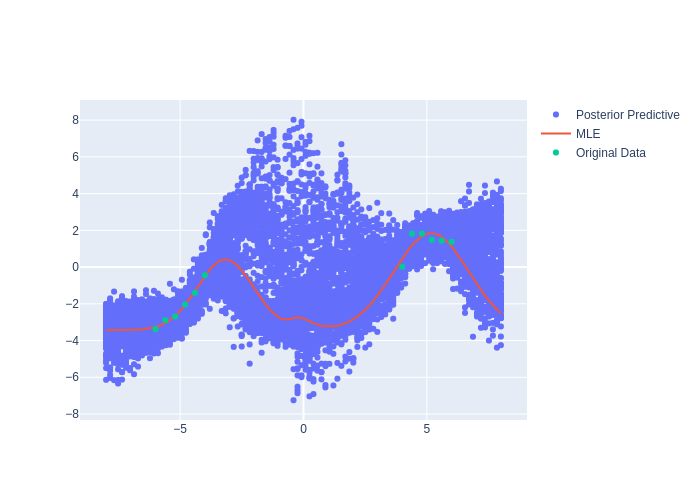

In [31]:
from IPython.display import Image
import plotly.express as px
import plotly.io as pio


sample_indices = numpy.random.choice(
    np.arange(thinned_posterior_samples.shape[0]),
    size=100,
    replace=False)

print(sample_indices)
xs, ys = [], []
x_test = np.linspace(-8, 8, 100)
for sample_idx in sample_indices:
    y_test = nn.forward(
        thinned_posterior_samples[sample_idx,].reshape((1, -1)),
        x_test.reshape((1, -1))).squeeze()
    y_test += numpy.random.normal(loc=0, scale=0.5, size=y_test.shape)
    xs.append(x_test)
    ys.append(y_test)
xs = numpy.concatenate(xs)
ys = numpy.concatenate(ys)

y_test = nn.forward(nn.weights, x_test.reshape((1, -1))).squeeze()
    
# #visualize our learned model
plot_data = [
    go.Scatter(x=xs, y=ys, mode='markers', name='Posterior Predictive'),
    go.Scatter(x=x_test, y=y_test, name='MLE'),
    go.Scatter(x=data['x'].values, y=data['y'].values, mode='markers', name='Original Data')]
fig = go.Figure(data=plot_data)
# fig.show()
Image(pio.to_image(fig, format='png'))

5. (**Computing the Fit**) Compute the posterior predictive log likelihood of the observed data under your model. 

  Not required for you to worry about for this problem, but note that this is a Monte Carlo estimation of an integral, so you'll need to worry about variance and all that.<br><br>

In [18]:
from scipy.stats import norm


data = pd.read_csv('HW7_data.csv')
data.head()
x = data['x'].values
x = x.reshape((1, -1))
y = data['y'].values
y = y.reshape((1, -1))

likelihoods = np.zeros(thinned_posterior_samples.shape[0])
for i, sample_weight in enumerate(thinned_posterior_samples):
    y_mean = nn.forward(
        thinned_posterior_samples[sample_idx,].reshape((1, -1)),
        x.reshape((1, -1))).squeeze()
    log_like = norm.logpdf(y, loc=y_mean, scale=0.5)
    likelihoods[i] = log_like.sum()
    
print('Posterior Predictive Log Likelihood: ', numpy.mean(likelihoods))

Posterior Predictive Log Likelihood:  -8.722134979001105


6. (**Model Evaluation**) Discuss the fit of your model to the data. Discuss also what the posterior predictive tell you about the aleatoric and epistemic uncertainty of the model. Are these uncertainties what you'd want (think about want kind of uncertainties you want and where)?

It's difficult to comment on the "fit" of a model to the data absent competing models. A posterior predictive log likelihood of -8.7 might be good, or it might be bad, depending on how other models fit the data.

The posterior predictive contains information about aleatoric and epistemic uncertainty. Near points where we have data (x near -5 or x near 5), we have reduced our epistemic uncertainty so that aleatoric uncertainty remains. This is shown by the relatively narrow variance. However, near points where we do not have data (x near 0), we have very high variance. This corresponds to high epistem uncertainty that we could reduce by collecting new data points in this range. This agrees with our intuition that the model should have low uncertainty near data but high uncertainty away from data.